In [2]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
from scipy import signal
import matplotlib.pyplot as plt


In [3]:
X_train = np.array([[ 1., -1.,  2.],
                     [ 2.,  0.,  0.],
                     [ 0.,  1., -1.]])
scaler = preprocessing.StandardScaler().fit(X_train)
print(scaler)
print(scaler.mean_)

StandardScaler()
[1.         0.         0.33333333]


In [4]:
df=pd.read_csv('Synced_Data_For_All.csv')
print(df.head())

  Participant      Time  Polar_HR  HRMDUAL_HR  Vivo_HR  Polar_RR  HRMDUAL_RR  \
0          P1  14:37:10       133         129      132       442         466   
1          P1  14:37:11       133         128      132       455         917   
2          P1  14:37:12       131         128      132       463         447   
3          P1  14:37:13       131         142      133       448         443   
4          P1  14:37:14       132         126      133       446         881   

   Vivo_RR  
0      464  
1      467  
2      467  
3      422  
4      476  


In [5]:
print(df[['Polar_HR','Vivo_HR']])

       Polar_HR  Vivo_HR
0           133      132
1           133      132
2           131      132
3           131      133
4           132      133
...         ...      ...
13049        89       95
13050        87       95
13051        86       91
13052        84       85
13053        84       81

[13054 rows x 2 columns]


In [6]:
arr=df[['Polar_HR','Vivo_HR']].to_numpy()
arr1=df['Polar_HR'].to_numpy()
arr3=df['Time'].to_numpy()
print(arr)
print(arr1)
print(arr3)

[[133 132]
 [133 132]
 [131 132]
 ...
 [ 86  91]
 [ 84  85]
 [ 84  81]]
[133 133 131 ...  86  84  84]
['14:37:10' '14:37:11' '14:37:12' ... '22:06:15' '22:06:16' '22:06:17']


In [7]:
scaler = preprocessing.StandardScaler().fit(arr)
print(scaler)
print(scaler.mean_)

StandardScaler()
[94.54274552 93.82480466]


In [8]:
arr_normalized = preprocessing.normalize(arr, norm='max')
print(arr_normalized)

[[1.         0.9924812 ]
 [1.         0.9924812 ]
 [0.99242424 1.        ]
 ...
 [0.94505495 1.        ]
 [0.98823529 1.        ]
 [1.         0.96428571]]


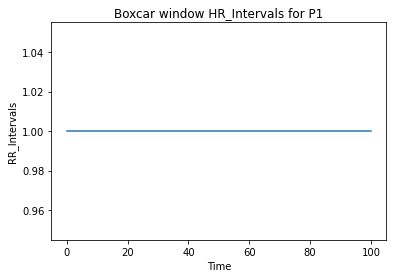

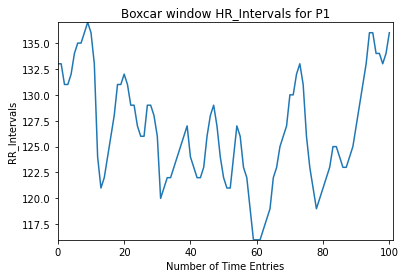

In [9]:
arr2=[]
arr4=[]
for i in range(0,101):
    arr2.append(int(arr1[i]))
    arr4.append(i)
    
'''print(arr2);
print(arr4);
print(len(arr2));
print(max(arr2));
print(min(arr2));'''
window = signal.boxcar(101)
plt.plot(window)
plt.title("Boxcar window HR_Intervals for P1");
plt.ylabel("RR_Intervals")
plt.xlabel("Time")
plt.figure()
plt.axis([0,len(arr4), min(arr2), max(arr2)])
plt.title("Boxcar window HR_Intervals for P1");
plt.ylabel("RR_Intervals")
plt.xlabel("Number of Time Entries")
plt.plot(arr4,arr2)

# Time Domain Features

### 1.RR Std (Standard Deviation of RR_Intervals)

In [10]:
import statistics

In [11]:
arPRR=df['Polar_RR'].to_numpy()
arHRMRR=df['HRMDUAL_RR'].to_numpy()
arViRR=df['Vivo_RR'].to_numpy()
print("Standard Deviation of the Polar_RR intervals is % s "% (statistics.stdev(arPRR)))
print("Standard Deviation of the HRMDual_RR intervals is % s "% (statistics.stdev(arHRMRR)))
print("Standard Deviation of the Vivo_RR intervals is % s "% (statistics.stdev(arViRR)))



Standard Deviation of the Polar_RR intervals is 155.58598908642128 
Standard Deviation of the HRMDual_RR intervals is 568.8620219350207 
Standard Deviation of the Vivo_RR intervals is 153.2351134694656 


### 2. RR Mean (Mean of All RR_Intervals)

In [12]:
armPRR=df['Polar_RR'].to_numpy()
armHRMRR=df['HRMDUAL_RR'].to_numpy()
armViRR=df['Vivo_RR'].to_numpy()
print("Mean of the Polar_RR intervals is % s "% (statistics.mean(armPRR)))
print("Mean of the HRMDual_RR intervals is % s "% (statistics.mean(armHRMRR)))
print("Mean of the Vivo_RR intervals is % s "% (statistics.mean(armViRR)))


Mean of the Polar_RR intervals is 669 
Mean of the HRMDual_RR intervals is 758 
Mean of the Vivo_RR intervals is 675 


### 3. HR Mean (Mean of all HeartBeats)

In [13]:
armPHR=df['Polar_HR'].to_numpy()
armHRMHR=df['HRMDUAL_HR'].to_numpy()
armViHR=df['Vivo_HR'].to_numpy()
print("Mean of the Polar_HR  is % s "% (statistics.mean(armPHR)))
print("Mean of the HRMDual_HR  is % s "% (statistics.mean(armHRMHR)))
print("Mean of the Vivo_HR  is % s "% (statistics.mean(armViHR)))

Mean of the Polar_HR  is 94 
Mean of the HRMDual_HR  is 94 
Mean of the Vivo_HR  is 93 


### 4. HR Std (Standard Deviation of HeartBeats)

In [14]:
arPHR=df['Polar_HR'].to_numpy()
arHRMHR=df['HRMDUAL_HR'].to_numpy()
arViHR=df['Vivo_HR'].to_numpy()
print("Standard Deviation of the Polar_HR intervals is % s "% (statistics.stdev(arPHR)))
print("Standard Deviation of the HRMDual_HR intervals is % s "% (statistics.stdev(arHRMHR)))
print("Standard Deviation of the Vivo_HR intervals is % s "% (statistics.stdev(arViHR)))

Standard Deviation of the Polar_HR intervals is 20.85665361461421 
Standard Deviation of the HRMDual_HR intervals is 20.396078054371138 
Standard Deviation of the Vivo_HR intervals is 21.72556098240043 


## Function to compute Std.Dev and Mean of RR and HR with 20% Overlapping and Window Size=5

In [15]:
window = signal.boxcar(5)
temp=[]
a="Polar_RR"
b="Vivo_RR"
c="HRM_Dual_RR"
d="Polar_HR"
e="Vivo_HR"
f="HRM_Dual_HR"



def stddevv(arraya,stringa,lista):
    temp=[]
    ##print(len(arraya)-len(window)+1)
    for i in range (0,len(arraya)-len(window)+1,3):
        for j in range (i,i+len(window)):
            temp.append(arraya[j])
        print(temp)   
        print("Standard Deviation of the ",stringa, "from",i,"to",i+len(window)," is % s "% (statistics.stdev(temp)))
        lista.append(statistics.stdev(temp))
        temp=[]
    print(i)
    if(i+3>=len(arraya)-len(window)+1):
        for k in range(i+3,len(arraya)):
            temp.append(arraya[k])
        print(temp)   
        print("Standard Deviation of the ",stringa, "from",i+3,"to",len(arraya)," is % s "% (statistics.stdev(temp)))
        lista.append(statistics.stdev(temp))
        temp=[]
        
def meann(arraya,stringa,lista):
    temp=[]
    for i in range (0,len(arraya)-len(window)+1,3):
        for j in range (i,i+len(window)):
            temp.append(arraya[j])
        print(temp)   
        print("Mean of the ",stringa, "from",i,"to",i+len(window)," is % s "% (statistics.mean(temp)))
        lista.append(statistics.mean(temp))
        temp=[]
    if(i+3>=len(arraya)-len(window)+1):
        for k in range(i+3,len(arraya)):
            temp.append(arraya[k])
        print(temp)   
        print("Mean of the ",stringa, "from",i+3,"to",len(arraya)," is % s "% (statistics.mean(temp)))
        lista.append(statistics.mean(temp))
        temp=[]
    


### 1.Std.Dev For Polar_RR

In [16]:
stdPrr=[]
print(len(armPRR))
stddevv(armPRR,a,stdPrr)
print(stdPrr)

13054
[442, 455, 463, 448, 446]
Standard Deviation of the  Polar_RR from 0 to 5  is 8.246211251235321 
[448, 446, 446, 438, 437]
Standard Deviation of the  Polar_RR from 3 to 8  is 5.0990195135927845 
[438, 437, 437, 438, 450]
Standard Deviation of the  Polar_RR from 6 to 11  is 5.5677643628300215 
[438, 450, 502, 528, 502]
Standard Deviation of the  Polar_RR from 9 to 14  is 38.262252939417984 
[528, 502, 484, 469, 458]
Standard Deviation of the  Polar_RR from 12 to 17  is 27.712812921102035 
[469, 458, 453, 449, 449]
Standard Deviation of the  Polar_RR from 15 to 20  is 8.306623862918075 
[449, 449, 450, 476, 473]
Standard Deviation of the  Polar_RR from 18 to 23  is 13.820274961085254 
[476, 473, 471, 488, 482]
Standard Deviation of the  Polar_RR from 21 to 26  is 6.928203230275509 
[488, 482, 483, 456, 467]
Standard Deviation of the  Polar_RR from 24 to 29  is 13.2664991614216 
[456, 467, 487, 541, 525]
Standard Deviation of the  Polar_RR from 27 to 32  is 36.68787265568828 
[541, 

Standard Deviation of the  Polar_RR from 321 to 326  is 20.639767440550294 
[484, 471, 470, 457, 454]
Standard Deviation of the  Polar_RR from 324 to 329  is 12.041594578792296 
[457, 454, 444, 449, 455]
Standard Deviation of the  Polar_RR from 327 to 332  is 5.196152422706632 
[449, 455, 498, 493, 466]
Standard Deviation of the  Polar_RR from 330 to 335  is 22.181073012818835 
[493, 466, 455, 453, 453]
Standard Deviation of the  Polar_RR from 333 to 338  is 17.08800749063506 
[453, 453, 440, 439, 428]
Standard Deviation of the  Polar_RR from 336 to 341  is 10.583005244258363 
[439, 428, 426, 424, 428]
Standard Deviation of the  Polar_RR from 339 to 344  is 5.830951894845301 
[424, 428, 445, 446, 439]
Standard Deviation of the  Polar_RR from 342 to 347  is 9.9498743710662 
[446, 439, 430, 428, 418]
Standard Deviation of the  Polar_RR from 345 to 350  is 10.723805294763608 
[428, 418, 418, 417, 421]
Standard Deviation of the  Polar_RR from 348 to 353  is 4.47213595499958 
[417, 421, 424

Standard Deviation of the  Polar_RR from 882 to 887  is 8.366600265340756 
[491, 507, 554, 525, 513]
Standard Deviation of the  Polar_RR from 885 to 890  is 23.558437978779494 
[525, 513, 504, 496, 507]
Standard Deviation of the  Polar_RR from 888 to 893  is 10.816653826391969 
[496, 507, 501, 491, 500]
Standard Deviation of the  Polar_RR from 891 to 896  is 5.916079783099616 
[491, 500, 597, 541, 533]
Standard Deviation of the  Polar_RR from 894 to 899  is 41.8568990729127 
[541, 533, 532, 506, 487]
Standard Deviation of the  Polar_RR from 897 to 902  is 22.561028345356956 
[506, 487, 483, 468, 459]
Standard Deviation of the  Polar_RR from 900 to 905  is 18.138357147217054 
[468, 459, 457, 450, 460]
Standard Deviation of the  Polar_RR from 903 to 908  is 6.4031242374328485 
[450, 460, 501, 482, 480]
Standard Deviation of the  Polar_RR from 906 to 911  is 19.974984355438178 
[482, 480, 495, 473, 464]
Standard Deviation of the  Polar_RR from 909 to 914  is 11.445523142259598 
[473, 464,

Standard Deviation of the  Polar_RR from 1257 to 1262  is 8.246211251235321 
[528, 538, 559, 615, 607]
Standard Deviation of the  Polar_RR from 1260 to 1265  is 39.68626966596886 
[615, 607, 578, 564, 562]
Standard Deviation of the  Polar_RR from 1263 to 1268  is 24.49489742783178 
[564, 562, 564, 562, 572]
Standard Deviation of the  Polar_RR from 1266 to 1271  is 4.123105625617661 
[562, 572, 565, 564, 564]
Standard Deviation of the  Polar_RR from 1269 to 1274  is 3.7416573867739413 
[564, 564, 571, 578, 581]
Standard Deviation of the  Polar_RR from 1272 to 1277  is 7.810249675906654 
[578, 581, 583, 576, 570]
Standard Deviation of the  Polar_RR from 1275 to 1280  is 5.0 
[576, 570, 522, 519, 526]
Standard Deviation of the  Polar_RR from 1278 to 1283  is 27.92848008753788 
[519, 526, 552, 563, 541]
Standard Deviation of the  Polar_RR from 1281 to 1286  is 18.083141320025124 
[563, 541, 541, 538, 529]
Standard Deviation of the  Polar_RR from 1284 to 1289  is 12.489995996796797 
[538, 5

[583, 576, 559, 555, 553]
Standard Deviation of the  Polar_RR from 1866 to 1871  is 13.45362404707371 
[555, 553, 553, 585, 576]
Standard Deviation of the  Polar_RR from 1869 to 1874  is 15.033296378372908 
[585, 576, 571, 555, 531]
Standard Deviation of the  Polar_RR from 1872 to 1877  is 21.213203435596427 
[555, 531, 535, 544, 568]
Standard Deviation of the  Polar_RR from 1875 to 1880  is 15.0996688705415 
[544, 568, 551, 556, 555]
Standard Deviation of the  Polar_RR from 1878 to 1883  is 8.717797887081348 
[556, 555, 569, 559, 546]
Standard Deviation of the  Polar_RR from 1881 to 1886  is 8.246211251235321 
[559, 546, 556, 585, 627]
Standard Deviation of the  Polar_RR from 1884 to 1889  is 32.63433774416144 
[585, 627, 649, 671, 604]
Standard Deviation of the  Polar_RR from 1887 to 1892  is 34.322004603461025 
[671, 604, 583, 572, 587]
Standard Deviation of the  Polar_RR from 1890 to 1895  is 39.496835316262995 
[572, 587, 654, 624, 634]
Standard Deviation of the  Polar_RR from 189

Standard Deviation of the  Polar_RR from 2187 to 2192  is 1.7320508075688772 
[422, 425, 427, 431, 429]
Standard Deviation of the  Polar_RR from 2190 to 2195  is 3.4641016151377544 
[431, 429, 426, 425, 428]
Standard Deviation of the  Polar_RR from 2193 to 2198  is 2.23606797749979 
[425, 428, 432, 434, 436]
Standard Deviation of the  Polar_RR from 2196 to 2201  is 4.47213595499958 
[434, 436, 449, 467, 454]
Standard Deviation of the  Polar_RR from 2199 to 2204  is 13.564659966250536 
[467, 454, 450, 443, 451]
Standard Deviation of the  Polar_RR from 2202 to 2207  is 8.774964387392123 
[443, 451, 454, 475, 480]
Standard Deviation of the  Polar_RR from 2205 to 2210  is 16.0312195418814 
[475, 480, 476, 467, 464]
Standard Deviation of the  Polar_RR from 2208 to 2213  is 6.6332495807108 
[467, 464, 463, 480, 475]
Standard Deviation of the  Polar_RR from 2211 to 2216  is 7.3484692283495345 
[480, 475, 499, 495, 510]
Standard Deviation of the  Polar_RR from 2214 to 2219  is 14.2478068487750

Standard Deviation of the  Polar_RR from 2943 to 2948  is 40.311288741492746 
[896, 886, 865, 858, 804]
Standard Deviation of the  Polar_RR from 2946 to 2951  is 35.77708763999664 
[858, 804, 697, 698, 796]
Standard Deviation of the  Polar_RR from 2949 to 2954  is 70.8590149522275 
[698, 796, 1015, 889, 785]
Standard Deviation of the  Polar_RR from 2952 to 2957  is 120.51141024815865 
[889, 785, 761, 795, 887]
Standard Deviation of the  Polar_RR from 2955 to 2960  is 60.249481325568276 
[795, 887, 859, 783, 825]
Standard Deviation of the  Polar_RR from 2958 to 2963  is 43.439613257946945 
[783, 825, 816, 872, 898]
Standard Deviation of the  Polar_RR from 2961 to 2966  is 45.902069670114 
[872, 898, 885, 873, 837]
Standard Deviation of the  Polar_RR from 2964 to 2969  is 22.715633383201094 
[873, 837, 809, 801, 870]
Standard Deviation of the  Polar_RR from 2967 to 2972  is 33.391615714128 
[801, 870, 861, 862, 762]
Standard Deviation of the  Polar_RR from 2970 to 2975  is 47.53945729601

Standard Deviation of the  Polar_RR from 3318 to 3323  is 65.58963332722634 
[770, 900, 1031, 1031, 1036]
Standard Deviation of the  Polar_RR from 3321 to 3326  is 117.63502879669814 
[1031, 1036, 974, 1022, 1015]
Standard Deviation of the  Polar_RR from 3324 to 3329  is 24.61706725018234 
[1022, 1015, 914, 945, 981]
Standard Deviation of the  Polar_RR from 3327 to 3332  is 46.0 
[945, 981, 992, 1023, 1031]
Standard Deviation of the  Polar_RR from 3330 to 3335  is 34.56877203488721 
[1023, 1031, 1014, 1071, 1087]
Standard Deviation of the  Polar_RR from 3333 to 3338  is 31.937438845342623 
[1071, 1087, 983, 991, 1025]
Standard Deviation of the  Polar_RR from 3336 to 3341  is 46.561786907291264 
[991, 1025, 972, 976, 991]
Standard Deviation of the  Polar_RR from 3339 to 3344  is 20.85665361461421 
[976, 991, 1006, 1010, 1013]
Standard Deviation of the  Polar_RR from 3342 to 3347  is 15.459624833740307 
[1010, 1013, 1015, 1019, 1008]
Standard Deviation of the  Polar_RR from 3345 to 3350 

[1011, 995, 915, 1011, 1073]
Standard Deviation of the  Polar_RR from 3906 to 3911  is 56.60388679233962 
[1011, 1073, 967, 1034, 1049]
Standard Deviation of the  Polar_RR from 3909 to 3914  is 40.32369030731191 
[1034, 1049, 1065, 1012, 1044]
Standard Deviation of the  Polar_RR from 3912 to 3917  is 19.595917942265423 
[1012, 1044, 1060, 1001, 958]
Standard Deviation of the  Polar_RR from 3915 to 3920  is 39.74921382870358 
[1001, 958, 1029, 1083, 1003]
Standard Deviation of the  Polar_RR from 3918 to 3923  is 45.8475735453906 
[1083, 1003, 1030, 1070, 1022]
Standard Deviation of the  Polar_RR from 3921 to 3926  is 33.645207682521445 
[1070, 1022, 893, 857, 821]
Standard Deviation of the  Polar_RR from 3924 to 3929  is 107.94443014810908 
[857, 821, 938, 1136, 1127]
Standard Deviation of the  Polar_RR from 3927 to 3932  is 148.34756486036432 
[1136, 1127, 1046, 1037, 986]
Standard Deviation of the  Polar_RR from 3930 to 3935  is 63.75735251718032 
[1037, 986, 922, 888, 872]
Standard D

Standard Deviation of the  Polar_RR from 4203 to 4208  is 50.84289527554464 
[859, 875, 880, 906, 865]
Standard Deviation of the  Polar_RR from 4206 to 4211  is 18.16590212458495 
[906, 865, 862, 900, 893]
Standard Deviation of the  Polar_RR from 4209 to 4214  is 20.346989949375804 
[900, 893, 845, 850, 824]
Standard Deviation of the  Polar_RR from 4212 to 4217  is 32.71085446759225 
[850, 824, 860, 862, 813]
Standard Deviation of the  Polar_RR from 4215 to 4220  is 22.090722034374522 
[862, 813, 789, 784, 769]
Standard Deviation of the  Polar_RR from 4218 to 4223  is 36.373066958946424 
[784, 769, 744, 728, 735]
Standard Deviation of the  Polar_RR from 4221 to 4226  is 23.664319132398465 
[728, 735, 771, 764, 725]
Standard Deviation of the  Polar_RR from 4224 to 4229  is 21.354156504062622 
[764, 725, 697, 696, 722]
Standard Deviation of the  Polar_RR from 4227 to 4232  is 27.676705006196094 
[696, 722, 758, 760, 781]
Standard Deviation of the  Polar_RR from 4230 to 4235  is 33.926390

[392, 397, 396, 393, 394]
Standard Deviation of the  Polar_RR from 4908 to 4913  is 2.0 
[393, 394, 390, 393, 395]
Standard Deviation of the  Polar_RR from 4911 to 4916  is 1.7320508075688772 
[393, 395, 399, 405, 416]
Standard Deviation of the  Polar_RR from 4914 to 4919  is 9.219544457292887 
[405, 416, 420, 415, 410]
Standard Deviation of the  Polar_RR from 4917 to 4922  is 5.744562646538029 
[415, 410, 412, 405, 409]
Standard Deviation of the  Polar_RR from 4920 to 4925  is 3.605551275463989 
[405, 409, 416, 419, 417]
Standard Deviation of the  Polar_RR from 4923 to 4928  is 5.916079783099616 
[419, 417, 434, 434, 439]
Standard Deviation of the  Polar_RR from 4926 to 4931  is 9.899494936611665 
[434, 439, 439, 451, 454]
Standard Deviation of the  Polar_RR from 4929 to 4934  is 8.602325267042627 
[451, 454, 465, 482, 485]
Standard Deviation of the  Polar_RR from 4932 to 4937  is 15.620499351813308 
[482, 485, 472, 457, 469]
Standard Deviation of the  Polar_RR from 4935 to 4940  is 1

Standard Deviation of the  Polar_RR from 5193 to 5198  is 41.27953488110059 
[859, 871, 835, 813, 657]
Standard Deviation of the  Polar_RR from 5196 to 5201  is 86.77557259966655 
[813, 657, 634, 643, 645]
Standard Deviation of the  Polar_RR from 5199 to 5204  is 75.68355171369801 
[643, 645, 645, 636, 645]
Standard Deviation of the  Polar_RR from 5202 to 5207  is 3.872983346207417 
[636, 645, 652, 674, 718]
Standard Deviation of the  Polar_RR from 5205 to 5210  is 32.78719262151 
[674, 718, 717, 707, 730]
Standard Deviation of the  Polar_RR from 5208 to 5213  is 21.283796653792763 
[707, 730, 746, 742, 750]
Standard Deviation of the  Polar_RR from 5211 to 5216  is 17.349351572897472 
[742, 750, 738, 763, 751]
Standard Deviation of the  Polar_RR from 5214 to 5219  is 9.591663046625438 
[763, 751, 736, 773, 714]
Standard Deviation of the  Polar_RR from 5217 to 5222  is 23.2163735324878 
[773, 714, 662, 660, 650]
Standard Deviation of the  Polar_RR from 5220 to 5225  is 51.79768334587948

Standard Deviation of the  Polar_RR from 5940 to 5945  is 38.98717737923585 
[637, 610, 613, 678, 713]
Standard Deviation of the  Polar_RR from 5943 to 5948  is 44.40720662234904 
[678, 713, 726, 750, 776]
Standard Deviation of the  Polar_RR from 5946 to 5951  is 37.12142238654117 
[750, 776, 772, 702, 702]
Standard Deviation of the  Polar_RR from 5949 to 5954  is 36.41428291206625 
[702, 702, 698, 719, 728]
Standard Deviation of the  Polar_RR from 5952 to 5957  is 13.0 
[719, 728, 708, 708, 706]
Standard Deviation of the  Polar_RR from 5955 to 5960  is 9.433981132056603 
[708, 706, 728, 696, 734]
Standard Deviation of the  Polar_RR from 5958 to 5963  is 15.937377450509228 
[696, 734, 760, 733, 744]
Standard Deviation of the  Polar_RR from 5961 to 5966  is 23.53720459187964 
[733, 744, 733, 702, 726]
Standard Deviation of the  Polar_RR from 5964 to 5969  is 15.684387141358123 
[702, 726, 701, 707, 714]
Standard Deviation of the  Polar_RR from 5967 to 5972  is 10.295630140987 
[707, 714

Standard Deviation of the  Polar_RR from 6318 to 6323  is 25.337718918639855 
[654, 677, 658, 655, 668]
Standard Deviation of the  Polar_RR from 6321 to 6326  is 9.848857801796104 
[655, 668, 692, 677, 631]
Standard Deviation of the  Polar_RR from 6324 to 6329  is 23.108440016582687 
[677, 631, 624, 619, 624]
Standard Deviation of the  Polar_RR from 6327 to 6332  is 23.853720883753127 
[619, 624, 632, 645, 640]
Standard Deviation of the  Polar_RR from 6330 to 6335  is 10.770329614269007 
[645, 640, 634, 602, 590]
Standard Deviation of the  Polar_RR from 6333 to 6338  is 24.596747752497688 
[602, 590, 605, 606, 606]
Standard Deviation of the  Polar_RR from 6336 to 6341  is 6.782329983125268 
[606, 606, 610, 616, 625]
Standard Deviation of the  Polar_RR from 6339 to 6344  is 8.0 
[616, 625, 653, 650, 641]
Standard Deviation of the  Polar_RR from 6342 to 6347  is 16.0 
[650, 641, 650, 633, 635]
Standard Deviation of the  Polar_RR from 6345 to 6350  is 8.0 
[633, 635, 622, 619, 626]
Standa

[595, 594, 602, 675, 685]
Standard Deviation of the  Polar_RR from 6921 to 6926  is 45.69463863518345 
[675, 685, 718, 722, 702]
Standard Deviation of the  Polar_RR from 6924 to 6929  is 20.37154878746336 
[722, 702, 708, 717, 708]
Standard Deviation of the  Polar_RR from 6927 to 6932  is 7.937253933193772 
[717, 708, 743, 732, 732]
Standard Deviation of the  Polar_RR from 6930 to 6935  is 13.820274961085254 
[732, 732, 717, 722, 708]
Standard Deviation of the  Polar_RR from 6933 to 6938  is 10.246950765959598 
[722, 708, 703, 685, 682]
Standard Deviation of the  Polar_RR from 6936 to 6941  is 16.61324772583615 
[685, 682, 668, 683, 708]
Standard Deviation of the  Polar_RR from 6939 to 6944  is 14.38749456993816 
[683, 708, 723, 684, 677]
Standard Deviation of the  Polar_RR from 6942 to 6947  is 19.621416870348583 
[684, 677, 681, 673, 696]
Standard Deviation of the  Polar_RR from 6945 to 6950  is 8.717797887081348 
[673, 696, 709, 701, 694]
Standard Deviation of the  Polar_RR from 694

Standard Deviation of the  Polar_RR from 7197 to 7202  is 20.663978319771825 
[737, 728, 743, 750, 772]
Standard Deviation of the  Polar_RR from 7200 to 7205  is 16.61324772583615 
[750, 772, 792, 809, 810]
Standard Deviation of the  Polar_RR from 7203 to 7208  is 25.632011235952593 
[809, 810, 789, 765, 763]
Standard Deviation of the  Polar_RR from 7206 to 7211  is 22.781571499789035 
[765, 763, 754, 744, 736]
Standard Deviation of the  Polar_RR from 7209 to 7214  is 12.36931687685298 
[744, 736, 771, 756, 723]
Standard Deviation of the  Polar_RR from 7212 to 7217  is 18.411952639521967 
[756, 723, 718, 742, 708]
Standard Deviation of the  Polar_RR from 7215 to 7220  is 19.313207915827967 
[742, 708, 721, 753, 727]
Standard Deviation of the  Polar_RR from 7218 to 7223  is 17.635192088548397 
[753, 727, 706, 733, 718]
Standard Deviation of the  Polar_RR from 7221 to 7226  is 17.549928774784245 
[733, 718, 711, 738, 750]
Standard Deviation of the  Polar_RR from 7224 to 7229  is 15.62049

[685, 707, 676, 664, 633]
Standard Deviation of the  Polar_RR from 7923 to 7928  is 27.331300737432898 
[664, 633, 651, 639, 642]
Standard Deviation of the  Polar_RR from 7926 to 7931  is 12.041594578792296 
[639, 642, 736, 703, 750]
Standard Deviation of the  Polar_RR from 7929 to 7934  is 51.73973328110612 
[703, 750, 721, 680, 736]
Standard Deviation of the  Polar_RR from 7932 to 7937  is 27.49545416973504 
[680, 736, 709, 703, 722]
Standard Deviation of the  Polar_RR from 7935 to 7940  is 21.02379604162864 
[703, 722, 674, 688, 685]
Standard Deviation of the  Polar_RR from 7938 to 7943  is 18.57417562100671 
[688, 685, 694, 746, 708]
Standard Deviation of the  Polar_RR from 7941 to 7946  is 24.979991993593593 
[746, 708, 743, 791, 714]
Standard Deviation of the  Polar_RR from 7944 to 7949  is 32.95451410656816 
[791, 714, 725, 736, 762]
Standard Deviation of the  Polar_RR from 7947 to 7952  is 31.0 
[736, 762, 751, 760, 643]
Standard Deviation of the  Polar_RR from 7950 to 7955  is

Standard Deviation of the  Polar_RR from 8190 to 8195  is 31.96873472629156 
[641, 640, 670, 687, 695]
Standard Deviation of the  Polar_RR from 8193 to 8198  is 25.475478405713993 
[687, 695, 705, 715, 705]
Standard Deviation of the  Polar_RR from 8196 to 8201  is 10.677078252031311 
[715, 705, 689, 720, 704]
Standard Deviation of the  Polar_RR from 8199 to 8204  is 11.916375287812984 
[720, 704, 685, 739, 725]
Standard Deviation of the  Polar_RR from 8202 to 8207  is 20.73644135332772 
[739, 725, 723, 729, 686]
Standard Deviation of the  Polar_RR from 8205 to 8210  is 20.174241001832016 
[729, 686, 704, 708, 658]
Standard Deviation of the  Polar_RR from 8208 to 8213  is 26.627053911388696 
[708, 658, 660, 691, 672]
Standard Deviation of the  Polar_RR from 8211 to 8216  is 21.37755832643195 
[691, 672, 679, 695, 675]
Standard Deviation of the  Polar_RR from 8214 to 8219  is 10.04987562112089 
[695, 675, 688, 666, 664]
Standard Deviation of the  Polar_RR from 8217 to 8222  is 13.5646599

Standard Deviation of the  Polar_RR from 8922 to 8927  is 29.257477676655586 
[659, 588, 579, 569, 602]
Standard Deviation of the  Polar_RR from 8925 to 8930  is 35.45419580247167 
[569, 602, 583, 563, 567]
Standard Deviation of the  Polar_RR from 8928 to 8933  is 15.968719422671311 
[563, 567, 614, 613, 613]
Standard Deviation of the  Polar_RR from 8931 to 8936  is 26.514147167125703 
[613, 613, 590, 571, 590]
Standard Deviation of the  Polar_RR from 8934 to 8939  is 17.832554500127006 
[571, 590, 635, 630, 596]
Standard Deviation of the  Polar_RR from 8937 to 8942  is 27.313000567495326 
[630, 596, 601, 605, 626]
Standard Deviation of the  Polar_RR from 8940 to 8945  is 15.362291495737216 
[605, 626, 625, 565, 551]
Standard Deviation of the  Polar_RR from 8943 to 8948  is 34.61213659975356 
[565, 551, 555, 596, 552]
Standard Deviation of the  Polar_RR from 8946 to 8951  is 18.81488772222678 
[596, 552, 570, 601, 577]
Standard Deviation of the  Polar_RR from 8949 to 8954  is 19.899748

Standard Deviation of the  Polar_RR from 9174 to 9179  is 42.35563716909474 
[607, 649, 642, 654, 667]
Standard Deviation of the  Polar_RR from 9177 to 9182  is 22.494443758403985 
[654, 667, 680, 675, 677]
Standard Deviation of the  Polar_RR from 9180 to 9185  is 10.44030650891055 
[675, 677, 664, 665, 685]
Standard Deviation of the  Polar_RR from 9183 to 9188  is 8.774964387392123 
[665, 685, 682, 698, 681]
Standard Deviation of the  Polar_RR from 9186 to 9191  is 11.74734012447073 
[698, 681, 670, 677, 663]
Standard Deviation of the  Polar_RR from 9189 to 9194  is 13.19090595827292 
[677, 663, 660, 668, 622]
Standard Deviation of the  Polar_RR from 9192 to 9197  is 21.118712081942874 
[668, 622, 684, 668, 630]
Standard Deviation of the  Polar_RR from 9195 to 9200  is 26.870057685088806 
[668, 630, 670, 670, 623]
Standard Deviation of the  Polar_RR from 9198 to 9203  is 23.600847442411894 
[670, 623, 661, 660, 666]
Standard Deviation of the  Polar_RR from 9201 to 9206  is 18.86796226

Standard Deviation of the  Polar_RR from 9948 to 9953  is 12.041594578792296 
[544, 534, 530, 527, 522]
Standard Deviation of the  Polar_RR from 9951 to 9956  is 8.246211251235321 
[527, 522, 522, 506, 505]
Standard Deviation of the  Polar_RR from 9954 to 9959  is 10.14889156509222 
[506, 505, 508, 528, 552]
Standard Deviation of the  Polar_RR from 9957 to 9962  is 20.322401432901575 
[528, 552, 565, 543, 544]
Standard Deviation of the  Polar_RR from 9960 to 9965  is 13.527749258468683 
[543, 544, 541, 522, 522]
Standard Deviation of the  Polar_RR from 9963 to 9968  is 11.357816691600547 
[522, 522, 520, 528, 519]
Standard Deviation of the  Polar_RR from 9966 to 9971  is 3.4641016151377544 
[528, 519, 501, 500, 490]
Standard Deviation of the  Polar_RR from 9969 to 9974  is 15.459624833740307 
[500, 490, 498, 497, 496]
Standard Deviation of the  Polar_RR from 9972 to 9977  is 3.7416573867739413 
[497, 496, 498, 510, 510]
Standard Deviation of the  Polar_RR from 9975 to 9980  is 7.141428

[482, 480, 478, 485, 479]
Standard Deviation of the  Polar_RR from 10218 to 10223  is 2.6457513110645907 
[485, 479, 491, 486, 482]
Standard Deviation of the  Polar_RR from 10221 to 10226  is 4.47213595499958 
[486, 482, 482, 455, 455]
Standard Deviation of the  Polar_RR from 10224 to 10229  is 15.588457268119896 
[455, 455, 446, 442, 440]
Standard Deviation of the  Polar_RR from 10227 to 10232  is 7.0710678118654755 
[442, 440, 437, 437, 421]
Standard Deviation of the  Polar_RR from 10230 to 10235  is 8.306623862918075 
[437, 421, 418, 415, 416]
Standard Deviation of the  Polar_RR from 10233 to 10238  is 9.0 
[415, 416, 416, 419, 424]
Standard Deviation of the  Polar_RR from 10236 to 10241  is 3.605551275463989 
[419, 424, 432, 890, 449]
Standard Deviation of the  Polar_RR from 10239 to 10244  is 205.58453249211138 
[890, 449, 436, 433, 431]
Standard Deviation of the  Polar_RR from 10242 to 10247  is 202.5956564193813 
[433, 431, 440, 440, 453]
Standard Deviation of the  Polar_RR from

[643, 615, 633, 641, 636]
Standard Deviation of the  Polar_RR from 10974 to 10979  is 11.090536506409418 
[641, 636, 657, 615, 610]
Standard Deviation of the  Polar_RR from 10977 to 10982  is 19.313207915827967 
[615, 610, 621, 633, 635]
Standard Deviation of the  Polar_RR from 10980 to 10985  is 10.954451150103322 
[633, 635, 663, 729, 731]
Standard Deviation of the  Polar_RR from 10983 to 10988  is 48.75448697299562 
[729, 731, 678, 605, 587]
Standard Deviation of the  Polar_RR from 10986 to 10991  is 67.63874629234341 
[605, 587, 609, 664, 724]
Standard Deviation of the  Polar_RR from 10989 to 10994  is 56.124860801609124 
[664, 724, 708, 667, 664]
Standard Deviation of the  Polar_RR from 10992 to 10997  is 28.513154858766505 
[667, 664, 676, 721, 743]
Standard Deviation of the  Polar_RR from 10995 to 11000  is 35.63705936241092 
[721, 743, 717, 670, 582]
Standard Deviation of the  Polar_RR from 10998 to 11003  is 64.2339474110069 
[670, 582, 565, 611, 674]
Standard Deviation of the

Standard Deviation of the  Polar_RR from 11277 to 11282  is 65.5133574166368 
[744, 764, 769, 754, 738]
Standard Deviation of the  Polar_RR from 11280 to 11285  is 13.038404810405298 
[754, 738, 750, 767, 725]
Standard Deviation of the  Polar_RR from 11283 to 11288  is 15.968719422671311 
[767, 725, 759, 829, 763]
Standard Deviation of the  Polar_RR from 11286 to 11291  is 37.656340767525464 
[829, 763, 722, 730, 732]
Standard Deviation of the  Polar_RR from 11289 to 11294  is 44.10215414239989 
[730, 732, 731, 737, 738]
Standard Deviation of the  Polar_RR from 11292 to 11297  is 3.605551275463989 
[737, 738, 789, 721, 674]
Standard Deviation of the  Polar_RR from 11295 to 11300  is 41.20679555607303 
[721, 674, 691, 729, 772]
Standard Deviation of the  Polar_RR from 11298 to 11303  is 37.77565353504821 
[729, 772, 850, 845, 836]
Standard Deviation of the  Polar_RR from 11301 to 11306  is 53.47896782848375 
[845, 836, 828, 783, 804]
Standard Deviation of the  Polar_RR from 11304 to 113

[719, 730, 707, 665, 639]
Standard Deviation of the  Polar_RR from 11904 to 11909  is 38.52272056851645 
[665, 639, 752, 791, 791]
Standard Deviation of the  Polar_RR from 11907 to 11912  is 71.4142842854285 
[791, 791, 791, 764, 715]
Standard Deviation of the  Polar_RR from 11910 to 11915  is 33.090784215548595 
[764, 715, 737, 766, 769]
Standard Deviation of the  Polar_RR from 11913 to 11918  is 23.473389188611005 
[766, 769, 719, 694, 698]
Standard Deviation of the  Polar_RR from 11916 to 11921  is 36.235341863986875 
[694, 698, 776, 778, 727]
Standard Deviation of the  Polar_RR from 11919 to 11924  is 40.74309757492672 
[778, 727, 723, 757, 773]
Standard Deviation of the  Polar_RR from 11922 to 11927  is 25.514701644346147 
[757, 773, 767, 819, 858]
Standard Deviation of the  Polar_RR from 11925 to 11930  is 42.59107887809371 
[819, 858, 843, 806, 724]
Standard Deviation of the  Polar_RR from 11928 to 11933  is 52.16320542297991 
[806, 724, 716, 721, 826]
Standard Deviation of the 

Standard Deviation of the  Polar_RR from 12162 to 12167  is 15.7797338380595 
[753, 753, 770, 783, 791]
Standard Deviation of the  Polar_RR from 12165 to 12170  is 17.233687939614086 
[783, 791, 764, 828, 827]
Standard Deviation of the  Polar_RR from 12168 to 12173  is 28.142494558940577 
[828, 827, 852, 846, 778]
Standard Deviation of the  Polar_RR from 12171 to 12176  is 29.086079144497972 
[846, 778, 753, 727, 699]
Standard Deviation of the  Polar_RR from 12174 to 12179  is 56.07138307550475 
[727, 699, 708, 765, 715]
Standard Deviation of the  Polar_RR from 12177 to 12182  is 25.709920264364882 
[765, 715, 784, 830, 846]
Standard Deviation of the  Polar_RR from 12180 to 12185  is 52.44044240850758 
[830, 846, 825, 832, 842]
Standard Deviation of the  Polar_RR from 12183 to 12188  is 8.717797887081348 
[832, 842, 833, 820, 833]
Standard Deviation of the  Polar_RR from 12186 to 12191  is 7.810249675906654 
[820, 833, 790, 821, 805]
Standard Deviation of the  Polar_RR from 12189 to 12

Standard Deviation of the  Polar_RR from 12897 to 12902  is 18.920887928424502 
[719, 749, 732, 717, 739]
Standard Deviation of the  Polar_RR from 12900 to 12905  is 13.490737563232042 
[717, 739, 733, 739, 768]
Standard Deviation of the  Polar_RR from 12903 to 12908  is 18.439088914585774 
[739, 768, 777, 779, 721]
Standard Deviation of the  Polar_RR from 12906 to 12911  is 25.612496949731394 
[779, 721, 723, 750, 708]
Standard Deviation of the  Polar_RR from 12909 to 12914  is 28.372521918222215 
[750, 708, 715, 750, 757]
Standard Deviation of the  Polar_RR from 12912 to 12917  is 22.67156809750927 
[750, 757, 725, 734, 757]
Standard Deviation of the  Polar_RR from 12915 to 12920  is 14.422205101855956 
[734, 757, 704, 712, 684]
Standard Deviation of the  Polar_RR from 12918 to 12923  is 28.124722220850465 
[712, 684, 656, 658, 657]
Standard Deviation of the  Polar_RR from 12921 to 12926  is 24.535688292770594 
[658, 657, 608, 614, 628]
Standard Deviation of the  Polar_RR from 12924 

### 2.Std.Dev For Vivo_RR

In [17]:
stdVrr=[]
stddevv(armViRR,b,stdVrr)
print(len(stdVrr))

[464, 467, 467, 422, 476]
Standard Deviation of the  Vivo_RR from 0 to 5  is 21.2602916254693 
[422, 476, 482, 483, 487]
Standard Deviation of the  Vivo_RR from 3 to 8  is 27.110883423451916 
[483, 487, 482, 436, 453]
Standard Deviation of the  Vivo_RR from 6 to 11  is 22.516660498395403 
[436, 453, 465, 452, 464]
Standard Deviation of the  Vivo_RR from 9 to 14  is 11.704699910719626 
[452, 464, 475, 488, 494]
Standard Deviation of the  Vivo_RR from 12 to 17  is 17.146428199482248 
[488, 494, 467, 473, 473]
Standard Deviation of the  Vivo_RR from 15 to 20  is 11.40175425099138 
[473, 473, 475, 501, 527]
Standard Deviation of the  Vivo_RR from 18 to 23  is 23.93741840717165 
[501, 527, 476, 487, 485]
Standard Deviation of the  Vivo_RR from 21 to 26  is 19.8997487421324 
[487, 485, 485, 485, 481]
Standard Deviation of the  Vivo_RR from 24 to 29  is 2.0 
[485, 481, 470, 435, 466]
Standard Deviation of the  Vivo_RR from 27 to 32  is 19.697715603592208 
[435, 466, 486, 492, 498]
Standard De

[494, 508, 508, 502, 499]
Standard Deviation of the  Vivo_RR from 672 to 677  is 6.0 
[502, 499, 496, 512, 509]
Standard Deviation of the  Vivo_RR from 675 to 680  is 6.708203932499369 
[512, 509, 499, 497, 498]
Standard Deviation of the  Vivo_RR from 678 to 683  is 6.928203230275509 
[497, 498, 461, 486, 491]
Standard Deviation of the  Vivo_RR from 681 to 686  is 15.0996688705415 
[486, 491, 495, 496, 514]
Standard Deviation of the  Vivo_RR from 684 to 689  is 10.583005244258363 
[496, 514, 520, 521, 515]
Standard Deviation of the  Vivo_RR from 687 to 692  is 10.04987562112089 
[521, 515, 505, 507, 486]
Standard Deviation of the  Vivo_RR from 690 to 695  is 13.2664991614216 
[507, 486, 489, 489, 477]
Standard Deviation of the  Vivo_RR from 693 to 698  is 10.862780491200215 
[489, 477, 485, 525, 517]
Standard Deviation of the  Vivo_RR from 696 to 701  is 21.071307505705477 
[525, 517, 517, 522, 512]
Standard Deviation of the  Vivo_RR from 699 to 704  is 5.0 
[522, 512, 517, 517, 538]
S

Standard Deviation of the  Vivo_RR from 945 to 950  is 14.142135623730951 
[537, 535, 532, 519, 506]
Standard Deviation of the  Vivo_RR from 948 to 953  is 13.076696830622021 
[519, 506, 503, 498, 523]
Standard Deviation of the  Vivo_RR from 951 to 956  is 10.677078252031311 
[498, 523, 535, 536, 536]
Standard Deviation of the  Vivo_RR from 954 to 959  is 16.3707055437449 
[536, 536, 520, 528, 510]
Standard Deviation of the  Vivo_RR from 957 to 962  is 11.135528725660043 
[528, 510, 510, 524, 537]
Standard Deviation of the  Vivo_RR from 960 to 965  is 11.74734012447073 
[524, 537, 511, 494, 505]
Standard Deviation of the  Vivo_RR from 963 to 968  is 16.703293088490067 
[494, 505, 540, 548, 542]
Standard Deviation of the  Vivo_RR from 966 to 971  is 24.49489742783178 
[548, 542, 539, 529, 521]
Standard Deviation of the  Vivo_RR from 969 to 974  is 10.723805294763608 
[529, 521, 519, 491, 500]
Standard Deviation of the  Vivo_RR from 972 to 977  is 15.84297951775486 
[491, 500, 509, 510, 

Standard Deviation of the  Vivo_RR from 1695 to 1700  is 4.0 
[586, 582, 566, 563, 564]
Standard Deviation of the  Vivo_RR from 1698 to 1703  is 10.908712114635714 
[563, 564, 562, 567, 565]
Standard Deviation of the  Vivo_RR from 1701 to 1706  is 1.7320508075688772 
[567, 565, 572, 581, 570]
Standard Deviation of the  Vivo_RR from 1704 to 1709  is 6.164414002968976 
[581, 570, 559, 548, 538]
Standard Deviation of the  Vivo_RR from 1707 to 1712  is 17.05872210923198 
[548, 538, 445, 553, 544]
Standard Deviation of the  Vivo_RR from 1710 to 1715  is 45.387222871640866 
[553, 544, 545, 546, 545]
Standard Deviation of the  Vivo_RR from 1713 to 1718  is 3.605551275463989 
[546, 545, 541, 533, 512]
Standard Deviation of the  Vivo_RR from 1716 to 1721  is 14.035668847618199 
[533, 512, 517, 524, 526]
Standard Deviation of the  Vivo_RR from 1719 to 1724  is 8.12403840463596 
[524, 526, 524, 525, 526]
Standard Deviation of the  Vivo_RR from 1722 to 1727  is 1.0 
[525, 526, 528, 561, 526]
Stand

Standard Deviation of the  Vivo_RR from 2058 to 2063  is 4.0 
[444, 447, 427, 444, 445]
Standard Deviation of the  Vivo_RR from 2061 to 2066  is 8.12403840463596 
[444, 445, 441, 456, 462]
Standard Deviation of the  Vivo_RR from 2064 to 2069  is 8.94427190999916 
[456, 462, 465, 449, 469]
Standard Deviation of the  Vivo_RR from 2067 to 2072  is 7.810249675906654 
[449, 469, 497, 523, 525]
Standard Deviation of the  Vivo_RR from 2070 to 2075  is 33.34666400106613 
[523, 525, 496, 498, 493]
Standard Deviation of the  Vivo_RR from 2073 to 2078  is 15.620499351813308 
[498, 493, 486, 489, 511]
Standard Deviation of the  Vivo_RR from 2076 to 2081  is 9.797958971132712 
[489, 511, 504, 493, 486]
Standard Deviation of the  Vivo_RR from 2079 to 2084  is 10.535653752852738 
[493, 486, 491, 560, 496]
Standard Deviation of the  Vivo_RR from 2082 to 2087  is 30.83828789021855 
[560, 496, 487, 481, 480]
Standard Deviation of the  Vivo_RR from 2085 to 2090  is 33.689761055846034 
[481, 480, 458, 447

Standard Deviation of the  Vivo_RR from 2817 to 2822  is 70.97182539571601 
[937, 1035, 866, 952, 968]
Standard Deviation of the  Vivo_RR from 2820 to 2825  is 60.753600716336145 
[952, 968, 1008, 1001, 960]
Standard Deviation of the  Vivo_RR from 2823 to 2828  is 25.13961017995307 
[1001, 960, 1002, 1010, 998]
Standard Deviation of the  Vivo_RR from 2826 to 2831  is 19.621416870348583 
[1010, 998, 975, 956, 961]
Standard Deviation of the  Vivo_RR from 2829 to 2834  is 23.366642891095847 
[956, 961, 972, 987, 995]
Standard Deviation of the  Vivo_RR from 2832 to 2837  is 16.61324772583615 
[987, 995, 996, 1018, 1038]
Standard Deviation of the  Vivo_RR from 2835 to 2840  is 20.8806130178211 
[1018, 1038, 1034, 1045, 859]
Standard Deviation of the  Vivo_RR from 2838 to 2843  is 78.77182237323191 
[1045, 859, 948, 1029, 1041]
Standard Deviation of the  Vivo_RR from 2841 to 2846  is 80.48602363143554 
[1029, 1041, 1025, 1039, 1053]
Standard Deviation of the  Vivo_RR from 2844 to 2849  is 10

Standard Deviation of the  Vivo_RR from 3081 to 3086  is 49.64876634922564 
[906, 938, 863, 841, 827]
Standard Deviation of the  Vivo_RR from 3084 to 3089  is 46.184412955021955 
[841, 827, 827, 853, 669]
Standard Deviation of the  Vivo_RR from 3087 to 3092  is 75.90783885739337 
[853, 669, 805, 847, 771]
Standard Deviation of the  Vivo_RR from 3090 to 3095  is 74.89993324429602 
[847, 771, 677, 740, 843]
Standard Deviation of the  Vivo_RR from 3093 to 3098  is 71.84705978674423 
[740, 843, 886, 899, 912]
Standard Deviation of the  Vivo_RR from 3096 to 3101  is 69.83552104767315 
[899, 912, 874, 1036, 1130]
Standard Deviation of the  Vivo_RR from 3099 to 3104  is 109.0596167240652 
[1036, 1130, 1222, 1268, 1315]
Standard Deviation of the  Vivo_RR from 3102 to 3107  is 111.75866856758807 
[1268, 1315, 1276, 1088, 1016]
Standard Deviation of the  Vivo_RR from 3105 to 3110  is 132.04923324275686 
[1088, 1016, 1071, 1172, 1178]
Standard Deviation of the  Vivo_RR from 3108 to 3113  is 69.25

[814, 819, 840, 900, 892]
Standard Deviation of the  Vivo_RR from 3852 to 3857  is 40.54626986542659 
[900, 892, 834, 763, 735]
Standard Deviation of the  Vivo_RR from 3855 to 3860  is 74.39085965358916 
[763, 735, 827, 838, 826]
Standard Deviation of the  Vivo_RR from 3858 to 3863  is 45.86937976471886 
[838, 826, 835, 947, 872]
Standard Deviation of the  Vivo_RR from 3861 to 3866  is 49.77951385861457 
[947, 872, 837, 826, 816]
Standard Deviation of the  Vivo_RR from 3864 to 3869  is 53.225933528685054 
[826, 816, 794, 786, 792]
Standard Deviation of the  Vivo_RR from 3867 to 3872  is 17.233687939614086 
[786, 792, 764, 719, 781]
Standard Deviation of the  Vivo_RR from 3870 to 3875  is 29.512709126747414 
[719, 781, 913, 840, 767]
Standard Deviation of the  Vivo_RR from 3873 to 3878  is 74.66592261534039 
[840, 767, 766, 818, 834]
Standard Deviation of the  Vivo_RR from 3876 to 3881  is 36.05551275463989 
[818, 834, 825, 863, 903]
Standard Deviation of the  Vivo_RR from 3879 to 3884 

Standard Deviation of the  Vivo_RR from 4131 to 4136  is 15.198684153570664 
[808, 847, 813, 808, 818]
Standard Deviation of the  Vivo_RR from 4134 to 4139  is 16.278820596099706 
[808, 818, 844, 889, 935]
Standard Deviation of the  Vivo_RR from 4137 to 4142  is 52.86775955154521 
[889, 935, 963, 978, 897]
Standard Deviation of the  Vivo_RR from 4140 to 4145  is 39.230090491866065 
[978, 897, 881, 870, 857]
Standard Deviation of the  Vivo_RR from 4143 to 4148  is 47.81213235152768 
[870, 857, 843, 845, 847]
Standard Deviation of the  Vivo_RR from 4146 to 4151  is 11.180339887498949 
[845, 847, 820, 847, 844]
Standard Deviation of the  Vivo_RR from 4149 to 4154  is 11.575836902790225 
[847, 844, 791, 788, 818]
Standard Deviation of the  Vivo_RR from 4152 to 4157  is 28.035691537752374 
[788, 818, 869, 897, 899]
Standard Deviation of the  Vivo_RR from 4155 to 4160  is 49.36598018878993 
[897, 899, 1002, 988, 891]
Standard Deviation of the  Vivo_RR from 4158 to 4163  is 54.70831746635972 

Standard Deviation of the  Vivo_RR from 4917 to 4922  is 22.737634001804146 
[660, 634, 639, 617, 605]
Standard Deviation of the  Vivo_RR from 4920 to 4925  is 21.118712081942874 
[617, 605, 633, 639, 635]
Standard Deviation of the  Vivo_RR from 4923 to 4928  is 14.317821063276353 
[639, 635, 636, 632, 642]
Standard Deviation of the  Vivo_RR from 4926 to 4931  is 3.7416573867739413 
[632, 642, 649, 663, 657]
Standard Deviation of the  Vivo_RR from 4929 to 4934  is 12.206555615733702 
[663, 657, 654, 657, 629]
Standard Deviation of the  Vivo_RR from 4932 to 4937  is 13.2664991614216 
[657, 629, 605, 643, 636]
Standard Deviation of the  Vivo_RR from 4935 to 4940  is 19.235384061671343 
[643, 636, 646, 617, 615]
Standard Deviation of the  Vivo_RR from 4938 to 4943  is 14.52583904633395 
[617, 615, 613, 617, 633]
Standard Deviation of the  Vivo_RR from 4941 to 4946  is 8.0 
[617, 633, 670, 633, 542]
Standard Deviation of the  Vivo_RR from 4944 to 4949  is 47.23346271447817 
[633, 542, 571,

Standard Deviation of the  Vivo_RR from 5247 to 5252  is 5.477225575051661 
[697, 709, 805, 772, 739]
Standard Deviation of the  Vivo_RR from 5250 to 5255  is 44.609416046390926 
[772, 739, 727, 733, 751]
Standard Deviation of the  Vivo_RR from 5253 to 5258  is 17.776388834631177 
[733, 751, 811, 757, 738]
Standard Deviation of the  Vivo_RR from 5256 to 5261  is 31.160872901765767 
[757, 738, 738, 747, 741]
Standard Deviation of the  Vivo_RR from 5259 to 5264  is 8.0 
[747, 741, 737, 721, 695]
Standard Deviation of the  Vivo_RR from 5262 to 5267  is 20.904544960366874 
[721, 695, 691, 646, 734]
Standard Deviation of the  Vivo_RR from 5265 to 5270  is 33.85262175962151 
[646, 734, 718, 705, 719]
Standard Deviation of the  Vivo_RR from 5268 to 5273  is 34.219877264537345 
[705, 719, 753, 664, 700]
Standard Deviation of the  Vivo_RR from 5271 to 5276  is 32.218007387174026 
[664, 700, 705, 734, 706]
Standard Deviation of the  Vivo_RR from 5274 to 5279  is 24.979991993593593 
[734, 706, 72

Standard Deviation of the  Vivo_RR from 6003 to 6008  is 15.7797338380595 
[697, 682, 676, 670, 676]
Standard Deviation of the  Vivo_RR from 6006 to 6011  is 10.295630140987 
[670, 676, 661, 688, 699]
Standard Deviation of the  Vivo_RR from 6009 to 6014  is 14.933184523068078 
[688, 699, 728, 747, 751]
Standard Deviation of the  Vivo_RR from 6012 to 6017  is 28.21347195933177 
[747, 751, 752, 848, 778]
Standard Deviation of the  Vivo_RR from 6015 to 6020  is 42.49705872175156 
[848, 778, 708, 745, 622]
Standard Deviation of the  Vivo_RR from 6018 to 6023  is 83.78544026261365 
[745, 622, 743, 729, 734]
Standard Deviation of the  Vivo_RR from 6021 to 6026  is 52.172789842982326 
[729, 734, 735, 737, 767]
Standard Deviation of the  Vivo_RR from 6024 to 6029  is 15.132745950421556 
[737, 767, 760, 755, 751]
Standard Deviation of the  Vivo_RR from 6027 to 6032  is 11.224972160321824 
[755, 751, 738, 738, 728]
Standard Deviation of the  Vivo_RR from 6030 to 6035  is 10.908712114635714 
[738

Standard Deviation of the  Vivo_RR from 6291 to 6296  is 4.242640687119285 
[628, 631, 633, 639, 645]
Standard Deviation of the  Vivo_RR from 6294 to 6299  is 6.782329983125268 
[639, 645, 652, 695, 731]
Standard Deviation of the  Vivo_RR from 6297 to 6302  is 39.44616584663204 
[695, 731, 730, 719, 708]
Standard Deviation of the  Vivo_RR from 6300 to 6305  is 15.264337522473747 
[719, 708, 746, 699, 682]
Standard Deviation of the  Vivo_RR from 6303 to 6308  is 23.874672772626646 
[699, 682, 674, 667, 656]
Standard Deviation of the  Vivo_RR from 6306 to 6311  is 16.186414056238647 
[667, 656, 645, 616, 621]
Standard Deviation of the  Vivo_RR from 6309 to 6314  is 22.02271554554524 
[616, 621, 613, 649, 627]
Standard Deviation of the  Vivo_RR from 6312 to 6317  is 14.317821063276353 
[649, 627, 538, 620, 645]
Standard Deviation of the  Vivo_RR from 6315 to 6320  is 45.13313638558703 
[620, 645, 653, 655, 665]
Standard Deviation of the  Vivo_RR from 6318 to 6323  is 16.97056274847714 
[6

Standard Deviation of the  Vivo_RR from 7104 to 7109  is 7.681145747868608 
[718, 704, 696, 684, 680]
Standard Deviation of the  Vivo_RR from 7107 to 7112  is 15.362291495737216 
[684, 680, 712, 629, 716]
Standard Deviation of the  Vivo_RR from 7110 to 7115  is 34.813790371058424 
[629, 716, 739, 683, 671]
Standard Deviation of the  Vivo_RR from 7113 to 7118  is 42.35563716909474 
[683, 671, 663, 657, 669]
Standard Deviation of the  Vivo_RR from 7116 to 7121  is 9.695359714832659 
[657, 669, 682, 697, 685]
Standard Deviation of the  Vivo_RR from 7119 to 7124  is 15.394804318340652 
[697, 685, 512, 710, 710]
Standard Deviation of the  Vivo_RR from 7122 to 7127  is 84.9352694703443 
[710, 710, 681, 663, 649]
Standard Deviation of the  Vivo_RR from 7125 to 7130  is 27.459060435491963 
[663, 649, 636, 648, 657]
Standard Deviation of the  Vivo_RR from 7128 to 7133  is 10.198039027185569 
[648, 657, 673, 683, 757]
Standard Deviation of the  Vivo_RR from 7131 to 7136  is 43.22036556994862 
[6

[505, 539, 521, 518, 516]
Standard Deviation of the  Vivo_RR from 7482 to 7487  is 12.288205727444508 
[518, 516, 503, 508, 516]
Standard Deviation of the  Vivo_RR from 7485 to 7490  is 6.4031242374328485 
[508, 516, 521, 523, 544]
Standard Deviation of the  Vivo_RR from 7488 to 7493  is 13.379088160259652 
[523, 544, 555, 494, 465]
Standard Deviation of the  Vivo_RR from 7491 to 7496  is 36.864617182333525 
[494, 465, 452, 533, 455]
Standard Deviation of the  Vivo_RR from 7494 to 7499  is 34.044089061098404 
[533, 455, 517, 503, 494]
Standard Deviation of the  Vivo_RR from 7497 to 7502  is 29.34280150224242 
[503, 494, 503, 494, 506]
Standard Deviation of the  Vivo_RR from 7500 to 7505  is 5.5677643628300215 
[494, 506, 443, 475, 462]
Standard Deviation of the  Vivo_RR from 7503 to 7508  is 25.03996805109783 
[475, 462, 523, 553, 549]
Standard Deviation of the  Vivo_RR from 7506 to 7511  is 41.94043395102154 
[553, 549, 545, 492, 507]
Standard Deviation of the  Vivo_RR from 7509 to 75

[713, 697, 679, 666, 661]
Standard Deviation of the  Vivo_RR from 8160 to 8165  is 21.702534414210707 
[666, 661, 670, 671, 689]
Standard Deviation of the  Vivo_RR from 8163 to 8168  is 10.583005244258363 
[671, 689, 702, 666, 660]
Standard Deviation of the  Vivo_RR from 8166 to 8171  is 17.406895185529212 
[666, 660, 656, 650, 646]
Standard Deviation of the  Vivo_RR from 8169 to 8174  is 7.874007874011811 
[650, 646, 637, 619, 605]
Standard Deviation of the  Vivo_RR from 8172 to 8177  is 18.973665961010276 
[619, 605, 622, 626, 631]
Standard Deviation of the  Vivo_RR from 8175 to 8180  is 9.797958971132712 
[626, 631, 642, 655, 664]
Standard Deviation of the  Vivo_RR from 8178 to 8183  is 15.937377450509228 
[655, 664, 684, 690, 692]
Standard Deviation of the  Vivo_RR from 8181 to 8186  is 16.55294535724685 
[690, 692, 692, 692, 692]
Standard Deviation of the  Vivo_RR from 8184 to 8189  is 0.0 
[692, 692, 694, 694, 674]
Standard Deviation of the  Vivo_RR from 8187 to 8192  is 8.544003

Standard Deviation of the  Vivo_RR from 8439 to 8444  is 28.705400188814647 
[548, 591, 541, 534, 520]
Standard Deviation of the  Vivo_RR from 8442 to 8447  is 26.77685567799177 
[534, 520, 509, 487, 523]
Standard Deviation of the  Vivo_RR from 8445 to 8450  is 17.804493814764857 
[487, 523, 524, 505, 516]
Standard Deviation of the  Vivo_RR from 8448 to 8453  is 15.394804318340652 
[505, 516, 530, 535, 536]
Standard Deviation of the  Vivo_RR from 8451 to 8456  is 13.45362404707371 
[535, 536, 537, 541, 562]
Standard Deviation of the  Vivo_RR from 8454 to 8459  is 11.269427669584644 
[541, 562, 561, 551, 554]
Standard Deviation of the  Vivo_RR from 8457 to 8462  is 8.48528137423857 
[551, 554, 541, 537, 534]
Standard Deviation of the  Vivo_RR from 8460 to 8465  is 8.717797887081348 
[537, 534, 525, 509, 504]
Standard Deviation of the  Vivo_RR from 8463 to 8468  is 14.730919862656235 
[509, 504, 484, 503, 533]
Standard Deviation of the  Vivo_RR from 8466 to 8471  is 17.549928774784245 
[

Standard Deviation of the  Vivo_RR from 9189 to 9194  is 73.28028384224504 
[822, 694, 688, 611, 613]
Standard Deviation of the  Vivo_RR from 9192 to 9197  is 85.901105930017 
[611, 613, 623, 645, 630]
Standard Deviation of the  Vivo_RR from 9195 to 9200  is 13.820274961085254 
[645, 630, 634, 638, 643]
Standard Deviation of the  Vivo_RR from 9198 to 9203  is 6.164414002968976 
[638, 643, 647, 656, 658]
Standard Deviation of the  Vivo_RR from 9201 to 9206  is 8.48528137423857 
[656, 658, 663, 686, 677]
Standard Deviation of the  Vivo_RR from 9204 to 9209  is 12.96148139681572 
[686, 677, 673, 669, 636]
Standard Deviation of the  Vivo_RR from 9207 to 9212  is 19.05255888325765 
[669, 636, 661, 641, 633]
Standard Deviation of the  Vivo_RR from 9210 to 9215  is 16.0312195418814 
[641, 633, 626, 690, 656]
Standard Deviation of the  Vivo_RR from 9213 to 9218  is 25.37715508089904 
[690, 656, 658, 661, 665]
Standard Deviation of the  Vivo_RR from 9216 to 9221  is 13.820274961085254 
[661, 66

[608, 617, 627, 645, 659]
Standard Deviation of the  Vivo_RR from 9468 to 9473  is 20.73644135332772 
[645, 659, 664, 738, 738]
Standard Deviation of the  Vivo_RR from 9471 to 9476  is 45.44227107000705 
[738, 738, 616, 541, 681]
Standard Deviation of the  Vivo_RR from 9474 to 9479  is 84.65222974027323 
[541, 681, 674, 671, 669]
Standard Deviation of the  Vivo_RR from 9477 to 9482  is 59.53990258641679 
[671, 669, 664, 668, 705]
Standard Deviation of the  Vivo_RR from 9480 to 9485  is 16.73320053068151 
[668, 705, 673, 665, 663]
Standard Deviation of the  Vivo_RR from 9483 to 9488  is 17.291616465790582 
[665, 663, 661, 660, 659]
Standard Deviation of the  Vivo_RR from 9486 to 9491  is 2.23606797749979 
[660, 659, 661, 666, 668]
Standard Deviation of the  Vivo_RR from 9489 to 9494  is 3.872983346207417 
[666, 668, 674, 678, 679]
Standard Deviation of the  Vivo_RR from 9492 to 9497  is 5.830951894845301 
[678, 679, 673, 666, 654]
Standard Deviation of the  Vivo_RR from 9495 to 9500  is

Standard Deviation of the  Vivo_RR from 10221 to 10226  is 10.583005244258363 
[392, 410, 425, 416, 422]
Standard Deviation of the  Vivo_RR from 10224 to 10229  is 13.076696830622021 
[416, 422, 440, 435, 432]
Standard Deviation of the  Vivo_RR from 10227 to 10232  is 9.797958971132712 
[435, 432, 421, 425, 421]
Standard Deviation of the  Vivo_RR from 10230 to 10235  is 6.4031242374328485 
[425, 421, 417, 417, 421]
Standard Deviation of the  Vivo_RR from 10233 to 10238  is 3.3166247903554 
[417, 421, 416, 418, 456]
Standard Deviation of the  Vivo_RR from 10236 to 10241  is 17.08800749063506 
[418, 456, 444, 422, 400]
Standard Deviation of the  Vivo_RR from 10239 to 10244  is 22.135943621178654 
[422, 400, 403, 408, 414]
Standard Deviation of the  Vivo_RR from 10242 to 10247  is 8.774964387392123 
[408, 414, 413, 445, 442]
Standard Deviation of the  Vivo_RR from 10245 to 10250  is 17.60681686165901 
[445, 442, 426, 433, 411]
Standard Deviation of the  Vivo_RR from 10248 to 10253  is 13.

Standard Deviation of the  Vivo_RR from 10494 to 10499  is 11.532562594670797 
[628, 628, 616, 624, 635]
Standard Deviation of the  Vivo_RR from 10497 to 10502  is 6.928203230275509 
[624, 635, 640, 625, 582]
Standard Deviation of the  Vivo_RR from 10500 to 10505  is 22.9128784747792 
[625, 582, 570, 590, 593]
Standard Deviation of the  Vivo_RR from 10503 to 10508  is 20.46948949045872 
[590, 593, 562, 569, 590]
Standard Deviation of the  Vivo_RR from 10506 to 10511  is 14.212670403551895 
[569, 590, 611, 627, 644]
Standard Deviation of the  Vivo_RR from 10509 to 10514  is 29.614185789921695 
[627, 644, 661, 655, 638]
Standard Deviation of the  Vivo_RR from 10512 to 10517  is 13.490737563232042 
[655, 638, 666, 680, 694]
Standard Deviation of the  Vivo_RR from 10515 to 10520  is 21.6794833886788 
[680, 694, 683, 682, 690]
Standard Deviation of the  Vivo_RR from 10518 to 10523  is 5.916079783099616 
[682, 690, 679, 673, 686]
Standard Deviation of the  Vivo_RR from 10521 to 10526  is 6.4

[648, 652, 642, 635, 638]
Standard Deviation of the  Vivo_RR from 11253 to 11258  is 7.0 
[635, 638, 808, 659, 675]
Standard Deviation of the  Vivo_RR from 11256 to 11261  is 71.74956445860839 
[659, 675, 692, 686, 690]
Standard Deviation of the  Vivo_RR from 11259 to 11264  is 13.638181696985855 
[686, 690, 683, 685, 701]
Standard Deviation of the  Vivo_RR from 11262 to 11267  is 7.14142842854285 
[685, 701, 727, 732, 693]
Standard Deviation of the  Vivo_RR from 11265 to 11270  is 20.83266665599966 
[732, 693, 691, 681, 670]
Standard Deviation of the  Vivo_RR from 11268 to 11273  is 23.430749027719962 
[681, 670, 630, 683, 677]
Standard Deviation of the  Vivo_RR from 11271 to 11276  is 21.908902300206645 
[683, 677, 661, 668, 695]
Standard Deviation of the  Vivo_RR from 11274 to 11279  is 13.19090595827292 
[668, 695, 674, 644, 635]
Standard Deviation of the  Vivo_RR from 11277 to 11282  is 24.041630560342615 
[644, 635, 646, 638, 663]
Standard Deviation of the  Vivo_RR from 11280 to 

[686, 802, 711, 669, 655]
Standard Deviation of the  Vivo_RR from 11517 to 11522  is 58.309518948453004 
[669, 655, 640, 645, 650]
Standard Deviation of the  Vivo_RR from 11520 to 11525  is 11.090536506409418 
[645, 650, 646, 638, 638]
Standard Deviation of the  Vivo_RR from 11523 to 11528  is 5.196152422706632 
[638, 638, 628, 629, 630]
Standard Deviation of the  Vivo_RR from 11526 to 11531  is 4.898979485566356 
[629, 630, 628, 621, 611]
Standard Deviation of the  Vivo_RR from 11529 to 11534  is 7.937253933193772 
[621, 611, 627, 630, 623]
Standard Deviation of the  Vivo_RR from 11532 to 11537  is 7.211102550927978 
[630, 623, 607, 605, 608]
Standard Deviation of the  Vivo_RR from 11535 to 11540  is 11.180339887498949 
[605, 608, 570, 571, 610]
Standard Deviation of the  Vivo_RR from 11538 to 11543  is 20.42057785666214 
[571, 610, 608, 607, 615]
Standard Deviation of the  Vivo_RR from 11541 to 11546  is 17.69180601295413 
[607, 615, 628, 591, 509]
Standard Deviation of the  Vivo_RR 

[769, 776, 778, 790, 783]
Standard Deviation of the  Vivo_RR from 12315 to 12320  is 7.810249675906654 
[790, 783, 764, 786, 804]
Standard Deviation of the  Vivo_RR from 12318 to 12323  is 14.38749456993816 
[786, 804, 807, 798, 781]
Standard Deviation of the  Vivo_RR from 12321 to 12326  is 11.269427669584644 
[798, 781, 778, 771, 757]
Standard Deviation of the  Vivo_RR from 12324 to 12329  is 14.933184523068078 
[771, 757, 854, 726, 764]
Standard Deviation of the  Vivo_RR from 12327 to 12332  is 47.69696007084728 
[726, 764, 802, 748, 747]
Standard Deviation of the  Vivo_RR from 12330 to 12335  is 28.337254630609507 
[748, 747, 776, 765, 760]
Standard Deviation of the  Vivo_RR from 12333 to 12338  is 12.12435565298214 
[765, 760, 754, 733, 604]
Standard Deviation of the  Vivo_RR from 12336 to 12341  is 67.7347768875044 
[733, 604, 718, 717, 730]
Standard Deviation of the  Vivo_RR from 12339 to 12344  is 54.35071296680477 
[717, 730, 729, 759, 778]
Standard Deviation of the  Vivo_RR f

Standard Deviation of the  Vivo_RR from 12651 to 12656  is 69.56292115775473 
[698, 535, 537, 533, 530]
Standard Deviation of the  Vivo_RR from 12654 to 12659  is 73.49829930005184 
[533, 530, 528, 522, 500]
Standard Deviation of the  Vivo_RR from 12657 to 12662  is 13.228756555322953 
[522, 500, 524, 408, 495]
Standard Deviation of the  Vivo_RR from 12660 to 12665  is 47.50789408087881 
[408, 495, 495, 467, 580]
Standard Deviation of the  Vivo_RR from 12663 to 12668  is 62.0403094769844 
[467, 580, 561, 505, 509]
Standard Deviation of the  Vivo_RR from 12666 to 12671  is 45.65084884205331 
[505, 509, 502, 467, 442]
Standard Deviation of the  Vivo_RR from 12669 to 12674  is 29.30870177950569 
[467, 442, 489, 478, 507]
Standard Deviation of the  Vivo_RR from 12672 to 12677  is 24.331050121192877 
[478, 507, 491, 521, 530]
Standard Deviation of the  Vivo_RR from 12675 to 12680  is 21.2602916254693 
[521, 530, 493, 463, 412]
Standard Deviation of the  Vivo_RR from 12678 to 12683  is 47.92

### 3.Std.Dev For HRMDual_RR

In [18]:
stdHrr=[]
stddevv(armHRMRR,c,stdHrr)
print(len(stdHrr))

[466, 917, 447, 443, 881]
Standard Deviation of the  HRM_Dual_RR from 0 to 5  is 245.31612258471722 
[443, 881, 437, 874, 437]
Standard Deviation of the  HRM_Dual_RR from 3 to 8  is 240.19991673603886 
[874, 437, 441, 502, 526]
Standard Deviation of the  HRM_Dual_RR from 6 to 11  is 181.8818297686715 
[502, 526, 518, 491, 474]
Standard Deviation of the  HRM_Dual_RR from 9 to 14  is 20.83266665599966 
[491, 474, 461, 454, 450]
Standard Deviation of the  HRM_Dual_RR from 12 to 17  is 16.673332000533065 
[454, 450, 447, 452, 463]
Standard Deviation of the  HRM_Dual_RR from 15 to 20  is 6.0 
[452, 463, 475, 468, 479]
Standard Deviation of the  HRM_Dual_RR from 18 to 23  is 10.583005244258363 
[468, 479, 482, 472, 460]
Standard Deviation of the  HRM_Dual_RR from 21 to 26  is 8.774964387392123 
[472, 460, 455, 477, 519]
Standard Deviation of the  HRM_Dual_RR from 24 to 29  is 25.298221281347036 
[477, 519, 525, 487, 482]
Standard Deviation of the  HRM_Dual_RR from 27 to 32  is 22.29349680960

[1102, 1768, 440, 898, 1356]
Standard Deviation of the  HRM_Dual_RR from 426 to 431  is 496.82693163716476 
[898, 1356, 446, 1749, 434]
Standard Deviation of the  HRM_Dual_RR from 429 to 434  is 575.0373900886793 
[1749, 434, 1299, 2165, 432]
Standard Deviation of the  HRM_Dual_RR from 432 to 437  is 777.4567512087087 
[2165, 432, 435, 1303, 2171]
Standard Deviation of the  HRM_Dual_RR from 435 to 440  is 867.2537114362786 
[1303, 2171, 432, 1292, 428]
Standard Deviation of the  HRM_Dual_RR from 438 to 443  is 727.9670322205533 
[1292, 428, 416, 423, 457]
Standard Deviation of the  HRM_Dual_RR from 441 to 446  is 385.3660597406056 
[423, 457, 468, 490, 480]
Standard Deviation of the  HRM_Dual_RR from 444 to 449  is 25.865034312755125 
[490, 480, 461, 459, 453]
Standard Deviation of the  HRM_Dual_RR from 447 to 452  is 15.652475842498529 
[459, 453, 445, 432, 426]
Standard Deviation of the  HRM_Dual_RR from 450 to 455  is 13.856406460551018 
[432, 426, 425, 479, 490]
Standard Deviation 

Standard Deviation of the  HRM_Dual_RR from 1056 to 1061  is 230.62523712724936 
[1026, 503, 505, 514, 524]
Standard Deviation of the  HRM_Dual_RR from 1059 to 1064  is 230.2411778983073 
[514, 524, 545, 539, 527]
Standard Deviation of the  HRM_Dual_RR from 1062 to 1067  is 12.288205727444508 
[539, 527, 506, 994, 1464]
Standard Deviation of the  HRM_Dual_RR from 1065 to 1070  is 420.5460735757736 
[994, 1464, 1934, 485, 505]
Standard Deviation of the  HRM_Dual_RR from 1068 to 1073  is 626.2491516960322 
[485, 505, 518, 524, 516]
Standard Deviation of the  HRM_Dual_RR from 1071 to 1076  is 15.362291495737216 
[524, 516, 510, 505, 1014]
Standard Deviation of the  HRM_Dual_RR from 1074 to 1079  is 223.83029285599392 
[505, 1014, 512, 552, 593]
Standard Deviation of the  HRM_Dual_RR from 1077 to 1082  is 214.66252583997982 
[552, 593, 579, 575, 571]
Standard Deviation of the  HRM_Dual_RR from 1080 to 1085  is 14.832396974191326 
[575, 571, 538, 529, 546]
Standard Deviation of the  HRM_Dua

Standard Deviation of the  HRM_Dual_RR from 1485 to 1490  is 915.2305720418216 
[1556, 2583, 499, 994, 503]
Standard Deviation of the  HRM_Dual_RR from 1488 to 1493  is 873.9885582775097 
[994, 503, 547, 573, 581]
Standard Deviation of the  HRM_Dual_RR from 1491 to 1496  is 200.43702252827444 
[573, 581, 592, 608, 609]
Standard Deviation of the  HRM_Dual_RR from 1494 to 1499  is 16.0 
[608, 609, 558, 529, 504]
Standard Deviation of the  HRM_Dual_RR from 1497 to 1502  is 46.88283267892417 
[529, 504, 501, 528, 571]
Standard Deviation of the  HRM_Dual_RR from 1500 to 1505  is 28.035691537752374 
[528, 571, 565, 564, 573]
Standard Deviation of the  HRM_Dual_RR from 1503 to 1508  is 18.384776310850235 
[564, 573, 563, 554, 546]
Standard Deviation of the  HRM_Dual_RR from 1506 to 1511  is 10.295630140987 
[554, 546, 541, 568, 592]
Standard Deviation of the  HRM_Dual_RR from 1509 to 1514  is 20.493901531919196 
[568, 592, 632, 616, 563]
Standard Deviation of the  HRM_Dual_RR from 1512 to 151

Standard Deviation of the  HRM_Dual_RR from 2037 to 2042  is 215.26727572949866 
[1958, 1689, 1420, 466, 1363]
Standard Deviation of the  HRM_Dual_RR from 2040 to 2045  is 562.7708236929132 
[466, 1363, 455, 479, 549]
Standard Deviation of the  HRM_Dual_RR from 2043 to 2048  is 393.35734389992007 
[479, 549, 3107, 4386, 5025]
Standard Deviation of the  HRM_Dual_RR from 2046 to 2051  is 2119.733945569585 
[4386, 5025, 5345, 5665, 3776]
Standard Deviation of the  HRM_Dual_RR from 2049 to 2054  is 759.6189834384078 
[5665, 3776, 1888, 1923, 1958]
Standard Deviation of the  HRM_Dual_RR from 2052 to 2057  is 1671.6620471853753 
[1923, 1958, 2486, 2750, 2882]
Standard Deviation of the  HRM_Dual_RR from 2055 to 2060  is 443.0327301678737 
[2750, 2882, 3014, 3208, 3306]
Standard Deviation of the  HRM_Dual_RR from 2058 to 2063  is 228.25424421026653 
[3208, 3306, 3403, 3830, 4043]
Standard Deviation of the  HRM_Dual_RR from 2061 to 2066  is 360.2901608426186 
[3830, 4043, 4150, 4256, 465]
Stand

Standard Deviation of the  HRM_Dual_RR from 2505 to 2510  is 269.0371721528458 
[1221, 608, 1221, 594, 1182]
Standard Deviation of the  HRM_Dual_RR from 2508 to 2513  is 332.8843643068866 
[594, 1182, 572, 570, 1484]
Standard Deviation of the  HRM_Dual_RR from 2511 to 2516  is 426.84189110254863 
[570, 1484, 2398, 616, 1291]
Standard Deviation of the  HRM_Dual_RR from 2514 to 2519  is 747.7165238243703 
[616, 1291, 1966, 616, 1000]
Standard Deviation of the  HRM_Dual_RR from 2517 to 2522  is 562.3442006458322 
[616, 1000, 940, 927, 952]
Standard Deviation of the  HRM_Dual_RR from 2520 to 2525  is 153.98376537804236 
[927, 952, 1000, 980, 1022]
Standard Deviation of the  HRM_Dual_RR from 2523 to 2528  is 37.69615364994153 
[980, 1022, 1020, 965, 970]
Standard Deviation of the  HRM_Dual_RR from 2526 to 2531  is 27.54995462791182 
[965, 970, 984, 1000, 917]
Standard Deviation of the  HRM_Dual_RR from 2529 to 2534  is 31.176914536239792 
[1000, 917, 941, 965, 1011]
Standard Deviation of th

Standard Deviation of the  HRM_Dual_RR from 3066 to 3071  is 58.497863208838666 
[933, 810, 813, 923, 949]
Standard Deviation of the  HRM_Dual_RR from 3069 to 3074  is 68.27884006044626 
[923, 949, 970, 973, 968]
Standard Deviation of the  HRM_Dual_RR from 3072 to 3077  is 21.0 
[973, 968, 903, 839, 833]
Standard Deviation of the  HRM_Dual_RR from 3075 to 3080  is 67.30527468185537 
[839, 833, 928, 958, 968]
Standard Deviation of the  HRM_Dual_RR from 3078 to 3083  is 64.89221833163049 
[958, 968, 946, 884, 788]
Standard Deviation of the  HRM_Dual_RR from 3081 to 3086  is 75.02666192761077 
[884, 788, 833, 826, 932]
Standard Deviation of the  HRM_Dual_RR from 3084 to 3089  is 56.01785429664367 
[826, 932, 945, 967, 878]
Standard Deviation of the  HRM_Dual_RR from 3087 to 3092  is 57.087651904768336 
[967, 878, 775, 792, 788]
Standard Deviation of the  HRM_Dual_RR from 3090 to 3095  is 81.85963596303125 
[792, 788, 892, 972, 1028]
Standard Deviation of the  HRM_Dual_RR from 3093 to 3098

Standard Deviation of the  HRM_Dual_RR from 3558 to 3563  is 45.45327270945405 
[951, 917, 928, 958, 961]
Standard Deviation of the  HRM_Dual_RR from 3561 to 3566  is 19.44222209522358 
[958, 961, 987, 1019, 1032]
Standard Deviation of the  HRM_Dual_RR from 3564 to 3569  is 33.421549934136806 
[1019, 1032, 1045, 912, 918]
Standard Deviation of the  HRM_Dual_RR from 3567 to 3572  is 64.7688196588451 
[912, 918, 924, 961, 960]
Standard Deviation of the  HRM_Dual_RR from 3570 to 3575  is 23.664319132398465 
[961, 960, 918, 898, 929]
Standard Deviation of the  HRM_Dual_RR from 3573 to 3578  is 27.27636339397171 
[898, 929, 978, 888, 934]
Standard Deviation of the  HRM_Dual_RR from 3576 to 3581  is 35.35533905932738 
[888, 934, 970, 992, 992]
Standard Deviation of the  HRM_Dual_RR from 3579 to 3584  is 44.41846462902562 
[992, 992, 901, 883, 903]
Standard Deviation of the  HRM_Dual_RR from 3582 to 3587  is 53.32916650389353 
[883, 903, 869, 867, 890]
Standard Deviation of the  HRM_Dual_RR f

Standard Deviation of the  HRM_Dual_RR from 3816 to 3821  is 92.48783703817492 
[875, 912, 941, 923, 796]
Standard Deviation of the  HRM_Dual_RR from 3819 to 3824  is 57.51521537819362 
[923, 796, 877, 863, 867]
Standard Deviation of the  HRM_Dual_RR from 3822 to 3827  is 45.48626166217664 
[863, 867, 858, 904, 982]
Standard Deviation of the  HRM_Dual_RR from 3825 to 3830  is 52.01922721455981 
[904, 982, 925, 841, 839]
Standard Deviation of the  HRM_Dual_RR from 3828 to 3833  is 60.30754513325841 
[841, 839, 882, 831, 823]
Standard Deviation of the  HRM_Dual_RR from 3831 to 3836  is 22.825424421026653 
[831, 823, 866, 936, 986]
Standard Deviation of the  HRM_Dual_RR from 3834 to 3839  is 70.46985170979147 
[936, 986, 1037, 1024, 884]
Standard Deviation of the  HRM_Dual_RR from 3837 to 3842  is 63.54525946126902 
[1024, 884, 792, 807, 894]
Standard Deviation of the  HRM_Dual_RR from 3840 to 3845  is 92.22255689363638 
[807, 894, 966, 1026, 1006]
Standard Deviation of the  HRM_Dual_RR f

Standard Deviation of the  HRM_Dual_RR from 4191 to 4196  is 30.886890422961002 
[980, 931, 893, 906, 951]
Standard Deviation of the  HRM_Dual_RR from 4194 to 4199  is 34.85685011586675 
[906, 951, 943, 1001, 983]
Standard Deviation of the  HRM_Dual_RR from 4197 to 4202  is 36.89173349139343 
[1001, 983, 946, 859, 875]
Standard Deviation of the  HRM_Dual_RR from 4200 to 4205  is 63.50590523722971 
[859, 875, 884, 880, 906]
Standard Deviation of the  HRM_Dual_RR from 4203 to 4208  is 16.97056274847714 
[880, 906, 865, 862, 900]
Standard Deviation of the  HRM_Dual_RR from 4206 to 4211  is 19.924858845171276 
[862, 900, 845, 857, 851]
Standard Deviation of the  HRM_Dual_RR from 4209 to 4214  is 21.633307652783937 
[857, 851, 823, 860, 862]
Standard Deviation of the  HRM_Dual_RR from 4212 to 4217  is 15.968719422671311 
[860, 862, 829, 789, 783]
Standard Deviation of the  HRM_Dual_RR from 4215 to 4220  is 37.64306044943742 
[789, 783, 750, 744, 728]
Standard Deviation of the  HRM_Dual_RR f

Standard Deviation of the  HRM_Dual_RR from 4566 to 4571  is 49.31531202375181 
[1001, 980, 959, 966, 1123]
Standard Deviation of the  HRM_Dual_RR from 4569 to 4574  is 67.446274915669 
[966, 1123, 1182, 1241, 1142]
Standard Deviation of the  HRM_Dual_RR from 4572 to 4577  is 102.60116958397697 
[1241, 1142, 1074, 1092, 1060]
Standard Deviation of the  HRM_Dual_RR from 4575 to 4580  is 73.49829930005184 
[1092, 1060, 1000, 983, 894]
Standard Deviation of the  HRM_Dual_RR from 4578 to 4583  is 76.51797174520506 
[983, 894, 764, 751, 722]
Standard Deviation of the  HRM_Dual_RR from 4581 to 4586  is 111.24747188138704 
[751, 722, 746, 734, 727]
Standard Deviation of the  HRM_Dual_RR from 4584 to 4589  is 12.288205727444508 
[734, 727, 703, 647, 605]
Standard Deviation of the  HRM_Dual_RR from 4587 to 4592  is 55.48873759602033 
[647, 605, 597, 599, 606]
Standard Deviation of the  HRM_Dual_RR from 4590 to 4595  is 20.591260281974 
[599, 606, 612, 652, 651]
Standard Deviation of the  HRM_Du

Standard Deviation of the  HRM_Dual_RR from 4872 to 4877  is 5.291502622129181 
[406, 397, 395, 397, 394]
Standard Deviation of the  HRM_Dual_RR from 4875 to 4880  is 4.69041575982343 
[397, 394, 391, 395, 392]
Standard Deviation of the  HRM_Dual_RR from 4878 to 4883  is 2.23606797749979 
[395, 392, 389, 390, 387]
Standard Deviation of the  HRM_Dual_RR from 4881 to 4886  is 3.0 
[390, 387, 402, 409, 413]
Standard Deviation of the  HRM_Dual_RR from 4884 to 4889  is 11.40175425099138 
[409, 413, 415, 416, 416]
Standard Deviation of the  HRM_Dual_RR from 4887 to 4892  is 2.8284271247461903 
[416, 416, 416, 416, 416]
Standard Deviation of the  HRM_Dual_RR from 4890 to 4895  is 0.0 
[416, 416, 416, 416, 416]
Standard Deviation of the  HRM_Dual_RR from 4893 to 4898  is 0.0 
[416, 416, 416, 416, 416]
Standard Deviation of the  HRM_Dual_RR from 4896 to 4901  is 0.0 
[416, 416, 416, 416, 416]
Standard Deviation of the  HRM_Dual_RR from 4899 to 4904  is 0.0 
[416, 416, 416, 416, 416]
Standard De

[725, 760, 776, 742, 761]
Standard Deviation of the  HRM_Dual_RR from 5250 to 5255  is 19.6468827043885 
[742, 761, 773, 716, 749]
Standard Deviation of the  HRM_Dual_RR from 5253 to 5258  is 21.517434791350013 
[716, 749, 724, 696, 726]
Standard Deviation of the  HRM_Dual_RR from 5256 to 5261  is 19.1049731745428 
[696, 726, 733, 705, 721]
Standard Deviation of the  HRM_Dual_RR from 5259 to 5264  is 15.264337522473747 
[705, 721, 719, 712, 716]
Standard Deviation of the  HRM_Dual_RR from 5262 to 5267  is 6.324555320336759 
[712, 716, 706, 695, 709]
Standard Deviation of the  HRM_Dual_RR from 5265 to 5270  is 7.937253933193772 
[695, 709, 695, 719, 716]
Standard Deviation of the  HRM_Dual_RR from 5268 to 5273  is 11.357816691600547 
[719, 716, 711, 708, 691]
Standard Deviation of the  HRM_Dual_RR from 5271 to 5276  is 10.908712114635714 
[708, 691, 700, 747, 714]
Standard Deviation of the  HRM_Dual_RR from 5274 to 5279  is 21.37755832643195 
[747, 714, 710, 767, 755]
Standard Deviation

Standard Deviation of the  HRM_Dual_RR from 5691 to 5696  is 35.014282800023196 
[608, 624, 649, 695, 687]
Standard Deviation of the  HRM_Dual_RR from 5694 to 5699  is 38.07886552931954 
[695, 687, 674, 653, 635]
Standard Deviation of the  HRM_Dual_RR from 5697 to 5702  is 24.677925358506133 
[653, 635, 617, 612, 648]
Standard Deviation of the  HRM_Dual_RR from 5700 to 5705  is 18.193405398660254 
[612, 648, 658, 641, 636]
Standard Deviation of the  HRM_Dual_RR from 5703 to 5708  is 17.204650534085253 
[641, 636, 648, 651, 667]
Standard Deviation of the  HRM_Dual_RR from 5706 to 5711  is 11.832159566199232 
[651, 667, 674, 657, 638]
Standard Deviation of the  HRM_Dual_RR from 5709 to 5714  is 14.0 
[657, 638, 613, 619, 638]
Standard Deviation of the  HRM_Dual_RR from 5712 to 5717  is 17.46424919657298 
[619, 638, 695, 727, 704]
Standard Deviation of the  HRM_Dual_RR from 5715 to 5720  is 45.92385001282014 
[727, 704, 705, 684, 660]
Standard Deviation of the  HRM_Dual_RR from 5718 to 57

[690, 652, 633, 607, 653]
Standard Deviation of the  HRM_Dual_RR from 5928 to 5933  is 30.430248109405877 
[607, 653, 684, 687, 693]
Standard Deviation of the  HRM_Dual_RR from 5931 to 5936  is 35.832945734337834 
[687, 693, 700, 706, 677]
Standard Deviation of the  HRM_Dual_RR from 5934 to 5939  is 11.269427669584644 
[706, 677, 664, 637, 610]
Standard Deviation of the  HRM_Dual_RR from 5937 to 5942  is 36.87817782917155 
[637, 610, 634, 678, 725]
Standard Deviation of the  HRM_Dual_RR from 5940 to 5945  is 45.27692569068709 
[678, 725, 718, 750, 772]
Standard Deviation of the  HRM_Dual_RR from 5943 to 5948  is 35.4400902933387 
[750, 772, 711, 702, 702]
Standard Deviation of the  HRM_Dual_RR from 5946 to 5951  is 31.843366656181317 
[702, 702, 698, 728, 742]
Standard Deviation of the  HRM_Dual_RR from 5949 to 5954  is 19.493588689617926 
[728, 742, 708, 706, 739]
Standard Deviation of the  HRM_Dual_RR from 5952 to 5957  is 16.881943016134134 
[706, 739, 728, 711, 734]
Standard Deviat

Standard Deviation of the  HRM_Dual_RR from 6291 to 6296  is 10.583005244258363 
[666, 643, 642, 694, 701]
Standard Deviation of the  HRM_Dual_RR from 6294 to 6299  is 27.65863337187866 
[694, 701, 721, 712, 727]
Standard Deviation of the  HRM_Dual_RR from 6297 to 6302  is 13.638181696985855 
[712, 727, 738, 711, 663]
Standard Deviation of the  HRM_Dual_RR from 6300 to 6305  is 28.653097563788805 
[711, 663, 650, 635, 623]
Standard Deviation of the  HRM_Dual_RR from 6303 to 6308  is 34.044089061098404 
[635, 623, 609, 625, 633]
Standard Deviation of the  HRM_Dual_RR from 6306 to 6311  is 10.295630140987 
[625, 633, 646, 648, 637]
Standard Deviation of the  HRM_Dual_RR from 6309 to 6314  is 9.433981132056603 
[648, 637, 623, 614, 630]
Standard Deviation of the  HRM_Dual_RR from 6312 to 6317  is 13.0 
[614, 630, 653, 663, 677]
Standard Deviation of the  HRM_Dual_RR from 6315 to 6320  is 25.337718918639855 
[663, 677, 657, 655, 694]
Standard Deviation of the  HRM_Dual_RR from 6318 to 6323

[672, 620, 622, 617, 632]
Standard Deviation of the  HRM_Dual_RR from 6753 to 6758  is 22.715633383201094 
[617, 632, 630, 607, 605]
Standard Deviation of the  HRM_Dual_RR from 6756 to 6761  is 12.529964086141668 
[607, 605, 631, 665, 636]
Standard Deviation of the  HRM_Dual_RR from 6759 to 6764  is 24.535688292770594 
[665, 636, 616, 603, 694]
Standard Deviation of the  HRM_Dual_RR from 6762 to 6767  is 36.945906403822335 
[603, 694, 679, 675, 675]
Standard Deviation of the  HRM_Dual_RR from 6765 to 6770  is 35.63705936241092 
[675, 675, 657, 639, 638]
Standard Deviation of the  HRM_Dual_RR from 6768 to 6773  is 18.24828759089466 
[639, 638, 645, 651, 644]
Standard Deviation of the  HRM_Dual_RR from 6771 to 6776  is 5.196152422706632 
[651, 644, 634, 705, 708]
Standard Deviation of the  HRM_Dual_RR from 6774 to 6779  is 35.31288716601915 
[705, 708, 690, 676, 678]
Standard Deviation of the  HRM_Dual_RR from 6777 to 6782  is 14.798648586948742 
[676, 678, 675, 658, 664]
Standard Deviat

Standard Deviation of the  HRM_Dual_RR from 7002 to 7007  is 11.958260743101398 
[724, 705, 688, 691, 704]
Standard Deviation of the  HRM_Dual_RR from 7005 to 7010  is 14.247806848775006 
[691, 704, 690, 710, 730]
Standard Deviation of the  HRM_Dual_RR from 7008 to 7013  is 16.3707055437449 
[710, 730, 696, 691, 670]
Standard Deviation of the  HRM_Dual_RR from 7011 to 7016  is 22.315913604421397 
[691, 670, 667, 622, 622]
Standard Deviation of the  HRM_Dual_RR from 7014 to 7019  is 30.983866769659336 
[622, 622, 647, 666, 671]
Standard Deviation of the  HRM_Dual_RR from 7017 to 7022  is 23.323807579381203 
[666, 671, 686, 705, 706]
Standard Deviation of the  HRM_Dual_RR from 7020 to 7025  is 18.57417562100671 
[705, 706, 737, 705, 695]
Standard Deviation of the  HRM_Dual_RR from 7023 to 7028  is 15.937377450509228 
[705, 695, 692, 689, 673]
Standard Deviation of the  HRM_Dual_RR from 7026 to 7031  is 11.61895003862225 
[689, 673, 689, 692, 676]
Standard Deviation of the  HRM_Dual_RR fr

Standard Deviation of the  HRM_Dual_RR from 7377 to 7382  is 7.0 
[558, 560, 550, 554, 552]
Standard Deviation of the  HRM_Dual_RR from 7380 to 7385  is 4.123105625617661 
[554, 552, 554, 551, 561]
Standard Deviation of the  HRM_Dual_RR from 7383 to 7388  is 3.872983346207417 
[551, 561, 561, 564, 556]
Standard Deviation of the  HRM_Dual_RR from 7386 to 7391  is 5.0990195135927845 
[564, 556, 554, 554, 548]
Standard Deviation of the  HRM_Dual_RR from 7389 to 7394  is 5.744562646538029 
[554, 548, 541, 544, 539]
Standard Deviation of the  HRM_Dual_RR from 7392 to 7397  is 5.916079783099616 
[544, 539, 542, 541, 537]
Standard Deviation of the  HRM_Dual_RR from 7395 to 7400  is 2.6457513110645907 
[541, 537, 534, 541, 548]
Standard Deviation of the  HRM_Dual_RR from 7398 to 7403  is 5.196152422706632 
[541, 548, 542, 544, 547]
Standard Deviation of the  HRM_Dual_RR from 7401 to 7406  is 3.0 
[544, 547, 549, 551, 560]
Standard Deviation of the  HRM_Dual_RR from 7404 to 7409  is 6.0 
[551, 

Standard Deviation of the  HRM_Dual_RR from 7752 to 7757  is 3.605551275463989 
[595, 601, 592, 602, 600]
Standard Deviation of the  HRM_Dual_RR from 7755 to 7760  is 4.242640687119285 
[602, 600, 618, 607, 616]
Standard Deviation of the  HRM_Dual_RR from 7758 to 7763  is 8.06225774829855 
[607, 616, 618, 612, 624]
Standard Deviation of the  HRM_Dual_RR from 7761 to 7766  is 6.324555320336759 
[612, 624, 620, 632, 614]
Standard Deviation of the  HRM_Dual_RR from 7764 to 7769  is 8.0 
[632, 614, 618, 622, 613]
Standard Deviation of the  HRM_Dual_RR from 7767 to 7772  is 7.681145747868608 
[622, 613, 615, 613, 619]
Standard Deviation of the  HRM_Dual_RR from 7770 to 7775  is 3.872983346207417 
[613, 619, 603, 607, 609]
Standard Deviation of the  HRM_Dual_RR from 7773 to 7778  is 6.082762530298219 
[607, 609, 600, 597, 591]
Standard Deviation of the  HRM_Dual_RR from 7776 to 7781  is 7.3484692283495345 
[597, 591, 635, 638, 647]
Standard Deviation of the  HRM_Dual_RR from 7779 to 7784  is

Standard Deviation of the  HRM_Dual_RR from 8025 to 8030  is 14.933184523068078 
[682, 671, 701, 703, 696]
Standard Deviation of the  HRM_Dual_RR from 8028 to 8033  is 13.674794331177344 
[703, 696, 718, 727, 697]
Standard Deviation of the  HRM_Dual_RR from 8031 to 8036  is 13.674794331177344 
[727, 697, 712, 685, 591]
Standard Deviation of the  HRM_Dual_RR from 8034 to 8039  is 53.4696175411794 
[685, 591, 583, 608, 675]
Standard Deviation of the  HRM_Dual_RR from 8037 to 8042  is 48.08326112068523 
[608, 675, 712, 687, 717]
Standard Deviation of the  HRM_Dual_RR from 8040 to 8045  is 43.726422218150894 
[687, 717, 755, 715, 723]
Standard Deviation of the  HRM_Dual_RR from 8043 to 8048  is 24.24871130596428 
[715, 723, 744, 708, 723]
Standard Deviation of the  HRM_Dual_RR from 8046 to 8051  is 13.490737563232042 
[708, 723, 732, 717, 718]
Standard Deviation of the  HRM_Dual_RR from 8049 to 8054  is 8.774964387392123 
[717, 718, 727, 745, 720]
Standard Deviation of the  HRM_Dual_RR fro

[506, 494, 493, 517, 500]
Standard Deviation of the  HRM_Dual_RR from 8364 to 8369  is 9.848857801796104 
[517, 500, 503, 498, 493]
Standard Deviation of the  HRM_Dual_RR from 8367 to 8372  is 9.0 
[498, 493, 478, 484, 496]
Standard Deviation of the  HRM_Dual_RR from 8370 to 8375  is 8.48528137423857 
[484, 496, 483, 480, 479]
Standard Deviation of the  HRM_Dual_RR from 8373 to 8378  is 6.782329983125268 
[480, 479, 490, 501, 502]
Standard Deviation of the  HRM_Dual_RR from 8376 to 8381  is 11.0 
[501, 502, 493, 480, 480]
Standard Deviation of the  HRM_Dual_RR from 8379 to 8384  is 10.770329614269007 
[480, 480, 496, 500, 526]
Standard Deviation of the  HRM_Dual_RR from 8382 to 8387  is 18.867962264113206 
[500, 526, 507, 489, 490]
Standard Deviation of the  HRM_Dual_RR from 8385 to 8390  is 15.132745950421556 
[489, 490, 520, 537, 529]
Standard Deviation of the  HRM_Dual_RR from 8388 to 8393  is 22.271057451320086 
[537, 529, 530, 533, 509]
Standard Deviation of the  HRM_Dual_RR from 

Standard Deviation of the  HRM_Dual_RR from 8772 to 8777  is 9.38083151964686 
[658, 675, 654, 662, 664]
Standard Deviation of the  HRM_Dual_RR from 8775 to 8780  is 7.874007874011811 
[662, 664, 647, 666, 652]
Standard Deviation of the  HRM_Dual_RR from 8778 to 8783  is 8.246211251235321 
[666, 652, 658, 654, 623]
Standard Deviation of the  HRM_Dual_RR from 8781 to 8786  is 16.30950643030009 
[654, 623, 631, 628, 653]
Standard Deviation of the  HRM_Dual_RR from 8784 to 8789  is 14.594519519326424 
[628, 653, 667, 662, 677]
Standard Deviation of the  HRM_Dual_RR from 8787 to 8792  is 18.57417562100671 
[662, 677, 687, 658, 680]
Standard Deviation of the  HRM_Dual_RR from 8790 to 8795  is 12.288205727444508 
[658, 680, 683, 666, 683]
Standard Deviation of the  HRM_Dual_RR from 8793 to 8798  is 11.357816691600547 
[666, 683, 670, 656, 652]
Standard Deviation of the  HRM_Dual_RR from 8796 to 8801  is 12.206555615733702 
[656, 652, 620, 634, 648]
Standard Deviation of the  HRM_Dual_RR from

[625, 618, 622, 611, 605]
Standard Deviation of the  HRM_Dual_RR from 9054 to 9059  is 8.12403840463596 
[611, 605, 575, 572, 581]
Standard Deviation of the  HRM_Dual_RR from 9057 to 9062  is 17.944358444926362 
[572, 581, 616, 621, 615]
Standard Deviation of the  HRM_Dual_RR from 9060 to 9065  is 22.693611435820433 
[621, 615, 575, 572, 635]
Standard Deviation of the  HRM_Dual_RR from 9063 to 9068  is 28.42534080710379 
[572, 635, 669, 707, 691]
Standard Deviation of the  HRM_Dual_RR from 9066 to 9071  is 53.58171329847526 
[707, 691, 602, 598, 627]
Standard Deviation of the  HRM_Dual_RR from 9069 to 9074  is 50.84289527554464 
[598, 627, 579, 575, 611]
Standard Deviation of the  HRM_Dual_RR from 9072 to 9077  is 21.79449471770337 
[575, 611, 616, 608, 583]
Standard Deviation of the  HRM_Dual_RR from 9075 to 9080  is 18.33030277982336 
[608, 583, 582, 601, 583]
Standard Deviation of the  HRM_Dual_RR from 9078 to 9083  is 12.206555615733702 
[601, 583, 639, 647, 650]
Standard Deviation

Standard Deviation of the  HRM_Dual_RR from 9438 to 9443  is 13.92838827718412 
[708, 701, 688, 669, 636]
Standard Deviation of the  HRM_Dual_RR from 9441 to 9446  is 28.91366458960192 
[669, 636, 641, 653, 601]
Standard Deviation of the  HRM_Dual_RR from 9444 to 9449  is 25.238858928247925 
[653, 601, 586, 575, 559]
Standard Deviation of the  HRM_Dual_RR from 9447 to 9452  is 35.9722114972099 
[575, 559, 581, 596, 621]
Standard Deviation of the  HRM_Dual_RR from 9450 to 9455  is 23.430749027719962 
[596, 621, 645, 681, 676]
Standard Deviation of the  HRM_Dual_RR from 9453 to 9458  is 36.138621999185304 
[681, 676, 670, 626, 653]
Standard Deviation of the  HRM_Dual_RR from 9456 to 9461  is 22.315913604421397 
[626, 653, 613, 587, 580]
Standard Deviation of the  HRM_Dual_RR from 9459 to 9464  is 29.68164415931166 
[587, 580, 656, 645, 589]
Standard Deviation of the  HRM_Dual_RR from 9462 to 9467  is 36.05551275463989 
[645, 589, 598, 619, 661]
Standard Deviation of the  HRM_Dual_RR from

Standard Deviation of the  HRM_Dual_RR from 9825 to 9830  is 59.135437767890075 
[620, 616, 611, 676, 701]
Standard Deviation of the  HRM_Dual_RR from 9828 to 9833  is 40.97560249709576 
[676, 701, 707, 715, 650]
Standard Deviation of the  HRM_Dual_RR from 9831 to 9836  is 26.589471600616662 
[715, 650, 688, 659, 632]
Standard Deviation of the  HRM_Dual_RR from 9834 to 9839  is 32.802438933713454 
[659, 632, 685, 702, 701]
Standard Deviation of the  HRM_Dual_RR from 9837 to 9842  is 30.01666203960727 
[702, 701, 747, 730, 669]
Standard Deviation of the  HRM_Dual_RR from 9840 to 9845  is 29.966648127543394 
[730, 669, 719, 627, 621]
Standard Deviation of the  HRM_Dual_RR from 9843 to 9848  is 50.49752469181039 
[627, 621, 632, 680, 681]
Standard Deviation of the  HRM_Dual_RR from 9846 to 9851  is 29.732137494637012 
[680, 681, 680, 658, 636]
Standard Deviation of the  HRM_Dual_RR from 9849 to 9854  is 19.849433241279208 
[658, 636, 612, 616, 651]
Standard Deviation of the  HRM_Dual_RR f

[573, 1137, 558, 561, 1118]
Standard Deviation of the  HRM_Dual_RR from 10098 to 10103  is 308.76528302255747 
[561, 1118, 1675, 1679, 1683]
Standard Deviation of the  HRM_Dual_RR from 10101 to 10106  is 500.21695293142557 
[1679, 1683, 1670, 559, 550]
Standard Deviation of the  HRM_Dual_RR from 10104 to 10109  is 615.0268286831072 
[559, 550, 555, 1086, 1618]
Standard Deviation of the  HRM_Dual_RR from 10107 to 10112  is 475.51025225540616 
[1086, 1618, 535, 1094, 1618]
Standard Deviation of the  HRM_Dual_RR from 10110 to 10115  is 451.50415280482196 
[1094, 1618, 2142, 1880, 1618]
Standard Deviation of the  HRM_Dual_RR from 10113 to 10118  is 388.6077714096824 
[1880, 1618, 532, 550, 1089]
Standard Deviation of the  HRM_Dual_RR from 10116 to 10121  is 611.607717413703 
[550, 1089, 1627, 524, 517]
Standard Deviation of the  HRM_Dual_RR from 10119 to 10124  is 491.7733217652214 
[524, 517, 1338, 2159, 2160]
Standard Deviation of the  HRM_Dual_RR from 10122 to 10127  is 819.504118354508

Standard Deviation of the  HRM_Dual_RR from 10443 to 10448  is 10.908712114635714 
[592, 609, 608, 635, 568]
Standard Deviation of the  HRM_Dual_RR from 10446 to 10451  is 24.63736998950984 
[635, 568, 563, 559, 563]
Standard Deviation of the  HRM_Dual_RR from 10449 to 10454  is 32.2335229225724 
[559, 563, 593, 576, 582]
Standard Deviation of the  HRM_Dual_RR from 10452 to 10457  is 13.892443989449804 
[576, 582, 621, 639, 671]
Standard Deviation of the  HRM_Dual_RR from 10455 to 10460  is 39.736632972611055 
[639, 671, 685, 688, 738]
Standard Deviation of the  HRM_Dual_RR from 10458 to 10463  is 35.79106033634656 
[688, 738, 734, 725, 747]
Standard Deviation of the  HRM_Dual_RR from 10461 to 10466  is 22.869193252058544 
[725, 747, 671, 667, 662]
Standard Deviation of the  HRM_Dual_RR from 10464 to 10469  is 38.88444419044716 
[667, 662, 625, 654, 671]
Standard Deviation of the  HRM_Dual_RR from 10467 to 10472  is 18.33030277982336 
[654, 671, 625, 659, 660]
Standard Deviation of the

Standard Deviation of the  HRM_Dual_RR from 10848 to 10853  is 79.30952023559341 
[854, 830, 791, 725, 728]
Standard Deviation of the  HRM_Dual_RR from 10851 to 10856  is 58.45511098270193 
[725, 728, 714, 767, 764]
Standard Deviation of the  HRM_Dual_RR from 10854 to 10859  is 24.228082879171435 
[767, 764, 809, 798, 769]
Standard Deviation of the  HRM_Dual_RR from 10857 to 10862  is 20.615528128088304 
[798, 769, 750, 753, 781]
Standard Deviation of the  HRM_Dual_RR from 10860 to 10865  is 19.949937343260004 
[753, 781, 794, 781, 810]
Standard Deviation of the  HRM_Dual_RR from 10863 to 10868  is 20.92844953645635 
[781, 810, 820, 798, 806]
Standard Deviation of the  HRM_Dual_RR from 10866 to 10871  is 14.628738838327793 
[798, 806, 739, 754, 756]
Standard Deviation of the  HRM_Dual_RR from 10869 to 10874  is 29.5296461204668 
[754, 756, 774, 765, 770]
Standard Deviation of the  HRM_Dual_RR from 10872 to 10877  is 8.660254037844387 
[765, 770, 736, 743, 719]
Standard Deviation of the

[757, 752, 754, 746, 765]
Standard Deviation of the  HRM_Dual_RR from 11409 to 11414  is 6.928203230275509 
[746, 765, 834, 846, 850]
Standard Deviation of the  HRM_Dual_RR from 11412 to 11417  is 48.92851929090027 
[846, 850, 835, 821, 784]
Standard Deviation of the  HRM_Dual_RR from 11415 to 11420  is 26.627053911388696 
[821, 784, 756, 751, 776]
Standard Deviation of the  HRM_Dual_RR from 11418 to 11423  is 27.83882181415011 
[751, 776, 845, 853, 831]
Standard Deviation of the  HRM_Dual_RR from 11421 to 11426  is 45.12205669071391 
[853, 831, 824, 778, 757]
Standard Deviation of the  HRM_Dual_RR from 11424 to 11429  is 39.71145930332956 
[778, 757, 725, 708, 724]
Standard Deviation of the  HRM_Dual_RR from 11427 to 11432  is 28.39013913315678 
[708, 724, 765, 794, 785]
Standard Deviation of the  HRM_Dual_RR from 11430 to 11435  is 37.70941526992961 
[794, 785, 775, 771, 749]
Standard Deviation of the  HRM_Dual_RR from 11433 to 11438  is 16.97056274847714 
[771, 749, 735, 695, 703]
S

[638, 622, 635, 633, 642]
Standard Deviation of the  HRM_Dual_RR from 11868 to 11873  is 7.483314773547883 
[633, 642, 623, 620, 594]
Standard Deviation of the  HRM_Dual_RR from 11871 to 11876  is 18.083141320025124 
[620, 594, 591, 585, 602]
Standard Deviation of the  HRM_Dual_RR from 11874 to 11879  is 13.527749258468683 
[585, 602, 641, 736, 708]
Standard Deviation of the  HRM_Dual_RR from 11877 to 11882  is 65.71149062378664 
[736, 708, 680, 721, 726]
Standard Deviation of the  HRM_Dual_RR from 11880 to 11885  is 21.61018278497431 
[721, 726, 764, 778, 745]
Standard Deviation of the  HRM_Dual_RR from 11883 to 11888  is 24.331050121192877 
[778, 745, 711, 708, 736]
Standard Deviation of the  HRM_Dual_RR from 11886 to 11891  is 28.513154858766505 
[708, 736, 719, 775, 787]
Standard Deviation of the  HRM_Dual_RR from 11889 to 11894  is 34.597687784012386 
[775, 787, 724, 723, 672]
Standard Deviation of the  HRM_Dual_RR from 11892 to 11897  is 46.17358552246078 
[723, 672, 697, 710, 74

Standard Deviation of the  HRM_Dual_RR from 12144 to 12149  is 35.482389998420345 
[838, 815, 831, 806, 807]
Standard Deviation of the  HRM_Dual_RR from 12147 to 12152  is 14.422205101855956 
[806, 807, 754, 745, 758]
Standard Deviation of the  HRM_Dual_RR from 12150 to 12155  is 30.033314835362415 
[745, 758, 802, 773, 772]
Standard Deviation of the  HRM_Dual_RR from 12153 to 12158  is 21.236760581595302 
[773, 772, 752, 779, 766]
Standard Deviation of the  HRM_Dual_RR from 12156 to 12161  is 10.246950765959598 
[779, 766, 731, 745, 753]
Standard Deviation of the  HRM_Dual_RR from 12159 to 12164  is 18.547236990991408 
[745, 753, 754, 770, 784]
Standard Deviation of the  HRM_Dual_RR from 12162 to 12167  is 15.620499351813308 
[770, 784, 791, 763, 829]
Standard Deviation of the  HRM_Dual_RR from 12165 to 12170  is 25.748786379167466 
[763, 829, 827, 852, 846]
Standard Deviation of the  HRM_Dual_RR from 12168 to 12173  is 35.4259791678367 
[852, 846, 833, 793, 753]
Standard Deviation of

Standard Deviation of the  HRM_Dual_RR from 12444 to 12449  is 68.38128398911503 
[615, 589, 592, 581, 568]
Standard Deviation of the  HRM_Dual_RR from 12447 to 12452  is 17.233687939614086 
[581, 568, 567, 566, 579]
Standard Deviation of the  HRM_Dual_RR from 12450 to 12455  is 7.14142842854285 
[566, 579, 587, 601, 589]
Standard Deviation of the  HRM_Dual_RR from 12453 to 12458  is 12.922847983320086 
[601, 589, 619, 649, 683]
Standard Deviation of the  HRM_Dual_RR from 12456 to 12461  is 38.06573262134856 
[649, 683, 687, 645, 628]
Standard Deviation of the  HRM_Dual_RR from 12459 to 12464  is 25.553864678361276 
[645, 628, 618, 621, 635]
Standard Deviation of the  HRM_Dual_RR from 12462 to 12467  is 10.908712114635714 
[621, 635, 649, 633, 643]
Standard Deviation of the  HRM_Dual_RR from 12465 to 12470  is 10.63014581273465 
[633, 643, 646, 651, 651]
Standard Deviation of the  HRM_Dual_RR from 12468 to 12473  is 7.416198487095663 
[651, 651, 622, 622, 624]
Standard Deviation of the

Standard Deviation of the  HRM_Dual_RR from 12831 to 12836  is 27.294688127912362 
[669, 686, 629, 612, 664]
Standard Deviation of the  HRM_Dual_RR from 12834 to 12839  is 30.479501308256342 
[612, 664, 701, 691, 688]
Standard Deviation of the  HRM_Dual_RR from 12837 to 12842  is 35.76310948449533 
[691, 688, 689, 697, 674]
Standard Deviation of the  HRM_Dual_RR from 12840 to 12845  is 8.426149773176359 
[697, 674, 703, 727, 759]
Standard Deviation of the  HRM_Dual_RR from 12843 to 12848  is 32.341923257592455 
[727, 759, 745, 676, 727]
Standard Deviation of the  HRM_Dual_RR from 12846 to 12851  is 31.416556144810016 
[676, 727, 727, 760, 757]
Standard Deviation of the  HRM_Dual_RR from 12849 to 12854  is 33.76388603226827 
[760, 757, 727, 726, 712]
Standard Deviation of the  HRM_Dual_RR from 12852 to 12857  is 21.047565179849187 
[726, 712, 692, 667, 666]
Standard Deviation of the  HRM_Dual_RR from 12855 to 12860  is 26.70205984563738 
[667, 666, 712, 708, 733]
Standard Deviation of t

### 4.Std.Dev For Polar_HR

In [19]:
stdPhr=[]
stddevv(arPHR,d,stdPhr)
print(stdPhr)

[133, 133, 131, 131, 132]
Standard Deviation of the  Polar_HR from 0 to 5  is 1.0 
[131, 132, 134, 135, 135]
Standard Deviation of the  Polar_HR from 3 to 8  is 1.7320508075688772 
[135, 135, 136, 137, 136]
Standard Deviation of the  Polar_HR from 6 to 11  is 0.0 
[137, 136, 133, 124, 121]
Standard Deviation of the  Polar_HR from 9 to 14  is 7.211102550927978 
[124, 121, 122, 124, 126]
Standard Deviation of the  Polar_HR from 12 to 17  is 1.7320508075688772 
[124, 126, 128, 131, 131]
Standard Deviation of the  Polar_HR from 15 to 20  is 3.0 
[131, 131, 132, 131, 129]
Standard Deviation of the  Polar_HR from 18 to 23  is 1.0 
[131, 129, 129, 127, 126]
Standard Deviation of the  Polar_HR from 21 to 26  is 1.7320508075688772 
[127, 126, 126, 129, 129]
Standard Deviation of the  Polar_HR from 24 to 29  is 1.4142135623730951 
[129, 129, 128, 126, 120]
Standard Deviation of the  Polar_HR from 27 to 32  is 3.7416573867739413 
[126, 120, 121, 122, 122]
Standard Deviation of the  Polar_HR from 

Standard Deviation of the  Polar_HR from 453 to 458  is 2.23606797749979 
[137, 136, 136, 129, 129]
Standard Deviation of the  Polar_HR from 456 to 461  is 4.0 
[129, 129, 130, 131, 133]
Standard Deviation of the  Polar_HR from 459 to 464  is 1.4142135623730951 
[131, 133, 134, 135, 136]
Standard Deviation of the  Polar_HR from 462 to 467  is 1.7320508075688772 
[135, 136, 135, 130, 129]
Standard Deviation of the  Polar_HR from 465 to 470  is 3.1622776601683795 
[130, 129, 128, 125, 126]
Standard Deviation of the  Polar_HR from 468 to 473  is 2.0 
[125, 126, 128, 130, 133]
Standard Deviation of the  Polar_HR from 471 to 476  is 3.1622776601683795 
[130, 133, 134, 135, 133]
Standard Deviation of the  Polar_HR from 474 to 479  is 1.7320508075688772 
[135, 133, 129, 126, 117]
Standard Deviation of the  Polar_HR from 477 to 482  is 7.0710678118654755 
[126, 117, 118, 119, 120]
Standard Deviation of the  Polar_HR from 480 to 485  is 3.4641016151377544 
[119, 120, 121, 123, 126]
Standard Dev

Standard Deviation of the  Polar_HR from 879 to 884  is 0.0 
[116, 117, 118, 118, 119]
Standard Deviation of the  Polar_HR from 882 to 887  is 1.0 
[118, 119, 117, 115, 115]
Standard Deviation of the  Polar_HR from 885 to 890  is 1.7320508075688772 
[115, 115, 116, 118, 119]
Standard Deviation of the  Polar_HR from 888 to 893  is 1.7320508075688772 
[118, 119, 118, 119, 120]
Standard Deviation of the  Polar_HR from 891 to 896  is 0.0 
[119, 120, 117, 112, 112]
Standard Deviation of the  Polar_HR from 894 to 899  is 3.7416573867739413 
[112, 112, 112, 115, 118]
Standard Deviation of the  Polar_HR from 897 to 902  is 2.6457513110645907 
[115, 118, 120, 122, 125]
Standard Deviation of the  Polar_HR from 900 to 905  is 3.7416573867739413 
[122, 125, 127, 129, 130]
Standard Deviation of the  Polar_HR from 903 to 908  is 3.1622776601683795 
[129, 130, 126, 125, 125]
Standard Deviation of the  Polar_HR from 906 to 911  is 2.23606797749979 
[125, 125, 123, 124, 124]
Standard Deviation of the  

Standard Deviation of the  Polar_HR from 1410 to 1415  is 0.0 
[113, 112, 112, 110, 110]
Standard Deviation of the  Polar_HR from 1413 to 1418  is 1.0 
[110, 110, 110, 110, 110]
Standard Deviation of the  Polar_HR from 1416 to 1421  is 0.0 
[110, 110, 110, 110, 109]
Standard Deviation of the  Polar_HR from 1419 to 1424  is 0.0 
[110, 109, 109, 109, 109]
Standard Deviation of the  Polar_HR from 1422 to 1427  is 0.0 
[109, 109, 109, 109, 107]
Standard Deviation of the  Polar_HR from 1425 to 1430  is 0.0 
[109, 107, 107, 107, 107]
Standard Deviation of the  Polar_HR from 1428 to 1433  is 0.0 
[107, 107, 108, 108, 108]
Standard Deviation of the  Polar_HR from 1431 to 1436  is 0.0 
[108, 108, 108, 108, 108]
Standard Deviation of the  Polar_HR from 1434 to 1439  is 0.0 
[108, 108, 107, 106, 106]
Standard Deviation of the  Polar_HR from 1437 to 1442  is 1.0 
[106, 106, 107, 107, 108]
Standard Deviation of the  Polar_HR from 1440 to 1445  is 0.0 
[107, 108, 109, 108, 107]
Standard Deviation of

Standard Deviation of the  Polar_HR from 1815 to 1820  is 0.0 
[109, 108, 108, 108, 109]
Standard Deviation of the  Polar_HR from 1818 to 1823  is 0.0 
[108, 109, 109, 109, 109]
Standard Deviation of the  Polar_HR from 1821 to 1826  is 0.0 
[109, 109, 110, 110, 111]
Standard Deviation of the  Polar_HR from 1824 to 1829  is 0.0 
[110, 111, 111, 111, 111]
Standard Deviation of the  Polar_HR from 1827 to 1832  is 0.0 
[111, 111, 109, 107, 107]
Standard Deviation of the  Polar_HR from 1830 to 1835  is 2.0 
[107, 107, 106, 107, 105]
Standard Deviation of the  Polar_HR from 1833 to 1838  is 0.0 
[107, 105, 98, 97, 97]
Standard Deviation of the  Polar_HR from 1836 to 1841  is 4.795831523312719 
[97, 97, 97, 97, 98]
Standard Deviation of the  Polar_HR from 1839 to 1844  is 0.0 
[97, 98, 98, 97, 97]
Standard Deviation of the  Polar_HR from 1842 to 1847  is 0.0 
[97, 97, 96, 96, 97]
Standard Deviation of the  Polar_HR from 1845 to 1850  is 0.0 
[96, 97, 98, 100, 101]
Standard Deviation of the  P

Standard Deviation of the  Polar_HR from 2376 to 2381  is 0.0 
[100, 100, 100, 101, 104]
Standard Deviation of the  Polar_HR from 2379 to 2384  is 1.7320508075688772 
[101, 104, 105, 106, 105]
Standard Deviation of the  Polar_HR from 2382 to 2387  is 1.7320508075688772 
[106, 105, 100, 96, 95]
Standard Deviation of the  Polar_HR from 2385 to 2390  is 5.0 
[96, 95, 96, 99, 101]
Standard Deviation of the  Polar_HR from 2388 to 2393  is 2.449489742783178 
[99, 101, 105, 106, 108]
Standard Deviation of the  Polar_HR from 2391 to 2396  is 3.605551275463989 
[106, 108, 104, 103, 102]
Standard Deviation of the  Polar_HR from 2394 to 2399  is 2.23606797749979 
[103, 102, 102, 103, 105]
Standard Deviation of the  Polar_HR from 2397 to 2402  is 1.0 
[103, 105, 107, 111, 114]
Standard Deviation of the  Polar_HR from 2400 to 2405  is 4.47213595499958 
[111, 114, 116, 116, 116]
Standard Deviation of the  Polar_HR from 2403 to 2408  is 2.0 
[116, 116, 114, 112, 110]
Standard Deviation of the  Polar_

[69, 70, 70, 70, 70]
Standard Deviation of the  Polar_HR from 2850 to 2855  is 0.0 
[70, 70, 69, 68, 68]
Standard Deviation of the  Polar_HR from 2853 to 2858  is 1.0 
[68, 68, 69, 69, 69]
Standard Deviation of the  Polar_HR from 2856 to 2861  is 0.0 
[69, 69, 69, 68, 67]
Standard Deviation of the  Polar_HR from 2859 to 2864  is 0.0 
[68, 67, 66, 66, 65]
Standard Deviation of the  Polar_HR from 2862 to 2867  is 1.0 
[66, 65, 65, 65, 66]
Standard Deviation of the  Polar_HR from 2865 to 2870  is 0.0 
[65, 66, 67, 67, 67]
Standard Deviation of the  Polar_HR from 2868 to 2873  is 0.0 
[67, 67, 67, 68, 68]
Standard Deviation of the  Polar_HR from 2871 to 2876  is 0.0 
[68, 68, 68, 69, 69]
Standard Deviation of the  Polar_HR from 2874 to 2879  is 0.0 
[69, 69, 69, 70, 71]
Standard Deviation of the  Polar_HR from 2877 to 2882  is 0.0 
[70, 71, 72, 72, 73]
Standard Deviation of the  Polar_HR from 2880 to 2885  is 1.0 
[72, 73, 72, 71, 70]
Standard Deviation of the  Polar_HR from 2883 to 2888  

Standard Deviation of the  Polar_HR from 3501 to 3506  is 0.0 
[62, 62, 62, 62, 61]
Standard Deviation of the  Polar_HR from 3504 to 3509  is 0.0 
[62, 61, 61, 61, 62]
Standard Deviation of the  Polar_HR from 3507 to 3512  is 0.0 
[61, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3510 to 3515  is 0.0 
[62, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3513 to 3518  is 0.0 
[62, 62, 62, 62, 61]
Standard Deviation of the  Polar_HR from 3516 to 3521  is 0.0 
[62, 61, 61, 61, 62]
Standard Deviation of the  Polar_HR from 3519 to 3524  is 0.0 
[61, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3522 to 3527  is 0.0 
[62, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3525 to 3530  is 0.0 
[62, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3528 to 3533  is 0.0 
[62, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3531 to 3536  is 0.0 
[62, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3534 to 3539  is 0.0 
[62, 62, 62, 

Standard Deviation of the  Polar_HR from 3876 to 3881  is 0.0 
[64, 65, 66, 66, 66]
Standard Deviation of the  Polar_HR from 3879 to 3884  is 0.0 
[66, 66, 66, 66, 65]
Standard Deviation of the  Polar_HR from 3882 to 3887  is 0.0 
[66, 65, 66, 66, 67]
Standard Deviation of the  Polar_HR from 3885 to 3890  is 0.0 
[66, 67, 68, 68, 68]
Standard Deviation of the  Polar_HR from 3888 to 3893  is 0.0 
[68, 68, 68, 67, 66]
Standard Deviation of the  Polar_HR from 3891 to 3896  is 0.0 
[67, 66, 66, 64, 64]
Standard Deviation of the  Polar_HR from 3894 to 3899  is 1.0 
[64, 64, 63, 62, 62]
Standard Deviation of the  Polar_HR from 3897 to 3902  is 1.0 
[62, 62, 62, 62, 63]
Standard Deviation of the  Polar_HR from 3900 to 3905  is 0.0 
[62, 63, 63, 63, 62]
Standard Deviation of the  Polar_HR from 3903 to 3908  is 0.0 
[63, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3906 to 3911  is 0.0 
[62, 62, 62, 62, 62]
Standard Deviation of the  Polar_HR from 3909 to 3914  is 0.0 
[62, 62, 61, 

[68, 68, 68, 68, 69]
Standard Deviation of the  Polar_HR from 4173 to 4178  is 0.0 
[68, 69, 70, 70, 70]
Standard Deviation of the  Polar_HR from 4176 to 4181  is 0.0 
[70, 70, 69, 69, 70]
Standard Deviation of the  Polar_HR from 4179 to 4184  is 0.0 
[69, 70, 73, 75, 76]
Standard Deviation of the  Polar_HR from 4182 to 4187  is 3.0 
[75, 76, 77, 77, 76]
Standard Deviation of the  Polar_HR from 4185 to 4190  is 0.0 
[77, 76, 76, 76, 75]
Standard Deviation of the  Polar_HR from 4188 to 4193  is 0.0 
[76, 75, 75, 75, 74]
Standard Deviation of the  Polar_HR from 4191 to 4196  is 0.0 
[75, 74, 71, 70, 70]
Standard Deviation of the  Polar_HR from 4194 to 4199  is 2.23606797749979 
[70, 70, 69, 69, 69]
Standard Deviation of the  Polar_HR from 4197 to 4202  is 0.0 
[69, 69, 68, 67, 67]
Standard Deviation of the  Polar_HR from 4200 to 4205  is 1.0 
[67, 67, 66, 66, 66]
Standard Deviation of the  Polar_HR from 4203 to 4208  is 0.0 
[66, 66, 67, 67, 67]
Standard Deviation of the  Polar_HR from 4

[63, 63, 63, 64, 64]
Standard Deviation of the  Polar_HR from 4527 to 4532  is 0.0 
[64, 64, 65, 64, 63]
Standard Deviation of the  Polar_HR from 4530 to 4535  is 0.0 
[64, 63, 63, 62, 62]
Standard Deviation of the  Polar_HR from 4533 to 4538  is 0.0 
[62, 62, 62, 62, 63]
Standard Deviation of the  Polar_HR from 4536 to 4541  is 0.0 
[62, 63, 63, 62, 62]
Standard Deviation of the  Polar_HR from 4539 to 4544  is 0.0 
[62, 62, 63, 63, 63]
Standard Deviation of the  Polar_HR from 4542 to 4547  is 0.0 
[63, 63, 63, 63, 63]
Standard Deviation of the  Polar_HR from 4545 to 4550  is 0.0 
[63, 63, 63, 63, 64]
Standard Deviation of the  Polar_HR from 4548 to 4553  is 0.0 
[63, 64, 65, 66, 66]
Standard Deviation of the  Polar_HR from 4551 to 4556  is 1.0 
[66, 66, 67, 68, 68]
Standard Deviation of the  Polar_HR from 4554 to 4559  is 1.0 
[68, 68, 68, 67, 66]
Standard Deviation of the  Polar_HR from 4557 to 4562  is 0.0 
[67, 66, 66, 66, 66]
Standard Deviation of the  Polar_HR from 4560 to 4565  

Standard Deviation of the  Polar_HR from 5001 to 5006  is 0.0 
[75, 74, 74, 73, 73]
Standard Deviation of the  Polar_HR from 5004 to 5009  is 0.0 
[73, 73, 73, 73, 74]
Standard Deviation of the  Polar_HR from 5007 to 5012  is 0.0 
[73, 74, 74, 73, 73]
Standard Deviation of the  Polar_HR from 5010 to 5015  is 0.0 
[73, 73, 72, 72, 73]
Standard Deviation of the  Polar_HR from 5013 to 5018  is 0.0 
[72, 73, 73, 73, 74]
Standard Deviation of the  Polar_HR from 5016 to 5021  is 0.0 
[73, 74, 74, 73, 72]
Standard Deviation of the  Polar_HR from 5019 to 5024  is 0.0 
[73, 72, 72, 72, 72]
Standard Deviation of the  Polar_HR from 5022 to 5027  is 0.0 
[72, 72, 72, 72, 72]
Standard Deviation of the  Polar_HR from 5025 to 5030  is 0.0 
[72, 72, 72, 72, 73]
Standard Deviation of the  Polar_HR from 5028 to 5033  is 0.0 
[72, 73, 74, 77, 78]
Standard Deviation of the  Polar_HR from 5031 to 5036  is 2.449489742783178 
[77, 78, 78, 77, 77]
Standard Deviation of the  Polar_HR from 5034 to 5039  is 0.0 

Standard Deviation of the  Polar_HR from 5562 to 5567  is 1.0 
[82, 82, 82, 81, 81]
Standard Deviation of the  Polar_HR from 5565 to 5570  is 0.0 
[81, 81, 81, 80, 81]
Standard Deviation of the  Polar_HR from 5568 to 5573  is 0.0 
[80, 81, 81, 82, 82]
Standard Deviation of the  Polar_HR from 5571 to 5576  is 0.0 
[82, 82, 82, 82, 82]
Standard Deviation of the  Polar_HR from 5574 to 5579  is 0.0 
[82, 82, 82, 83, 84]
Standard Deviation of the  Polar_HR from 5577 to 5582  is 0.0 
[83, 84, 84, 84, 84]
Standard Deviation of the  Polar_HR from 5580 to 5585  is 0.0 
[84, 84, 84, 83, 82]
Standard Deviation of the  Polar_HR from 5583 to 5588  is 0.0 
[83, 82, 82, 82, 82]
Standard Deviation of the  Polar_HR from 5586 to 5591  is 0.0 
[82, 82, 82, 82, 82]
Standard Deviation of the  Polar_HR from 5589 to 5594  is 0.0 
[82, 82, 83, 83, 83]
Standard Deviation of the  Polar_HR from 5592 to 5597  is 0.0 
[83, 83, 83, 83, 84]
Standard Deviation of the  Polar_HR from 5595 to 5600  is 0.0 
[83, 84, 84, 

[90, 89, 89, 87, 87]
Standard Deviation of the  Polar_HR from 5979 to 5984  is 1.0 
[87, 87, 86, 85, 85]
Standard Deviation of the  Polar_HR from 5982 to 5987  is 1.0 
[85, 85, 85, 83, 83]
Standard Deviation of the  Polar_HR from 5985 to 5990  is 1.0 
[83, 83, 82, 81, 81]
Standard Deviation of the  Polar_HR from 5988 to 5993  is 1.0 
[81, 81, 81, 80, 81]
Standard Deviation of the  Polar_HR from 5991 to 5996  is 0.0 
[80, 81, 81, 82, 82]
Standard Deviation of the  Polar_HR from 5994 to 5999  is 0.0 
[82, 82, 83, 83, 83]
Standard Deviation of the  Polar_HR from 5997 to 6002  is 0.0 
[83, 83, 83, 83, 83]
Standard Deviation of the  Polar_HR from 6000 to 6005  is 0.0 
[83, 83, 83, 83, 84]
Standard Deviation of the  Polar_HR from 6003 to 6008  is 0.0 
[83, 84, 84, 85, 86]
Standard Deviation of the  Polar_HR from 6006 to 6011  is 1.0 
[85, 86, 87, 87, 88]
Standard Deviation of the  Polar_HR from 6009 to 6014  is 1.0 
[87, 88, 88, 87, 85]
Standard Deviation of the  Polar_HR from 6012 to 6017  

Standard Deviation of the  Polar_HR from 6297 to 6302  is 0.0 
[92, 92, 91, 89, 88]
Standard Deviation of the  Polar_HR from 6300 to 6305  is 1.7320508075688772 
[89, 88, 88, 86, 86]
Standard Deviation of the  Polar_HR from 6303 to 6308  is 1.0 
[86, 86, 86, 88, 89]
Standard Deviation of the  Polar_HR from 6306 to 6311  is 1.4142135623730951 
[88, 89, 91, 93, 93]
Standard Deviation of the  Polar_HR from 6309 to 6314  is 2.23606797749979 
[93, 93, 94, 93, 93]
Standard Deviation of the  Polar_HR from 6312 to 6317  is 0.0 
[93, 93, 94, 94, 95]
Standard Deviation of the  Polar_HR from 6315 to 6320  is 0.0 
[94, 95, 95, 94, 94]
Standard Deviation of the  Polar_HR from 6318 to 6323  is 0.0 
[94, 94, 93, 92, 92]
Standard Deviation of the  Polar_HR from 6321 to 6326  is 1.0 
[92, 92, 91, 90, 90]
Standard Deviation of the  Polar_HR from 6324 to 6329  is 1.0 
[90, 90, 91, 92, 94]
Standard Deviation of the  Polar_HR from 6327 to 6332  is 1.4142135623730951 
[92, 94, 94, 94, 94]
Standard Deviation

Standard Deviation of the  Polar_HR from 6642 to 6647  is 0.0 
[84, 84, 85, 85, 85]
Standard Deviation of the  Polar_HR from 6645 to 6650  is 0.0 
[85, 85, 86, 87, 88]
Standard Deviation of the  Polar_HR from 6648 to 6653  is 1.0 
[87, 88, 88, 87, 85]
Standard Deviation of the  Polar_HR from 6651 to 6656  is 1.0 
[87, 85, 84, 83, 82]
Standard Deviation of the  Polar_HR from 6654 to 6659  is 1.7320508075688772 
[83, 82, 82, 82, 82]
Standard Deviation of the  Polar_HR from 6657 to 6662  is 0.0 
[82, 82, 81, 81, 81]
Standard Deviation of the  Polar_HR from 6660 to 6665  is 0.0 
[81, 81, 81, 81, 81]
Standard Deviation of the  Polar_HR from 6663 to 6668  is 0.0 
[81, 81, 82, 82, 82]
Standard Deviation of the  Polar_HR from 6666 to 6671  is 0.0 
[82, 82, 83, 84, 85]
Standard Deviation of the  Polar_HR from 6669 to 6674  is 1.0 
[84, 85, 88, 89, 89]
Standard Deviation of the  Polar_HR from 6672 to 6677  is 2.23606797749979 
[89, 89, 88, 88, 87]
Standard Deviation of the  Polar_HR from 6675 to

Standard Deviation of the  Polar_HR from 7062 to 7067  is 8.602325267042627 
[97, 87, 85, 83, 83]
Standard Deviation of the  Polar_HR from 7065 to 7070  is 5.830951894845301 
[83, 83, 82, 80, 80]
Standard Deviation of the  Polar_HR from 7068 to 7073  is 1.4142135623730951 
[80, 80, 80, 80, 79]
Standard Deviation of the  Polar_HR from 7071 to 7076  is 0.0 
[80, 79, 78, 78, 77]
Standard Deviation of the  Polar_HR from 7074 to 7079  is 1.0 
[78, 77, 77, 80, 81]
Standard Deviation of the  Polar_HR from 7077 to 7082  is 1.7320508075688772 
[80, 81, 83, 84, 86]
Standard Deviation of the  Polar_HR from 7080 to 7085  is 2.23606797749979 
[84, 86, 87, 87, 87]
Standard Deviation of the  Polar_HR from 7083 to 7088  is 1.0 
[87, 87, 88, 88, 87]
Standard Deviation of the  Polar_HR from 7086 to 7091  is 0.0 
[88, 87, 87, 86, 86]
Standard Deviation of the  Polar_HR from 7089 to 7094  is 0.0 
[86, 86, 87, 89, 89]
Standard Deviation of the  Polar_HR from 7092 to 7097  is 1.4142135623730951 
[89, 89, 88

[114, 114, 115, 114, 114]
Standard Deviation of the  Polar_HR from 7683 to 7688  is 0.0 
[114, 114, 114, 114, 115]
Standard Deviation of the  Polar_HR from 7686 to 7691  is 0.0 
[114, 115, 116, 117, 117]
Standard Deviation of the  Polar_HR from 7689 to 7694  is 1.0 
[117, 117, 118, 119, 118]
Standard Deviation of the  Polar_HR from 7692 to 7697  is 0.0 
[119, 118, 117, 116, 113]
Standard Deviation of the  Polar_HR from 7695 to 7700  is 2.23606797749979 
[116, 113, 112, 110, 109]
Standard Deviation of the  Polar_HR from 7698 to 7703  is 2.6457513110645907 
[110, 109, 110, 110, 108]
Standard Deviation of the  Polar_HR from 7701 to 7706  is 0.0 
[110, 108, 106, 105, 104]
Standard Deviation of the  Polar_HR from 7704 to 7709  is 2.23606797749979 
[105, 104, 104, 104, 105]
Standard Deviation of the  Polar_HR from 7707 to 7712  is 0.0 
[104, 105, 104, 105, 104]
Standard Deviation of the  Polar_HR from 7710 to 7715  is 0.0 
[105, 104, 103, 103, 103]
Standard Deviation of the  Polar_HR from 77

Standard Deviation of the  Polar_HR from 8139 to 8144  is 0.0 
[92, 92, 92, 92, 92]
Standard Deviation of the  Polar_HR from 8142 to 8147  is 0.0 
[92, 92, 91, 91, 92]
Standard Deviation of the  Polar_HR from 8145 to 8150  is 0.0 
[91, 92, 92, 92, 92]
Standard Deviation of the  Polar_HR from 8148 to 8153  is 0.0 
[92, 92, 91, 91, 90]
Standard Deviation of the  Polar_HR from 8151 to 8156  is 0.0 
[91, 90, 89, 88, 87]
Standard Deviation of the  Polar_HR from 8154 to 8159  is 1.4142135623730951 
[88, 87, 87, 87, 87]
Standard Deviation of the  Polar_HR from 8157 to 8162  is 0.0 
[87, 87, 88, 88, 89]
Standard Deviation of the  Polar_HR from 8160 to 8165  is 0.0 
[88, 89, 89, 89, 89]
Standard Deviation of the  Polar_HR from 8163 to 8168  is 0.0 
[89, 89, 88, 87, 86]
Standard Deviation of the  Polar_HR from 8166 to 8171  is 1.0 
[87, 86, 87, 87, 88]
Standard Deviation of the  Polar_HR from 8169 to 8174  is 0.0 
[87, 88, 90, 90, 91]
Standard Deviation of the  Polar_HR from 8172 to 8177  is 1.4

[100, 99, 98, 96, 95]
Standard Deviation of the  Polar_HR from 8760 to 8765  is 2.0 
[96, 95, 94, 93, 93]
Standard Deviation of the  Polar_HR from 8763 to 8768  is 1.0 
[93, 93, 93, 94, 94]
Standard Deviation of the  Polar_HR from 8766 to 8771  is 0.0 
[94, 94, 94, 93, 92]
Standard Deviation of the  Polar_HR from 8769 to 8774  is 0.0 
[93, 92, 91, 90, 90]
Standard Deviation of the  Polar_HR from 8772 to 8777  is 1.0 
[90, 90, 90, 90, 90]
Standard Deviation of the  Polar_HR from 8775 to 8780  is 0.0 
[90, 90, 90, 90, 91]
Standard Deviation of the  Polar_HR from 8778 to 8783  is 0.0 
[90, 91, 91, 91, 92]
Standard Deviation of the  Polar_HR from 8781 to 8786  is 0.0 
[91, 92, 92, 92, 93]
Standard Deviation of the  Polar_HR from 8784 to 8789  is 0.0 
[92, 93, 93, 94, 94]
Standard Deviation of the  Polar_HR from 8787 to 8792  is 0.0 
[94, 94, 93, 92, 92]
Standard Deviation of the  Polar_HR from 8790 to 8795  is 1.0 
[92, 92, 91, 91, 90]
Standard Deviation of the  Polar_HR from 8793 to 8798 

Standard Deviation of the  Polar_HR from 9201 to 9206  is 0.0 
[91, 91, 91, 91, 91]
Standard Deviation of the  Polar_HR from 9204 to 9209  is 0.0 
[91, 91, 91, 91, 91]
Standard Deviation of the  Polar_HR from 9207 to 9212  is 0.0 
[91, 91, 90, 90, 90]
Standard Deviation of the  Polar_HR from 9210 to 9215  is 0.0 
[90, 90, 90, 91, 91]
Standard Deviation of the  Polar_HR from 9213 to 9218  is 0.0 
[91, 91, 91, 91, 91]
Standard Deviation of the  Polar_HR from 9216 to 9221  is 0.0 
[91, 91, 91, 91, 90]
Standard Deviation of the  Polar_HR from 9219 to 9224  is 0.0 
[91, 90, 90, 90, 90]
Standard Deviation of the  Polar_HR from 9222 to 9227  is 0.0 
[90, 90, 91, 91, 92]
Standard Deviation of the  Polar_HR from 9225 to 9230  is 0.0 
[91, 92, 96, 97, 98]
Standard Deviation of the  Polar_HR from 9228 to 9233  is 3.0 
[97, 98, 97, 97, 97]
Standard Deviation of the  Polar_HR from 9231 to 9236  is 0.0 
[97, 97, 96, 96, 96]
Standard Deviation of the  Polar_HR from 9234 to 9239  is 0.0 
[96, 96, 95, 

Standard Deviation of the  Polar_HR from 9768 to 9773  is 1.4142135623730951 
[100, 100, 99, 96, 96]
Standard Deviation of the  Polar_HR from 9771 to 9776  is 2.0 
[96, 96, 95, 94, 94]
Standard Deviation of the  Polar_HR from 9774 to 9779  is 1.0 
[94, 94, 94, 95, 94]
Standard Deviation of the  Polar_HR from 9777 to 9782  is 0.0 
[95, 94, 93, 92, 90]
Standard Deviation of the  Polar_HR from 9780 to 9785  is 1.7320508075688772 
[92, 90, 90, 91, 93]
Standard Deviation of the  Polar_HR from 9783 to 9788  is 1.0 
[91, 93, 94, 95, 95]
Standard Deviation of the  Polar_HR from 9786 to 9791  is 1.4142135623730951 
[95, 95, 92, 92, 91]
Standard Deviation of the  Polar_HR from 9789 to 9794  is 1.7320508075688772 
[92, 91, 93, 96, 98]
Standard Deviation of the  Polar_HR from 9792 to 9797  is 2.8284271247461903 
[96, 98, 101, 102, 101]
Standard Deviation of the  Polar_HR from 9795 to 9800  is 2.449489742783178 
[102, 101, 99, 94, 93]
Standard Deviation of the  Polar_HR from 9798 to 9803  is 4.0 
[

[133, 135, 136, 137, 138]
Standard Deviation of the  Polar_HR from 10230 to 10235  is 1.7320508075688772 
[137, 138, 140, 142, 143]
Standard Deviation of the  Polar_HR from 10233 to 10238  is 2.449489742783178 
[142, 143, 144, 144, 143]
Standard Deviation of the  Polar_HR from 10236 to 10241  is 0.0 
[144, 143, 142, 139, 137]
Standard Deviation of the  Polar_HR from 10239 to 10244  is 2.8284271247461903 
[139, 137, 136, 137, 138]
Standard Deviation of the  Polar_HR from 10242 to 10247  is 1.0 
[137, 138, 138, 137, 135]
Standard Deviation of the  Polar_HR from 10245 to 10250  is 1.0 
[137, 135, 134, 133, 131]
Standard Deviation of the  Polar_HR from 10248 to 10253  is 2.23606797749979 
[133, 131, 131, 132, 133]
Standard Deviation of the  Polar_HR from 10251 to 10256  is 1.0 
[132, 133, 134, 134, 134]
Standard Deviation of the  Polar_HR from 10254 to 10259  is 0.0 
[134, 134, 133, 132, 131]
Standard Deviation of the  Polar_HR from 10257 to 10262  is 1.0 
[132, 131, 131, 130, 129]
Standar

Standard Deviation of the  Polar_HR from 10770 to 10775  is 0.0 
[79, 79, 78, 77, 77]
Standard Deviation of the  Polar_HR from 10773 to 10778  is 1.0 
[77, 77, 76, 76, 76]
Standard Deviation of the  Polar_HR from 10776 to 10781  is 0.0 
[76, 76, 77, 78, 78]
Standard Deviation of the  Polar_HR from 10779 to 10784  is 1.0 
[78, 78, 79, 79, 79]
Standard Deviation of the  Polar_HR from 10782 to 10787  is 0.0 
[79, 79, 78, 78, 78]
Standard Deviation of the  Polar_HR from 10785 to 10790  is 0.0 
[78, 78, 79, 80, 80]
Standard Deviation of the  Polar_HR from 10788 to 10793  is 1.0 
[80, 80, 80, 80, 80]
Standard Deviation of the  Polar_HR from 10791 to 10796  is 0.0 
[80, 80, 81, 81, 81]
Standard Deviation of the  Polar_HR from 10794 to 10799  is 0.0 
[81, 81, 81, 80, 80]
Standard Deviation of the  Polar_HR from 10797 to 10802  is 0.0 
[80, 80, 80, 80, 80]
Standard Deviation of the  Polar_HR from 10800 to 10805  is 0.0 
[80, 80, 79, 79, 80]
Standard Deviation of the  Polar_HR from 10803 to 1080

Standard Deviation of the  Polar_HR from 11208 to 11213  is 0.0 
[78, 80, 80, 81, 81]
Standard Deviation of the  Polar_HR from 11211 to 11216  is 1.0 
[81, 81, 83, 84, 86]
Standard Deviation of the  Polar_HR from 11214 to 11219  is 2.0 
[84, 86, 87, 89, 91]
Standard Deviation of the  Polar_HR from 11217 to 11222  is 2.6457513110645907 
[89, 91, 92, 94, 97]
Standard Deviation of the  Polar_HR from 11220 to 11225  is 3.0 
[94, 97, 100, 103, 105]
Standard Deviation of the  Polar_HR from 11223 to 11228  is 4.358898943540674 
[103, 105, 106, 106, 106]
Standard Deviation of the  Polar_HR from 11226 to 11231  is 1.0 
[106, 106, 106, 105, 104]
Standard Deviation of the  Polar_HR from 11229 to 11234  is 0.0 
[105, 104, 103, 102, 103]
Standard Deviation of the  Polar_HR from 11232 to 11237  is 1.0 
[102, 103, 104, 104, 105]
Standard Deviation of the  Polar_HR from 11235 to 11240  is 1.0 
[104, 105, 103, 100, 99]
Standard Deviation of the  Polar_HR from 11238 to 11243  is 2.449489742783178 
[100,

[93, 92, 92, 92, 92]
Standard Deviation of the  Polar_HR from 11502 to 11507  is 0.0 
[92, 92, 92, 92, 93]
Standard Deviation of the  Polar_HR from 11505 to 11510  is 0.0 
[92, 93, 95, 96, 95]
Standard Deviation of the  Polar_HR from 11508 to 11513  is 1.4142135623730951 
[96, 95, 92, 90, 89]
Standard Deviation of the  Polar_HR from 11511 to 11516  is 3.0 
[90, 89, 89, 89, 88]
Standard Deviation of the  Polar_HR from 11514 to 11519  is 0.0 
[89, 88, 88, 88, 88]
Standard Deviation of the  Polar_HR from 11517 to 11522  is 0.0 
[88, 88, 89, 91, 90]
Standard Deviation of the  Polar_HR from 11520 to 11525  is 1.0 
[91, 90, 89, 89, 87]
Standard Deviation of the  Polar_HR from 11523 to 11528  is 1.4142135623730951 
[89, 87, 86, 86, 85]
Standard Deviation of the  Polar_HR from 11526 to 11531  is 1.4142135623730951 
[86, 85, 84, 84, 84]
Standard Deviation of the  Polar_HR from 11529 to 11534  is 0.0 
[84, 84, 85, 85, 85]
Standard Deviation of the  Polar_HR from 11532 to 11537  is 0.0 
[85, 85, 

Standard Deviation of the  Polar_HR from 11805 to 11810  is 0.0 
[85, 85, 85, 84, 85]
Standard Deviation of the  Polar_HR from 11808 to 11813  is 0.0 
[84, 85, 85, 86, 87]
Standard Deviation of the  Polar_HR from 11811 to 11816  is 1.0 
[86, 87, 88, 90, 90]
Standard Deviation of the  Polar_HR from 11814 to 11819  is 1.7320508075688772 
[90, 90, 90, 87, 86]
Standard Deviation of the  Polar_HR from 11817 to 11822  is 1.7320508075688772 
[87, 86, 86, 85, 85]
Standard Deviation of the  Polar_HR from 11820 to 11825  is 0.0 
[85, 85, 85, 85, 86]
Standard Deviation of the  Polar_HR from 11823 to 11828  is 0.0 
[85, 86, 85, 85, 85]
Standard Deviation of the  Polar_HR from 11826 to 11831  is 0.0 
[85, 85, 85, 85, 84]
Standard Deviation of the  Polar_HR from 11829 to 11834  is 0.0 
[85, 84, 83, 83, 82]
Standard Deviation of the  Polar_HR from 11832 to 11837  is 1.0 
[83, 82, 82, 83, 84]
Standard Deviation of the  Polar_HR from 11835 to 11840  is 0.0 
[83, 84, 86, 86, 85]
Standard Deviation of th

Standard Deviation of the  Polar_HR from 12228 to 12233  is 1.0 
[77, 76, 76, 76, 77]
Standard Deviation of the  Polar_HR from 12231 to 12236  is 0.0 
[76, 77, 78, 78, 79]
Standard Deviation of the  Polar_HR from 12234 to 12239  is 1.0 
[78, 79, 79, 79, 81]
Standard Deviation of the  Polar_HR from 12237 to 12242  is 1.0 
[79, 81, 81, 81, 81]
Standard Deviation of the  Polar_HR from 12240 to 12245  is 0.0 
[81, 81, 81, 80, 80]
Standard Deviation of the  Polar_HR from 12243 to 12248  is 0.0 
[80, 80, 80, 81, 82]
Standard Deviation of the  Polar_HR from 12246 to 12251  is 0.0 
[81, 82, 82, 82, 81]
Standard Deviation of the  Polar_HR from 12249 to 12254  is 0.0 
[82, 81, 80, 80, 80]
Standard Deviation of the  Polar_HR from 12252 to 12257  is 0.0 
[80, 80, 80, 79, 79]
Standard Deviation of the  Polar_HR from 12255 to 12260  is 0.0 
[79, 79, 79, 79, 80]
Standard Deviation of the  Polar_HR from 12258 to 12263  is 0.0 
[79, 80, 80, 80, 79]
Standard Deviation of the  Polar_HR from 12261 to 1226

Standard Deviation of the  Polar_HR from 12546 to 12551  is 0.0 
[103, 102, 101, 101, 101]
Standard Deviation of the  Polar_HR from 12549 to 12554  is 0.0 
[101, 101, 101, 101, 100]
Standard Deviation of the  Polar_HR from 12552 to 12557  is 0.0 
[101, 100, 100, 99, 98]
Standard Deviation of the  Polar_HR from 12555 to 12560  is 1.0 
[99, 98, 98, 97, 98]
Standard Deviation of the  Polar_HR from 12558 to 12563  is 0.0 
[97, 98, 98, 98, 98]
Standard Deviation of the  Polar_HR from 12561 to 12566  is 0.0 
[98, 98, 98, 97, 97]
Standard Deviation of the  Polar_HR from 12564 to 12569  is 0.0 
[97, 97, 96, 97, 97]
Standard Deviation of the  Polar_HR from 12567 to 12572  is 0.0 
[97, 97, 98, 99, 99]
Standard Deviation of the  Polar_HR from 12570 to 12575  is 1.0 
[99, 99, 100, 100, 100]
Standard Deviation of the  Polar_HR from 12573 to 12578  is 0.0 
[100, 100, 99, 99, 99]
Standard Deviation of the  Polar_HR from 12576 to 12581  is 0.0 
[99, 99, 100, 102, 103]
Standard Deviation of the  Polar_

Standard Deviation of the  Polar_HR from 12870 to 12875  is 0.0 
[88, 88, 88, 88, 88]
Standard Deviation of the  Polar_HR from 12873 to 12878  is 0.0 
[88, 88, 88, 88, 89]
Standard Deviation of the  Polar_HR from 12876 to 12881  is 0.0 
[88, 89, 90, 89, 89]
Standard Deviation of the  Polar_HR from 12879 to 12884  is 0.0 
[89, 89, 88, 88, 88]
Standard Deviation of the  Polar_HR from 12882 to 12887  is 0.0 
[88, 88, 88, 88, 87]
Standard Deviation of the  Polar_HR from 12885 to 12890  is 0.0 
[88, 87, 87, 87, 86]
Standard Deviation of the  Polar_HR from 12888 to 12893  is 0.0 
[87, 86, 86, 86, 86]
Standard Deviation of the  Polar_HR from 12891 to 12896  is 0.0 
[86, 86, 86, 85, 85]
Standard Deviation of the  Polar_HR from 12894 to 12899  is 0.0 
[85, 85, 85, 85, 84]
Standard Deviation of the  Polar_HR from 12897 to 12902  is 0.0 
[85, 84, 84, 83, 84]
Standard Deviation of the  Polar_HR from 12900 to 12905  is 0.0 
[83, 84, 83, 83, 83]
Standard Deviation of the  Polar_HR from 12903 to 1290

### 5.Std.Dev For HRMDual_HR

In [20]:
stdHrmhr=[]
stddevv(arHRMHR,f,stdHrmhr)

[129, 128, 128, 142, 126]
Standard Deviation of the  HRM_Dual_HR from 0 to 5  is 6.4031242374328485 
[142, 126, 124, 124, 123]
Standard Deviation of the  HRM_Dual_HR from 3 to 8  is 8.0 
[124, 123, 124, 138, 132]
Standard Deviation of the  HRM_Dual_HR from 6 to 11  is 6.557438524302 
[138, 132, 129, 133, 129]
Standard Deviation of the  HRM_Dual_HR from 9 to 14  is 3.605551275463989 
[133, 129, 126, 123, 121]
Standard Deviation of the  HRM_Dual_HR from 12 to 17  is 4.69041575982343 
[123, 121, 128, 127, 127]
Standard Deviation of the  HRM_Dual_HR from 15 to 20  is 3.0 
[127, 127, 126, 120, 114]
Standard Deviation of the  HRM_Dual_HR from 18 to 23  is 5.656854249492381 
[120, 114, 126, 123, 124]
Standard Deviation of the  HRM_Dual_HR from 21 to 26  is 4.58257569495584 
[123, 124, 124, 124, 125]
Standard Deviation of the  HRM_Dual_HR from 24 to 29  is 0.0 
[124, 125, 128, 138, 129]
Standard Deviation of the  HRM_Dual_HR from 27 to 32  is 5.477225575051661 
[138, 129, 123, 122, 120]
Standa

Standard Deviation of the  HRM_Dual_HR from 504 to 509  is 2.23606797749979 
[121, 125, 122, 119, 117]
Standard Deviation of the  HRM_Dual_HR from 507 to 512  is 3.0 
[119, 117, 121, 125, 124]
Standard Deviation of the  HRM_Dual_HR from 510 to 515  is 3.3166247903554 
[125, 124, 122, 126, 126]
Standard Deviation of the  HRM_Dual_HR from 513 to 518  is 1.4142135623730951 
[126, 126, 125, 125, 125]
Standard Deviation of the  HRM_Dual_HR from 516 to 521  is 0.0 
[125, 125, 124, 122, 121]
Standard Deviation of the  HRM_Dual_HR from 519 to 524  is 1.7320508075688772 
[122, 121, 120, 119, 122]
Standard Deviation of the  HRM_Dual_HR from 522 to 527  is 1.0 
[119, 122, 121, 119, 118]
Standard Deviation of the  HRM_Dual_HR from 525 to 530  is 1.4142135623730951 
[119, 118, 112, 126, 129]
Standard Deviation of the  HRM_Dual_HR from 528 to 533  is 6.708203932499369 
[126, 129, 130, 127, 124]
Standard Deviation of the  HRM_Dual_HR from 531 to 536  is 2.23606797749979 
[127, 124, 124, 122, 127]
Sta

Standard Deviation of the  HRM_Dual_HR from 777 to 782  is 2.0 
[111, 111, 110, 110, 110]
Standard Deviation of the  HRM_Dual_HR from 780 to 785  is 0.0 
[110, 110, 107, 106, 108]
Standard Deviation of the  HRM_Dual_HR from 783 to 788  is 1.7320508075688772 
[106, 108, 102, 100, 107]
Standard Deviation of the  HRM_Dual_HR from 786 to 791  is 3.3166247903554 
[100, 107, 107, 106, 104]
Standard Deviation of the  HRM_Dual_HR from 789 to 794  is 2.8284271247461903 
[106, 104, 105, 106, 108]
Standard Deviation of the  HRM_Dual_HR from 792 to 797  is 1.4142135623730951 
[106, 108, 111, 111, 110]
Standard Deviation of the  HRM_Dual_HR from 795 to 800  is 2.0 
[111, 110, 105, 105, 105]
Standard Deviation of the  HRM_Dual_HR from 798 to 803  is 3.0 
[105, 105, 105, 108, 106]
Standard Deviation of the  HRM_Dual_HR from 801 to 806  is 1.0 
[108, 106, 103, 105, 109]
Standard Deviation of the  HRM_Dual_HR from 804 to 809  is 2.23606797749979 
[105, 109, 108, 104, 108]
Standard Deviation of the  HRM

Standard Deviation of the  HRM_Dual_HR from 1137 to 1142  is 7.874007874011811 
[114, 122, 113, 113, 102]
Standard Deviation of the  HRM_Dual_HR from 1140 to 1145  is 7.0710678118654755 
[113, 102, 109, 108, 109]
Standard Deviation of the  HRM_Dual_HR from 1143 to 1148  is 3.872983346207417 
[108, 109, 111, 112, 117]
Standard Deviation of the  HRM_Dual_HR from 1146 to 1151  is 3.4641016151377544 
[112, 117, 112, 106, 107]
Standard Deviation of the  HRM_Dual_HR from 1149 to 1154  is 4.358898943540674 
[106, 107, 107, 109, 113]
Standard Deviation of the  HRM_Dual_HR from 1152 to 1157  is 2.6457513110645907 
[109, 113, 112, 116, 120]
Standard Deviation of the  HRM_Dual_HR from 1155 to 1160  is 4.123105625617661 
[116, 120, 118, 109, 109]
Standard Deviation of the  HRM_Dual_HR from 1158 to 1163  is 5.0990195135927845 
[109, 109, 113, 113, 110]
Standard Deviation of the  HRM_Dual_HR from 1161 to 1166  is 2.0 
[113, 110, 108, 112, 114]
Standard Deviation of the  HRM_Dual_HR from 1164 to 1169

Standard Deviation of the  HRM_Dual_HR from 1461 to 1466  is 6.48074069840786 
[106, 102, 108, 110, 115]
Standard Deviation of the  HRM_Dual_HR from 1464 to 1469  is 4.795831523312719 
[110, 115, 119, 122, 113]
Standard Deviation of the  HRM_Dual_HR from 1467 to 1472  is 4.69041575982343 
[122, 113, 108, 113, 116]
Standard Deviation of the  HRM_Dual_HR from 1470 to 1475  is 5.0990195135927845 
[113, 116, 112, 115, 116]
Standard Deviation of the  HRM_Dual_HR from 1473 to 1478  is 1.7320508075688772 
[115, 116, 117, 113, 109]
Standard Deviation of the  HRM_Dual_HR from 1476 to 1481  is 3.1622776601683795 
[113, 109, 110, 103, 117]
Standard Deviation of the  HRM_Dual_HR from 1479 to 1484  is 5.0990195135927845 
[103, 117, 121, 122, 117]
Standard Deviation of the  HRM_Dual_HR from 1482 to 1487  is 7.615773105863909 
[122, 117, 118, 117, 117]
Standard Deviation of the  HRM_Dual_HR from 1485 to 1490  is 2.0 
[117, 117, 116, 118, 115]
Standard Deviation of the  HRM_Dual_HR from 1488 to 1493  

Standard Deviation of the  HRM_Dual_HR from 1761 to 1766  is 3.605551275463989 
[117, 120, 124, 117, 117]
Standard Deviation of the  HRM_Dual_HR from 1764 to 1769  is 3.0 
[117, 117, 118, 119, 122]
Standard Deviation of the  HRM_Dual_HR from 1767 to 1772  is 2.0 
[119, 122, 112, 110, 110]
Standard Deviation of the  HRM_Dual_HR from 1770 to 1775  is 5.477225575051661 
[110, 110, 108, 109, 106]
Standard Deviation of the  HRM_Dual_HR from 1773 to 1778  is 1.4142135623730951 
[109, 106, 115, 117, 115]
Standard Deviation of the  HRM_Dual_HR from 1776 to 1781  is 4.58257569495584 
[117, 115, 116, 117, 116]
Standard Deviation of the  HRM_Dual_HR from 1779 to 1784  is 0.0 
[117, 116, 122, 115, 111]
Standard Deviation of the  HRM_Dual_HR from 1782 to 1787  is 3.872983346207417 
[115, 111, 109, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 1785 to 1790  is 2.8284271247461903 
[108, 108, 108, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 1788 to 1793  is 0.0 
[108, 108, 108, 108, 

[119, 109, 100, 110, 115]
Standard Deviation of the  HRM_Dual_HR from 2232 to 2237  is 7.14142842854285 
[110, 115, 142, 116, 113]
Standard Deviation of the  HRM_Dual_HR from 2235 to 2240  is 12.922847983320086 
[116, 113, 112, 115, 128]
Standard Deviation of the  HRM_Dual_HR from 2238 to 2243  is 6.4031242374328485 
[115, 128, 115, 113, 120]
Standard Deviation of the  HRM_Dual_HR from 2241 to 2246  is 6.0 
[113, 120, 113, 112, 110]
Standard Deviation of the  HRM_Dual_HR from 2244 to 2249  is 3.7416573867739413 
[112, 110, 112, 111, 110]
Standard Deviation of the  HRM_Dual_HR from 2247 to 2252  is 1.0 
[111, 110, 112, 113, 111]
Standard Deviation of the  HRM_Dual_HR from 2250 to 2255  is 1.0 
[113, 111, 105, 100, 105]
Standard Deviation of the  HRM_Dual_HR from 2253 to 2258  is 5.196152422706632 
[100, 105, 114, 108, 109]
Standard Deviation of the  HRM_Dual_HR from 2256 to 2261  is 5.0990195135927845 
[108, 109, 109, 109, 109]
Standard Deviation of the  HRM_Dual_HR from 2259 to 2264  i

Standard Deviation of the  HRM_Dual_HR from 2811 to 2816  is 0.0 
[62, 63, 64, 65, 66]
Standard Deviation of the  HRM_Dual_HR from 2814 to 2819  is 1.4142135623730951 
[65, 66, 67, 69, 69]
Standard Deviation of the  HRM_Dual_HR from 2817 to 2822  is 1.7320508075688772 
[69, 69, 70, 69, 68]
Standard Deviation of the  HRM_Dual_HR from 2820 to 2825  is 0.0 
[69, 68, 68, 68, 67]
Standard Deviation of the  HRM_Dual_HR from 2823 to 2828  is 0.0 
[68, 67, 67, 66, 65]
Standard Deviation of the  HRM_Dual_HR from 2826 to 2831  is 1.0 
[66, 65, 65, 64, 64]
Standard Deviation of the  HRM_Dual_HR from 2829 to 2834  is 0.0 
[64, 64, 64, 63, 63]
Standard Deviation of the  HRM_Dual_HR from 2832 to 2837  is 0.0 
[63, 63, 62, 61, 61]
Standard Deviation of the  HRM_Dual_HR from 2835 to 2840  is 1.0 
[61, 61, 61, 63, 63]
Standard Deviation of the  HRM_Dual_HR from 2838 to 2843  is 1.0 
[63, 63, 63, 63, 63]
Standard Deviation of the  HRM_Dual_HR from 2841 to 2846  is 0.0 
[63, 63, 63, 63, 63]
Standard Devi

[68, 68, 68, 68, 67]
Standard Deviation of the  HRM_Dual_HR from 3228 to 3233  is 0.0 
[68, 67, 66, 65, 65]
Standard Deviation of the  HRM_Dual_HR from 3231 to 3236  is 1.0 
[65, 65, 64, 64, 64]
Standard Deviation of the  HRM_Dual_HR from 3234 to 3239  is 0.0 
[64, 64, 64, 64, 65]
Standard Deviation of the  HRM_Dual_HR from 3237 to 3242  is 0.0 
[64, 65, 67, 69, 69]
Standard Deviation of the  HRM_Dual_HR from 3240 to 3245  is 2.23606797749979 
[69, 69, 69, 69, 68]
Standard Deviation of the  HRM_Dual_HR from 3243 to 3248  is 0.0 
[69, 68, 67, 66, 66]
Standard Deviation of the  HRM_Dual_HR from 3246 to 3251  is 1.0 
[66, 66, 65, 64, 63]
Standard Deviation of the  HRM_Dual_HR from 3249 to 3254  is 1.0 
[64, 63, 63, 62, 62]
Standard Deviation of the  HRM_Dual_HR from 3252 to 3257  is 0.0 
[62, 62, 62, 62, 61]
Standard Deviation of the  HRM_Dual_HR from 3255 to 3260  is 0.0 
[62, 61, 61, 61, 62]
Standard Deviation of the  HRM_Dual_HR from 3258 to 3263  is 0.0 
[61, 62, 62, 63, 63]
Standard 

Standard Deviation of the  HRM_Dual_HR from 3525 to 3530  is 0.0 
[62, 61, 62, 61, 61]
Standard Deviation of the  HRM_Dual_HR from 3528 to 3533  is 0.0 
[61, 61, 61, 61, 62]
Standard Deviation of the  HRM_Dual_HR from 3531 to 3536  is 0.0 
[61, 62, 62, 62, 62]
Standard Deviation of the  HRM_Dual_HR from 3534 to 3539  is 0.0 
[62, 62, 63, 64, 65]
Standard Deviation of the  HRM_Dual_HR from 3537 to 3542  is 1.0 
[64, 65, 66, 66, 66]
Standard Deviation of the  HRM_Dual_HR from 3540 to 3545  is 0.0 
[66, 66, 66, 66, 66]
Standard Deviation of the  HRM_Dual_HR from 3543 to 3548  is 0.0 
[66, 66, 66, 67, 67]
Standard Deviation of the  HRM_Dual_HR from 3546 to 3551  is 0.0 
[67, 67, 68, 69, 69]
Standard Deviation of the  HRM_Dual_HR from 3549 to 3554  is 1.0 
[69, 69, 67, 67, 66]
Standard Deviation of the  HRM_Dual_HR from 3552 to 3557  is 1.0 
[67, 66, 65, 65, 66]
Standard Deviation of the  HRM_Dual_HR from 3555 to 3560  is 0.0 
[65, 66, 65, 65, 65]
Standard Deviation of the  HRM_Dual_HR from

Standard Deviation of the  HRM_Dual_HR from 3873 to 3878  is 0.0 
[63, 63, 63, 65, 65]
Standard Deviation of the  HRM_Dual_HR from 3876 to 3881  is 1.0 
[65, 65, 65, 64, 64]
Standard Deviation of the  HRM_Dual_HR from 3879 to 3884  is 0.0 
[64, 64, 64, 64, 65]
Standard Deviation of the  HRM_Dual_HR from 3882 to 3887  is 0.0 
[64, 65, 68, 68, 68]
Standard Deviation of the  HRM_Dual_HR from 3885 to 3890  is 1.7320508075688772 
[68, 68, 68, 68, 68]
Standard Deviation of the  HRM_Dual_HR from 3888 to 3893  is 0.0 
[68, 68, 68, 68, 68]
Standard Deviation of the  HRM_Dual_HR from 3891 to 3896  is 0.0 
[68, 68, 68, 68, 67]
Standard Deviation of the  HRM_Dual_HR from 3894 to 3899  is 0.0 
[68, 67, 66, 66, 65]
Standard Deviation of the  HRM_Dual_HR from 3897 to 3902  is 1.0 
[66, 65, 65, 64, 64]
Standard Deviation of the  HRM_Dual_HR from 3900 to 3905  is 0.0 
[64, 64, 63, 63, 63]
Standard Deviation of the  HRM_Dual_HR from 3903 to 3908  is 0.0 
[63, 63, 62, 62, 61]
Standard Deviation of the  H

Standard Deviation of the  HRM_Dual_HR from 4311 to 4316  is 0.0 
[75, 74, 73, 72, 72]
Standard Deviation of the  HRM_Dual_HR from 4314 to 4319  is 1.0 
[72, 72, 71, 71, 71]
Standard Deviation of the  HRM_Dual_HR from 4317 to 4322  is 0.0 
[71, 71, 71, 71, 71]
Standard Deviation of the  HRM_Dual_HR from 4320 to 4325  is 0.0 
[71, 71, 71, 71, 70]
Standard Deviation of the  HRM_Dual_HR from 4323 to 4328  is 0.0 
[71, 70, 68, 67, 66]
Standard Deviation of the  HRM_Dual_HR from 4326 to 4331  is 2.0 
[67, 66, 65, 64, 63]
Standard Deviation of the  HRM_Dual_HR from 4329 to 4334  is 1.4142135623730951 
[64, 63, 63, 63, 63]
Standard Deviation of the  HRM_Dual_HR from 4332 to 4337  is 0.0 
[63, 63, 63, 63, 63]
Standard Deviation of the  HRM_Dual_HR from 4335 to 4340  is 0.0 
[63, 63, 62, 62, 62]
Standard Deviation of the  HRM_Dual_HR from 4338 to 4343  is 0.0 
[62, 62, 62, 63, 65]
Standard Deviation of the  HRM_Dual_HR from 4341 to 4346  is 1.0 
[63, 65, 64, 64, 64]
Standard Deviation of the  H

Standard Deviation of the  HRM_Dual_HR from 4905 to 4910  is 0.0 
[144, 144, 144, 144, 144]
Standard Deviation of the  HRM_Dual_HR from 4908 to 4913  is 0.0 
[144, 144, 144, 144, 144]
Standard Deviation of the  HRM_Dual_HR from 4911 to 4916  is 0.0 
[144, 144, 144, 144, 144]
Standard Deviation of the  HRM_Dual_HR from 4914 to 4919  is 0.0 
[144, 144, 144, 144, 144]
Standard Deviation of the  HRM_Dual_HR from 4917 to 4922  is 0.0 
[144, 144, 144, 144, 144]
Standard Deviation of the  HRM_Dual_HR from 4920 to 4925  is 0.0 
[144, 144, 144, 144, 144]
Standard Deviation of the  HRM_Dual_HR from 4923 to 4928  is 0.0 
[144, 144, 144, 144, 138]
Standard Deviation of the  HRM_Dual_HR from 4926 to 4931  is 2.6457513110645907 
[144, 138, 137, 135, 132]
Standard Deviation of the  HRM_Dual_HR from 4929 to 4934  is 4.358898943540674 
[135, 132, 130, 129, 129]
Standard Deviation of the  HRM_Dual_HR from 4932 to 4937  is 2.449489742783178 
[129, 129, 130, 129, 128]
Standard Deviation of the  HRM_Dual_H

Standard Deviation of the  HRM_Dual_HR from 5379 to 5384  is 0.0 
[77, 77, 77, 77, 76]
Standard Deviation of the  HRM_Dual_HR from 5382 to 5387  is 0.0 
[77, 76, 76, 76, 76]
Standard Deviation of the  HRM_Dual_HR from 5385 to 5390  is 0.0 
[76, 76, 76, 76, 75]
Standard Deviation of the  HRM_Dual_HR from 5388 to 5393  is 0.0 
[76, 75, 75, 75, 76]
Standard Deviation of the  HRM_Dual_HR from 5391 to 5396  is 0.0 
[75, 76, 76, 76, 76]
Standard Deviation of the  HRM_Dual_HR from 5394 to 5399  is 0.0 
[76, 76, 76, 76, 76]
Standard Deviation of the  HRM_Dual_HR from 5397 to 5402  is 0.0 
[76, 76, 77, 77, 77]
Standard Deviation of the  HRM_Dual_HR from 5400 to 5405  is 0.0 
[77, 77, 77, 77, 78]
Standard Deviation of the  HRM_Dual_HR from 5403 to 5408  is 0.0 
[77, 78, 78, 78, 78]
Standard Deviation of the  HRM_Dual_HR from 5406 to 5411  is 0.0 
[78, 78, 78, 78, 78]
Standard Deviation of the  HRM_Dual_HR from 5409 to 5414  is 0.0 
[78, 78, 78, 78, 78]
Standard Deviation of the  HRM_Dual_HR from

[88, 87, 87, 86, 85]
Standard Deviation of the  HRM_Dual_HR from 5976 to 5981  is 1.0 
[86, 85, 85, 85, 83]
Standard Deviation of the  HRM_Dual_HR from 5979 to 5984  is 1.0 
[85, 83, 83, 82, 81]
Standard Deviation of the  HRM_Dual_HR from 5982 to 5987  is 1.4142135623730951 
[82, 81, 80, 80, 80]
Standard Deviation of the  HRM_Dual_HR from 5985 to 5990  is 0.0 
[80, 80, 80, 80, 81]
Standard Deviation of the  HRM_Dual_HR from 5988 to 5993  is 0.0 
[80, 81, 81, 82, 83]
Standard Deviation of the  HRM_Dual_HR from 5991 to 5996  is 1.0 
[82, 83, 83, 83, 82]
Standard Deviation of the  HRM_Dual_HR from 5994 to 5999  is 0.0 
[83, 82, 82, 82, 83]
Standard Deviation of the  HRM_Dual_HR from 5997 to 6002  is 0.0 
[82, 83, 83, 84, 84]
Standard Deviation of the  HRM_Dual_HR from 6000 to 6005  is 0.0 
[84, 84, 84, 86, 87]
Standard Deviation of the  HRM_Dual_HR from 6003 to 6008  is 1.4142135623730951 
[86, 87, 87, 87, 86]
Standard Deviation of the  HRM_Dual_HR from 6006 to 6011  is 0.0 
[87, 86, 85, 

Standard Deviation of the  HRM_Dual_HR from 6372 to 6377  is 1.7320508075688772 
[88, 88, 89, 89, 90]
Standard Deviation of the  HRM_Dual_HR from 6375 to 6380  is 0.0 
[89, 90, 93, 95, 95]
Standard Deviation of the  HRM_Dual_HR from 6378 to 6383  is 2.6457513110645907 
[95, 95, 95, 95, 95]
Standard Deviation of the  HRM_Dual_HR from 6381 to 6386  is 0.0 
[95, 95, 96, 100, 101]
Standard Deviation of the  HRM_Dual_HR from 6384 to 6389  is 2.8284271247461903 
[100, 101, 101, 99, 98]
Standard Deviation of the  HRM_Dual_HR from 6387 to 6392  is 1.0 
[99, 98, 98, 98, 99]
Standard Deviation of the  HRM_Dual_HR from 6390 to 6395  is 0.0 
[98, 99, 100, 100, 100]
Standard Deviation of the  HRM_Dual_HR from 6393 to 6398  is 0.0 
[100, 100, 100, 99, 99]
Standard Deviation of the  HRM_Dual_HR from 6396 to 6401  is 0.0 
[99, 99, 99, 99, 99]
Standard Deviation of the  HRM_Dual_HR from 6399 to 6404  is 0.0 
[99, 99, 99, 99, 96]
Standard Deviation of the  HRM_Dual_HR from 6402 to 6407  is 1.0 
[99, 96,

Standard Deviation of the  HRM_Dual_HR from 6681 to 6686  is 0.0 
[82, 82, 81, 81, 81]
Standard Deviation of the  HRM_Dual_HR from 6684 to 6689  is 0.0 
[81, 81, 82, 82, 83]
Standard Deviation of the  HRM_Dual_HR from 6687 to 6692  is 0.0 
[82, 83, 83, 83, 83]
Standard Deviation of the  HRM_Dual_HR from 6690 to 6695  is 0.0 
[83, 83, 84, 83, 83]
Standard Deviation of the  HRM_Dual_HR from 6693 to 6698  is 0.0 
[83, 83, 83, 83, 83]
Standard Deviation of the  HRM_Dual_HR from 6696 to 6701  is 0.0 
[83, 83, 83, 83, 84]
Standard Deviation of the  HRM_Dual_HR from 6699 to 6704  is 0.0 
[83, 84, 84, 84, 84]
Standard Deviation of the  HRM_Dual_HR from 6702 to 6707  is 0.0 
[84, 84, 83, 82, 81]
Standard Deviation of the  HRM_Dual_HR from 6705 to 6710  is 1.0 
[82, 81, 79, 79, 79]
Standard Deviation of the  HRM_Dual_HR from 6708 to 6713  is 1.4142135623730951 
[79, 79, 80, 80, 80]
Standard Deviation of the  HRM_Dual_HR from 6711 to 6716  is 0.0 
[80, 80, 85, 86, 87]
Standard Deviation of the  H

[106, 106, 106, 106, 106]
Standard Deviation of the  HRM_Dual_HR from 7056 to 7061  is 0.0 
[106, 106, 106, 106, 106]
Standard Deviation of the  HRM_Dual_HR from 7059 to 7064  is 0.0 
[106, 106, 106, 106, 106]
Standard Deviation of the  HRM_Dual_HR from 7062 to 7067  is 0.0 
[106, 106, 105, 104, 102]
Standard Deviation of the  HRM_Dual_HR from 7065 to 7070  is 1.4142135623730951 
[104, 102, 101, 100, 100]
Standard Deviation of the  HRM_Dual_HR from 7068 to 7073  is 1.4142135623730951 
[100, 100, 98, 97, 97]
Standard Deviation of the  HRM_Dual_HR from 7071 to 7076  is 1.4142135623730951 
[97, 97, 97, 96, 96]
Standard Deviation of the  HRM_Dual_HR from 7074 to 7079  is 0.0 
[96, 96, 96, 96, 95]
Standard Deviation of the  HRM_Dual_HR from 7077 to 7082  is 0.0 
[96, 95, 94, 93, 92]
Standard Deviation of the  HRM_Dual_HR from 7080 to 7085  is 1.4142135623730951 
[93, 92, 91, 89, 88]
Standard Deviation of the  HRM_Dual_HR from 7083 to 7088  is 2.0 
[89, 88, 88, 88, 89]
Standard Deviation of 

Standard Deviation of the  HRM_Dual_HR from 7446 to 7451  is 0.0 
[113, 113, 113, 111, 110]
Standard Deviation of the  HRM_Dual_HR from 7449 to 7454  is 1.4142135623730951 
[111, 110, 110, 109, 109]
Standard Deviation of the  HRM_Dual_HR from 7452 to 7457  is 0.0 
[109, 109, 109, 108, 109]
Standard Deviation of the  HRM_Dual_HR from 7455 to 7460  is 0.0 
[108, 109, 109, 109, 109]
Standard Deviation of the  HRM_Dual_HR from 7458 to 7463  is 0.0 
[109, 109, 109, 110, 109]
Standard Deviation of the  HRM_Dual_HR from 7461 to 7466  is 0.0 
[110, 109, 109, 110, 110]
Standard Deviation of the  HRM_Dual_HR from 7464 to 7469  is 0.0 
[110, 110, 109, 109, 108]
Standard Deviation of the  HRM_Dual_HR from 7467 to 7472  is 0.0 
[109, 108, 107, 106, 106]
Standard Deviation of the  HRM_Dual_HR from 7470 to 7475  is 1.0 
[106, 106, 105, 106, 107]
Standard Deviation of the  HRM_Dual_HR from 7473 to 7478  is 0.0 
[106, 107, 107, 107, 109]
Standard Deviation of the  HRM_Dual_HR from 7476 to 7481  is 1.0 

Standard Deviation of the  HRM_Dual_HR from 7713 to 7718  is 0.0 
[102, 103, 103, 104, 104]
Standard Deviation of the  HRM_Dual_HR from 7716 to 7721  is 0.0 
[104, 104, 105, 105, 105]
Standard Deviation of the  HRM_Dual_HR from 7719 to 7724  is 0.0 
[105, 105, 105, 104, 103]
Standard Deviation of the  HRM_Dual_HR from 7722 to 7727  is 0.0 
[104, 103, 103, 104, 104]
Standard Deviation of the  HRM_Dual_HR from 7725 to 7730  is 0.0 
[104, 104, 103, 103, 101]
Standard Deviation of the  HRM_Dual_HR from 7728 to 7733  is 1.0 
[103, 101, 100, 100, 100]
Standard Deviation of the  HRM_Dual_HR from 7731 to 7736  is 1.0 
[100, 100, 101, 102, 102]
Standard Deviation of the  HRM_Dual_HR from 7734 to 7739  is 1.0 
[102, 102, 103, 103, 104]
Standard Deviation of the  HRM_Dual_HR from 7737 to 7742  is 0.0 
[103, 104, 103, 103, 103]
Standard Deviation of the  HRM_Dual_HR from 7740 to 7745  is 0.0 
[103, 103, 103, 104, 105]
Standard Deviation of the  HRM_Dual_HR from 7743 to 7748  is 0.0 
[104, 105, 105

Standard Deviation of the  HRM_Dual_HR from 8079 to 8084  is 0.0 
[87, 87, 88, 88, 88]
Standard Deviation of the  HRM_Dual_HR from 8082 to 8087  is 0.0 
[88, 88, 87, 87, 87]
Standard Deviation of the  HRM_Dual_HR from 8085 to 8090  is 0.0 
[87, 87, 87, 87, 87]
Standard Deviation of the  HRM_Dual_HR from 8088 to 8093  is 0.0 
[87, 87, 86, 86, 87]
Standard Deviation of the  HRM_Dual_HR from 8091 to 8096  is 0.0 
[86, 87, 87, 87, 88]
Standard Deviation of the  HRM_Dual_HR from 8094 to 8099  is 0.0 
[87, 88, 89, 88, 89]
Standard Deviation of the  HRM_Dual_HR from 8097 to 8102  is 0.0 
[88, 89, 89, 89, 89]
Standard Deviation of the  HRM_Dual_HR from 8100 to 8105  is 0.0 
[89, 89, 88, 88, 88]
Standard Deviation of the  HRM_Dual_HR from 8103 to 8108  is 0.0 
[88, 88, 89, 90, 91]
Standard Deviation of the  HRM_Dual_HR from 8106 to 8111  is 1.0 
[90, 91, 91, 91, 91]
Standard Deviation of the  HRM_Dual_HR from 8109 to 8114  is 0.0 
[91, 91, 91, 91, 90]
Standard Deviation of the  HRM_Dual_HR from

[114, 114, 114, 112, 111]
Standard Deviation of the  HRM_Dual_HR from 8514 to 8519  is 1.4142135623730951 
[112, 111, 110, 109, 109]
Standard Deviation of the  HRM_Dual_HR from 8517 to 8522  is 1.0 
[109, 109, 109, 106, 103]
Standard Deviation of the  HRM_Dual_HR from 8520 to 8525  is 2.6457513110645907 
[106, 103, 103, 103, 103]
Standard Deviation of the  HRM_Dual_HR from 8523 to 8528  is 1.0 
[103, 103, 102, 101, 100]
Standard Deviation of the  HRM_Dual_HR from 8526 to 8531  is 1.0 
[101, 100, 99, 100, 100]
Standard Deviation of the  HRM_Dual_HR from 8529 to 8534  is 0.0 
[100, 100, 100, 100, 100]
Standard Deviation of the  HRM_Dual_HR from 8532 to 8537  is 0.0 
[100, 100, 103, 103, 103]
Standard Deviation of the  HRM_Dual_HR from 8535 to 8540  is 1.4142135623730951 
[103, 103, 103, 101, 99]
Standard Deviation of the  HRM_Dual_HR from 8538 to 8543  is 1.7320508075688772 
[101, 99, 98, 98, 97]
Standard Deviation of the  HRM_Dual_HR from 8541 to 8546  is 1.4142135623730951 
[98, 97, 98

Standard Deviation of the  HRM_Dual_HR from 9108 to 9113  is 0.0 
[96, 96, 95, 95, 94]
Standard Deviation of the  HRM_Dual_HR from 9111 to 9116  is 0.0 
[95, 94, 95, 96, 96]
Standard Deviation of the  HRM_Dual_HR from 9114 to 9119  is 0.0 
[96, 96, 98, 98, 98]
Standard Deviation of the  HRM_Dual_HR from 9117 to 9122  is 1.0 
[98, 98, 98, 96, 96]
Standard Deviation of the  HRM_Dual_HR from 9120 to 9125  is 1.0 
[96, 96, 95, 96, 97]
Standard Deviation of the  HRM_Dual_HR from 9123 to 9128  is 0.0 
[96, 97, 97, 97, 96]
Standard Deviation of the  HRM_Dual_HR from 9126 to 9131  is 0.0 
[97, 96, 97, 96, 96]
Standard Deviation of the  HRM_Dual_HR from 9129 to 9134  is 0.0 
[96, 96, 97, 98, 98]
Standard Deviation of the  HRM_Dual_HR from 9132 to 9137  is 1.0 
[98, 98, 97, 96, 95]
Standard Deviation of the  HRM_Dual_HR from 9135 to 9140  is 1.0 
[96, 95, 95, 96, 97]
Standard Deviation of the  HRM_Dual_HR from 9138 to 9143  is 0.0 
[96, 97, 97, 98, 99]
Standard Deviation of the  HRM_Dual_HR from

[98, 98, 99, 100, 101]
Standard Deviation of the  HRM_Dual_HR from 9540 to 9545  is 1.0 
[100, 101, 101, 101, 101]
Standard Deviation of the  HRM_Dual_HR from 9543 to 9548  is 0.0 
[101, 101, 101, 101, 101]
Standard Deviation of the  HRM_Dual_HR from 9546 to 9551  is 0.0 
[101, 101, 98, 98, 98]
Standard Deviation of the  HRM_Dual_HR from 9549 to 9554  is 1.4142135623730951 
[98, 98, 97, 96, 94]
Standard Deviation of the  HRM_Dual_HR from 9552 to 9557  is 1.4142135623730951 
[96, 94, 94, 92, 92]
Standard Deviation of the  HRM_Dual_HR from 9555 to 9560  is 1.4142135623730951 
[92, 92, 92, 93, 93]
Standard Deviation of the  HRM_Dual_HR from 9558 to 9563  is 0.0 
[93, 93, 93, 92, 92]
Standard Deviation of the  HRM_Dual_HR from 9561 to 9566  is 0.0 
[92, 92, 93, 92, 92]
Standard Deviation of the  HRM_Dual_HR from 9564 to 9569  is 0.0 
[92, 92, 92, 92, 92]
Standard Deviation of the  HRM_Dual_HR from 9567 to 9572  is 0.0 
[92, 92, 93, 94, 94]
Standard Deviation of the  HRM_Dual_HR from 9570 t

Standard Deviation of the  HRM_Dual_HR from 9825 to 9830  is 1.7320508075688772 
[84, 86, 88, 88, 88]
Standard Deviation of the  HRM_Dual_HR from 9828 to 9833  is 1.7320508075688772 
[88, 88, 87, 87, 88]
Standard Deviation of the  HRM_Dual_HR from 9831 to 9836  is 0.0 
[87, 88, 88, 88, 88]
Standard Deviation of the  HRM_Dual_HR from 9834 to 9839  is 0.0 
[88, 88, 89, 88, 87]
Standard Deviation of the  HRM_Dual_HR from 9837 to 9842  is 0.0 
[88, 87, 86, 86, 86]
Standard Deviation of the  HRM_Dual_HR from 9840 to 9845  is 0.0 
[86, 86, 86, 87, 88]
Standard Deviation of the  HRM_Dual_HR from 9843 to 9848  is 0.0 
[87, 88, 89, 89, 89]
Standard Deviation of the  HRM_Dual_HR from 9846 to 9851  is 0.0 
[89, 89, 89, 89, 89]
Standard Deviation of the  HRM_Dual_HR from 9849 to 9854  is 0.0 
[89, 89, 91, 92, 92]
Standard Deviation of the  HRM_Dual_HR from 9852 to 9857  is 1.4142135623730951 
[92, 92, 93, 95, 98]
Standard Deviation of the  HRM_Dual_HR from 9855 to 9860  is 2.449489742783178 
[95, 

Standard Deviation of the  HRM_Dual_HR from 10137 to 10142  is 0.0 
[107, 107, 107, 107, 107]
Standard Deviation of the  HRM_Dual_HR from 10140 to 10145  is 0.0 
[107, 107, 108, 109, 109]
Standard Deviation of the  HRM_Dual_HR from 10143 to 10148  is 1.0 
[109, 109, 109, 109, 108]
Standard Deviation of the  HRM_Dual_HR from 10146 to 10151  is 0.0 
[109, 108, 108, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 10149 to 10154  is 0.0 
[108, 108, 107, 107, 107]
Standard Deviation of the  HRM_Dual_HR from 10152 to 10157  is 0.0 
[107, 107, 107, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 10155 to 10160  is 0.0 
[108, 108, 108, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 10158 to 10163  is 0.0 
[108, 108, 108, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 10161 to 10166  is 0.0 
[108, 108, 108, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 10164 to 10169  is 0.0 
[108, 108, 108, 108, 108]
Standard Deviation of the  HRM_Dual_HR from 10167 to 10172  

Standard Deviation of the  HRM_Dual_HR from 10581 to 10586  is 1.0 
[81, 82, 83, 84, 84]
Standard Deviation of the  HRM_Dual_HR from 10584 to 10589  is 1.0 
[84, 84, 84, 84, 83]
Standard Deviation of the  HRM_Dual_HR from 10587 to 10592  is 0.0 
[84, 83, 82, 82, 82]
Standard Deviation of the  HRM_Dual_HR from 10590 to 10595  is 0.0 
[82, 82, 82, 81, 81]
Standard Deviation of the  HRM_Dual_HR from 10593 to 10598  is 0.0 
[81, 81, 81, 81, 80]
Standard Deviation of the  HRM_Dual_HR from 10596 to 10601  is 0.0 
[81, 80, 80, 80, 80]
Standard Deviation of the  HRM_Dual_HR from 10599 to 10604  is 0.0 
[80, 80, 80, 80, 80]
Standard Deviation of the  HRM_Dual_HR from 10602 to 10607  is 0.0 
[80, 80, 79, 79, 79]
Standard Deviation of the  HRM_Dual_HR from 10605 to 10610  is 0.0 
[79, 79, 78, 78, 78]
Standard Deviation of the  HRM_Dual_HR from 10608 to 10613  is 0.0 
[78, 78, 78, 79, 79]
Standard Deviation of the  HRM_Dual_HR from 10611 to 10616  is 0.0 
[79, 79, 84, 86, 86]
Standard Deviation of

Standard Deviation of the  HRM_Dual_HR from 11184 to 11189  is 1.0 
[92, 92, 92, 90, 89]
Standard Deviation of the  HRM_Dual_HR from 11187 to 11192  is 1.4142135623730951 
[90, 89, 87, 87, 85]
Standard Deviation of the  HRM_Dual_HR from 11190 to 11195  is 1.7320508075688772 
[87, 85, 85, 84, 83]
Standard Deviation of the  HRM_Dual_HR from 11193 to 11198  is 1.4142135623730951 
[84, 83, 82, 82, 81]
Standard Deviation of the  HRM_Dual_HR from 11196 to 11201  is 1.0 
[82, 81, 80, 80, 79]
Standard Deviation of the  HRM_Dual_HR from 11199 to 11204  is 1.0 
[80, 79, 78, 77, 77]
Standard Deviation of the  HRM_Dual_HR from 11202 to 11207  is 1.0 
[77, 77, 77, 77, 78]
Standard Deviation of the  HRM_Dual_HR from 11205 to 11210  is 0.0 
[77, 78, 80, 80, 80]
Standard Deviation of the  HRM_Dual_HR from 11208 to 11213  is 1.4142135623730951 
[80, 80, 81, 82, 84]
Standard Deviation of the  HRM_Dual_HR from 11211 to 11216  is 1.4142135623730951 
[82, 84, 86, 88, 89]
Standard Deviation of the  HRM_Dual

Standard Deviation of the  HRM_Dual_HR from 11607 to 11612  is 0.0 
[86, 86, 87, 87, 87]
Standard Deviation of the  HRM_Dual_HR from 11610 to 11615  is 0.0 
[87, 87, 87, 87, 86]
Standard Deviation of the  HRM_Dual_HR from 11613 to 11618  is 0.0 
[87, 86, 86, 86, 86]
Standard Deviation of the  HRM_Dual_HR from 11616 to 11621  is 0.0 
[86, 86, 88, 87, 86]
Standard Deviation of the  HRM_Dual_HR from 11619 to 11624  is 0.0 
[87, 86, 86, 86, 86]
Standard Deviation of the  HRM_Dual_HR from 11622 to 11627  is 0.0 
[86, 86, 86, 86, 86]
Standard Deviation of the  HRM_Dual_HR from 11625 to 11630  is 0.0 
[86, 86, 86, 87, 87]
Standard Deviation of the  HRM_Dual_HR from 11628 to 11633  is 0.0 
[87, 87, 87, 87, 88]
Standard Deviation of the  HRM_Dual_HR from 11631 to 11636  is 0.0 
[87, 88, 89, 89, 89]
Standard Deviation of the  HRM_Dual_HR from 11634 to 11639  is 0.0 
[89, 89, 89, 87, 87]
Standard Deviation of the  HRM_Dual_HR from 11637 to 11642  is 1.0 
[87, 87, 87, 87, 87]
Standard Deviation of

[76, 77, 77, 79, 79]
Standard Deviation of the  HRM_Dual_HR from 12324 to 12329  is 1.0 
[79, 79, 82, 83, 85]
Standard Deviation of the  HRM_Dual_HR from 12327 to 12332  is 2.449489742783178 
[83, 85, 86, 86, 85]
Standard Deviation of the  HRM_Dual_HR from 12330 to 12335  is 1.0 
[86, 85, 84, 83, 83]
Standard Deviation of the  HRM_Dual_HR from 12333 to 12338  is 1.0 
[83, 83, 83, 82, 82]
Standard Deviation of the  HRM_Dual_HR from 12336 to 12341  is 0.0 
[82, 82, 83, 82, 82]
Standard Deviation of the  HRM_Dual_HR from 12339 to 12344  is 0.0 
[82, 82, 81, 80, 80]
Standard Deviation of the  HRM_Dual_HR from 12342 to 12347  is 1.0 
[80, 80, 80, 79, 79]
Standard Deviation of the  HRM_Dual_HR from 12345 to 12350  is 0.0 
[79, 79, 78, 78, 78]
Standard Deviation of the  HRM_Dual_HR from 12348 to 12353  is 0.0 
[78, 78, 79, 81, 81]
Standard Deviation of the  HRM_Dual_HR from 12351 to 12356  is 1.4142135623730951 
[81, 81, 81, 82, 82]
Standard Deviation of the  HRM_Dual_HR from 12354 to 12359  

Standard Deviation of the  HRM_Dual_HR from 12741 to 12746  is 2.23606797749979 
[140, 138, 136, 134, 133]
Standard Deviation of the  HRM_Dual_HR from 12744 to 12749  is 2.8284271247461903 
[134, 133, 132, 131, 130]
Standard Deviation of the  HRM_Dual_HR from 12747 to 12752  is 1.4142135623730951 
[131, 130, 128, 126, 125]
Standard Deviation of the  HRM_Dual_HR from 12750 to 12755  is 2.449489742783178 
[126, 125, 123, 122, 123]
Standard Deviation of the  HRM_Dual_HR from 12753 to 12758  is 1.4142135623730951 
[122, 123, 123, 122, 121]
Standard Deviation of the  HRM_Dual_HR from 12756 to 12761  is 0.0 
[122, 121, 121, 121, 121]
Standard Deviation of the  HRM_Dual_HR from 12759 to 12764  is 0.0 
[121, 121, 121, 121, 120]
Standard Deviation of the  HRM_Dual_HR from 12762 to 12767  is 0.0 
[121, 120, 121, 122, 122]
Standard Deviation of the  HRM_Dual_HR from 12765 to 12770  is 0.0 
[122, 122, 122, 120, 117]
Standard Deviation of the  HRM_Dual_HR from 12768 to 12773  is 2.0 
[120, 117, 116

### 6.Std.Dev For Vivo_HR

In [21]:
stdVhr=[]
stddevv(arViHR,e,stdVhr)

[132, 132, 132, 133, 133]
Standard Deviation of the  Vivo_HR from 0 to 5  is 0.0 
[133, 133, 135, 135, 135]
Standard Deviation of the  Vivo_HR from 3 to 8  is 1.0 
[135, 135, 135, 134, 134]
Standard Deviation of the  Vivo_HR from 6 to 11  is 0.0 
[134, 134, 134, 134, 133]
Standard Deviation of the  Vivo_HR from 9 to 14  is 0.0 
[134, 133, 132, 132, 132]
Standard Deviation of the  Vivo_HR from 12 to 17  is 0.0 
[132, 132, 132, 132, 132]
Standard Deviation of the  Vivo_HR from 15 to 20  is 0.0 
[132, 132, 130, 130, 129]
Standard Deviation of the  Vivo_HR from 18 to 23  is 1.0 
[130, 129, 128, 127, 127]
Standard Deviation of the  Vivo_HR from 21 to 26  is 1.0 
[127, 127, 129, 128, 127]
Standard Deviation of the  Vivo_HR from 24 to 29  is 0.0 
[128, 127, 126, 125, 124]
Standard Deviation of the  Vivo_HR from 27 to 32  is 1.4142135623730951 
[125, 124, 124, 124, 124]
Standard Deviation of the  Vivo_HR from 30 to 35  is 0.0 
[124, 124, 125, 126, 126]
Standard Deviation of the  Vivo_HR from 3

Standard Deviation of the  Vivo_HR from 426 to 431  is 0.0 
[134, 133, 133, 133, 135]
Standard Deviation of the  Vivo_HR from 429 to 434  is 0.0 
[133, 135, 135, 135, 137]
Standard Deviation of the  Vivo_HR from 432 to 437  is 1.4142135623730951 
[135, 137, 137, 137, 136]
Standard Deviation of the  Vivo_HR from 435 to 440  is 0.0 
[137, 136, 137, 137, 138]
Standard Deviation of the  Vivo_HR from 438 to 443  is 0.0 
[137, 138, 139, 139, 138]
Standard Deviation of the  Vivo_HR from 441 to 446  is 0.0 
[139, 138, 136, 135, 134]
Standard Deviation of the  Vivo_HR from 444 to 449  is 2.0 
[135, 134, 133, 132, 132]
Standard Deviation of the  Vivo_HR from 447 to 452  is 1.0 
[132, 132, 132, 134, 135]
Standard Deviation of the  Vivo_HR from 450 to 455  is 1.4142135623730951 
[134, 135, 136, 136, 133]
Standard Deviation of the  Vivo_HR from 453 to 458  is 1.0 
[136, 133, 132, 131, 132]
Standard Deviation of the  Vivo_HR from 456 to 461  is 1.7320508075688772 
[131, 132, 132, 133, 134]
Standard 

Standard Deviation of the  Vivo_HR from 723 to 728  is 0.0 
[112, 114, 114, 114, 114]
Standard Deviation of the  Vivo_HR from 726 to 731  is 0.0 
[114, 114, 114, 114, 116]
Standard Deviation of the  Vivo_HR from 729 to 734  is 0.0 
[114, 116, 117, 116, 115]
Standard Deviation of the  Vivo_HR from 732 to 737  is 1.0 
[116, 115, 114, 113, 114]
Standard Deviation of the  Vivo_HR from 735 to 740  is 1.0 
[113, 114, 115, 116, 116]
Standard Deviation of the  Vivo_HR from 738 to 743  is 1.0 
[116, 116, 118, 118, 117]
Standard Deviation of the  Vivo_HR from 741 to 746  is 1.0 
[118, 117, 117, 116, 116]
Standard Deviation of the  Vivo_HR from 744 to 749  is 0.0 
[116, 116, 116, 117, 118]
Standard Deviation of the  Vivo_HR from 747 to 752  is 0.0 
[117, 118, 117, 116, 115]
Standard Deviation of the  Vivo_HR from 750 to 755  is 1.0 
[116, 115, 113, 111, 111]
Standard Deviation of the  Vivo_HR from 753 to 758  is 2.23606797749979 
[111, 111, 112, 114, 114]
Standard Deviation of the  Vivo_HR from 7

Standard Deviation of the  Vivo_HR from 1185 to 1190  is 0.0 
[108, 109, 110, 109, 108]
Standard Deviation of the  Vivo_HR from 1188 to 1193  is 0.0 
[109, 108, 107, 107, 108]
Standard Deviation of the  Vivo_HR from 1191 to 1196  is 0.0 
[107, 108, 109, 110, 110]
Standard Deviation of the  Vivo_HR from 1194 to 1199  is 1.0 
[110, 110, 110, 111, 111]
Standard Deviation of the  Vivo_HR from 1197 to 1202  is 0.0 
[111, 111, 112, 112, 112]
Standard Deviation of the  Vivo_HR from 1200 to 1205  is 0.0 
[112, 112, 112, 112, 112]
Standard Deviation of the  Vivo_HR from 1203 to 1208  is 0.0 
[112, 112, 111, 112, 112]
Standard Deviation of the  Vivo_HR from 1206 to 1211  is 0.0 
[112, 112, 112, 112, 112]
Standard Deviation of the  Vivo_HR from 1209 to 1214  is 0.0 
[112, 112, 113, 113, 114]
Standard Deviation of the  Vivo_HR from 1212 to 1217  is 0.0 
[113, 114, 113, 112, 111]
Standard Deviation of the  Vivo_HR from 1215 to 1220  is 1.0 
[112, 111, 110, 111, 112]
Standard Deviation of the  Vivo_

Standard Deviation of the  Vivo_HR from 1746 to 1751  is 0.0 
[110, 109, 109, 109, 109]
Standard Deviation of the  Vivo_HR from 1749 to 1754  is 0.0 
[109, 109, 108, 108, 107]
Standard Deviation of the  Vivo_HR from 1752 to 1757  is 0.0 
[108, 107, 105, 105, 104]
Standard Deviation of the  Vivo_HR from 1755 to 1760  is 1.4142135623730951 
[105, 104, 105, 106, 105]
Standard Deviation of the  Vivo_HR from 1758 to 1763  is 0.0 
[106, 105, 104, 105, 106]
Standard Deviation of the  Vivo_HR from 1761 to 1766  is 0.0 
[105, 106, 108, 108, 108]
Standard Deviation of the  Vivo_HR from 1764 to 1769  is 1.4142135623730951 
[108, 108, 108, 107, 106]
Standard Deviation of the  Vivo_HR from 1767 to 1772  is 0.0 
[107, 106, 106, 106, 107]
Standard Deviation of the  Vivo_HR from 1770 to 1775  is 0.0 
[106, 107, 106, 106, 105]
Standard Deviation of the  Vivo_HR from 1773 to 1778  is 0.0 
[106, 105, 105, 104, 104]
Standard Deviation of the  Vivo_HR from 1776 to 1781  is 0.0 
[104, 104, 105, 105, 104]
St

[127, 128, 128, 128, 127]
Standard Deviation of the  Vivo_HR from 2070 to 2075  is 0.0 
[128, 127, 127, 126, 126]
Standard Deviation of the  Vivo_HR from 2073 to 2078  is 0.0 
[126, 126, 126, 126, 126]
Standard Deviation of the  Vivo_HR from 2076 to 2081  is 0.0 
[126, 126, 126, 127, 127]
Standard Deviation of the  Vivo_HR from 2079 to 2084  is 0.0 
[127, 127, 129, 129, 129]
Standard Deviation of the  Vivo_HR from 2082 to 2087  is 1.0 
[129, 129, 129, 129, 129]
Standard Deviation of the  Vivo_HR from 2085 to 2090  is 0.0 
[129, 129, 129, 129, 129]
Standard Deviation of the  Vivo_HR from 2088 to 2093  is 0.0 
[129, 129, 129, 129, 129]
Standard Deviation of the  Vivo_HR from 2091 to 2096  is 0.0 
[129, 129, 129, 130, 131]
Standard Deviation of the  Vivo_HR from 2094 to 2099  is 0.0 
[130, 131, 132, 132, 132]
Standard Deviation of the  Vivo_HR from 2097 to 2102  is 0.0 
[132, 132, 133, 133, 133]
Standard Deviation of the  Vivo_HR from 2100 to 2105  is 0.0 
[133, 133, 134, 135, 134]
Standa

[102, 101, 101, 101, 101]
Standard Deviation of the  Vivo_HR from 2415 to 2420  is 0.0 
[101, 101, 101, 100, 100]
Standard Deviation of the  Vivo_HR from 2418 to 2423  is 0.0 
[100, 100, 99, 99, 99]
Standard Deviation of the  Vivo_HR from 2421 to 2426  is 0.0 
[99, 99, 99, 99, 99]
Standard Deviation of the  Vivo_HR from 2424 to 2429  is 0.0 
[99, 99, 99, 99, 99]
Standard Deviation of the  Vivo_HR from 2427 to 2432  is 0.0 
[99, 99, 98, 97, 97]
Standard Deviation of the  Vivo_HR from 2430 to 2435  is 1.0 
[97, 97, 97, 97, 97]
Standard Deviation of the  Vivo_HR from 2433 to 2438  is 0.0 
[97, 97, 97, 97, 96]
Standard Deviation of the  Vivo_HR from 2436 to 2441  is 0.0 
[97, 96, 95, 95, 97]
Standard Deviation of the  Vivo_HR from 2439 to 2444  is 1.0 
[95, 97, 100, 103, 103]
Standard Deviation of the  Vivo_HR from 2442 to 2447  is 3.4641016151377544 
[103, 103, 103, 103, 103]
Standard Deviation of the  Vivo_HR from 2445 to 2450  is 0.0 
[103, 103, 102, 103, 103]
Standard Deviation of the 

[69, 59, 58, 63, 64]
Standard Deviation of the  Vivo_HR from 2724 to 2729  is 4.358898943540674 
[63, 64, 65, 63, 60]
Standard Deviation of the  Vivo_HR from 2727 to 2732  is 1.7320508075688772 
[63, 60, 61, 65, 66]
Standard Deviation of the  Vivo_HR from 2730 to 2735  is 2.449489742783178 
[65, 66, 67, 68, 78]
Standard Deviation of the  Vivo_HR from 2733 to 2738  is 5.196152422706632 
[68, 78, 77, 70, 70]
Standard Deviation of the  Vivo_HR from 2736 to 2741  is 4.47213595499958 
[70, 70, 71, 72, 78]
Standard Deviation of the  Vivo_HR from 2739 to 2744  is 3.3166247903554 
[72, 78, 69, 69, 70]
Standard Deviation of the  Vivo_HR from 2742 to 2747  is 3.7416573867739413 
[69, 70, 71, 70, 70]
Standard Deviation of the  Vivo_HR from 2745 to 2750  is 0.0 
[70, 70, 66, 65, 65]
Standard Deviation of the  Vivo_HR from 2748 to 2753  is 2.449489742783178 
[65, 65, 64, 63, 63]
Standard Deviation of the  Vivo_HR from 2751 to 2756  is 1.0 
[63, 63, 61, 62, 63]
Standard Deviation of the  Vivo_HR fro

Standard Deviation of the  Vivo_HR from 3069 to 3074  is 9.695359714832659 
[57, 75, 71, 75, 80]
Standard Deviation of the  Vivo_HR from 3072 to 3077  is 8.717797887081348 
[75, 80, 81, 85, 75]
Standard Deviation of the  Vivo_HR from 3075 to 3080  is 4.242640687119285 
[85, 75, 74, 73, 71]
Standard Deviation of the  Vivo_HR from 3078 to 3083  is 5.385164807134504 
[73, 71, 69, 66, 64]
Standard Deviation of the  Vivo_HR from 3081 to 3086  is 3.605551275463989 
[66, 64, 70, 71, 73]
Standard Deviation of the  Vivo_HR from 3084 to 3089  is 3.605551275463989 
[71, 73, 73, 70, 90]
Standard Deviation of the  Vivo_HR from 3087 to 3092  is 8.246211251235321 
[70, 90, 75, 71, 78]
Standard Deviation of the  Vivo_HR from 3090 to 3095  is 8.0 
[71, 78, 89, 81, 71]
Standard Deviation of the  Vivo_HR from 3093 to 3098  is 7.54983443527075 
[81, 71, 68, 67, 66]
Standard Deviation of the  Vivo_HR from 3096 to 3101  is 6.082762530298219 
[67, 66, 69, 58, 53]
Standard Deviation of the  Vivo_HR from 3099 

Standard Deviation of the  Vivo_HR from 3432 to 3437  is 4.47213595499958 
[56, 51, 63, 69, 65]
Standard Deviation of the  Vivo_HR from 3435 to 3440  is 7.211102550927978 
[69, 65, 63, 58, 54]
Standard Deviation of the  Vivo_HR from 3438 to 3443  is 5.830951894845301 
[58, 54, 57, 60, 70]
Standard Deviation of the  Vivo_HR from 3441 to 3446  is 6.082762530298219 
[60, 70, 66, 63, 61]
Standard Deviation of the  Vivo_HR from 3444 to 3449  is 4.0 
[63, 61, 60, 61, 67]
Standard Deviation of the  Vivo_HR from 3447 to 3452  is 2.6457513110645907 
[61, 67, 74, 79, 88]
Standard Deviation of the  Vivo_HR from 3450 to 3455  is 10.44030650891055 
[79, 88, 73, 68, 67]
Standard Deviation of the  Vivo_HR from 3453 to 3458  is 8.660254037844387 
[68, 67, 63, 59, 59]
Standard Deviation of the  Vivo_HR from 3456 to 3461  is 4.242640687119285 
[59, 59, 59, 60, 56]
Standard Deviation of the  Vivo_HR from 3459 to 3464  is 1.4142135623730951 
[60, 56, 45, 57, 63]
Standard Deviation of the  Vivo_HR from 346

Standard Deviation of the  Vivo_HR from 3807 to 3812  is 2.0 
[68, 64, 63, 61, 59]
Standard Deviation of the  Vivo_HR from 3810 to 3815  is 3.3166247903554 
[61, 59, 62, 64, 69]
Standard Deviation of the  Vivo_HR from 3813 to 3818  is 3.7416573867739413 
[64, 69, 77, 64, 64]
Standard Deviation of the  Vivo_HR from 3816 to 3821  is 5.656854249492381 
[64, 64, 65, 65, 66]
Standard Deviation of the  Vivo_HR from 3819 to 3824  is 0.0 
[65, 66, 65, 64, 63]
Standard Deviation of the  Vivo_HR from 3822 to 3827  is 1.0 
[64, 63, 60, 59, 59]
Standard Deviation of the  Vivo_HR from 3825 to 3830  is 2.23606797749979 
[59, 59, 64, 67, 69]
Standard Deviation of the  Vivo_HR from 3828 to 3833  is 4.47213595499958 
[67, 69, 67, 67, 61]
Standard Deviation of the  Vivo_HR from 3831 to 3836  is 3.0 
[67, 61, 60, 62, 65]
Standard Deviation of the  Vivo_HR from 3834 to 3839  is 2.8284271247461903 
[62, 65, 66, 76, 70]
Standard Deviation of the  Vivo_HR from 3837 to 3842  is 5.385164807134504 
[76, 70, 70,

[71, 71, 73, 71, 71]
Standard Deviation of the  Vivo_HR from 4149 to 4154  is 0.0 
[71, 71, 76, 76, 73]
Standard Deviation of the  Vivo_HR from 4152 to 4157  is 2.449489742783178 
[76, 73, 69, 67, 67]
Standard Deviation of the  Vivo_HR from 4155 to 4160  is 3.872983346207417 
[67, 67, 60, 61, 67]
Standard Deviation of the  Vivo_HR from 4158 to 4163  is 3.4641016151377544 
[61, 67, 66, 65, 70]
Standard Deviation of the  Vivo_HR from 4161 to 4166  is 3.1622776601683795 
[65, 70, 72, 75, 70]
Standard Deviation of the  Vivo_HR from 4164 to 4169  is 3.605551275463989 
[75, 70, 68, 66, 64]
Standard Deviation of the  Vivo_HR from 4167 to 4172  is 4.123105625617661 
[66, 64, 68, 72, 75]
Standard Deviation of the  Vivo_HR from 4170 to 4175  is 4.47213595499958 
[72, 75, 74, 72, 68]
Standard Deviation of the  Vivo_HR from 4173 to 4178  is 2.6457513110645907 
[72, 68, 65, 64, 68]
Standard Deviation of the  Vivo_HR from 4176 to 4181  is 3.0 
[64, 68, 71, 69, 69]
Standard Deviation of the  Vivo_HR 

Standard Deviation of the  Vivo_HR from 4479 to 4484  is 1.7320508075688772 
[58, 59, 58, 58, 52]
Standard Deviation of the  Vivo_HR from 4482 to 4487  is 2.8284271247461903 
[58, 52, 57, 54, 49]
Standard Deviation of the  Vivo_HR from 4485 to 4490  is 3.605551275463989 
[54, 49, 55, 61, 61]
Standard Deviation of the  Vivo_HR from 4488 to 4493  is 5.0990195135927845 
[61, 61, 61, 61, 58]
Standard Deviation of the  Vivo_HR from 4491 to 4496  is 1.0 
[61, 58, 56, 62, 67]
Standard Deviation of the  Vivo_HR from 4494 to 4499  is 4.123105625617661 
[62, 67, 67, 68, 69]
Standard Deviation of the  Vivo_HR from 4497 to 4502  is 2.6457513110645907 
[68, 69, 65, 65, 64]
Standard Deviation of the  Vivo_HR from 4500 to 4505  is 2.0 
[65, 64, 66, 68, 68]
Standard Deviation of the  Vivo_HR from 4503 to 4508  is 1.7320508075688772 
[68, 68, 65, 64, 61]
Standard Deviation of the  Vivo_HR from 4506 to 4511  is 2.8284271247461903 
[64, 61, 60, 59, 60]
Standard Deviation of the  Vivo_HR from 4509 to 4514

Standard Deviation of the  Vivo_HR from 4848 to 4853  is 2.449489742783178 
[109, 111, 109, 108, 115]
Standard Deviation of the  Vivo_HR from 4851 to 4856  is 2.6457513110645907 
[108, 115, 111, 107, 104]
Standard Deviation of the  Vivo_HR from 4854 to 4859  is 4.123105625617661 
[107, 104, 117, 120, 107]
Standard Deviation of the  Vivo_HR from 4857 to 4862  is 7.0 
[120, 107, 99, 102, 107]
Standard Deviation of the  Vivo_HR from 4860 to 4865  is 8.0 
[102, 107, 99, 99, 102]
Standard Deviation of the  Vivo_HR from 4863 to 4868  is 3.1622776601683795 
[99, 102, 95, 103, 108]
Standard Deviation of the  Vivo_HR from 4866 to 4871  is 4.795831523312719 
[103, 108, 103, 103, 104]
Standard Deviation of the  Vivo_HR from 4869 to 4874  is 2.0 
[103, 104, 101, 98, 99]
Standard Deviation of the  Vivo_HR from 4872 to 4877  is 2.449489742783178 
[98, 99, 104, 100, 96]
Standard Deviation of the  Vivo_HR from 4875 to 4880  is 2.8284271247461903 
[100, 96, 92, 102, 104]
Standard Deviation of the  Vivo

Standard Deviation of the  Vivo_HR from 5181 to 5186  is 1.7320508075688772 
[75, 75, 75, 75, 73]
Standard Deviation of the  Vivo_HR from 5184 to 5189  is 0.0 
[75, 73, 71, 65, 60]
Standard Deviation of the  Vivo_HR from 5187 to 5192  is 6.164414002968976 
[65, 60, 59, 67, 68]
Standard Deviation of the  Vivo_HR from 5190 to 5195  is 4.0 
[67, 68, 69, 72, 90]
Standard Deviation of the  Vivo_HR from 5193 to 5198  is 9.539392014169456 
[72, 90, 60, 78, 93]
Standard Deviation of the  Vivo_HR from 5196 to 5201  is 13.45362404707371 
[78, 93, 93, 93, 93]
Standard Deviation of the  Vivo_HR from 5199 to 5204  is 6.708203932499369 
[93, 93, 90, 90, 90]
Standard Deviation of the  Vivo_HR from 5202 to 5207  is 1.4142135623730951 
[90, 90, 89, 88, 83]
Standard Deviation of the  Vivo_HR from 5205 to 5210  is 2.8284271247461903 
[88, 83, 75, 73, 82]
Standard Deviation of the  Vivo_HR from 5208 to 5213  is 6.082762530298219 
[73, 82, 82, 82, 77]
Standard Deviation of the  Vivo_HR from 5211 to 5216  i

Standard Deviation of the  Vivo_HR from 5493 to 5498  is 1.4142135623730951 
[79, 80, 84, 82, 84]
Standard Deviation of the  Vivo_HR from 5496 to 5501  is 2.23606797749979 
[82, 84, 87, 83, 85]
Standard Deviation of the  Vivo_HR from 5499 to 5504  is 1.7320508075688772 
[83, 85, 83, 80, 83]
Standard Deviation of the  Vivo_HR from 5502 to 5507  is 1.7320508075688772 
[80, 83, 84, 86, 99]
Standard Deviation of the  Vivo_HR from 5505 to 5510  is 7.3484692283495345 
[86, 99, 76, 85, 91]
Standard Deviation of the  Vivo_HR from 5508 to 5513  is 8.426149773176359 
[85, 91, 80, 85, 80]
Standard Deviation of the  Vivo_HR from 5511 to 5516  is 4.47213595499958 
[85, 80, 84, 92, 87]
Standard Deviation of the  Vivo_HR from 5514 to 5519  is 4.358898943540674 
[92, 87, 82, 82, 82]
Standard Deviation of the  Vivo_HR from 5517 to 5522  is 4.47213595499958 
[82, 82, 83, 82, 84]
Standard Deviation of the  Vivo_HR from 5520 to 5525  is 0.0 
[82, 84, 88, 87, 87]
Standard Deviation of the  Vivo_HR from 552

Standard Deviation of the  Vivo_HR from 5868 to 5873  is 2.23606797749979 
[81, 86, 86, 83, 82]
Standard Deviation of the  Vivo_HR from 5871 to 5876  is 2.23606797749979 
[83, 82, 80, 79, 78]
Standard Deviation of the  Vivo_HR from 5874 to 5879  is 2.0 
[79, 78, 77, 74, 78]
Standard Deviation of the  Vivo_HR from 5877 to 5882  is 1.7320508075688772 
[74, 78, 80, 81, 81]
Standard Deviation of the  Vivo_HR from 5880 to 5885  is 2.8284271247461903 
[81, 81, 82, 82, 83]
Standard Deviation of the  Vivo_HR from 5883 to 5888  is 0.0 
[82, 83, 83, 83, 84]
Standard Deviation of the  Vivo_HR from 5886 to 5891  is 0.0 
[83, 84, 85, 83, 84]
Standard Deviation of the  Vivo_HR from 5889 to 5894  is 0.0 
[83, 84, 71, 82, 90]
Standard Deviation of the  Vivo_HR from 5892 to 5897  is 6.855654600401044 
[82, 90, 96, 87, 85]
Standard Deviation of the  Vivo_HR from 5895 to 5900  is 5.291502622129181 
[87, 85, 87, 86, 85]
Standard Deviation of the  Vivo_HR from 5898 to 5903  is 1.0 
[86, 85, 85, 83, 83]
Sta

Standard Deviation of the  Vivo_HR from 6210 to 6215  is 1.4142135623730951 
[86, 89, 90, 92, 95]
Standard Deviation of the  Vivo_HR from 6213 to 6218  is 3.3166247903554 
[92, 95, 100, 94, 93]
Standard Deviation of the  Vivo_HR from 6216 to 6221  is 3.0 
[94, 93, 90, 90, 90]
Standard Deviation of the  Vivo_HR from 6219 to 6224  is 1.7320508075688772 
[90, 90, 89, 90, 86]
Standard Deviation of the  Vivo_HR from 6222 to 6227  is 1.7320508075688772 
[90, 86, 85, 88, 90]
Standard Deviation of the  Vivo_HR from 6225 to 6230  is 2.23606797749979 
[88, 90, 89, 88, 89]
Standard Deviation of the  Vivo_HR from 6228 to 6233  is 0.0 
[88, 89, 89, 90, 92]
Standard Deviation of the  Vivo_HR from 6231 to 6236  is 1.4142135623730951 
[90, 92, 93, 93, 94]
Standard Deviation of the  Vivo_HR from 6234 to 6239  is 1.4142135623730951 
[93, 94, 96, 98, 96]
Standard Deviation of the  Vivo_HR from 6237 to 6242  is 1.7320508075688772 
[98, 96, 95, 95, 95]
Standard Deviation of the  Vivo_HR from 6240 to 6245  

[80, 78, 78, 79, 79]
Standard Deviation of the  Vivo_HR from 6528 to 6533  is 0.0 
[79, 79, 79, 79, 79]
Standard Deviation of the  Vivo_HR from 6531 to 6536  is 0.0 
[79, 79, 75, 64, 65]
Standard Deviation of the  Vivo_HR from 6534 to 6539  is 7.3484692283495345 
[64, 65, 75, 73, 73]
Standard Deviation of the  Vivo_HR from 6537 to 6542  is 5.0990195135927845 
[73, 73, 73, 75, 76]
Standard Deviation of the  Vivo_HR from 6540 to 6545  is 1.4142135623730951 
[75, 76, 77, 79, 81]
Standard Deviation of the  Vivo_HR from 6543 to 6548  is 2.23606797749979 
[79, 81, 85, 86, 81]
Standard Deviation of the  Vivo_HR from 6546 to 6551  is 2.8284271247461903 
[86, 81, 86, 83, 83]
Standard Deviation of the  Vivo_HR from 6549 to 6554  is 2.0 
[83, 83, 83, 82, 81]
Standard Deviation of the  Vivo_HR from 6552 to 6557  is 0.0 
[82, 81, 79, 79, 80]
Standard Deviation of the  Vivo_HR from 6555 to 6560  is 1.0 
[79, 80, 80, 79, 81]
Standard Deviation of the  Vivo_HR from 6558 to 6563  is 0.0 
[79, 81, 84, 7

[86, 86, 87, 86, 85]
Standard Deviation of the  Vivo_HR from 6864 to 6869  is 0.0 
[86, 85, 85, 79, 80]
Standard Deviation of the  Vivo_HR from 6867 to 6872  is 3.1622776601683795 
[79, 80, 83, 86, 88]
Standard Deviation of the  Vivo_HR from 6870 to 6875  is 3.7416573867739413 
[86, 88, 90, 88, 87]
Standard Deviation of the  Vivo_HR from 6873 to 6878  is 1.4142135623730951 
[88, 87, 86, 84, 80]
Standard Deviation of the  Vivo_HR from 6876 to 6881  is 3.1622776601683795 
[84, 80, 78, 89, 92]
Standard Deviation of the  Vivo_HR from 6879 to 6884  is 5.830951894845301 
[89, 92, 91, 94, 104]
Standard Deviation of the  Vivo_HR from 6882 to 6887  is 5.830951894845301 
[94, 104, 92, 88, 85]
Standard Deviation of the  Vivo_HR from 6885 to 6890  is 7.211102550927978 
[88, 85, 89, 88, 88]
Standard Deviation of the  Vivo_HR from 6888 to 6893  is 1.4142135623730951 
[88, 88, 89, 89, 86]
Standard Deviation of the  Vivo_HR from 6891 to 6896  is 1.0 
[89, 86, 86, 86, 87]
Standard Deviation of the  Viv

[76, 76, 74, 80, 78]
Standard Deviation of the  Vivo_HR from 7206 to 7211  is 2.23606797749979 
[80, 78, 77, 79, 80]
Standard Deviation of the  Vivo_HR from 7209 to 7214  is 1.0 
[79, 80, 82, 85, 84]
Standard Deviation of the  Vivo_HR from 7212 to 7217  is 2.449489742783178 
[85, 84, 86, 83, 83]
Standard Deviation of the  Vivo_HR from 7215 to 7220  is 1.0 
[83, 83, 83, 83, 83]
Standard Deviation of the  Vivo_HR from 7218 to 7223  is 0.0 
[83, 83, 84, 86, 84]
Standard Deviation of the  Vivo_HR from 7221 to 7226  is 1.0 
[86, 84, 83, 81, 79]
Standard Deviation of the  Vivo_HR from 7224 to 7229  is 2.6457513110645907 
[81, 79, 79, 79, 80]
Standard Deviation of the  Vivo_HR from 7227 to 7232  is 0.0 
[79, 80, 80, 80, 81]
Standard Deviation of the  Vivo_HR from 7230 to 7235  is 0.0 
[80, 81, 81, 81, 81]
Standard Deviation of the  Vivo_HR from 7233 to 7238  is 0.0 
[81, 81, 81, 81, 82]
Standard Deviation of the  Vivo_HR from 7236 to 7241  is 0.0 
[81, 82, 82, 82, 82]
Standard Deviation of th

Standard Deviation of the  Vivo_HR from 7554 to 7559  is 7.483314773547883 
[168, 171, 161, 158, 157]
Standard Deviation of the  Vivo_HR from 7557 to 7562  is 6.164414002968976 
[158, 157, 153, 157, 158]
Standard Deviation of the  Vivo_HR from 7560 to 7565  is 2.0 
[157, 158, 163, 160, 157]
Standard Deviation of the  Vivo_HR from 7563 to 7568  is 2.449489742783178 
[160, 157, 156, 155, 154]
Standard Deviation of the  Vivo_HR from 7566 to 7571  is 2.23606797749979 
[155, 154, 153, 150, 149]
Standard Deviation of the  Vivo_HR from 7569 to 7574  is 2.449489742783178 
[150, 149, 150, 136, 150]
Standard Deviation of the  Vivo_HR from 7572 to 7577  is 6.164414002968976 
[136, 150, 153, 156, 159]
Standard Deviation of the  Vivo_HR from 7575 to 7580  is 8.888194417315589 
[156, 159, 160, 152, 147]
Standard Deviation of the  Vivo_HR from 7578 to 7583  is 5.291502622129181 
[152, 147, 149, 145, 150]
Standard Deviation of the  Vivo_HR from 7581 to 7586  is 2.6457513110645907 
[145, 150, 155, 157,

Standard Deviation of the  Vivo_HR from 7836 to 7841  is 0.0 
[96, 97, 99, 99, 98]
Standard Deviation of the  Vivo_HR from 7839 to 7844  is 1.0 
[99, 98, 98, 98, 99]
Standard Deviation of the  Vivo_HR from 7842 to 7847  is 0.0 
[98, 99, 99, 99, 98]
Standard Deviation of the  Vivo_HR from 7845 to 7850  is 0.0 
[99, 98, 98, 96, 95]
Standard Deviation of the  Vivo_HR from 7848 to 7853  is 1.4142135623730951 
[96, 95, 101, 98, 89]
Standard Deviation of the  Vivo_HR from 7851 to 7856  is 4.358898943540674 
[98, 89, 97, 90, 94]
Standard Deviation of the  Vivo_HR from 7854 to 7859  is 4.0 
[90, 94, 95, 91, 87]
Standard Deviation of the  Vivo_HR from 7857 to 7862  is 3.1622776601683795 
[91, 87, 101, 98, 102]
Standard Deviation of the  Vivo_HR from 7860 to 7865  is 6.48074069840786 
[98, 102, 100, 97, 96]
Standard Deviation of the  Vivo_HR from 7863 to 7868  is 2.23606797749979 
[97, 96, 95, 94, 94]
Standard Deviation of the  Vivo_HR from 7866 to 7871  is 1.0 
[94, 94, 96, 95, 99]
Standard Dev

Standard Deviation of the  Vivo_HR from 8115 to 8120  is 1.0 
[91, 92, 92, 92, 96]
Standard Deviation of the  Vivo_HR from 8118 to 8123  is 1.7320508075688772 
[92, 96, 95, 94, 93]
Standard Deviation of the  Vivo_HR from 8121 to 8126  is 1.4142135623730951 
[94, 93, 92, 91, 90]
Standard Deviation of the  Vivo_HR from 8124 to 8129  is 1.4142135623730951 
[91, 90, 90, 89, 90]
Standard Deviation of the  Vivo_HR from 8127 to 8132  is 0.0 
[89, 90, 92, 91, 93]
Standard Deviation of the  Vivo_HR from 8130 to 8135  is 1.4142135623730951 
[91, 93, 95, 94, 94]
Standard Deviation of the  Vivo_HR from 8133 to 8138  is 1.4142135623730951 
[94, 94, 93, 93, 92]
Standard Deviation of the  Vivo_HR from 8136 to 8141  is 0.0 
[93, 92, 92, 91, 91]
Standard Deviation of the  Vivo_HR from 8139 to 8144  is 0.0 
[91, 91, 88, 89, 90]
Standard Deviation of the  Vivo_HR from 8142 to 8147  is 1.0 
[89, 90, 90, 90, 90]
Standard Deviation of the  Vivo_HR from 8145 to 8150  is 0.0 
[90, 90, 90, 91, 92]
Standard Dev

Standard Deviation of the  Vivo_HR from 8490 to 8495  is 0.0 
[105, 105, 105, 105, 105]
Standard Deviation of the  Vivo_HR from 8493 to 8498  is 0.0 
[105, 105, 106, 106, 107]
Standard Deviation of the  Vivo_HR from 8496 to 8501  is 0.0 
[106, 107, 107, 106, 112]
Standard Deviation of the  Vivo_HR from 8499 to 8504  is 2.449489742783178 
[106, 112, 111, 116, 115]
Standard Deviation of the  Vivo_HR from 8502 to 8507  is 3.872983346207417 
[116, 115, 107, 108, 107]
Standard Deviation of the  Vivo_HR from 8505 to 8510  is 4.47213595499958 
[108, 107, 105, 100, 104]
Standard Deviation of the  Vivo_HR from 8508 to 8513  is 3.0 
[100, 104, 105, 102, 96]
Standard Deviation of the  Vivo_HR from 8511 to 8516  is 3.4641016151377544 
[102, 96, 105, 108, 109]
Standard Deviation of the  Vivo_HR from 8514 to 8519  is 5.196152422706632 
[108, 109, 107, 107, 104]
Standard Deviation of the  Vivo_HR from 8517 to 8522  is 1.7320508075688772 
[107, 104, 106, 105, 107]
Standard Deviation of the  Vivo_HR fr

Standard Deviation of the  Vivo_HR from 8910 to 8915  is 1.0 
[107, 104, 103, 103, 103]
Standard Deviation of the  Vivo_HR from 8913 to 8918  is 1.7320508075688772 
[103, 103, 104, 104, 102]
Standard Deviation of the  Vivo_HR from 8916 to 8921  is 0.0 
[104, 102, 101, 100, 96]
Standard Deviation of the  Vivo_HR from 8919 to 8924  is 2.8284271247461903 
[100, 96, 96, 100, 102]
Standard Deviation of the  Vivo_HR from 8922 to 8927  is 2.6457513110645907 
[100, 102, 103, 104, 105]
Standard Deviation of the  Vivo_HR from 8925 to 8930  is 1.7320508075688772 
[104, 105, 105, 105, 103]
Standard Deviation of the  Vivo_HR from 8928 to 8933  is 0.0 
[105, 103, 101, 101, 101]
Standard Deviation of the  Vivo_HR from 8931 to 8936  is 1.7320508075688772 
[101, 101, 103, 102, 101]
Standard Deviation of the  Vivo_HR from 8934 to 8939  is 0.0 
[102, 101, 100, 99, 99]
Standard Deviation of the  Vivo_HR from 8937 to 8942  is 1.0 
[99, 99, 98, 91, 94]
Standard Deviation of the  Vivo_HR from 8940 to 8945  i

Standard Deviation of the  Vivo_HR from 9240 to 9245  is 1.0 
[90, 93, 94, 92, 91]
Standard Deviation of the  Vivo_HR from 9243 to 9248  is 1.4142135623730951 
[92, 91, 91, 97, 96]
Standard Deviation of the  Vivo_HR from 9246 to 9251  is 2.8284271247461903 
[97, 96, 98, 97, 96]
Standard Deviation of the  Vivo_HR from 9249 to 9254  is 0.0 
[97, 96, 97, 98, 97]
Standard Deviation of the  Vivo_HR from 9252 to 9257  is 0.0 
[98, 97, 94, 94, 95]
Standard Deviation of the  Vivo_HR from 9255 to 9260  is 1.7320508075688772 
[94, 95, 96, 117, 94]
Standard Deviation of the  Vivo_HR from 9258 to 9263  is 9.9498743710662 
[117, 94, 92, 92, 93]
Standard Deviation of the  Vivo_HR from 9261 to 9266  is 10.862780491200215 
[92, 93, 92, 90, 83]
Standard Deviation of the  Vivo_HR from 9264 to 9269  is 4.0 
[90, 83, 80, 82, 86]
Standard Deviation of the  Vivo_HR from 9267 to 9272  is 3.872983346207417 
[82, 86, 87, 87, 87]
Standard Deviation of the  Vivo_HR from 9270 to 9275  is 2.0 
[87, 87, 88, 88, 85]

Standard Deviation of the  Vivo_HR from 9531 to 9536  is 1.7320508075688772 
[94, 92, 93, 94, 103]
Standard Deviation of the  Vivo_HR from 9534 to 9539  is 4.358898943540674 
[94, 103, 100, 96, 96]
Standard Deviation of the  Vivo_HR from 9537 to 9542  is 3.605551275463989 
[96, 96, 100, 103, 103]
Standard Deviation of the  Vivo_HR from 9540 to 9545  is 3.4641016151377544 
[103, 103, 101, 99, 99]
Standard Deviation of the  Vivo_HR from 9543 to 9548  is 2.0 
[99, 99, 98, 97, 97]
Standard Deviation of the  Vivo_HR from 9546 to 9551  is 1.0 
[97, 97, 93, 93, 93]
Standard Deviation of the  Vivo_HR from 9549 to 9554  is 2.0 
[93, 93, 93, 93, 92]
Standard Deviation of the  Vivo_HR from 9552 to 9557  is 0.0 
[93, 92, 91, 88, 87]
Standard Deviation of the  Vivo_HR from 9555 to 9560  is 2.449489742783178 
[88, 87, 90, 92, 90]
Standard Deviation of the  Vivo_HR from 9558 to 9563  is 1.7320508075688772 
[92, 90, 91, 95, 96]
Standard Deviation of the  Vivo_HR from 9561 to 9566  is 2.449489742783178

Standard Deviation of the  Vivo_HR from 9990 to 9995  is 10.63014581273465 
[104, 105, 106, 84, 99]
Standard Deviation of the  Vivo_HR from 9993 to 9998  is 9.1104335791443 
[84, 99, 99, 97, 95]
Standard Deviation of the  Vivo_HR from 9996 to 10001  is 6.244997998398398 
[97, 95, 99, 94, 94]
Standard Deviation of the  Vivo_HR from 9999 to 10004  is 2.0 
[94, 94, 105, 103, 100]
Standard Deviation of the  Vivo_HR from 10002 to 10007  is 5.0 
[103, 100, 105, 105, 107]
Standard Deviation of the  Vivo_HR from 10005 to 10010  is 2.6457513110645907 
[105, 107, 112, 113, 114]
Standard Deviation of the  Vivo_HR from 10008 to 10013  is 3.872983346207417 
[113, 114, 113, 116, 119]
Standard Deviation of the  Vivo_HR from 10011 to 10016  is 2.449489742783178 
[116, 119, 117, 119, 120]
Standard Deviation of the  Vivo_HR from 10014 to 10019  is 1.4142135623730951 
[119, 120, 120, 119, 119]
Standard Deviation of the  Vivo_HR from 10017 to 10022  is 0.0 
[119, 119, 117, 118, 114]
Standard Deviation of 

Standard Deviation of the  Vivo_HR from 10353 to 10358  is 7.211102550927978 
[152, 136, 116, 140, 131]
Standard Deviation of the  Vivo_HR from 10356 to 10361  is 13.152946437965905 
[140, 131, 130, 133, 132]
Standard Deviation of the  Vivo_HR from 10359 to 10364  is 3.872983346207417 
[133, 132, 132, 129, 127]
Standard Deviation of the  Vivo_HR from 10362 to 10367  is 2.449489742783178 
[129, 127, 128, 129, 131]
Standard Deviation of the  Vivo_HR from 10365 to 10370  is 1.4142135623730951 
[129, 131, 117, 120, 108]
Standard Deviation of the  Vivo_HR from 10368 to 10373  is 9.327379053088816 
[120, 108, 105, 103, 102]
Standard Deviation of the  Vivo_HR from 10371 to 10376  is 7.280109889280518 
[103, 102, 109, 101, 99]
Standard Deviation of the  Vivo_HR from 10374 to 10379  is 3.7416573867739413 
[101, 99, 100, 102, 99]
Standard Deviation of the  Vivo_HR from 10377 to 10382  is 1.0 
[102, 99, 98, 102, 104]
Standard Deviation of the  Vivo_HR from 10380 to 10385  is 2.449489742783178 
[1

Standard Deviation of the  Vivo_HR from 10692 to 10697  is 3.872983346207417 
[88, 93, 87, 81, 78]
Standard Deviation of the  Vivo_HR from 10695 to 10700  is 5.916079783099616 
[81, 78, 81, 79, 82]
Standard Deviation of the  Vivo_HR from 10698 to 10703  is 1.4142135623730951 
[79, 82, 81, 79, 78]
Standard Deviation of the  Vivo_HR from 10701 to 10706  is 1.4142135623730951 
[79, 78, 78, 81, 80]
Standard Deviation of the  Vivo_HR from 10704 to 10709  is 1.0 
[81, 80, 83, 105, 82]
Standard Deviation of the  Vivo_HR from 10707 to 10712  is 10.535653752852738 
[105, 82, 81, 80, 79]
Standard Deviation of the  Vivo_HR from 10710 to 10715  is 11.0 
[80, 79, 77, 76, 72]
Standard Deviation of the  Vivo_HR from 10713 to 10718  is 3.0 
[76, 72, 73, 74, 75]
Standard Deviation of the  Vivo_HR from 10716 to 10721  is 1.4142135623730951 
[74, 75, 76, 67, 73]
Standard Deviation of the  Vivo_HR from 10719 to 10724  is 3.4641016151377544 
[67, 73, 78, 81, 76]
Standard Deviation of the  Vivo_HR from 1072

[92, 93, 92, 95, 93]
Standard Deviation of the  Vivo_HR from 10974 to 10979  is 1.0 
[95, 93, 91, 90, 90]
Standard Deviation of the  Vivo_HR from 10977 to 10982  is 2.0 
[90, 90, 85, 82, 85]
Standard Deviation of the  Vivo_HR from 10980 to 10985  is 3.4641016151377544 
[82, 85, 88, 88, 88]
Standard Deviation of the  Vivo_HR from 10983 to 10988  is 2.6457513110645907 
[88, 88, 88, 91, 93]
Standard Deviation of the  Vivo_HR from 10986 to 10991  is 2.23606797749979 
[91, 93, 94, 93, 89]
Standard Deviation of the  Vivo_HR from 10989 to 10994  is 2.0 
[93, 89, 87, 88, 88]
Standard Deviation of the  Vivo_HR from 10992 to 10997  is 2.23606797749979 
[88, 88, 88, 87, 90]
Standard Deviation of the  Vivo_HR from 10995 to 11000  is 1.0 
[87, 90, 89, 85, 84]
Standard Deviation of the  Vivo_HR from 10998 to 11003  is 2.449489742783178 
[85, 84, 77, 80, 81]
Standard Deviation of the  Vivo_HR from 11001 to 11006  is 3.1622776601683795 
[80, 81, 84, 84, 86]
Standard Deviation of the  Vivo_HR from 1100

Standard Deviation of the  Vivo_HR from 11487 to 11492  is 2.6457513110645907 
[86, 89, 92, 93, 90]
Standard Deviation of the  Vivo_HR from 11490 to 11495  is 2.6457513110645907 
[93, 90, 90, 88, 81]
Standard Deviation of the  Vivo_HR from 11493 to 11498  is 4.47213595499958 
[88, 81, 82, 86, 88]
Standard Deviation of the  Vivo_HR from 11496 to 11501  is 3.3166247903554 
[86, 88, 90, 91, 92]
Standard Deviation of the  Vivo_HR from 11499 to 11504  is 2.23606797749979 
[91, 92, 92, 91, 95]
Standard Deviation of the  Vivo_HR from 11502 to 11507  is 1.4142135623730951 
[91, 95, 94, 96, 98]
Standard Deviation of the  Vivo_HR from 11505 to 11510  is 2.449489742783178 
[96, 98, 92, 91, 86]
Standard Deviation of the  Vivo_HR from 11508 to 11513  is 4.58257569495584 
[91, 86, 90, 94, 87]
Standard Deviation of the  Vivo_HR from 11511 to 11516  is 3.1622776601683795 
[94, 87, 84, 87, 75]
Standard Deviation of the  Vivo_HR from 11514 to 11519  is 6.855654600401044 
[87, 75, 84, 90, 92]
Standard De

[89, 88, 85, 84, 82]
Standard Deviation of the  Vivo_HR from 11898 to 11903  is 2.8284271247461903 
[84, 82, 78, 84, 85]
Standard Deviation of the  Vivo_HR from 11901 to 11906  is 2.6457513110645907 
[84, 85, 83, 84, 84]
Standard Deviation of the  Vivo_HR from 11904 to 11909  is 0.0 
[84, 84, 84, 83, 80]
Standard Deviation of the  Vivo_HR from 11907 to 11912  is 1.7320508075688772 
[83, 80, 78, 74, 80]
Standard Deviation of the  Vivo_HR from 11910 to 11915  is 3.3166247903554 
[74, 80, 81, 82, 82]
Standard Deviation of the  Vivo_HR from 11913 to 11918  is 3.3166247903554 
[82, 82, 81, 81, 78]
Standard Deviation of the  Vivo_HR from 11916 to 11921  is 1.4142135623730951 
[81, 78, 76, 77, 81]
Standard Deviation of the  Vivo_HR from 11919 to 11924  is 2.23606797749979 
[77, 81, 80, 81, 80]
Standard Deviation of the  Vivo_HR from 11922 to 11927  is 1.4142135623730951 
[81, 80, 79, 78, 75]
Standard Deviation of the  Vivo_HR from 11925 to 11930  is 2.23606797749979 
[78, 75, 73, 71, 78]
Stan

[78, 84, 83, 84, 84]
Standard Deviation of the  Vivo_HR from 12174 to 12179  is 2.449489742783178 
[84, 84, 84, 83, 79]
Standard Deviation of the  Vivo_HR from 12177 to 12182  is 2.0 
[83, 79, 78, 75, 70]
Standard Deviation of the  Vivo_HR from 12180 to 12185  is 4.795831523312719 
[75, 70, 66, 70, 70]
Standard Deviation of the  Vivo_HR from 12183 to 12188  is 3.1622776601683795 
[70, 70, 70, 71, 71]
Standard Deviation of the  Vivo_HR from 12186 to 12191  is 0.0 
[71, 71, 72, 72, 58]
Standard Deviation of the  Vivo_HR from 12189 to 12194  is 6.0 
[72, 58, 74, 77, 81]
Standard Deviation of the  Vivo_HR from 12192 to 12197  is 8.717797887081348 
[77, 81, 81, 79, 81]
Standard Deviation of the  Vivo_HR from 12195 to 12200  is 1.7320508075688772 
[79, 81, 75, 75, 84]
Standard Deviation of the  Vivo_HR from 12198 to 12203  is 3.872983346207417 
[75, 84, 90, 83, 81]
Standard Deviation of the  Vivo_HR from 12201 to 12206  is 5.385164807134504 
[83, 81, 79, 74, 76]
Standard Deviation of the  Vi

[99, 96, 97, 99, 99]
Standard Deviation of the  Vivo_HR from 12492 to 12497  is 1.4142135623730951 
[99, 99, 97, 97, 101]
Standard Deviation of the  Vivo_HR from 12495 to 12500  is 1.4142135623730951 
[97, 101, 99, 100, 99]
Standard Deviation of the  Vivo_HR from 12498 to 12503  is 1.4142135623730951 
[100, 99, 98, 108, 108]
Standard Deviation of the  Vivo_HR from 12501 to 12506  is 4.898979485566356 
[108, 108, 99, 99, 99]
Standard Deviation of the  Vivo_HR from 12504 to 12509  is 4.898979485566356 
[99, 99, 99, 98, 94]
Standard Deviation of the  Vivo_HR from 12507 to 12512  is 2.0 
[98, 94, 94, 97, 97]
Standard Deviation of the  Vivo_HR from 12510 to 12515  is 1.7320508075688772 
[97, 97, 96, 103, 100]
Standard Deviation of the  Vivo_HR from 12513 to 12518  is 2.8284271247461903 
[103, 100, 102, 100, 101]
Standard Deviation of the  Vivo_HR from 12516 to 12521  is 1.0 
[100, 101, 99, 100, 99]
Standard Deviation of the  Vivo_HR from 12519 to 12524  is 0.0 
[100, 99, 99, 101, 103]
Stand

Standard Deviation of the  Vivo_HR from 12963 to 12968  is 7.211102550927978 
[86, 90, 88, 86, 90]
Standard Deviation of the  Vivo_HR from 12966 to 12971  is 2.0 
[86, 90, 90, 91, 87]
Standard Deviation of the  Vivo_HR from 12969 to 12974  is 2.0 
[91, 87, 87, 88, 101]
Standard Deviation of the  Vivo_HR from 12972 to 12977  is 5.916079783099616 
[88, 101, 93, 84, 85]
Standard Deviation of the  Vivo_HR from 12975 to 12980  is 6.928203230275509 
[84, 85, 89, 90, 90]
Standard Deviation of the  Vivo_HR from 12978 to 12983  is 2.8284271247461903 
[90, 90, 90, 89, 87]
Standard Deviation of the  Vivo_HR from 12981 to 12986  is 1.0 
[89, 87, 87, 91, 89]
Standard Deviation of the  Vivo_HR from 12984 to 12989  is 1.4142135623730951 
[91, 89, 86, 84, 83]
Standard Deviation of the  Vivo_HR from 12987 to 12992  is 3.3166247903554 
[84, 83, 83, 83, 85]
Standard Deviation of the  Vivo_HR from 12990 to 12995  is 0.0 
[83, 85, 87, 91, 85]
Standard Deviation of the  Vivo_HR from 12993 to 12998  is 3.0 


### Mean of RR and HR

In [22]:
meanPrr=[]
meann(armPRR,a,meanPrr)

[442, 455, 463, 448, 446]
Mean of the  Polar_RR from 0 to 5  is 450 
[448, 446, 446, 438, 437]
Mean of the  Polar_RR from 3 to 8  is 443 
[438, 437, 437, 438, 450]
Mean of the  Polar_RR from 6 to 11  is 440 
[438, 450, 502, 528, 502]
Mean of the  Polar_RR from 9 to 14  is 484 
[528, 502, 484, 469, 458]
Mean of the  Polar_RR from 12 to 17  is 488 
[469, 458, 453, 449, 449]
Mean of the  Polar_RR from 15 to 20  is 455 
[449, 449, 450, 476, 473]
Mean of the  Polar_RR from 18 to 23  is 459 
[476, 473, 471, 488, 482]
Mean of the  Polar_RR from 21 to 26  is 478 
[488, 482, 483, 456, 467]
Mean of the  Polar_RR from 24 to 29  is 475 
[456, 467, 487, 541, 525]
Mean of the  Polar_RR from 27 to 32  is 495 
[541, 525, 483, 485, 490]
Mean of the  Polar_RR from 30 to 35  is 504 
[485, 490, 479, 468, 465]
Mean of the  Polar_RR from 33 to 38  is 477 
[468, 465, 463, 483, 508]
Mean of the  Polar_RR from 36 to 41  is 477 
[483, 508, 493, 493, 494]
Mean of the  Polar_RR from 39 to 44  is 494 
[493, 494, 4

Mean of the  Polar_RR from 681 to 686  is 560 
[579, 573, 544, 521, 503]
Mean of the  Polar_RR from 684 to 689  is 544 
[521, 503, 514, 525, 537]
Mean of the  Polar_RR from 687 to 692  is 520 
[525, 537, 530, 528, 511]
Mean of the  Polar_RR from 690 to 695  is 526 
[528, 511, 503, 518, 527]
Mean of the  Polar_RR from 693 to 698  is 517 
[518, 527, 544, 562, 571]
Mean of the  Polar_RR from 696 to 701  is 544 
[562, 571, 548, 549, 546]
Mean of the  Polar_RR from 699 to 704  is 555 
[549, 546, 521, 521, 504]
Mean of the  Polar_RR from 702 to 707  is 528 
[521, 504, 520, 524, 515]
Mean of the  Polar_RR from 705 to 710  is 516 
[524, 515, 516, 528, 507]
Mean of the  Polar_RR from 708 to 713  is 518 
[528, 507, 508, 543, 565]
Mean of the  Polar_RR from 711 to 716  is 530 
[543, 565, 545, 544, 549]
Mean of the  Polar_RR from 714 to 719  is 549 
[544, 549, 525, 516, 538]
Mean of the  Polar_RR from 717 to 722  is 534 
[516, 538, 547, 538, 544]
Mean of the  Polar_RR from 720 to 725  is 536 
[538

Mean of the  Polar_RR from 1056 to 1061  is 513 
[516, 518, 503, 500, 515]
Mean of the  Polar_RR from 1059 to 1064  is 510 
[500, 515, 513, 529, 535]
Mean of the  Polar_RR from 1062 to 1067  is 518 
[529, 535, 532, 525, 500]
Mean of the  Polar_RR from 1065 to 1070  is 524 
[525, 500, 494, 484, 478]
Mean of the  Polar_RR from 1068 to 1073  is 496 
[484, 478, 491, 516, 519]
Mean of the  Polar_RR from 1071 to 1076  is 497 
[516, 519, 523, 525, 507]
Mean of the  Polar_RR from 1074 to 1079  is 518 
[525, 507, 506, 505, 552]
Mean of the  Polar_RR from 1077 to 1082  is 519 
[505, 552, 613, 592, 575]
Mean of the  Polar_RR from 1080 to 1085  is 567 
[592, 575, 571, 544, 529]
Mean of the  Polar_RR from 1083 to 1088  is 562 
[544, 529, 529, 529, 545]
Mean of the  Polar_RR from 1086 to 1091  is 535 
[529, 545, 531, 538, 544]
Mean of the  Polar_RR from 1089 to 1094  is 537 
[538, 544, 534, 526, 530]
Mean of the  Polar_RR from 1092 to 1097  is 534 
[526, 530, 516, 512, 547]
Mean of the  Polar_RR fro

Mean of the  Polar_RR from 1431 to 1436  is 553 
[556, 554, 561, 561, 553]
Mean of the  Polar_RR from 1434 to 1439  is 557 
[561, 553, 582, 570, 557]
Mean of the  Polar_RR from 1437 to 1442  is 564 
[570, 557, 555, 545, 546]
Mean of the  Polar_RR from 1440 to 1445  is 554 
[545, 546, 568, 567, 577]
Mean of the  Polar_RR from 1443 to 1448  is 560 
[567, 577, 564, 553, 544]
Mean of the  Polar_RR from 1446 to 1451  is 561 
[553, 544, 538, 529, 519]
Mean of the  Polar_RR from 1449 to 1454  is 536 
[529, 519, 516, 514, 518]
Mean of the  Polar_RR from 1452 to 1457  is 519 
[514, 518, 550, 545, 530]
Mean of the  Polar_RR from 1455 to 1460  is 531 
[545, 530, 518, 512, 529]
Mean of the  Polar_RR from 1458 to 1463  is 526 
[512, 529, 527, 529, 512]
Mean of the  Polar_RR from 1461 to 1466  is 521 
[529, 512, 488, 472, 472]
Mean of the  Polar_RR from 1464 to 1469  is 494 
[472, 472, 603, 680, 591]
Mean of the  Polar_RR from 1467 to 1472  is 563 
[680, 591, 620, 607, 575]
Mean of the  Polar_RR fro

Mean of the  Polar_RR from 1992 to 1997  is 460 
[462, 461, 459, 459, 460]
Mean of the  Polar_RR from 1995 to 2000  is 460 
[459, 460, 469, 467, 468]
Mean of the  Polar_RR from 1998 to 2003  is 464 
[467, 468, 469, 464, 463]
Mean of the  Polar_RR from 2001 to 2006  is 466 
[464, 463, 461, 458, 462]
Mean of the  Polar_RR from 2004 to 2009  is 461 
[458, 462, 462, 474, 474]
Mean of the  Polar_RR from 2007 to 2012  is 466 
[474, 474, 471, 468, 467]
Mean of the  Polar_RR from 2010 to 2015  is 470 
[468, 467, 463, 460, 450]
Mean of the  Polar_RR from 2013 to 2018  is 461 
[460, 450, 454, 458, 461]
Mean of the  Polar_RR from 2016 to 2021  is 456 
[458, 461, 458, 460, 462]
Mean of the  Polar_RR from 2019 to 2024  is 459 
[460, 462, 467, 472, 475]
Mean of the  Polar_RR from 2022 to 2027  is 467 
[472, 475, 475, 476, 478]
Mean of the  Polar_RR from 2025 to 2030  is 475 
[476, 478, 470, 474, 466]
Mean of the  Polar_RR from 2028 to 2033  is 472 
[474, 466, 460, 456, 453]
Mean of the  Polar_RR fro

Mean of the  Polar_RR from 2574 to 2579  is 1004 
[1014, 991, 968, 992, 959]
Mean of the  Polar_RR from 2577 to 2582  is 984 
[992, 959, 897, 851, 802]
Mean of the  Polar_RR from 2580 to 2585  is 900 
[851, 802, 895, 961, 946]
Mean of the  Polar_RR from 2583 to 2588  is 891 
[961, 946, 935, 828, 877]
Mean of the  Polar_RR from 2586 to 2591  is 909 
[828, 877, 926, 1036, 1054]
Mean of the  Polar_RR from 2589 to 2594  is 944 
[1036, 1054, 986, 999, 958]
Mean of the  Polar_RR from 2592 to 2597  is 1006 
[999, 958, 880, 775, 828]
Mean of the  Polar_RR from 2595 to 2600  is 888 
[775, 828, 859, 894, 902]
Mean of the  Polar_RR from 2598 to 2603  is 851 
[894, 902, 936, 969, 946]
Mean of the  Polar_RR from 2601 to 2606  is 929 
[969, 946, 933, 1003, 954]
Mean of the  Polar_RR from 2604 to 2609  is 961 
[1003, 954, 902, 928, 955]
Mean of the  Polar_RR from 2607 to 2612  is 948 
[928, 955, 881, 943, 1044]
Mean of the  Polar_RR from 2610 to 2615  is 950 
[943, 1044, 1086, 1033, 1070]
Mean of the

Mean of the  Polar_RR from 3492 to 3497  is 841 
[869, 923, 1060, 955, 1029]
Mean of the  Polar_RR from 3495 to 3500  is 967 
[955, 1029, 989, 999, 1004]
Mean of the  Polar_RR from 3498 to 3503  is 995 
[999, 1004, 1048, 1012, 994]
Mean of the  Polar_RR from 3501 to 3506  is 1011 
[1012, 994, 975, 1015, 1020]
Mean of the  Polar_RR from 3504 to 3509  is 1003 
[1015, 1020, 902, 915, 963]
Mean of the  Polar_RR from 3507 to 3512  is 963 
[915, 963, 945, 926, 985]
Mean of the  Polar_RR from 3510 to 3515  is 946 
[926, 985, 1018, 929, 1000]
Mean of the  Polar_RR from 3513 to 3518  is 971 
[929, 1000, 1041, 1052, 966]
Mean of the  Polar_RR from 3516 to 3521  is 997 
[1052, 966, 996, 923, 950]
Mean of the  Polar_RR from 3519 to 3524  is 977 
[923, 950, 970, 946, 943]
Mean of the  Polar_RR from 3522 to 3527  is 946 
[946, 943, 951, 971, 970]
Mean of the  Polar_RR from 3525 to 3530  is 956 
[971, 970, 967, 968, 941]
Mean of the  Polar_RR from 3528 to 3533  is 963 
[968, 941, 986, 972, 966]
Mean 

Mean of the  Polar_RR from 4005 to 4010  is 852 
[884, 880, 817, 819, 760]
Mean of the  Polar_RR from 4008 to 4013  is 832 
[819, 760, 792, 781, 834]
Mean of the  Polar_RR from 4011 to 4016  is 797 
[781, 834, 755, 840, 833]
Mean of the  Polar_RR from 4014 to 4019  is 808 
[840, 833, 822, 851, 843]
Mean of the  Polar_RR from 4017 to 4022  is 837 
[851, 843, 860, 863, 829]
Mean of the  Polar_RR from 4020 to 4025  is 849 
[863, 829, 782, 752, 876]
Mean of the  Polar_RR from 4023 to 4028  is 820 
[752, 876, 872, 867, 867]
Mean of the  Polar_RR from 4026 to 4031  is 846 
[867, 867, 835, 855, 793]
Mean of the  Polar_RR from 4029 to 4034  is 843 
[855, 793, 899, 900, 898]
Mean of the  Polar_RR from 4032 to 4037  is 869 
[900, 898, 896, 848, 791]
Mean of the  Polar_RR from 4035 to 4040  is 866 
[848, 791, 840, 819, 828]
Mean of the  Polar_RR from 4038 to 4043  is 825 
[819, 828, 850, 950, 896]
Mean of the  Polar_RR from 4041 to 4046  is 868 
[950, 896, 843, 924, 869]
Mean of the  Polar_RR fro

Mean of the  Polar_RR from 4920 to 4925  is 410 
[405, 409, 416, 419, 417]
Mean of the  Polar_RR from 4923 to 4928  is 413 
[419, 417, 434, 434, 439]
Mean of the  Polar_RR from 4926 to 4931  is 428 
[434, 439, 439, 451, 454]
Mean of the  Polar_RR from 4929 to 4934  is 443 
[451, 454, 465, 482, 485]
Mean of the  Polar_RR from 4932 to 4937  is 467 
[482, 485, 472, 457, 469]
Mean of the  Polar_RR from 4935 to 4940  is 473 
[457, 469, 478, 487, 500]
Mean of the  Polar_RR from 4938 to 4943  is 478 
[487, 500, 500, 518, 475]
Mean of the  Polar_RR from 4941 to 4946  is 496 
[518, 475, 499, 475, 491]
Mean of the  Polar_RR from 4944 to 4949  is 491 
[475, 491, 506, 500, 539]
Mean of the  Polar_RR from 4947 to 4952  is 502 
[500, 539, 562, 591, 566]
Mean of the  Polar_RR from 4950 to 4955  is 551 
[591, 566, 588, 577, 577]
Mean of the  Polar_RR from 4953 to 4958  is 579 
[577, 577, 572, 571, 585]
Mean of the  Polar_RR from 4956 to 4961  is 576 
[571, 585, 607, 631, 681]
Mean of the  Polar_RR fro

Mean of the  Polar_RR from 5364 to 5369  is 702 
[693, 691, 737, 703, 737]
Mean of the  Polar_RR from 5367 to 5372  is 712 
[703, 737, 752, 725, 745]
Mean of the  Polar_RR from 5370 to 5375  is 732 
[725, 745, 764, 744, 764]
Mean of the  Polar_RR from 5373 to 5378  is 748 
[744, 764, 725, 722, 763]
Mean of the  Polar_RR from 5376 to 5381  is 743 
[722, 763, 786, 770, 816]
Mean of the  Polar_RR from 5379 to 5384  is 771 
[770, 816, 832, 779, 778]
Mean of the  Polar_RR from 5382 to 5387  is 795 
[779, 778, 796, 773, 810]
Mean of the  Polar_RR from 5385 to 5390  is 787 
[773, 810, 832, 795, 780]
Mean of the  Polar_RR from 5388 to 5393  is 798 
[795, 780, 809, 780, 770]
Mean of the  Polar_RR from 5391 to 5396  is 786 
[780, 770, 800, 777, 768]
Mean of the  Polar_RR from 5394 to 5399  is 779 
[777, 768, 795, 757, 789]
Mean of the  Polar_RR from 5397 to 5402  is 777 
[757, 789, 798, 770, 787]
Mean of the  Polar_RR from 5400 to 5405  is 780 
[770, 787, 785, 752, 780]
Mean of the  Polar_RR fro

[655, 649, 641, 663, 701]
Mean of the  Polar_RR from 6297 to 6302  is 661 
[663, 701, 706, 722, 727]
Mean of the  Polar_RR from 6300 to 6305  is 703 
[722, 727, 742, 738, 680]
Mean of the  Polar_RR from 6303 to 6308  is 721 
[738, 680, 650, 642, 623]
Mean of the  Polar_RR from 6306 to 6311  is 666 
[642, 623, 616, 625, 633]
Mean of the  Polar_RR from 6309 to 6314  is 627 
[625, 633, 643, 648, 636]
Mean of the  Polar_RR from 6312 to 6317  is 637 
[648, 636, 623, 614, 624]
Mean of the  Polar_RR from 6315 to 6320  is 629 
[614, 624, 653, 654, 677]
Mean of the  Polar_RR from 6318 to 6323  is 644 
[654, 677, 658, 655, 668]
Mean of the  Polar_RR from 6321 to 6326  is 662 
[655, 668, 692, 677, 631]
Mean of the  Polar_RR from 6324 to 6329  is 664 
[677, 631, 624, 619, 624]
Mean of the  Polar_RR from 6327 to 6332  is 635 
[619, 624, 632, 645, 640]
Mean of the  Polar_RR from 6330 to 6335  is 632 
[645, 640, 634, 602, 590]
Mean of the  Polar_RR from 6333 to 6338  is 622 
[602, 590, 605, 606, 606]

[751, 728, 724, 750, 734]
Mean of the  Polar_RR from 6678 to 6683  is 737 
[750, 734, 742, 750, 743]
Mean of the  Polar_RR from 6681 to 6686  is 743 
[750, 743, 711, 736, 756]
Mean of the  Polar_RR from 6684 to 6689  is 739 
[736, 756, 742, 748, 754]
Mean of the  Polar_RR from 6687 to 6692  is 747 
[748, 754, 737, 716, 691]
Mean of the  Polar_RR from 6690 to 6695  is 729 
[716, 691, 684, 704, 721]
Mean of the  Polar_RR from 6693 to 6698  is 703 
[704, 721, 706, 713, 723]
Mean of the  Polar_RR from 6696 to 6701  is 713 
[713, 723, 713, 740, 729]
Mean of the  Polar_RR from 6699 to 6704  is 723 
[740, 729, 709, 725, 713]
Mean of the  Polar_RR from 6702 to 6707  is 723 
[725, 713, 682, 706, 733]
Mean of the  Polar_RR from 6705 to 6710  is 711 
[706, 733, 728, 756, 808]
Mean of the  Polar_RR from 6708 to 6713  is 746 
[756, 808, 798, 804, 804]
Mean of the  Polar_RR from 6711 to 6716  is 794 
[804, 804, 722, 680, 621]
Mean of the  Polar_RR from 6714 to 6719  is 726 
[680, 621, 620, 667, 661]

Mean of the  Polar_RR from 7614 to 7619  is 377 
[380, 377, 379, 378, 377]
Mean of the  Polar_RR from 7617 to 7622  is 378 
[378, 377, 379, 382, 383]
Mean of the  Polar_RR from 7620 to 7625  is 379 
[382, 383, 386, 388, 395]
Mean of the  Polar_RR from 7623 to 7628  is 386 
[388, 395, 398, 401, 408]
Mean of the  Polar_RR from 7626 to 7631  is 398 
[401, 408, 409, 409, 408]
Mean of the  Polar_RR from 7629 to 7634  is 407 
[409, 408, 416, 415, 415]
Mean of the  Polar_RR from 7632 to 7637  is 412 
[415, 415, 411, 410, 406]
Mean of the  Polar_RR from 7635 to 7640  is 411 
[410, 406, 401, 408, 417]
Mean of the  Polar_RR from 7638 to 7643  is 408 
[408, 417, 423, 420, 423]
Mean of the  Polar_RR from 7641 to 7646  is 418 
[420, 423, 415, 420, 417]
Mean of the  Polar_RR from 7644 to 7649  is 419 
[420, 417, 417, 421, 419]
Mean of the  Polar_RR from 7647 to 7652  is 418 
[421, 419, 416, 410, 412]
Mean of the  Polar_RR from 7650 to 7655  is 415 
[410, 412, 419, 420, 430]
Mean of the  Polar_RR fro

[705, 676, 686, 674, 673]
Mean of the  Polar_RR from 8088 to 8093  is 682 
[674, 673, 689, 698, 694]
Mean of the  Polar_RR from 8091 to 8096  is 685 
[698, 694, 706, 683, 665]
Mean of the  Polar_RR from 8094 to 8099  is 689 
[683, 665, 684, 651, 649]
Mean of the  Polar_RR from 8097 to 8102  is 666 
[651, 649, 673, 652, 666]
Mean of the  Polar_RR from 8100 to 8105  is 658 
[652, 666, 688, 667, 682]
Mean of the  Polar_RR from 8103 to 8108  is 671 
[667, 682, 682, 667, 662]
Mean of the  Polar_RR from 8106 to 8111  is 672 
[667, 662, 655, 595, 638]
Mean of the  Polar_RR from 8109 to 8114  is 643 
[595, 638, 656, 644, 682]
Mean of the  Polar_RR from 8112 to 8117  is 643 
[644, 682, 679, 654, 670]
Mean of the  Polar_RR from 8115 to 8120  is 665 
[654, 670, 666, 630, 636]
Mean of the  Polar_RR from 8118 to 8123  is 651 
[630, 636, 638, 635, 650]
Mean of the  Polar_RR from 8121 to 8126  is 637 
[635, 650, 661, 672, 673]
Mean of the  Polar_RR from 8124 to 8129  is 658 
[672, 673, 660, 654, 657]

[612, 574, 615, 628, 625]
Mean of the  Polar_RR from 8955 to 8960  is 610 
[628, 625, 626, 616, 597]
Mean of the  Polar_RR from 8958 to 8963  is 618 
[616, 597, 554, 550, 569]
Mean of the  Polar_RR from 8961 to 8966  is 577 
[550, 569, 589, 618, 605]
Mean of the  Polar_RR from 8964 to 8969  is 586 
[618, 605, 570, 599, 653]
Mean of the  Polar_RR from 8967 to 8972  is 609 
[599, 653, 672, 660, 639]
Mean of the  Polar_RR from 8970 to 8975  is 644 
[660, 639, 638, 650, 566]
Mean of the  Polar_RR from 8973 to 8978  is 630 
[650, 566, 563, 565, 574]
Mean of the  Polar_RR from 8976 to 8981  is 583 
[565, 574, 610, 578, 614]
Mean of the  Polar_RR from 8979 to 8984  is 588 
[578, 614, 617, 618, 585]
Mean of the  Polar_RR from 8982 to 8987  is 602 
[618, 585, 582, 593, 607]
Mean of the  Polar_RR from 8985 to 8990  is 597 
[593, 607, 621, 636, 611]
Mean of the  Polar_RR from 8988 to 8993  is 613 
[636, 611, 587, 630, 629]
Mean of the  Polar_RR from 8991 to 8996  is 618 
[630, 629, 621, 605, 558]

Mean of the  Polar_RR from 9414 to 9419  is 590 
[566, 560, 584, 701, 683]
Mean of the  Polar_RR from 9417 to 9422  is 618 
[701, 683, 693, 683, 673]
Mean of the  Polar_RR from 9420 to 9425  is 686 
[683, 673, 672, 636, 647]
Mean of the  Polar_RR from 9423 to 9428  is 662 
[636, 647, 661, 637, 683]
Mean of the  Polar_RR from 9426 to 9431  is 652 
[637, 683, 670, 650, 723]
Mean of the  Polar_RR from 9429 to 9434  is 672 
[650, 723, 714, 710, 694]
Mean of the  Polar_RR from 9432 to 9437  is 698 
[710, 694, 659, 686, 694]
Mean of the  Polar_RR from 9435 to 9440  is 688 
[686, 694, 705, 721, 730]
Mean of the  Polar_RR from 9438 to 9443  is 707 
[721, 730, 708, 681, 688]
Mean of the  Polar_RR from 9441 to 9446  is 705 
[681, 688, 668, 636, 644]
Mean of the  Polar_RR from 9444 to 9449  is 663 
[636, 644, 651, 601, 586]
Mean of the  Polar_RR from 9447 to 9452  is 623 
[601, 586, 558, 559, 581]
Mean of the  Polar_RR from 9450 to 9455  is 577 
[559, 581, 596, 645, 613]
Mean of the  Polar_RR fro

[456, 462, 470, 470, 478]
Mean of the  Polar_RR from 10284 to 10289  is 467 
[470, 478, 490, 474, 471]
Mean of the  Polar_RR from 10287 to 10292  is 476 
[474, 471, 468, 474, 472]
Mean of the  Polar_RR from 10290 to 10295  is 471 
[474, 472, 475, 469, 471]
Mean of the  Polar_RR from 10293 to 10298  is 472 
[469, 471, 467, 466, 470]
Mean of the  Polar_RR from 10296 to 10301  is 468 
[466, 470, 468, 481, 485]
Mean of the  Polar_RR from 10299 to 10304  is 474 
[481, 485, 497, 485, 487]
Mean of the  Polar_RR from 10302 to 10307  is 487 
[485, 487, 482, 484, 501]
Mean of the  Polar_RR from 10305 to 10310  is 487 
[484, 501, 509, 525, 517]
Mean of the  Polar_RR from 10308 to 10313  is 507 
[525, 517, 529, 515, 493]
Mean of the  Polar_RR from 10311 to 10316  is 515 
[515, 493, 500, 511, 508]
Mean of the  Polar_RR from 10314 to 10319  is 505 
[511, 508, 497, 513, 508]
Mean of the  Polar_RR from 10317 to 10322  is 507 
[513, 508, 516, 521, 524]
Mean of the  Polar_RR from 10320 to 10325  is 516 

Mean of the  Polar_RR from 10746 to 10751  is 715 
[714, 696, 703, 752, 773]
Mean of the  Polar_RR from 10749 to 10754  is 727 
[752, 773, 745, 735, 759]
Mean of the  Polar_RR from 10752 to 10757  is 752 
[735, 759, 783, 736, 775]
Mean of the  Polar_RR from 10755 to 10760  is 757 
[736, 775, 800, 735, 735]
Mean of the  Polar_RR from 10758 to 10763  is 756 
[735, 735, 730, 757, 806]
Mean of the  Polar_RR from 10761 to 10766  is 752 
[757, 806, 803, 812, 820]
Mean of the  Polar_RR from 10764 to 10769  is 799 
[812, 820, 707, 710, 788]
Mean of the  Polar_RR from 10767 to 10772  is 767 
[710, 788, 803, 799, 785]
Mean of the  Polar_RR from 10770 to 10775  is 777 
[799, 785, 826, 854, 826]
Mean of the  Polar_RR from 10773 to 10778  is 818 
[854, 826, 785, 749, 753]
Mean of the  Polar_RR from 10776 to 10781  is 793 
[749, 753, 749, 735, 750]
Mean of the  Polar_RR from 10779 to 10784  is 747 
[735, 750, 762, 775, 767]
Mean of the  Polar_RR from 10782 to 10787  is 757 
[775, 767, 788, 742, 724]

Mean of the  Polar_RR from 11661 to 11666  is 674 
[650, 656, 685, 721, 742]
Mean of the  Polar_RR from 11664 to 11669  is 690 
[721, 742, 773, 716, 722]
Mean of the  Polar_RR from 11667 to 11672  is 734 
[716, 722, 727, 701, 624]
Mean of the  Polar_RR from 11670 to 11675  is 698 
[701, 624, 636, 636, 682]
Mean of the  Polar_RR from 11673 to 11678  is 655 
[636, 682, 727, 753, 814]
Mean of the  Polar_RR from 11676 to 11681  is 722 
[753, 814, 797, 722, 714]
Mean of the  Polar_RR from 11679 to 11684  is 760 
[722, 714, 697, 678, 660]
Mean of the  Polar_RR from 11682 to 11687  is 694 
[678, 660, 636, 650, 635]
Mean of the  Polar_RR from 11685 to 11690  is 651 
[650, 635, 653, 679, 781]
Mean of the  Polar_RR from 11688 to 11693  is 679 
[679, 781, 736, 772, 746]
Mean of the  Polar_RR from 11691 to 11696  is 742 
[772, 746, 736, 703, 668]
Mean of the  Polar_RR from 11694 to 11699  is 725 
[703, 668, 683, 708, 723]
Mean of the  Polar_RR from 11697 to 11702  is 697 
[708, 723, 714, 702, 689]

Mean of the  Polar_RR from 12111 to 12116  is 634 
[618, 617, 665, 715, 752]
Mean of the  Polar_RR from 12114 to 12119  is 673 
[715, 752, 747, 759, 769]
Mean of the  Polar_RR from 12117 to 12122  is 748 
[759, 769, 766, 769, 723]
Mean of the  Polar_RR from 12120 to 12125  is 757 
[769, 723, 717, 711, 692]
Mean of the  Polar_RR from 12123 to 12128  is 722 
[711, 692, 755, 750, 783]
Mean of the  Polar_RR from 12126 to 12131  is 738 
[750, 783, 808, 799, 777]
Mean of the  Polar_RR from 12129 to 12134  is 783 
[799, 777, 742, 733, 727]
Mean of the  Polar_RR from 12132 to 12137  is 755 
[733, 727, 757, 778, 802]
Mean of the  Polar_RR from 12135 to 12140  is 759 
[778, 802, 802, 802, 874]
Mean of the  Polar_RR from 12138 to 12143  is 811 
[802, 874, 806, 792, 779]
Mean of the  Polar_RR from 12141 to 12146  is 810 
[792, 779, 764, 783, 846]
Mean of the  Polar_RR from 12144 to 12149  is 792 
[783, 846, 838, 827, 815]
Mean of the  Polar_RR from 12147 to 12152  is 821 
[827, 815, 806, 807, 807]

Mean of the  Polar_RR from 12954 to 12959  is 667 
[641, 662, 705, 760, 792]
Mean of the  Polar_RR from 12957 to 12962  is 712 
[760, 792, 762, 738, 712]
Mean of the  Polar_RR from 12960 to 12965  is 752 
[738, 712, 696, 697, 706]
Mean of the  Polar_RR from 12963 to 12968  is 709 
[697, 706, 740, 759, 788]
Mean of the  Polar_RR from 12966 to 12971  is 738 
[759, 788, 816, 818, 779]
Mean of the  Polar_RR from 12969 to 12974  is 792 
[818, 779, 768, 747, 694]
Mean of the  Polar_RR from 12972 to 12977  is 761 
[747, 694, 705, 672, 690]
Mean of the  Polar_RR from 12975 to 12980  is 701 
[672, 690, 676, 690, 671]
Mean of the  Polar_RR from 12978 to 12983  is 679 
[690, 671, 689, 709, 697]
Mean of the  Polar_RR from 12981 to 12986  is 691 
[709, 697, 675, 675, 673]
Mean of the  Polar_RR from 12984 to 12989  is 685 
[675, 673, 679, 695, 723]
Mean of the  Polar_RR from 12987 to 12992  is 689 
[695, 723, 689, 671, 673]
Mean of the  Polar_RR from 12990 to 12995  is 690 
[671, 673, 703, 735, 763]

In [23]:
meanVrr=[]
meann(armViRR,b,meanVrr)

[464, 467, 467, 422, 476]
Mean of the  Vivo_RR from 0 to 5  is 459 
[422, 476, 482, 483, 487]
Mean of the  Vivo_RR from 3 to 8  is 470 
[483, 487, 482, 436, 453]
Mean of the  Vivo_RR from 6 to 11  is 468 
[436, 453, 465, 452, 464]
Mean of the  Vivo_RR from 9 to 14  is 454 
[452, 464, 475, 488, 494]
Mean of the  Vivo_RR from 12 to 17  is 474 
[488, 494, 467, 473, 473]
Mean of the  Vivo_RR from 15 to 20  is 479 
[473, 473, 475, 501, 527]
Mean of the  Vivo_RR from 18 to 23  is 489 
[501, 527, 476, 487, 485]
Mean of the  Vivo_RR from 21 to 26  is 495 
[487, 485, 485, 485, 481]
Mean of the  Vivo_RR from 24 to 29  is 484 
[485, 481, 470, 435, 466]
Mean of the  Vivo_RR from 27 to 32  is 467 
[435, 466, 486, 492, 498]
Mean of the  Vivo_RR from 30 to 35  is 475 
[492, 498, 499, 493, 491]
Mean of the  Vivo_RR from 33 to 38  is 494 
[493, 491, 485, 477, 474]
Mean of the  Vivo_RR from 36 to 41  is 484 
[477, 474, 480, 484, 488]
Mean of the  Vivo_RR from 39 to 44  is 480 
[484, 488, 492, 494, 493]


Mean of the  Vivo_RR from 402 to 407  is 598 
[603, 706, 507, 461, 468]
Mean of the  Vivo_RR from 405 to 410  is 549 
[461, 468, 475, 473, 470]
Mean of the  Vivo_RR from 408 to 413  is 469 
[473, 470, 471, 470, 468]
Mean of the  Vivo_RR from 411 to 416  is 470 
[470, 468, 456, 448, 445]
Mean of the  Vivo_RR from 414 to 419  is 457 
[448, 445, 453, 456, 461]
Mean of the  Vivo_RR from 417 to 422  is 452 
[456, 461, 463, 464, 455]
Mean of the  Vivo_RR from 420 to 425  is 459 
[464, 455, 446, 443, 443]
Mean of the  Vivo_RR from 423 to 428  is 450 
[443, 443, 447, 430, 446]
Mean of the  Vivo_RR from 426 to 431  is 441 
[430, 446, 454, 453, 442]
Mean of the  Vivo_RR from 429 to 434  is 445 
[453, 442, 422, 412, 441]
Mean of the  Vivo_RR from 432 to 437  is 434 
[412, 441, 442, 442, 440]
Mean of the  Vivo_RR from 435 to 440  is 435 
[442, 440, 436, 429, 431]
Mean of the  Vivo_RR from 438 to 443  is 435 
[429, 431, 435, 441, 437]
Mean of the  Vivo_RR from 441 to 446  is 434 
[441, 437, 402, 40

Mean of the  Vivo_RR from 1125 to 1130  is 549 
[556, 569, 554, 546, 541]
Mean of the  Vivo_RR from 1128 to 1133  is 553 
[546, 541, 528, 557, 546]
Mean of the  Vivo_RR from 1131 to 1136  is 543 
[557, 546, 571, 557, 584]
Mean of the  Vivo_RR from 1134 to 1139  is 563 
[557, 584, 579, 528, 493]
Mean of the  Vivo_RR from 1137 to 1142  is 548 
[528, 493, 530, 529, 586]
Mean of the  Vivo_RR from 1140 to 1145  is 533 
[529, 586, 551, 557, 552]
Mean of the  Vivo_RR from 1143 to 1148  is 555 
[557, 552, 539, 536, 514]
Mean of the  Vivo_RR from 1146 to 1151  is 539 
[536, 514, 538, 568, 560]
Mean of the  Vivo_RR from 1149 to 1154  is 543 
[568, 560, 562, 552, 532]
Mean of the  Vivo_RR from 1152 to 1157  is 554 
[552, 532, 534, 517, 498]
Mean of the  Vivo_RR from 1155 to 1160  is 526 
[517, 498, 510, 551, 548]
Mean of the  Vivo_RR from 1158 to 1163  is 524 
[551, 548, 529, 529, 544]
Mean of the  Vivo_RR from 1161 to 1166  is 540 
[529, 544, 553, 533, 526]
Mean of the  Vivo_RR from 1164 to 1169

Mean of the  Vivo_RR from 1590 to 1595  is 586 
[611, 565, 561, 549, 590]
Mean of the  Vivo_RR from 1593 to 1598  is 575 
[549, 590, 596, 613, 593]
Mean of the  Vivo_RR from 1596 to 1601  is 588 
[613, 593, 567, 531, 539]
Mean of the  Vivo_RR from 1599 to 1604  is 568 
[531, 539, 555, 558, 593]
Mean of the  Vivo_RR from 1602 to 1607  is 555 
[558, 593, 561, 548, 545]
Mean of the  Vivo_RR from 1605 to 1610  is 561 
[548, 545, 549, 560, 572]
Mean of the  Vivo_RR from 1608 to 1613  is 554 
[560, 572, 581, 559, 553]
Mean of the  Vivo_RR from 1611 to 1616  is 565 
[559, 553, 547, 549, 671]
Mean of the  Vivo_RR from 1614 to 1619  is 575 
[549, 671, 526, 510, 497]
Mean of the  Vivo_RR from 1617 to 1622  is 550 
[510, 497, 536, 540, 541]
Mean of the  Vivo_RR from 1620 to 1625  is 524 
[540, 541, 539, 535, 517]
Mean of the  Vivo_RR from 1623 to 1628  is 534 
[535, 517, 513, 581, 553]
Mean of the  Vivo_RR from 1626 to 1631  is 539 
[581, 553, 574, 580, 582]
Mean of the  Vivo_RR from 1629 to 1634

Mean of the  Vivo_RR from 2430 to 2435  is 665 
[631, 639, 625, 647, 639]
Mean of the  Vivo_RR from 2433 to 2438  is 636 
[647, 639, 632, 622, 618]
Mean of the  Vivo_RR from 2436 to 2441  is 631 
[622, 618, 614, 658, 702]
Mean of the  Vivo_RR from 2439 to 2444  is 642 
[658, 702, 666, 625, 644]
Mean of the  Vivo_RR from 2442 to 2447  is 659 
[625, 644, 676, 709, 637]
Mean of the  Vivo_RR from 2445 to 2450  is 658 
[709, 637, 615, 650, 639]
Mean of the  Vivo_RR from 2448 to 2453  is 650 
[650, 639, 594, 603, 604]
Mean of the  Vivo_RR from 2451 to 2456  is 618 
[603, 604, 614, 606, 678]
Mean of the  Vivo_RR from 2454 to 2459  is 621 
[606, 678, 743, 620, 630]
Mean of the  Vivo_RR from 2457 to 2462  is 655 
[620, 630, 635, 629, 619]
Mean of the  Vivo_RR from 2460 to 2465  is 626 
[629, 619, 573, 505, 603]
Mean of the  Vivo_RR from 2463 to 2468  is 585 
[505, 603, 612, 599, 518]
Mean of the  Vivo_RR from 2466 to 2471  is 567 
[599, 518, 615, 627, 626]
Mean of the  Vivo_RR from 2469 to 2474

Mean of the  Vivo_RR from 2847 to 2852  is 979 
[925, 927, 935, 938, 924]
Mean of the  Vivo_RR from 2850 to 2855  is 929 
[938, 924, 888, 820, 805]
Mean of the  Vivo_RR from 2853 to 2858  is 875 
[820, 805, 952, 972, 976]
Mean of the  Vivo_RR from 2856 to 2861  is 905 
[972, 976, 989, 996, 1002]
Mean of the  Vivo_RR from 2859 to 2864  is 987 
[996, 1002, 994, 920, 856]
Mean of the  Vivo_RR from 2862 to 2867  is 953 
[920, 856, 793, 788, 850]
Mean of the  Vivo_RR from 2865 to 2870  is 841 
[788, 850, 891, 881, 901]
Mean of the  Vivo_RR from 2868 to 2873  is 862 
[881, 901, 847, 828, 788]
Mean of the  Vivo_RR from 2871 to 2876  is 849 
[828, 788, 855, 845, 875]
Mean of the  Vivo_RR from 2874 to 2879  is 838 
[845, 875, 906, 883, 900]
Mean of the  Vivo_RR from 2877 to 2882  is 881 
[883, 900, 920, 895, 765]
Mean of the  Vivo_RR from 2880 to 2885  is 872 
[895, 765, 816, 927, 885]
Mean of the  Vivo_RR from 2883 to 2888  is 857 
[927, 885, 914, 944, 914]
Mean of the  Vivo_RR from 2886 to 28

Mean of the  Vivo_RR from 3741 to 3746  is 1022 
[1011, 995, 1013, 1026, 1021]
Mean of the  Vivo_RR from 3744 to 3749  is 1013 
[1026, 1021, 1016, 1011, 1001]
Mean of the  Vivo_RR from 3747 to 3752  is 1015 
[1011, 1001, 969, 948, 927]
Mean of the  Vivo_RR from 3750 to 3755  is 971 
[948, 927, 916, 913, 917]
Mean of the  Vivo_RR from 3753 to 3758  is 924 
[913, 917, 943, 1015, 1023]
Mean of the  Vivo_RR from 3756 to 3761  is 962 
[1015, 1023, 1074, 1126, 873]
Mean of the  Vivo_RR from 3759 to 3764  is 1022 
[1126, 873, 816, 849, 883]
Mean of the  Vivo_RR from 3762 to 3767  is 909 
[849, 883, 947, 1033, 1058]
Mean of the  Vivo_RR from 3765 to 3770  is 954 
[1033, 1058, 1052, 1033, 1010]
Mean of the  Vivo_RR from 3768 to 3773  is 1037 
[1033, 1010, 978, 815, 956]
Mean of the  Vivo_RR from 3771 to 3776  is 958 
[815, 956, 970, 971, 966]
Mean of the  Vivo_RR from 3774 to 3779  is 935 
[971, 966, 1026, 961, 986]
Mean of the  Vivo_RR from 3777 to 3782  is 982 
[961, 986, 1012, 1046, 1050]
Me

Mean of the  Vivo_RR from 4116 to 4121  is 871 
[865, 866, 874, 879, 878]
Mean of the  Vivo_RR from 4119 to 4124  is 872 
[879, 878, 873, 860, 811]
Mean of the  Vivo_RR from 4122 to 4127  is 860 
[860, 811, 806, 808, 817]
Mean of the  Vivo_RR from 4125 to 4130  is 820 
[808, 817, 895, 837, 835]
Mean of the  Vivo_RR from 4128 to 4133  is 838 
[837, 835, 821, 808, 847]
Mean of the  Vivo_RR from 4131 to 4136  is 829 
[808, 847, 813, 808, 818]
Mean of the  Vivo_RR from 4134 to 4139  is 818 
[808, 818, 844, 889, 935]
Mean of the  Vivo_RR from 4137 to 4142  is 858 
[889, 935, 963, 978, 897]
Mean of the  Vivo_RR from 4140 to 4145  is 932 
[978, 897, 881, 870, 857]
Mean of the  Vivo_RR from 4143 to 4148  is 896 
[870, 857, 843, 845, 847]
Mean of the  Vivo_RR from 4146 to 4151  is 852 
[845, 847, 820, 847, 844]
Mean of the  Vivo_RR from 4149 to 4154  is 840 
[847, 844, 791, 788, 818]
Mean of the  Vivo_RR from 4152 to 4157  is 817 
[788, 818, 869, 897, 899]
Mean of the  Vivo_RR from 4155 to 4160

Mean of the  Vivo_RR from 5052 to 5057  is 779 
[808, 810, 843, 827, 818]
Mean of the  Vivo_RR from 5055 to 5060  is 821 
[827, 818, 814, 814, 812]
Mean of the  Vivo_RR from 5058 to 5063  is 817 
[814, 812, 807, 768, 782]
Mean of the  Vivo_RR from 5061 to 5066  is 796 
[768, 782, 826, 833, 871]
Mean of the  Vivo_RR from 5064 to 5069  is 816 
[833, 871, 870, 853, 838]
Mean of the  Vivo_RR from 5067 to 5072  is 853 
[853, 838, 840, 843, 762]
Mean of the  Vivo_RR from 5070 to 5075  is 827 
[843, 762, 772, 791, 811]
Mean of the  Vivo_RR from 5073 to 5078  is 795 
[791, 811, 810, 792, 774]
Mean of the  Vivo_RR from 5076 to 5081  is 795 
[792, 774, 768, 747, 937]
Mean of the  Vivo_RR from 5079 to 5084  is 803 
[747, 937, 804, 779, 742]
Mean of the  Vivo_RR from 5082 to 5087  is 801 
[779, 742, 746, 751, 732]
Mean of the  Vivo_RR from 5085 to 5090  is 750 
[751, 732, 717, 716, 733]
Mean of the  Vivo_RR from 5088 to 5093  is 729 
[716, 733, 719, 746, 741]
Mean of the  Vivo_RR from 5091 to 5096

Mean of the  Vivo_RR from 5427 to 5432  is 791 
[838, 774, 758, 754, 751]
Mean of the  Vivo_RR from 5430 to 5435  is 775 
[754, 751, 741, 715, 699]
Mean of the  Vivo_RR from 5433 to 5438  is 732 
[715, 699, 690, 719, 728]
Mean of the  Vivo_RR from 5436 to 5441  is 710 
[719, 728, 734, 740, 742]
Mean of the  Vivo_RR from 5439 to 5444  is 732 
[740, 742, 735, 765, 720]
Mean of the  Vivo_RR from 5442 to 5447  is 740 
[765, 720, 802, 772, 757]
Mean of the  Vivo_RR from 5445 to 5450  is 763 
[772, 757, 742, 781, 749]
Mean of the  Vivo_RR from 5448 to 5453  is 760 
[781, 749, 758, 729, 713]
Mean of the  Vivo_RR from 5451 to 5456  is 746 
[729, 713, 714, 689, 700]
Mean of the  Vivo_RR from 5454 to 5459  is 709 
[689, 700, 706, 713, 719]
Mean of the  Vivo_RR from 5457 to 5462  is 705 
[713, 719, 703, 701, 712]
Mean of the  Vivo_RR from 5460 to 5465  is 709 
[701, 712, 708, 704, 700]
Mean of the  Vivo_RR from 5463 to 5468  is 705 
[704, 700, 697, 675, 676]
Mean of the  Vivo_RR from 5466 to 5471

Mean of the  Vivo_RR from 6363 to 6368  is 618 
[622, 634, 640, 646, 672]
Mean of the  Vivo_RR from 6366 to 6371  is 642 
[646, 672, 685, 649, 651]
Mean of the  Vivo_RR from 6369 to 6374  is 660 
[649, 651, 659, 659, 639]
Mean of the  Vivo_RR from 6372 to 6377  is 651 
[659, 639, 542, 666, 668]
Mean of the  Vivo_RR from 6375 to 6380  is 634 
[666, 668, 658, 655, 652]
Mean of the  Vivo_RR from 6378 to 6383  is 659 
[655, 652, 643, 626, 576]
Mean of the  Vivo_RR from 6381 to 6386  is 630 
[626, 576, 610, 583, 588]
Mean of the  Vivo_RR from 6384 to 6389  is 596 
[583, 588, 634, 647, 659]
Mean of the  Vivo_RR from 6387 to 6392  is 622 
[647, 659, 623, 623, 599]
Mean of the  Vivo_RR from 6390 to 6395  is 630 
[623, 599, 591, 588, 591]
Mean of the  Vivo_RR from 6393 to 6398  is 598 
[588, 591, 606, 611, 611]
Mean of the  Vivo_RR from 6396 to 6401  is 601 
[611, 611, 622, 618, 603]
Mean of the  Vivo_RR from 6399 to 6404  is 613 
[618, 603, 625, 633, 570]
Mean of the  Vivo_RR from 6402 to 6407

Mean of the  Vivo_RR from 6738 to 6743  is 683 
[692, 685, 657, 688, 689]
Mean of the  Vivo_RR from 6741 to 6746  is 682 
[688, 689, 692, 702, 676]
Mean of the  Vivo_RR from 6744 to 6749  is 689 
[702, 676, 666, 688, 740]
Mean of the  Vivo_RR from 6747 to 6752  is 694 
[688, 740, 735, 729, 729]
Mean of the  Vivo_RR from 6750 to 6755  is 724 
[729, 729, 717, 706, 701]
Mean of the  Vivo_RR from 6753 to 6758  is 716 
[706, 701, 718, 710, 682]
Mean of the  Vivo_RR from 6756 to 6761  is 703 
[710, 682, 633, 627, 624]
Mean of the  Vivo_RR from 6759 to 6764  is 655 
[627, 624, 626, 626, 619]
Mean of the  Vivo_RR from 6762 to 6767  is 624 
[626, 619, 608, 646, 673]
Mean of the  Vivo_RR from 6765 to 6770  is 634 
[646, 673, 805, 647, 643]
Mean of the  Vivo_RR from 6768 to 6773  is 682 
[647, 643, 625, 651, 643]
Mean of the  Vivo_RR from 6771 to 6776  is 641 
[651, 643, 639, 660, 715]
Mean of the  Vivo_RR from 6774 to 6779  is 661 
[660, 715, 699, 685, 670]
Mean of the  Vivo_RR from 6777 to 6782

Mean of the  Vivo_RR from 7737 to 7742  is 595 
[598, 594, 590, 580, 578]
Mean of the  Vivo_RR from 7740 to 7745  is 588 
[580, 578, 578, 583, 606]
Mean of the  Vivo_RR from 7743 to 7748  is 585 
[583, 606, 587, 581, 581]
Mean of the  Vivo_RR from 7746 to 7751  is 587 
[581, 581, 533, 588, 589]
Mean of the  Vivo_RR from 7749 to 7754  is 574 
[588, 589, 589, 591, 594]
Mean of the  Vivo_RR from 7752 to 7757  is 590 
[591, 594, 597, 601, 601]
Mean of the  Vivo_RR from 7755 to 7760  is 596 
[601, 601, 600, 599, 601]
Mean of the  Vivo_RR from 7758 to 7763  is 600 
[599, 601, 605, 635, 644]
Mean of the  Vivo_RR from 7761 to 7766  is 616 
[635, 644, 636, 624, 622]
Mean of the  Vivo_RR from 7764 to 7769  is 632 
[624, 622, 630, 639, 641]
Mean of the  Vivo_RR from 7767 to 7772  is 631 
[639, 641, 649, 611, 597]
Mean of the  Vivo_RR from 7770 to 7775  is 627 
[611, 597, 592, 597, 602]
Mean of the  Vivo_RR from 7773 to 7778  is 599 
[597, 602, 605, 584, 593]
Mean of the  Vivo_RR from 7776 to 7781

Mean of the  Vivo_RR from 9081 to 9086  is 602 
[611, 620, 627, 623, 615]
Mean of the  Vivo_RR from 9084 to 9089  is 619 
[623, 615, 633, 630, 588]
Mean of the  Vivo_RR from 9087 to 9092  is 617 
[630, 588, 568, 589, 578]
Mean of the  Vivo_RR from 9090 to 9095  is 590 
[589, 578, 569, 535, 561]
Mean of the  Vivo_RR from 9093 to 9098  is 566 
[535, 561, 572, 583, 595]
Mean of the  Vivo_RR from 9096 to 9101  is 569 
[583, 595, 603, 613, 621]
Mean of the  Vivo_RR from 9099 to 9104  is 603 
[613, 621, 615, 611, 613]
Mean of the  Vivo_RR from 9102 to 9107  is 614 
[611, 613, 623, 630, 636]
Mean of the  Vivo_RR from 9105 to 9110  is 622 
[630, 636, 637, 627, 624]
Mean of the  Vivo_RR from 9108 to 9113  is 630 
[627, 624, 643, 643, 641]
Mean of the  Vivo_RR from 9111 to 9116  is 635 
[643, 641, 643, 625, 615]
Mean of the  Vivo_RR from 9114 to 9119  is 633 
[625, 615, 599, 591, 598]
Mean of the  Vivo_RR from 9117 to 9122  is 605 
[591, 598, 610, 610, 615]
Mean of the  Vivo_RR from 9120 to 9125

[625, 609, 607, 609, 585]
Mean of the  Vivo_RR from 10488 to 10493  is 607 
[609, 585, 562, 600, 619]
Mean of the  Vivo_RR from 10491 to 10496  is 595 
[600, 619, 615, 628, 628]
Mean of the  Vivo_RR from 10494 to 10499  is 618 
[628, 628, 616, 624, 635]
Mean of the  Vivo_RR from 10497 to 10502  is 626 
[624, 635, 640, 625, 582]
Mean of the  Vivo_RR from 10500 to 10505  is 621 
[625, 582, 570, 590, 593]
Mean of the  Vivo_RR from 10503 to 10508  is 592 
[590, 593, 562, 569, 590]
Mean of the  Vivo_RR from 10506 to 10511  is 580 
[569, 590, 611, 627, 644]
Mean of the  Vivo_RR from 10509 to 10514  is 608 
[627, 644, 661, 655, 638]
Mean of the  Vivo_RR from 10512 to 10517  is 645 
[655, 638, 666, 680, 694]
Mean of the  Vivo_RR from 10515 to 10520  is 666 
[680, 694, 683, 682, 690]
Mean of the  Vivo_RR from 10518 to 10523  is 685 
[682, 690, 679, 673, 686]
Mean of the  Vivo_RR from 10521 to 10526  is 682 
[673, 686, 682, 681, 681]
Mean of the  Vivo_RR from 10524 to 10529  is 680 
[681, 681, 6

Mean of the  Vivo_RR from 10848 to 10853  is 737 
[726, 757, 807, 871, 856]
Mean of the  Vivo_RR from 10851 to 10856  is 803 
[871, 856, 802, 753, 763]
Mean of the  Vivo_RR from 10854 to 10859  is 809 
[753, 763, 759, 734, 748]
Mean of the  Vivo_RR from 10857 to 10862  is 751 
[734, 748, 754, 754, 753]
Mean of the  Vivo_RR from 10860 to 10865  is 748 
[754, 753, 759, 777, 787]
Mean of the  Vivo_RR from 10863 to 10868  is 766 
[777, 787, 797, 803, 798]
Mean of the  Vivo_RR from 10866 to 10871  is 792 
[803, 798, 794, 784, 783]
Mean of the  Vivo_RR from 10869 to 10874  is 792 
[784, 783, 796, 804, 813]
Mean of the  Vivo_RR from 10872 to 10877  is 796 
[804, 813, 791, 719, 723]
Mean of the  Vivo_RR from 10875 to 10880  is 770 
[719, 723, 728, 789, 769]
Mean of the  Vivo_RR from 10878 to 10883  is 745 
[789, 769, 746, 701, 664]
Mean of the  Vivo_RR from 10881 to 10886  is 733 
[701, 664, 737, 761, 791]
Mean of the  Vivo_RR from 10884 to 10889  is 730 
[761, 791, 785, 787, 755]
Mean of the 

Mean of the  Vivo_RR from 11799 to 11804  is 673 
[668, 690, 692, 691, 692]
Mean of the  Vivo_RR from 11802 to 11807  is 686 
[691, 692, 699, 688, 565]
Mean of the  Vivo_RR from 11805 to 11810  is 667 
[688, 565, 703, 718, 716]
Mean of the  Vivo_RR from 11808 to 11813  is 678 
[718, 716, 692, 672, 657]
Mean of the  Vivo_RR from 11811 to 11816  is 691 
[672, 657, 678, 682, 686]
Mean of the  Vivo_RR from 11814 to 11819  is 675 
[682, 686, 688, 692, 705]
Mean of the  Vivo_RR from 11817 to 11822  is 690 
[692, 705, 701, 689, 687]
Mean of the  Vivo_RR from 11820 to 11825  is 694 
[689, 687, 682, 685, 688]
Mean of the  Vivo_RR from 11823 to 11828  is 686 
[685, 688, 710, 676, 679]
Mean of the  Vivo_RR from 11826 to 11831  is 687 
[676, 679, 683, 845, 804]
Mean of the  Vivo_RR from 11829 to 11834  is 737 
[845, 804, 694, 667, 657]
Mean of the  Vivo_RR from 11832 to 11837  is 733 
[667, 657, 639, 620, 656]
Mean of the  Vivo_RR from 11835 to 11840  is 647 
[620, 656, 699, 674, 680]
Mean of the 

Mean of the  Vivo_RR from 12174 to 12179  is 726 
[715, 714, 718, 723, 758]
Mean of the  Vivo_RR from 12177 to 12182  is 725 
[723, 758, 768, 798, 857]
Mean of the  Vivo_RR from 12180 to 12185  is 780 
[798, 857, 912, 862, 860]
Mean of the  Vivo_RR from 12183 to 12188  is 857 
[862, 860, 853, 845, 837]
Mean of the  Vivo_RR from 12186 to 12191  is 851 
[845, 837, 830, 837, 1034]
Mean of the  Vivo_RR from 12189 to 12194  is 876 
[837, 1034, 812, 784, 741]
Mean of the  Vivo_RR from 12192 to 12197  is 841 
[784, 741, 738, 757, 743]
Mean of the  Vivo_RR from 12195 to 12200  is 752 
[757, 743, 796, 795, 713]
Mean of the  Vivo_RR from 12198 to 12203  is 760 
[795, 713, 670, 726, 744]
Mean of the  Vivo_RR from 12201 to 12206  is 729 
[726, 744, 763, 808, 789]
Mean of the  Vivo_RR from 12204 to 12209  is 766 
[808, 789, 754, 755, 789]
Mean of the  Vivo_RR from 12207 to 12212  is 779 
[755, 789, 837, 802, 849]
Mean of the  Vivo_RR from 12210 to 12215  is 806 
[802, 849, 913, 779, 730]
Mean of th

In [24]:
meanHrr=[]
meann(armHRMRR,c,meanHrr)
print(len(meanHrr))

[466, 917, 447, 443, 881]
Mean of the  HRM_Dual_RR from 0 to 5  is 630 
[443, 881, 437, 874, 437]
Mean of the  HRM_Dual_RR from 3 to 8  is 614 
[874, 437, 441, 502, 526]
Mean of the  HRM_Dual_RR from 6 to 11  is 556 
[502, 526, 518, 491, 474]
Mean of the  HRM_Dual_RR from 9 to 14  is 502 
[491, 474, 461, 454, 450]
Mean of the  HRM_Dual_RR from 12 to 17  is 466 
[454, 450, 447, 452, 463]
Mean of the  HRM_Dual_RR from 15 to 20  is 453 
[452, 463, 475, 468, 479]
Mean of the  HRM_Dual_RR from 18 to 23  is 467 
[468, 479, 482, 472, 460]
Mean of the  HRM_Dual_RR from 21 to 26  is 472 
[472, 460, 455, 477, 519]
Mean of the  HRM_Dual_RR from 24 to 29  is 476 
[477, 519, 525, 487, 482]
Mean of the  HRM_Dual_RR from 27 to 32  is 498 
[487, 482, 489, 484, 475]
Mean of the  HRM_Dual_RR from 30 to 35  is 483 
[484, 475, 466, 464, 474]
Mean of the  HRM_Dual_RR from 33 to 38  is 472 
[464, 474, 510, 500, 495]
Mean of the  HRM_Dual_RR from 36 to 41  is 488 
[500, 495, 495, 484, 471]
Mean of the  HRM_D

Mean of the  HRM_Dual_RR from 414 to 419  is 828 
[958, 468, 923, 1377, 446]
Mean of the  HRM_Dual_RR from 417 to 422  is 834 
[1377, 446, 1334, 439, 1752]
Mean of the  HRM_Dual_RR from 420 to 425  is 1069 
[439, 1752, 436, 1102, 1768]
Mean of the  HRM_Dual_RR from 423 to 428  is 1099 
[1102, 1768, 440, 898, 1356]
Mean of the  HRM_Dual_RR from 426 to 431  is 1112 
[898, 1356, 446, 1749, 434]
Mean of the  HRM_Dual_RR from 429 to 434  is 976 
[1749, 434, 1299, 2165, 432]
Mean of the  HRM_Dual_RR from 432 to 437  is 1215 
[2165, 432, 435, 1303, 2171]
Mean of the  HRM_Dual_RR from 435 to 440  is 1301 
[1303, 2171, 432, 1292, 428]
Mean of the  HRM_Dual_RR from 438 to 443  is 1125 
[1292, 428, 416, 423, 457]
Mean of the  HRM_Dual_RR from 441 to 446  is 603 
[423, 457, 468, 490, 480]
Mean of the  HRM_Dual_RR from 444 to 449  is 463 
[490, 480, 461, 459, 453]
Mean of the  HRM_Dual_RR from 447 to 452  is 468 
[459, 453, 445, 432, 426]
Mean of the  HRM_Dual_RR from 450 to 455  is 443 
[432, 426,

[546, 544, 548, 551, 564]
Mean of the  HRM_Dual_RR from 1341 to 1346  is 550 
[551, 564, 552, 543, 532]
Mean of the  HRM_Dual_RR from 1344 to 1349  is 548 
[543, 532, 528, 529, 574]
Mean of the  HRM_Dual_RR from 1347 to 1352  is 541 
[529, 574, 556, 564, 575]
Mean of the  HRM_Dual_RR from 1350 to 1355  is 559 
[564, 575, 568, 558, 568]
Mean of the  HRM_Dual_RR from 1353 to 1358  is 566 
[558, 568, 564, 547, 534]
Mean of the  HRM_Dual_RR from 1356 to 1361  is 554 
[547, 534, 558, 549, 570]
Mean of the  HRM_Dual_RR from 1359 to 1364  is 551 
[549, 570, 574, 546, 534]
Mean of the  HRM_Dual_RR from 1362 to 1367  is 554 
[546, 534, 515, 544, 560]
Mean of the  HRM_Dual_RR from 1365 to 1370  is 539 
[544, 560, 548, 559, 548]
Mean of the  HRM_Dual_RR from 1368 to 1373  is 551 
[559, 548, 545, 542, 529]
Mean of the  HRM_Dual_RR from 1371 to 1376  is 544 
[542, 529, 523, 543, 559]
Mean of the  HRM_Dual_RR from 1374 to 1379  is 539 
[543, 559, 600, 557, 547]
Mean of the  HRM_Dual_RR from 1377 to 

Mean of the  HRM_Dual_RR from 2664 to 2669  is 833 
[873, 958, 998, 999, 963]
Mean of the  HRM_Dual_RR from 2667 to 2672  is 958 
[999, 963, 905, 902, 925]
Mean of the  HRM_Dual_RR from 2670 to 2675  is 938 
[902, 925, 989, 972, 942]
Mean of the  HRM_Dual_RR from 2673 to 2678  is 946 
[972, 942, 893, 857, 846]
Mean of the  HRM_Dual_RR from 2676 to 2681  is 902 
[857, 846, 868, 943, 1002]
Mean of the  HRM_Dual_RR from 2679 to 2684  is 903 
[943, 1002, 1013, 982, 1032]
Mean of the  HRM_Dual_RR from 2682 to 2687  is 994 
[982, 1032, 1020, 834, 836]
Mean of the  HRM_Dual_RR from 2685 to 2690  is 940 
[834, 836, 800, 800, 846]
Mean of the  HRM_Dual_RR from 2688 to 2693  is 823 
[800, 846, 896, 937, 982]
Mean of the  HRM_Dual_RR from 2691 to 2696  is 892 
[937, 982, 1017, 1057, 1086]
Mean of the  HRM_Dual_RR from 2694 to 2699  is 1015 
[1057, 1086, 1078, 1058, 1007]
Mean of the  HRM_Dual_RR from 2697 to 2702  is 1057 
[1058, 1007, 907, 866, 827]
Mean of the  HRM_Dual_RR from 2700 to 2705  is

[997, 945, 941, 906, 953]
Mean of the  HRM_Dual_RR from 3897 to 3902  is 948 
[906, 953, 1012, 947, 1010]
Mean of the  HRM_Dual_RR from 3900 to 3905  is 965 
[947, 1010, 996, 915, 1011]
Mean of the  HRM_Dual_RR from 3903 to 3908  is 975 
[915, 1011, 1073, 968, 1034]
Mean of the  HRM_Dual_RR from 3906 to 3911  is 1000 
[968, 1034, 1066, 1012, 1043]
Mean of the  HRM_Dual_RR from 3909 to 3914  is 1024 
[1012, 1043, 1060, 1001, 958]
Mean of the  HRM_Dual_RR from 3912 to 3917  is 1014 
[1001, 958, 1029, 1084, 1002]
Mean of the  HRM_Dual_RR from 3915 to 3920  is 1014 
[1084, 1002, 1030, 1050, 1070]
Mean of the  HRM_Dual_RR from 3918 to 3923  is 1047 
[1050, 1070, 933, 893, 822]
Mean of the  HRM_Dual_RR from 3921 to 3926  is 953 
[893, 822, 779, 939, 1136]
Mean of the  HRM_Dual_RR from 3924 to 3929  is 913 
[939, 1136, 1127, 1046, 1037]
Mean of the  HRM_Dual_RR from 3927 to 3932  is 1057 
[1046, 1037, 986, 922, 888]
Mean of the  HRM_Dual_RR from 3930 to 3935  is 975 
[922, 888, 873, 921, 933]

Mean of the  HRM_Dual_RR from 5220 to 5225  is 642 
[625, 664, 666, 683, 658]
Mean of the  HRM_Dual_RR from 5223 to 5228  is 659 
[683, 658, 654, 660, 637]
Mean of the  HRM_Dual_RR from 5226 to 5231  is 658 
[660, 637, 643, 647, 646]
Mean of the  HRM_Dual_RR from 5229 to 5234  is 646 
[647, 646, 659, 679, 665]
Mean of the  HRM_Dual_RR from 5232 to 5237  is 659 
[679, 665, 663, 649, 662]
Mean of the  HRM_Dual_RR from 5235 to 5240  is 663 
[649, 662, 686, 724, 697]
Mean of the  HRM_Dual_RR from 5238 to 5243  is 683 
[724, 697, 719, 708, 702]
Mean of the  HRM_Dual_RR from 5241 to 5246  is 710 
[708, 702, 723, 717, 749]
Mean of the  HRM_Dual_RR from 5244 to 5249  is 719 
[717, 749, 753, 725, 760]
Mean of the  HRM_Dual_RR from 5247 to 5252  is 740 
[725, 760, 776, 742, 761]
Mean of the  HRM_Dual_RR from 5250 to 5255  is 752 
[742, 761, 773, 716, 749]
Mean of the  HRM_Dual_RR from 5253 to 5258  is 748 
[716, 749, 724, 696, 726]
Mean of the  HRM_Dual_RR from 5256 to 5261  is 722 
[696, 726, 7

Mean of the  HRM_Dual_RR from 6366 to 6371  is 669 
[640, 631, 643, 653, 709]
Mean of the  HRM_Dual_RR from 6369 to 6374  is 655 
[653, 709, 732, 739, 679]
Mean of the  HRM_Dual_RR from 6372 to 6377  is 702 
[739, 679, 664, 650, 635]
Mean of the  HRM_Dual_RR from 6375 to 6380  is 673 
[650, 635, 598, 576, 613]
Mean of the  HRM_Dual_RR from 6378 to 6383  is 614 
[576, 613, 643, 613, 601]
Mean of the  HRM_Dual_RR from 6381 to 6386  is 609 
[613, 601, 593, 562, 562]
Mean of the  HRM_Dual_RR from 6384 to 6389  is 586 
[562, 562, 579, 636, 640]
Mean of the  HRM_Dual_RR from 6387 to 6392  is 595 
[636, 640, 625, 596, 593]
Mean of the  HRM_Dual_RR from 6390 to 6395  is 618 
[596, 593, 590, 583, 589]
Mean of the  HRM_Dual_RR from 6393 to 6398  is 590 
[583, 589, 595, 750, 822]
Mean of the  HRM_Dual_RR from 6396 to 6401  is 667 
[750, 822, 850, 869, 858]
Mean of the  HRM_Dual_RR from 6399 to 6404  is 829 
[869, 858, 799, 738, 681]
Mean of the  HRM_Dual_RR from 6402 to 6407  is 789 
[738, 681, 7

Mean of the  HRM_Dual_RR from 6819 to 6824  is 708 
[705, 699, 693, 695, 720]
Mean of the  HRM_Dual_RR from 6822 to 6827  is 702 
[695, 720, 699, 677, 674]
Mean of the  HRM_Dual_RR from 6825 to 6830  is 693 
[677, 674, 683, 632, 573]
Mean of the  HRM_Dual_RR from 6828 to 6833  is 647 
[632, 573, 570, 599, 748]
Mean of the  HRM_Dual_RR from 6831 to 6836  is 624 
[599, 748, 761, 751, 728]
Mean of the  HRM_Dual_RR from 6834 to 6839  is 717 
[751, 728, 694, 685, 644]
Mean of the  HRM_Dual_RR from 6837 to 6842  is 700 
[685, 644, 651, 686, 716]
Mean of the  HRM_Dual_RR from 6840 to 6845  is 676 
[686, 716, 750, 726, 698]
Mean of the  HRM_Dual_RR from 6843 to 6848  is 715 
[726, 698, 713, 665, 614]
Mean of the  HRM_Dual_RR from 6846 to 6851  is 683 
[665, 614, 606, 618, 719]
Mean of the  HRM_Dual_RR from 6849 to 6854  is 644 
[618, 719, 737, 707, 727]
Mean of the  HRM_Dual_RR from 6852 to 6857  is 701 
[707, 727, 740, 706, 735]
Mean of the  HRM_Dual_RR from 6855 to 6860  is 723 
[706, 735, 7

Mean of the  HRM_Dual_RR from 7737 to 7742  is 568 
[555, 575, 579, 589, 587]
Mean of the  HRM_Dual_RR from 7740 to 7745  is 577 
[589, 587, 576, 574, 552]
Mean of the  HRM_Dual_RR from 7743 to 7748  is 575 
[574, 552, 558, 565, 583]
Mean of the  HRM_Dual_RR from 7746 to 7751  is 566 
[565, 583, 593, 600, 596]
Mean of the  HRM_Dual_RR from 7749 to 7754  is 587 
[600, 596, 592, 595, 601]
Mean of the  HRM_Dual_RR from 7752 to 7757  is 596 
[595, 601, 592, 602, 600]
Mean of the  HRM_Dual_RR from 7755 to 7760  is 598 
[602, 600, 618, 607, 616]
Mean of the  HRM_Dual_RR from 7758 to 7763  is 608 
[607, 616, 618, 612, 624]
Mean of the  HRM_Dual_RR from 7761 to 7766  is 615 
[612, 624, 620, 632, 614]
Mean of the  HRM_Dual_RR from 7764 to 7769  is 620 
[632, 614, 618, 622, 613]
Mean of the  HRM_Dual_RR from 7767 to 7772  is 619 
[622, 613, 615, 613, 619]
Mean of the  HRM_Dual_RR from 7770 to 7775  is 616 
[613, 619, 603, 607, 609]
Mean of the  HRM_Dual_RR from 7773 to 7778  is 610 
[607, 609, 6

Mean of the  HRM_Dual_RR from 8112 to 8117  is 661 
[662, 653, 670, 666, 630]
Mean of the  HRM_Dual_RR from 8115 to 8120  is 656 
[666, 630, 636, 639, 635]
Mean of the  HRM_Dual_RR from 8118 to 8123  is 641 
[639, 635, 649, 673, 666]
Mean of the  HRM_Dual_RR from 8121 to 8126  is 652 
[673, 666, 673, 661, 654]
Mean of the  HRM_Dual_RR from 8124 to 8129  is 665 
[661, 654, 658, 638, 617]
Mean of the  HRM_Dual_RR from 8127 to 8132  is 645 
[638, 617, 662, 658, 646]
Mean of the  HRM_Dual_RR from 8130 to 8135  is 644 
[658, 646, 670, 666, 656]
Mean of the  HRM_Dual_RR from 8133 to 8138  is 659 
[666, 656, 657, 648, 635]
Mean of the  HRM_Dual_RR from 8136 to 8141  is 652 
[648, 635, 654, 660, 646]
Mean of the  HRM_Dual_RR from 8139 to 8144  is 648 
[660, 646, 669, 672, 633]
Mean of the  HRM_Dual_RR from 8142 to 8147  is 656 
[672, 633, 641, 665, 657]
Mean of the  HRM_Dual_RR from 8145 to 8150  is 653 
[665, 657, 668, 682, 674]
Mean of the  HRM_Dual_RR from 8148 to 8153  is 669 
[682, 674, 7

Mean of the  HRM_Dual_RR from 9051 to 9056  is 601 
[625, 618, 622, 611, 605]
Mean of the  HRM_Dual_RR from 9054 to 9059  is 616 
[611, 605, 575, 572, 581]
Mean of the  HRM_Dual_RR from 9057 to 9062  is 588 
[572, 581, 616, 621, 615]
Mean of the  HRM_Dual_RR from 9060 to 9065  is 601 
[621, 615, 575, 572, 635]
Mean of the  HRM_Dual_RR from 9063 to 9068  is 603 
[572, 635, 669, 707, 691]
Mean of the  HRM_Dual_RR from 9066 to 9071  is 654 
[707, 691, 602, 598, 627]
Mean of the  HRM_Dual_RR from 9069 to 9074  is 645 
[598, 627, 579, 575, 611]
Mean of the  HRM_Dual_RR from 9072 to 9077  is 598 
[575, 611, 616, 608, 583]
Mean of the  HRM_Dual_RR from 9075 to 9080  is 598 
[608, 583, 582, 601, 583]
Mean of the  HRM_Dual_RR from 9078 to 9083  is 591 
[601, 583, 639, 647, 650]
Mean of the  HRM_Dual_RR from 9081 to 9086  is 624 
[647, 650, 592, 583, 616]
Mean of the  HRM_Dual_RR from 9084 to 9089  is 617 
[583, 616, 619, 610, 592]
Mean of the  HRM_Dual_RR from 9087 to 9092  is 604 
[610, 592, 5

[680, 684, 678, 684, 703]
Mean of the  HRM_Dual_RR from 9372 to 9377  is 685 
[684, 703, 682, 733, 749]
Mean of the  HRM_Dual_RR from 9375 to 9380  is 710 
[733, 749, 739, 752, 748]
Mean of the  HRM_Dual_RR from 9378 to 9383  is 744 
[752, 748, 761, 718, 695]
Mean of the  HRM_Dual_RR from 9381 to 9386  is 734 
[718, 695, 697, 669, 676]
Mean of the  HRM_Dual_RR from 9384 to 9389  is 691 
[669, 676, 666, 660, 669]
Mean of the  HRM_Dual_RR from 9387 to 9392  is 668 
[660, 669, 644, 649, 640]
Mean of the  HRM_Dual_RR from 9390 to 9395  is 652 
[649, 640, 636, 664, 655]
Mean of the  HRM_Dual_RR from 9393 to 9398  is 648 
[664, 655, 666, 647, 653]
Mean of the  HRM_Dual_RR from 9396 to 9401  is 657 
[647, 653, 639, 646, 643]
Mean of the  HRM_Dual_RR from 9399 to 9404  is 645 
[646, 643, 605, 612, 593]
Mean of the  HRM_Dual_RR from 9402 to 9407  is 619 
[612, 593, 622, 656, 680]
Mean of the  HRM_Dual_RR from 9405 to 9410  is 632 
[656, 680, 690, 700, 615]
Mean of the  HRM_Dual_RR from 9408 to 

Mean of the  HRM_Dual_RR from 10362 to 10367  is 555 
[560, 567, 616, 592, 614]
Mean of the  HRM_Dual_RR from 10365 to 10370  is 589 
[592, 614, 563, 590, 573]
Mean of the  HRM_Dual_RR from 10368 to 10373  is 586 
[590, 573, 563, 589, 556]
Mean of the  HRM_Dual_RR from 10371 to 10376  is 574 
[589, 556, 577, 565, 571]
Mean of the  HRM_Dual_RR from 10374 to 10379  is 571 
[565, 571, 572, 626, 558]
Mean of the  HRM_Dual_RR from 10377 to 10382  is 578 
[626, 558, 583, 575, 599]
Mean of the  HRM_Dual_RR from 10380 to 10385  is 588 
[575, 599, 605, 570, 609]
Mean of the  HRM_Dual_RR from 10383 to 10388  is 591 
[570, 609, 593, 622, 622]
Mean of the  HRM_Dual_RR from 10386 to 10391  is 603 
[622, 622, 573, 576, 583]
Mean of the  HRM_Dual_RR from 10389 to 10394  is 595 
[576, 583, 612, 588, 648]
Mean of the  HRM_Dual_RR from 10392 to 10397  is 601 
[588, 648, 637, 641, 650]
Mean of the  HRM_Dual_RR from 10395 to 10400  is 632 
[641, 650, 605, 646, 627]
Mean of the  HRM_Dual_RR from 10398 to 1

[804, 823, 824, 789, 780]
Mean of the  HRM_Dual_RR from 10704 to 10709  is 804 
[789, 780, 771, 749, 783]
Mean of the  HRM_Dual_RR from 10707 to 10712  is 774 
[749, 783, 803, 779, 801]
Mean of the  HRM_Dual_RR from 10710 to 10715  is 783 
[779, 801, 814, 794, 763]
Mean of the  HRM_Dual_RR from 10713 to 10718  is 790 
[794, 763, 793, 785, 794]
Mean of the  HRM_Dual_RR from 10716 to 10721  is 785 
[785, 794, 796, 791, 792]
Mean of the  HRM_Dual_RR from 10719 to 10724  is 791 
[791, 792, 793, 791, 764]
Mean of the  HRM_Dual_RR from 10722 to 10727  is 786 
[791, 764, 779, 802, 818]
Mean of the  HRM_Dual_RR from 10725 to 10730  is 790 
[802, 818, 738, 701, 731]
Mean of the  HRM_Dual_RR from 10728 to 10733  is 758 
[701, 731, 754, 800, 780]
Mean of the  HRM_Dual_RR from 10731 to 10736  is 753 
[800, 780, 766, 784, 759]
Mean of the  HRM_Dual_RR from 10734 to 10739  is 777 
[784, 759, 726, 678, 670]
Mean of the  HRM_Dual_RR from 10737 to 10742  is 723 
[678, 670, 671, 710, 714]
Mean of the  H

Mean of the  HRM_Dual_RR from 11673 to 11678  is 682 
[726, 753, 814, 814, 721]
Mean of the  HRM_Dual_RR from 11676 to 11681  is 765 
[814, 721, 714, 696, 696]
Mean of the  HRM_Dual_RR from 11679 to 11684  is 728 
[696, 696, 660, 647, 649]
Mean of the  HRM_Dual_RR from 11682 to 11687  is 669 
[647, 649, 646, 653, 678]
Mean of the  HRM_Dual_RR from 11685 to 11690  is 654 
[653, 678, 747, 737, 772]
Mean of the  HRM_Dual_RR from 11688 to 11693  is 717 
[737, 772, 766, 736, 702]
Mean of the  HRM_Dual_RR from 11691 to 11696  is 742 
[736, 702, 668, 683, 712]
Mean of the  HRM_Dual_RR from 11694 to 11699  is 700 
[683, 712, 723, 717, 689]
Mean of the  HRM_Dual_RR from 11697 to 11702  is 704 
[717, 689, 680, 706, 687]
Mean of the  HRM_Dual_RR from 11700 to 11705  is 695 
[706, 687, 683, 692, 736]
Mean of the  HRM_Dual_RR from 11703 to 11708  is 700 
[692, 736, 762, 767, 776]
Mean of the  HRM_Dual_RR from 11706 to 11711  is 746 
[767, 776, 708, 703, 700]
Mean of the  HRM_Dual_RR from 11709 to 1

[767, 782, 773, 771, 770]
Mean of the  HRM_Dual_RR from 12018 to 12023  is 772 
[771, 770, 753, 746, 763]
Mean of the  HRM_Dual_RR from 12021 to 12026  is 760 
[746, 763, 788, 770, 753]
Mean of the  HRM_Dual_RR from 12024 to 12029  is 764 
[770, 753, 758, 779, 742]
Mean of the  HRM_Dual_RR from 12027 to 12032  is 760 
[779, 742, 743, 785, 791]
Mean of the  HRM_Dual_RR from 12030 to 12035  is 768 
[785, 791, 744, 721, 782]
Mean of the  HRM_Dual_RR from 12033 to 12038  is 764 
[721, 782, 828, 834, 833]
Mean of the  HRM_Dual_RR from 12036 to 12041  is 799 
[834, 833, 817, 783, 752]
Mean of the  HRM_Dual_RR from 12039 to 12044  is 803 
[783, 752, 684, 706, 829]
Mean of the  HRM_Dual_RR from 12042 to 12047  is 750 
[706, 829, 823, 813, 784]
Mean of the  HRM_Dual_RR from 12045 to 12050  is 791 
[813, 784, 787, 732, 723]
Mean of the  HRM_Dual_RR from 12048 to 12053  is 767 
[732, 723, 725, 716, 711]
Mean of the  HRM_Dual_RR from 12051 to 12056  is 721 
[716, 711, 755, 766, 753]
Mean of the  H

Mean of the  HRM_Dual_RR from 12987 to 12992  is 694 
[688, 671, 674, 726, 735]
Mean of the  HRM_Dual_RR from 12990 to 12995  is 698 
[726, 735, 770, 765, 734]
Mean of the  HRM_Dual_RR from 12993 to 12998  is 746 
[765, 734, 697, 699, 698]
Mean of the  HRM_Dual_RR from 12996 to 13001  is 718 
[699, 698, 656, 640, 659]
Mean of the  HRM_Dual_RR from 12999 to 13004  is 670 
[640, 659, 686, 730, 714]
Mean of the  HRM_Dual_RR from 13002 to 13007  is 685 
[730, 714, 674, 665, 659]
Mean of the  HRM_Dual_RR from 13005 to 13010  is 688 
[665, 659, 654, 681, 688]
Mean of the  HRM_Dual_RR from 13008 to 13013  is 669 
[681, 688, 720, 700, 676]
Mean of the  HRM_Dual_RR from 13011 to 13016  is 693 
[700, 676, 685, 698, 698]
Mean of the  HRM_Dual_RR from 13014 to 13019  is 691 
[698, 698, 666, 667, 655]
Mean of the  HRM_Dual_RR from 13017 to 13022  is 676 
[667, 655, 640, 647, 662]
Mean of the  HRM_Dual_RR from 13020 to 13025  is 654 
[647, 662, 659, 647, 653]
Mean of the  HRM_Dual_RR from 13023 to 1

In [25]:
meanPhr=[]
meann(arPHR,d,meanPhr)

[133, 133, 131, 131, 132]
Mean of the  Polar_HR from 0 to 5  is 132 
[131, 132, 134, 135, 135]
Mean of the  Polar_HR from 3 to 8  is 133 
[135, 135, 136, 137, 136]
Mean of the  Polar_HR from 6 to 11  is 135 
[137, 136, 133, 124, 121]
Mean of the  Polar_HR from 9 to 14  is 130 
[124, 121, 122, 124, 126]
Mean of the  Polar_HR from 12 to 17  is 123 
[124, 126, 128, 131, 131]
Mean of the  Polar_HR from 15 to 20  is 128 
[131, 131, 132, 131, 129]
Mean of the  Polar_HR from 18 to 23  is 130 
[131, 129, 129, 127, 126]
Mean of the  Polar_HR from 21 to 26  is 128 
[127, 126, 126, 129, 129]
Mean of the  Polar_HR from 24 to 29  is 127 
[129, 129, 128, 126, 120]
Mean of the  Polar_HR from 27 to 32  is 126 
[126, 120, 121, 122, 122]
Mean of the  Polar_HR from 30 to 35  is 122 
[122, 122, 123, 124, 125]
Mean of the  Polar_HR from 33 to 38  is 123 
[124, 125, 126, 127, 124]
Mean of the  Polar_HR from 36 to 41  is 125 
[127, 124, 123, 122, 122]
Mean of the  Polar_HR from 39 to 44  is 123 
[122, 122, 1

Mean of the  Polar_HR from 1242 to 1247  is 113 
[113, 113, 114, 116, 118]
Mean of the  Polar_HR from 1245 to 1250  is 114 
[116, 118, 118, 116, 111]
Mean of the  Polar_HR from 1248 to 1253  is 115 
[116, 111, 109, 109, 111]
Mean of the  Polar_HR from 1251 to 1256  is 111 
[109, 111, 113, 113, 114]
Mean of the  Polar_HR from 1254 to 1259  is 112 
[113, 114, 114, 113, 113]
Mean of the  Polar_HR from 1257 to 1262  is 113 
[113, 113, 112, 110, 105]
Mean of the  Polar_HR from 1260 to 1265  is 110 
[110, 105, 104, 104, 105]
Mean of the  Polar_HR from 1263 to 1268  is 105 
[104, 105, 105, 105, 106]
Mean of the  Polar_HR from 1266 to 1271  is 105 
[105, 106, 106, 106, 106]
Mean of the  Polar_HR from 1269 to 1274  is 105 
[106, 106, 106, 106, 105]
Mean of the  Polar_HR from 1272 to 1277  is 105 
[106, 105, 105, 104, 104]
Mean of the  Polar_HR from 1275 to 1280  is 104 
[104, 104, 109, 110, 112]
Mean of the  Polar_HR from 1278 to 1283  is 107 
[110, 112, 111, 111, 110]
Mean of the  Polar_HR fro

Mean of the  Polar_HR from 2667 to 2672  is 71 
[72, 72, 71, 70, 68]
Mean of the  Polar_HR from 2670 to 2675  is 70 
[70, 68, 68, 68, 68]
Mean of the  Polar_HR from 2673 to 2678  is 68 
[68, 68, 68, 67, 66]
Mean of the  Polar_HR from 2676 to 2681  is 67 
[67, 66, 66, 66, 67]
Mean of the  Polar_HR from 2679 to 2684  is 66 
[66, 67, 67, 67, 67]
Mean of the  Polar_HR from 2682 to 2687  is 66 
[67, 67, 67, 65, 65]
Mean of the  Polar_HR from 2685 to 2690  is 66 
[65, 65, 64, 64, 65]
Mean of the  Polar_HR from 2688 to 2693  is 64 
[64, 65, 66, 67, 68]
Mean of the  Polar_HR from 2691 to 2696  is 66 
[67, 68, 68, 68, 68]
Mean of the  Polar_HR from 2694 to 2699  is 67 
[68, 68, 67, 67, 66]
Mean of the  Polar_HR from 2697 to 2702  is 67 
[67, 66, 65, 64, 63]
Mean of the  Polar_HR from 2700 to 2705  is 65 
[64, 63, 63, 63, 64]
Mean of the  Polar_HR from 2703 to 2708  is 63 
[63, 64, 65, 65, 66]
Mean of the  Polar_HR from 2706 to 2711  is 64 
[65, 66, 65, 64, 64]
Mean of the  Polar_HR from 2709 to

Mean of the  Polar_HR from 3981 to 3986  is 62 
[62, 62, 63, 63, 63]
Mean of the  Polar_HR from 3984 to 3989  is 62 
[63, 63, 64, 64, 64]
Mean of the  Polar_HR from 3987 to 3992  is 63 
[64, 64, 64, 64, 65]
Mean of the  Polar_HR from 3990 to 3995  is 64 
[64, 65, 66, 67, 68]
Mean of the  Polar_HR from 3993 to 3998  is 66 
[67, 68, 68, 68, 68]
Mean of the  Polar_HR from 3996 to 4001  is 67 
[68, 68, 68, 68, 68]
Mean of the  Polar_HR from 3999 to 4004  is 68 
[68, 68, 68, 68, 68]
Mean of the  Polar_HR from 4002 to 4007  is 68 
[68, 68, 69, 69, 69]
Mean of the  Polar_HR from 4005 to 4010  is 68 
[69, 69, 69, 69, 70]
Mean of the  Polar_HR from 4008 to 4013  is 69 
[69, 70, 71, 72, 72]
Mean of the  Polar_HR from 4011 to 4016  is 70 
[72, 72, 73, 73, 73]
Mean of the  Polar_HR from 4014 to 4019  is 72 
[73, 73, 74, 73, 73]
Mean of the  Polar_HR from 4017 to 4022  is 73 
[73, 73, 73, 73, 73]
Mean of the  Polar_HR from 4020 to 4025  is 73 
[73, 73, 73, 74, 74]
Mean of the  Polar_HR from 4023 to

[89, 88, 86, 86, 86]
Mean of the  Polar_HR from 5328 to 5333  is 87 
[86, 86, 86, 86, 86]
Mean of the  Polar_HR from 5331 to 5336  is 86 
[86, 86, 86, 85, 84]
Mean of the  Polar_HR from 5334 to 5339  is 85 
[85, 84, 84, 83, 82]
Mean of the  Polar_HR from 5337 to 5342  is 83 
[83, 82, 82, 81, 80]
Mean of the  Polar_HR from 5340 to 5345  is 81 
[81, 80, 80, 80, 80]
Mean of the  Polar_HR from 5343 to 5348  is 80 
[80, 80, 79, 79, 79]
Mean of the  Polar_HR from 5346 to 5351  is 79 
[79, 79, 79, 78, 78]
Mean of the  Polar_HR from 5349 to 5354  is 78 
[78, 78, 78, 78, 78]
Mean of the  Polar_HR from 5352 to 5357  is 78 
[78, 78, 78, 78, 78]
Mean of the  Polar_HR from 5355 to 5360  is 78 
[78, 78, 78, 78, 78]
Mean of the  Polar_HR from 5358 to 5363  is 78 
[78, 78, 79, 79, 79]
Mean of the  Polar_HR from 5361 to 5366  is 78 
[79, 79, 80, 81, 82]
Mean of the  Polar_HR from 5364 to 5369  is 80 
[81, 82, 82, 82, 82]
Mean of the  Polar_HR from 5367 to 5372  is 81 
[82, 82, 82, 82, 82]
Mean of the  

Mean of the  Polar_HR from 6639 to 6644  is 83 
[84, 84, 85, 84, 84]
Mean of the  Polar_HR from 6642 to 6647  is 84 
[84, 84, 85, 85, 85]
Mean of the  Polar_HR from 6645 to 6650  is 84 
[85, 85, 86, 87, 88]
Mean of the  Polar_HR from 6648 to 6653  is 86 
[87, 88, 88, 87, 85]
Mean of the  Polar_HR from 6651 to 6656  is 87 
[87, 85, 84, 83, 82]
Mean of the  Polar_HR from 6654 to 6659  is 84 
[83, 82, 82, 82, 82]
Mean of the  Polar_HR from 6657 to 6662  is 82 
[82, 82, 81, 81, 81]
Mean of the  Polar_HR from 6660 to 6665  is 81 
[81, 81, 81, 81, 81]
Mean of the  Polar_HR from 6663 to 6668  is 81 
[81, 81, 82, 82, 82]
Mean of the  Polar_HR from 6666 to 6671  is 81 
[82, 82, 83, 84, 85]
Mean of the  Polar_HR from 6669 to 6674  is 83 
[84, 85, 88, 89, 89]
Mean of the  Polar_HR from 6672 to 6677  is 87 
[89, 89, 88, 88, 87]
Mean of the  Polar_HR from 6675 to 6680  is 88 
[88, 87, 85, 85, 85]
Mean of the  Polar_HR from 6678 to 6683  is 86 
[85, 85, 84, 83, 83]
Mean of the  Polar_HR from 6681 to

Mean of the  Polar_HR from 7905 to 7910  is 88 
[85, 86, 87, 87, 87]
Mean of the  Polar_HR from 7908 to 7913  is 86 
[87, 87, 86, 87, 88]
Mean of the  Polar_HR from 7911 to 7916  is 87 
[87, 88, 88, 90, 91]
Mean of the  Polar_HR from 7914 to 7919  is 88 
[90, 91, 90, 89, 87]
Mean of the  Polar_HR from 7917 to 7922  is 89 
[89, 87, 87, 87, 87]
Mean of the  Polar_HR from 7920 to 7925  is 87 
[87, 87, 87, 87, 88]
Mean of the  Polar_HR from 7923 to 7928  is 87 
[87, 88, 89, 90, 91]
Mean of the  Polar_HR from 7926 to 7931  is 89 
[90, 91, 90, 88, 88]
Mean of the  Polar_HR from 7929 to 7934  is 89 
[88, 88, 87, 86, 86]
Mean of the  Polar_HR from 7932 to 7937  is 87 
[86, 86, 85, 85, 86]
Mean of the  Polar_HR from 7935 to 7940  is 85 
[85, 86, 85, 85, 86]
Mean of the  Polar_HR from 7938 to 7943  is 85 
[85, 86, 86, 86, 85]
Mean of the  Polar_HR from 7941 to 7946  is 85 
[86, 85, 85, 84, 83]
Mean of the  Polar_HR from 7944 to 7949  is 84 
[84, 83, 83, 83, 83]
Mean of the  Polar_HR from 7947 to

Mean of the  Polar_HR from 9225 to 9230  is 90 
[91, 92, 96, 97, 98]
Mean of the  Polar_HR from 9228 to 9233  is 94 
[97, 98, 97, 97, 97]
Mean of the  Polar_HR from 9231 to 9236  is 97 
[97, 97, 96, 96, 96]
Mean of the  Polar_HR from 9234 to 9239  is 96 
[96, 96, 95, 95, 94]
Mean of the  Polar_HR from 9237 to 9242  is 95 
[95, 94, 94, 93, 92]
Mean of the  Polar_HR from 9240 to 9245  is 93 
[93, 92, 92, 92, 91]
Mean of the  Polar_HR from 9243 to 9248  is 92 
[92, 91, 92, 92, 92]
Mean of the  Polar_HR from 9246 to 9251  is 91 
[92, 92, 94, 94, 96]
Mean of the  Polar_HR from 9249 to 9254  is 93 
[94, 96, 96, 96, 96]
Mean of the  Polar_HR from 9252 to 9257  is 95 
[96, 96, 96, 96, 95]
Mean of the  Polar_HR from 9255 to 9260  is 95 
[96, 95, 95, 96, 97]
Mean of the  Polar_HR from 9258 to 9263  is 95 
[96, 97, 100, 100, 99]
Mean of the  Polar_HR from 9261 to 9266  is 98 
[100, 99, 96, 90, 85]
Mean of the  Polar_HR from 9264 to 9269  is 94 
[90, 85, 83, 81, 80]
Mean of the  Polar_HR from 9267

[95, 96, 96, 97, 97]
Mean of the  Polar_HR from 10542 to 10547  is 96 
[97, 97, 97, 97, 96]
Mean of the  Polar_HR from 10545 to 10550  is 96 
[97, 96, 95, 94, 95]
Mean of the  Polar_HR from 10548 to 10553  is 95 
[94, 95, 95, 94, 94]
Mean of the  Polar_HR from 10551 to 10556  is 94 
[94, 94, 93, 93, 92]
Mean of the  Polar_HR from 10554 to 10559  is 93 
[93, 92, 92, 93, 94]
Mean of the  Polar_HR from 10557 to 10562  is 92 
[93, 94, 94, 94, 94]
Mean of the  Polar_HR from 10560 to 10565  is 93 
[94, 94, 93, 92, 91]
Mean of the  Polar_HR from 10563 to 10568  is 92 
[92, 91, 78, 78, 78]
Mean of the  Polar_HR from 10566 to 10571  is 83 
[78, 78, 78, 79, 80]
Mean of the  Polar_HR from 10569 to 10574  is 78 
[79, 80, 80, 80, 80]
Mean of the  Polar_HR from 10572 to 10577  is 79 
[80, 80, 80, 80, 80]
Mean of the  Polar_HR from 10575 to 10580  is 80 
[80, 80, 80, 81, 80]
Mean of the  Polar_HR from 10578 to 10583  is 80 
[81, 80, 80, 80, 80]
Mean of the  Polar_HR from 10581 to 10586  is 80 
[80, 8

[80, 81, 83, 84, 87]
Mean of the  Polar_HR from 11868 to 11873  is 83 
[84, 87, 89, 90, 91]
Mean of the  Polar_HR from 11871 to 11876  is 88 
[90, 91, 93, 94, 96]
Mean of the  Polar_HR from 11874 to 11879  is 92 
[94, 96, 97, 99, 98]
Mean of the  Polar_HR from 11877 to 11882  is 96 
[99, 98, 95, 93, 91]
Mean of the  Polar_HR from 11880 to 11885  is 95 
[93, 91, 90, 89, 89]
Mean of the  Polar_HR from 11883 to 11888  is 90 
[89, 89, 86, 85, 85]
Mean of the  Polar_HR from 11886 to 11891  is 86 
[85, 85, 85, 85, 84]
Mean of the  Polar_HR from 11889 to 11894  is 84 
[85, 84, 84, 83, 82]
Mean of the  Polar_HR from 11892 to 11897  is 83 
[83, 82, 82, 83, 83]
Mean of the  Polar_HR from 11895 to 11900  is 82 
[83, 83, 84, 84, 83]
Mean of the  Polar_HR from 11898 to 11903  is 83 
[84, 83, 83, 83, 83]
Mean of the  Polar_HR from 11901 to 11906  is 83 
[83, 83, 83, 83, 85]
Mean of the  Polar_HR from 11904 to 11909  is 83 
[83, 85, 86, 86, 85]
Mean of the  Polar_HR from 11907 to 11912  is 85 
[86, 8

In [26]:
meanHhr=[]
meann(arHRMHR,f,meanHhr)

[129, 128, 128, 142, 126]
Mean of the  HRM_Dual_HR from 0 to 5  is 130 
[142, 126, 124, 124, 123]
Mean of the  HRM_Dual_HR from 3 to 8  is 127 
[124, 123, 124, 138, 132]
Mean of the  HRM_Dual_HR from 6 to 11  is 128 
[138, 132, 129, 133, 129]
Mean of the  HRM_Dual_HR from 9 to 14  is 132 
[133, 129, 126, 123, 121]
Mean of the  HRM_Dual_HR from 12 to 17  is 126 
[123, 121, 128, 127, 127]
Mean of the  HRM_Dual_HR from 15 to 20  is 125 
[127, 127, 126, 120, 114]
Mean of the  HRM_Dual_HR from 18 to 23  is 122 
[120, 114, 126, 123, 124]
Mean of the  HRM_Dual_HR from 21 to 26  is 121 
[123, 124, 124, 124, 125]
Mean of the  HRM_Dual_HR from 24 to 29  is 124 
[124, 125, 128, 138, 129]
Mean of the  HRM_Dual_HR from 27 to 32  is 128 
[138, 129, 123, 122, 120]
Mean of the  HRM_Dual_HR from 30 to 35  is 126 
[122, 120, 120, 121, 122]
Mean of the  HRM_Dual_HR from 33 to 38  is 121 
[121, 122, 124, 126, 127]
Mean of the  HRM_Dual_HR from 36 to 41  is 124 
[126, 127, 125, 124, 123]
Mean of the  HRM_D

Mean of the  HRM_Dual_HR from 369 to 374  is 120 
[124, 105, 123, 124, 119]
Mean of the  HRM_Dual_HR from 372 to 377  is 119 
[124, 119, 123, 126, 147]
Mean of the  HRM_Dual_HR from 375 to 380  is 127 
[126, 147, 125, 122, 122]
Mean of the  HRM_Dual_HR from 378 to 383  is 128 
[122, 122, 125, 126, 124]
Mean of the  HRM_Dual_HR from 381 to 386  is 123 
[126, 124, 118, 116, 117]
Mean of the  HRM_Dual_HR from 384 to 389  is 120 
[116, 117, 119, 123, 128]
Mean of the  HRM_Dual_HR from 387 to 392  is 120 
[123, 128, 131, 129, 127]
Mean of the  HRM_Dual_HR from 390 to 395  is 127 
[129, 127, 117, 120, 99]
Mean of the  HRM_Dual_HR from 393 to 398  is 118 
[120, 99, 106, 105, 107]
Mean of the  HRM_Dual_HR from 396 to 401  is 107 
[105, 107, 111, 107, 106]
Mean of the  HRM_Dual_HR from 399 to 404  is 107 
[107, 106, 109, 100, 85]
Mean of the  HRM_Dual_HR from 402 to 407  is 101 
[100, 85, 118, 130, 128]
Mean of the  HRM_Dual_HR from 405 to 410  is 112 
[130, 128, 126, 127, 128]
Mean of the  HRM

Mean of the  HRM_Dual_HR from 1335 to 1340  is 100 
[98, 99, 99, 101, 102]
Mean of the  HRM_Dual_HR from 1338 to 1343  is 99 
[101, 102, 103, 110, 112]
Mean of the  HRM_Dual_HR from 1341 to 1346  is 105 
[110, 112, 107, 106, 106]
Mean of the  HRM_Dual_HR from 1344 to 1349  is 108 
[106, 106, 107, 106, 106]
Mean of the  HRM_Dual_HR from 1347 to 1352  is 106 
[106, 106, 108, 106, 106]
Mean of the  HRM_Dual_HR from 1350 to 1355  is 106 
[106, 106, 106, 105, 105]
Mean of the  HRM_Dual_HR from 1353 to 1358  is 105 
[105, 105, 104, 104, 106]
Mean of the  HRM_Dual_HR from 1356 to 1361  is 104 
[104, 106, 107, 109, 105]
Mean of the  HRM_Dual_HR from 1359 to 1364  is 106 
[109, 105, 107, 109, 111]
Mean of the  HRM_Dual_HR from 1362 to 1367  is 108 
[109, 111, 116, 116, 108]
Mean of the  HRM_Dual_HR from 1365 to 1370  is 112 
[116, 108, 110, 115, 123]
Mean of the  HRM_Dual_HR from 1368 to 1373  is 114 
[115, 123, 110, 110, 111]
Mean of the  HRM_Dual_HR from 1371 to 1376  is 113 
[110, 111, 107, 

Mean of the  HRM_Dual_HR from 2700 to 2705  is 61 
[62, 63, 65, 65, 65]
Mean of the  HRM_Dual_HR from 2703 to 2708  is 64 
[65, 65, 65, 64, 64]
Mean of the  HRM_Dual_HR from 2706 to 2711  is 64 
[64, 64, 63, 62, 62]
Mean of the  HRM_Dual_HR from 2709 to 2714  is 63 
[62, 62, 62, 63, 64]
Mean of the  HRM_Dual_HR from 2712 to 2717  is 62 
[63, 64, 64, 64, 64]
Mean of the  HRM_Dual_HR from 2715 to 2720  is 63 
[64, 64, 65, 65, 64]
Mean of the  HRM_Dual_HR from 2718 to 2723  is 64 
[65, 64, 65, 65, 66]
Mean of the  HRM_Dual_HR from 2721 to 2726  is 65 
[65, 66, 66, 67, 67]
Mean of the  HRM_Dual_HR from 2724 to 2729  is 66 
[67, 67, 68, 68, 69]
Mean of the  HRM_Dual_HR from 2727 to 2732  is 67 
[68, 69, 69, 69, 69]
Mean of the  HRM_Dual_HR from 2730 to 2735  is 68 
[69, 69, 69, 69, 69]
Mean of the  HRM_Dual_HR from 2733 to 2738  is 69 
[69, 69, 69, 69, 69]
Mean of the  HRM_Dual_HR from 2736 to 2741  is 69 
[69, 69, 68, 68, 68]
Mean of the  HRM_Dual_HR from 2739 to 2744  is 68 
[68, 68, 69, 

Mean of the  HRM_Dual_HR from 4062 to 4067  is 68 
[69, 69, 69, 69, 69]
Mean of the  HRM_Dual_HR from 4065 to 4070  is 69 
[69, 69, 70, 71, 71]
Mean of the  HRM_Dual_HR from 4068 to 4073  is 70 
[71, 71, 71, 71, 70]
Mean of the  HRM_Dual_HR from 4071 to 4076  is 70 
[71, 70, 71, 71, 71]
Mean of the  HRM_Dual_HR from 4074 to 4079  is 70 
[71, 71, 72, 72, 72]
Mean of the  HRM_Dual_HR from 4077 to 4082  is 71 
[72, 72, 70, 69, 69]
Mean of the  HRM_Dual_HR from 4080 to 4085  is 70 
[69, 69, 68, 68, 68]
Mean of the  HRM_Dual_HR from 4083 to 4088  is 68 
[68, 68, 69, 69, 70]
Mean of the  HRM_Dual_HR from 4086 to 4091  is 68 
[69, 70, 70, 70, 70]
Mean of the  HRM_Dual_HR from 4089 to 4094  is 69 
[70, 70, 68, 69, 70]
Mean of the  HRM_Dual_HR from 4092 to 4097  is 69 
[69, 70, 70, 70, 70]
Mean of the  HRM_Dual_HR from 4095 to 4100  is 69 
[70, 70, 70, 71, 71]
Mean of the  HRM_Dual_HR from 4098 to 4103  is 70 
[71, 71, 70, 70, 71]
Mean of the  HRM_Dual_HR from 4101 to 4106  is 70 
[70, 71, 72, 

Mean of the  HRM_Dual_HR from 5430 to 5435  is 82 
[82, 82, 83, 83, 83]
Mean of the  HRM_Dual_HR from 5433 to 5438  is 82 
[83, 83, 83, 82, 82]
Mean of the  HRM_Dual_HR from 5436 to 5441  is 82 
[82, 82, 81, 80, 79]
Mean of the  HRM_Dual_HR from 5439 to 5444  is 80 
[80, 79, 79, 79, 80]
Mean of the  HRM_Dual_HR from 5442 to 5447  is 79 
[79, 80, 80, 79, 79]
Mean of the  HRM_Dual_HR from 5445 to 5450  is 79 
[79, 79, 79, 79, 80]
Mean of the  HRM_Dual_HR from 5448 to 5453  is 79 
[79, 80, 80, 80, 81]
Mean of the  HRM_Dual_HR from 5451 to 5456  is 80 
[80, 81, 82, 82, 82]
Mean of the  HRM_Dual_HR from 5454 to 5459  is 81 
[82, 82, 83, 83, 82]
Mean of the  HRM_Dual_HR from 5457 to 5462  is 82 
[83, 82, 82, 82, 83]
Mean of the  HRM_Dual_HR from 5460 to 5465  is 82 
[82, 83, 83, 85, 86]
Mean of the  HRM_Dual_HR from 5463 to 5468  is 83 
[85, 86, 86, 86, 86]
Mean of the  HRM_Dual_HR from 5466 to 5471  is 85 
[86, 86, 84, 84, 84]
Mean of the  HRM_Dual_HR from 5469 to 5474  is 84 
[84, 84, 82, 

Mean of the  HRM_Dual_HR from 6741 to 6746  is 90 
[90, 89, 87, 84, 83]
Mean of the  HRM_Dual_HR from 6744 to 6749  is 86 
[84, 83, 82, 81, 80]
Mean of the  HRM_Dual_HR from 6747 to 6752  is 82 
[81, 80, 80, 81, 81]
Mean of the  HRM_Dual_HR from 6750 to 6755  is 80 
[81, 81, 85, 86, 88]
Mean of the  HRM_Dual_HR from 6753 to 6758  is 84 
[86, 88, 90, 91, 93]
Mean of the  HRM_Dual_HR from 6756 to 6761  is 89 
[91, 93, 93, 92, 92]
Mean of the  HRM_Dual_HR from 6759 to 6764  is 92 
[92, 92, 93, 94, 94]
Mean of the  HRM_Dual_HR from 6762 to 6767  is 93 
[94, 94, 93, 93, 92]
Mean of the  HRM_Dual_HR from 6765 to 6770  is 93 
[93, 92, 91, 92, 92]
Mean of the  HRM_Dual_HR from 6768 to 6773  is 92 
[92, 92, 92, 92, 92]
Mean of the  HRM_Dual_HR from 6771 to 6776  is 92 
[92, 92, 92, 91, 90]
Mean of the  HRM_Dual_HR from 6774 to 6779  is 91 
[91, 90, 89, 89, 89]
Mean of the  HRM_Dual_HR from 6777 to 6782  is 89 
[89, 89, 89, 89, 90]
Mean of the  HRM_Dual_HR from 6780 to 6785  is 89 
[89, 90, 90, 

[83, 83, 84, 84, 83]
Mean of the  HRM_Dual_HR from 8055 to 8060  is 83 
[84, 83, 83, 82, 82]
Mean of the  HRM_Dual_HR from 8058 to 8063  is 82 
[82, 82, 82, 83, 83]
Mean of the  HRM_Dual_HR from 8061 to 8066  is 82 
[83, 83, 83, 83, 83]
Mean of the  HRM_Dual_HR from 8064 to 8069  is 83 
[83, 83, 84, 84, 84]
Mean of the  HRM_Dual_HR from 8067 to 8072  is 83 
[84, 84, 85, 85, 85]
Mean of the  HRM_Dual_HR from 8070 to 8075  is 84 
[85, 85, 86, 86, 86]
Mean of the  HRM_Dual_HR from 8073 to 8078  is 85 
[86, 86, 86, 86, 87]
Mean of the  HRM_Dual_HR from 8076 to 8081  is 86 
[86, 87, 87, 87, 87]
Mean of the  HRM_Dual_HR from 8079 to 8084  is 86 
[87, 87, 88, 88, 88]
Mean of the  HRM_Dual_HR from 8082 to 8087  is 87 
[88, 88, 87, 87, 87]
Mean of the  HRM_Dual_HR from 8085 to 8090  is 87 
[87, 87, 87, 87, 87]
Mean of the  HRM_Dual_HR from 8088 to 8093  is 87 
[87, 87, 86, 86, 87]
Mean of the  HRM_Dual_HR from 8091 to 8096  is 86 
[86, 87, 87, 87, 88]
Mean of the  HRM_Dual_HR from 8094 to 8099 

Mean of the  HRM_Dual_HR from 9363 to 9368  is 88 
[88, 87, 86, 86, 86]
Mean of the  HRM_Dual_HR from 9366 to 9371  is 86 
[86, 86, 86, 87, 87]
Mean of the  HRM_Dual_HR from 9369 to 9374  is 86 
[87, 87, 87, 87, 87]
Mean of the  HRM_Dual_HR from 9372 to 9377  is 87 
[87, 87, 86, 86, 85]
Mean of the  HRM_Dual_HR from 9375 to 9380  is 86 
[86, 85, 84, 83, 83]
Mean of the  HRM_Dual_HR from 9378 to 9383  is 84 
[83, 83, 82, 82, 83]
Mean of the  HRM_Dual_HR from 9381 to 9386  is 82 
[82, 83, 83, 85, 85]
Mean of the  HRM_Dual_HR from 9384 to 9389  is 83 
[85, 85, 86, 87, 88]
Mean of the  HRM_Dual_HR from 9387 to 9392  is 86 
[87, 88, 88, 89, 89]
Mean of the  HRM_Dual_HR from 9390 to 9395  is 88 
[89, 89, 90, 90, 91]
Mean of the  HRM_Dual_HR from 9393 to 9398  is 89 
[90, 91, 90, 91, 91]
Mean of the  HRM_Dual_HR from 9396 to 9401  is 90 
[91, 91, 91, 91, 92]
Mean of the  HRM_Dual_HR from 9399 to 9404  is 91 
[91, 92, 93, 94, 95]
Mean of the  HRM_Dual_HR from 9402 to 9407  is 93 
[94, 95, 95, 

Mean of the  HRM_Dual_HR from 10677 to 10682  is 84 
[83, 85, 84, 84, 81]
Mean of the  HRM_Dual_HR from 10680 to 10685  is 83 
[84, 81, 80, 79, 79]
Mean of the  HRM_Dual_HR from 10683 to 10688  is 80 
[79, 79, 78, 78, 78]
Mean of the  HRM_Dual_HR from 10686 to 10691  is 78 
[78, 78, 77, 77, 77]
Mean of the  HRM_Dual_HR from 10689 to 10694  is 77 
[77, 77, 80, 81, 81]
Mean of the  HRM_Dual_HR from 10692 to 10697  is 79 
[81, 81, 81, 81, 83]
Mean of the  HRM_Dual_HR from 10695 to 10700  is 81 
[81, 83, 84, 83, 82]
Mean of the  HRM_Dual_HR from 10698 to 10703  is 82 
[83, 82, 82, 81, 79]
Mean of the  HRM_Dual_HR from 10701 to 10706  is 81 
[81, 79, 79, 78, 78]
Mean of the  HRM_Dual_HR from 10704 to 10709  is 79 
[78, 78, 78, 78, 78]
Mean of the  HRM_Dual_HR from 10707 to 10712  is 78 
[78, 78, 77, 77, 77]
Mean of the  HRM_Dual_HR from 10710 to 10715  is 77 
[77, 77, 77, 76, 76]
Mean of the  HRM_Dual_HR from 10713 to 10718  is 76 
[76, 76, 76, 76, 76]
Mean of the  HRM_Dual_HR from 10716 to

[72, 71, 71, 70, 70]
Mean of the  HRM_Dual_HR from 11991 to 11996  is 70 
[70, 70, 70, 70, 70]
Mean of the  HRM_Dual_HR from 11994 to 11999  is 70 
[70, 70, 70, 70, 69]
Mean of the  HRM_Dual_HR from 11997 to 12002  is 69 
[70, 69, 69, 69, 70]
Mean of the  HRM_Dual_HR from 12000 to 12005  is 69 
[69, 70, 71, 71, 72]
Mean of the  HRM_Dual_HR from 12003 to 12008  is 70 
[71, 72, 72, 73, 74]
Mean of the  HRM_Dual_HR from 12006 to 12011  is 72 
[73, 74, 75, 75, 75]
Mean of the  HRM_Dual_HR from 12009 to 12014  is 74 
[75, 75, 74, 74, 74]
Mean of the  HRM_Dual_HR from 12012 to 12017  is 74 
[74, 74, 75, 75, 76]
Mean of the  HRM_Dual_HR from 12015 to 12020  is 74 
[75, 76, 75, 76, 76]
Mean of the  HRM_Dual_HR from 12018 to 12023  is 75 
[76, 76, 76, 77, 77]
Mean of the  HRM_Dual_HR from 12021 to 12026  is 76 
[77, 77, 76, 76, 77]
Mean of the  HRM_Dual_HR from 12024 to 12029  is 76 
[76, 77, 77, 77, 77]
Mean of the  HRM_Dual_HR from 12027 to 12032  is 76 
[77, 77, 78, 78, 78]
Mean of the  HRM_

In [27]:
meanVhr=[]
meann(arViHR,e,meanVhr)

[132, 132, 132, 133, 133]
Mean of the  Vivo_HR from 0 to 5  is 132 
[133, 133, 135, 135, 135]
Mean of the  Vivo_HR from 3 to 8  is 134 
[135, 135, 135, 134, 134]
Mean of the  Vivo_HR from 6 to 11  is 134 
[134, 134, 134, 134, 133]
Mean of the  Vivo_HR from 9 to 14  is 133 
[134, 133, 132, 132, 132]
Mean of the  Vivo_HR from 12 to 17  is 132 
[132, 132, 132, 132, 132]
Mean of the  Vivo_HR from 15 to 20  is 132 
[132, 132, 130, 130, 129]
Mean of the  Vivo_HR from 18 to 23  is 130 
[130, 129, 128, 127, 127]
Mean of the  Vivo_HR from 21 to 26  is 128 
[127, 127, 129, 128, 127]
Mean of the  Vivo_HR from 24 to 29  is 127 
[128, 127, 126, 125, 124]
Mean of the  Vivo_HR from 27 to 32  is 126 
[125, 124, 124, 124, 124]
Mean of the  Vivo_HR from 30 to 35  is 124 
[124, 124, 125, 126, 126]
Mean of the  Vivo_HR from 33 to 38  is 125 
[126, 126, 126, 124, 124]
Mean of the  Vivo_HR from 36 to 41  is 125 
[124, 124, 123, 123, 123]
Mean of the  Vivo_HR from 39 to 44  is 123 
[123, 123, 126, 127, 127]


Mean of the  Vivo_HR from 432 to 437  is 135 
[135, 137, 137, 137, 136]
Mean of the  Vivo_HR from 435 to 440  is 136 
[137, 136, 137, 137, 138]
Mean of the  Vivo_HR from 438 to 443  is 137 
[137, 138, 139, 139, 138]
Mean of the  Vivo_HR from 441 to 446  is 138 
[139, 138, 136, 135, 134]
Mean of the  Vivo_HR from 444 to 449  is 136 
[135, 134, 133, 132, 132]
Mean of the  Vivo_HR from 447 to 452  is 133 
[132, 132, 132, 134, 135]
Mean of the  Vivo_HR from 450 to 455  is 133 
[134, 135, 136, 136, 133]
Mean of the  Vivo_HR from 453 to 458  is 134 
[136, 133, 132, 131, 132]
Mean of the  Vivo_HR from 456 to 461  is 132 
[131, 132, 132, 133, 134]
Mean of the  Vivo_HR from 459 to 464  is 132 
[133, 134, 135, 135, 134]
Mean of the  Vivo_HR from 462 to 467  is 134 
[135, 134, 131, 128, 127]
Mean of the  Vivo_HR from 465 to 470  is 131 
[128, 127, 127, 127, 129]
Mean of the  Vivo_HR from 468 to 473  is 127 
[127, 129, 131, 131, 131]
Mean of the  Vivo_HR from 471 to 476  is 129 
[131, 131, 131, 13

Mean of the  Vivo_HR from 1371 to 1376  is 109 
[109, 110, 110, 111, 110]
Mean of the  Vivo_HR from 1374 to 1379  is 110 
[111, 110, 107, 107, 107]
Mean of the  Vivo_HR from 1377 to 1382  is 108 
[107, 107, 107, 107, 106]
Mean of the  Vivo_HR from 1380 to 1385  is 106 
[107, 106, 104, 103, 103]
Mean of the  Vivo_HR from 1383 to 1388  is 104 
[103, 103, 103, 104, 105]
Mean of the  Vivo_HR from 1386 to 1391  is 103 
[104, 105, 106, 106, 107]
Mean of the  Vivo_HR from 1389 to 1394  is 105 
[106, 107, 106, 106, 106]
Mean of the  Vivo_HR from 1392 to 1397  is 106 
[106, 106, 106, 108, 109]
Mean of the  Vivo_HR from 1395 to 1400  is 107 
[108, 109, 109, 109, 108]
Mean of the  Vivo_HR from 1398 to 1403  is 108 
[109, 108, 107, 107, 108]
Mean of the  Vivo_HR from 1401 to 1406  is 107 
[107, 108, 109, 109, 110]
Mean of the  Vivo_HR from 1404 to 1409  is 108 
[109, 110, 111, 111, 112]
Mean of the  Vivo_HR from 1407 to 1412  is 110 
[111, 112, 111, 110, 110]
Mean of the  Vivo_HR from 1410 to 1415

Mean of the  Vivo_HR from 2682 to 2687  is 64 
[63, 62, 61, 61, 60]
Mean of the  Vivo_HR from 2685 to 2690  is 61 
[61, 60, 59, 64, 67]
Mean of the  Vivo_HR from 2688 to 2693  is 62 
[64, 67, 65, 65, 64]
Mean of the  Vivo_HR from 2691 to 2696  is 65 
[65, 64, 62, 61, 58]
Mean of the  Vivo_HR from 2694 to 2699  is 62 
[61, 58, 54, 57, 63]
Mean of the  Vivo_HR from 2697 to 2702  is 58 
[57, 63, 64, 66, 67]
Mean of the  Vivo_HR from 2700 to 2705  is 63 
[66, 67, 66, 65, 65]
Mean of the  Vivo_HR from 2703 to 2708  is 65 
[65, 65, 65, 62, 60]
Mean of the  Vivo_HR from 2706 to 2711  is 63 
[62, 60, 58, 57, 56]
Mean of the  Vivo_HR from 2709 to 2714  is 58 
[57, 56, 62, 59, 58]
Mean of the  Vivo_HR from 2712 to 2717  is 58 
[59, 58, 57, 59, 61]
Mean of the  Vivo_HR from 2715 to 2720  is 58 
[59, 61, 62, 65, 67]
Mean of the  Vivo_HR from 2718 to 2723  is 62 
[65, 67, 62, 69, 59]
Mean of the  Vivo_HR from 2721 to 2726  is 64 
[69, 59, 58, 63, 64]
Mean of the  Vivo_HR from 2724 to 2729  is 62 
[

Mean of the  Vivo_HR from 3990 to 3995  is 65 
[65, 65, 66, 66, 67]
Mean of the  Vivo_HR from 3993 to 3998  is 65 
[66, 67, 67, 67, 66]
Mean of the  Vivo_HR from 3996 to 4001  is 66 
[67, 66, 66, 70, 71]
Mean of the  Vivo_HR from 3999 to 4004  is 68 
[70, 71, 67, 67, 67]
Mean of the  Vivo_HR from 4002 to 4007  is 68 
[67, 67, 65, 63, 63]
Mean of the  Vivo_HR from 4005 to 4010  is 65 
[63, 63, 68, 67, 65]
Mean of the  Vivo_HR from 4008 to 4013  is 65 
[67, 65, 64, 63, 60]
Mean of the  Vivo_HR from 4011 to 4016  is 63 
[63, 60, 63, 67, 68]
Mean of the  Vivo_HR from 4014 to 4019  is 64 
[67, 68, 69, 68, 70]
Mean of the  Vivo_HR from 4017 to 4022  is 68 
[68, 70, 88, 90, 69]
Mean of the  Vivo_HR from 4020 to 4025  is 77 
[90, 69, 67, 67, 67]
Mean of the  Vivo_HR from 4023 to 4028  is 72 
[67, 67, 68, 71, 75]
Mean of the  Vivo_HR from 4026 to 4031  is 69 
[71, 75, 78, 73, 68]
Mean of the  Vivo_HR from 4029 to 4034  is 73 
[73, 68, 68, 67, 68]
Mean of the  Vivo_HR from 4032 to 4037  is 68 
[

Mean of the  Vivo_HR from 5307 to 5312  is 83 
[79, 79, 83, 85, 85]
Mean of the  Vivo_HR from 5310 to 5315  is 82 
[85, 85, 86, 87, 87]
Mean of the  Vivo_HR from 5313 to 5318  is 86 
[87, 87, 84, 87, 87]
Mean of the  Vivo_HR from 5316 to 5321  is 86 
[87, 87, 87, 88, 90]
Mean of the  Vivo_HR from 5319 to 5324  is 87 
[88, 90, 91, 87, 86]
Mean of the  Vivo_HR from 5322 to 5327  is 88 
[87, 86, 84, 80, 82]
Mean of the  Vivo_HR from 5325 to 5330  is 83 
[80, 82, 84, 83, 83]
Mean of the  Vivo_HR from 5328 to 5333  is 82 
[83, 83, 82, 81, 67]
Mean of the  Vivo_HR from 5331 to 5336  is 79 
[81, 67, 85, 76, 77]
Mean of the  Vivo_HR from 5334 to 5339  is 77 
[76, 77, 76, 76, 89]
Mean of the  Vivo_HR from 5337 to 5342  is 78 
[76, 89, 72, 88, 79]
Mean of the  Vivo_HR from 5340 to 5345  is 80 
[88, 79, 74, 80, 78]
Mean of the  Vivo_HR from 5343 to 5348  is 79 
[80, 78, 78, 78, 78]
Mean of the  Vivo_HR from 5346 to 5351  is 78 
[78, 78, 82, 80, 78]
Mean of the  Vivo_HR from 5349 to 5354  is 79 
[

Mean of the  Vivo_HR from 6558 to 6563  is 79 
[79, 81, 84, 78, 76]
Mean of the  Vivo_HR from 6561 to 6566  is 79 
[78, 76, 76, 79, 78]
Mean of the  Vivo_HR from 6564 to 6569  is 77 
[79, 78, 83, 84, 81]
Mean of the  Vivo_HR from 6567 to 6572  is 81 
[84, 81, 83, 81, 83]
Mean of the  Vivo_HR from 6570 to 6575  is 82 
[81, 83, 79, 85, 84]
Mean of the  Vivo_HR from 6573 to 6578  is 82 
[85, 84, 82, 81, 75]
Mean of the  Vivo_HR from 6576 to 6581  is 81 
[81, 75, 81, 81, 78]
Mean of the  Vivo_HR from 6579 to 6584  is 79 
[81, 78, 78, 85, 82]
Mean of the  Vivo_HR from 6582 to 6587  is 80 
[85, 82, 89, 77, 84]
Mean of the  Vivo_HR from 6585 to 6590  is 83 
[77, 84, 78, 80, 82]
Mean of the  Vivo_HR from 6588 to 6593  is 80 
[80, 82, 71, 83, 80]
Mean of the  Vivo_HR from 6591 to 6596  is 79 
[83, 80, 81, 82, 84]
Mean of the  Vivo_HR from 6594 to 6599  is 82 
[82, 84, 88, 91, 90]
Mean of the  Vivo_HR from 6597 to 6602  is 87 
[91, 90, 88, 87, 87]
Mean of the  Vivo_HR from 6600 to 6605  is 88 
[

Mean of the  Vivo_HR from 7791 to 7796  is 95 
[94, 97, 97, 97, 96]
Mean of the  Vivo_HR from 7794 to 7799  is 96 
[97, 96, 95, 98, 95]
Mean of the  Vivo_HR from 7797 to 7802  is 96 
[98, 95, 100, 100, 99]
Mean of the  Vivo_HR from 7800 to 7805  is 98 
[100, 99, 101, 104, 100]
Mean of the  Vivo_HR from 7803 to 7808  is 100 
[104, 100, 96, 96, 97]
Mean of the  Vivo_HR from 7806 to 7811  is 98 
[96, 97, 96, 95, 94]
Mean of the  Vivo_HR from 7809 to 7814  is 95 
[95, 94, 93, 92, 92]
Mean of the  Vivo_HR from 7812 to 7817  is 93 
[92, 92, 87, 87, 86]
Mean of the  Vivo_HR from 7815 to 7820  is 88 
[87, 86, 88, 90, 89]
Mean of the  Vivo_HR from 7818 to 7823  is 88 
[90, 89, 89, 89, 89]
Mean of the  Vivo_HR from 7821 to 7826  is 89 
[89, 89, 90, 91, 99]
Mean of the  Vivo_HR from 7824 to 7829  is 91 
[91, 99, 98, 96, 93]
Mean of the  Vivo_HR from 7827 to 7832  is 95 
[96, 93, 93, 93, 94]
Mean of the  Vivo_HR from 7830 to 7835  is 93 
[93, 94, 94, 96, 96]
Mean of the  Vivo_HR from 7833 to 7838 

Mean of the  Vivo_HR from 8169 to 8174  is 91 
[92, 93, 94, 97, 99]
Mean of the  Vivo_HR from 8172 to 8177  is 95 
[97, 99, 96, 95, 95]
Mean of the  Vivo_HR from 8175 to 8180  is 96 
[95, 95, 93, 92, 90]
Mean of the  Vivo_HR from 8178 to 8183  is 93 
[92, 90, 88, 87, 87]
Mean of the  Vivo_HR from 8181 to 8186  is 88 
[87, 87, 87, 87, 87]
Mean of the  Vivo_HR from 8184 to 8189  is 87 
[87, 87, 86, 86, 89]
Mean of the  Vivo_HR from 8187 to 8192  is 87 
[86, 89, 93, 91, 90]
Mean of the  Vivo_HR from 8190 to 8195  is 89 
[91, 90, 84, 86, 86]
Mean of the  Vivo_HR from 8193 to 8198  is 87 
[86, 86, 83, 84, 86]
Mean of the  Vivo_HR from 8196 to 8201  is 85 
[84, 86, 87, 81, 83]
Mean of the  Vivo_HR from 8199 to 8204  is 84 
[81, 83, 82, 85, 88]
Mean of the  Vivo_HR from 8202 to 8207  is 83 
[85, 88, 91, 91, 91]
Mean of the  Vivo_HR from 8205 to 8210  is 89 
[91, 91, 85, 89, 86]
Mean of the  Vivo_HR from 8208 to 8213  is 88 
[89, 86, 91, 96, 89]
Mean of the  Vivo_HR from 8211 to 8216  is 90 
[

Mean of the  Vivo_HR from 9054 to 9059  is 99 
[99, 100, 98, 98, 99]
Mean of the  Vivo_HR from 9057 to 9062  is 98 
[98, 99, 99, 100, 102]
Mean of the  Vivo_HR from 9060 to 9065  is 99 
[100, 102, 99, 99, 96]
Mean of the  Vivo_HR from 9063 to 9068  is 99 
[99, 96, 95, 94, 93]
Mean of the  Vivo_HR from 9066 to 9071  is 95 
[94, 93, 93, 92, 91]
Mean of the  Vivo_HR from 9069 to 9074  is 92 
[92, 91, 91, 90, 96]
Mean of the  Vivo_HR from 9072 to 9077  is 92 
[90, 96, 105, 100, 98]
Mean of the  Vivo_HR from 9075 to 9080  is 97 
[100, 98, 101, 101, 101]
Mean of the  Vivo_HR from 9078 to 9083  is 100 
[101, 101, 100, 98, 97]
Mean of the  Vivo_HR from 9081 to 9086  is 99 
[98, 97, 96, 96, 98]
Mean of the  Vivo_HR from 9084 to 9089  is 97 
[96, 98, 95, 95, 102]
Mean of the  Vivo_HR from 9087 to 9092  is 97 
[95, 102, 106, 102, 103]
Mean of the  Vivo_HR from 9090 to 9095  is 101 
[102, 103, 105, 112, 107]
Mean of the  Vivo_HR from 9093 to 9098  is 105 
[112, 107, 105, 103, 101]
Mean of the  Viv

Mean of the  Vivo_HR from 9429 to 9434  is 88 
[85, 86, 86, 85, 82]
Mean of the  Vivo_HR from 9432 to 9437  is 84 
[85, 82, 84, 84, 85]
Mean of the  Vivo_HR from 9435 to 9440  is 84 
[84, 85, 84, 84, 82]
Mean of the  Vivo_HR from 9438 to 9443  is 83 
[84, 82, 82, 83, 86]
Mean of the  Vivo_HR from 9441 to 9446  is 83 
[83, 86, 87, 104, 97]
Mean of the  Vivo_HR from 9444 to 9449  is 91 
[104, 97, 91, 93, 99]
Mean of the  Vivo_HR from 9447 to 9452  is 96 
[93, 99, 106, 95, 93]
Mean of the  Vivo_HR from 9450 to 9455  is 97 
[95, 93, 93, 92, 94]
Mean of the  Vivo_HR from 9453 to 9458  is 93 
[92, 94, 93, 93, 93]
Mean of the  Vivo_HR from 9456 to 9461  is 93 
[93, 93, 95, 95, 96]
Mean of the  Vivo_HR from 9459 to 9464  is 94 
[95, 96, 100, 98, 99]
Mean of the  Vivo_HR from 9462 to 9467  is 97 
[98, 99, 99, 99, 97]
Mean of the  Vivo_HR from 9465 to 9470  is 98 
[99, 97, 96, 93, 91]
Mean of the  Vivo_HR from 9468 to 9473  is 95 
[93, 91, 90, 81, 81]
Mean of the  Vivo_HR from 9471 to 9476  is 8

Mean of the  Vivo_HR from 10365 to 10370  is 128 
[129, 131, 117, 120, 108]
Mean of the  Vivo_HR from 10368 to 10373  is 121 
[120, 108, 105, 103, 102]
Mean of the  Vivo_HR from 10371 to 10376  is 107 
[103, 102, 109, 101, 99]
Mean of the  Vivo_HR from 10374 to 10379  is 102 
[101, 99, 100, 102, 99]
Mean of the  Vivo_HR from 10377 to 10382  is 100 
[102, 99, 98, 102, 104]
Mean of the  Vivo_HR from 10380 to 10385  is 101 
[102, 104, 102, 101, 101]
Mean of the  Vivo_HR from 10383 to 10388  is 102 
[101, 101, 98, 98, 98]
Mean of the  Vivo_HR from 10386 to 10391  is 99 
[98, 98, 100, 100, 100]
Mean of the  Vivo_HR from 10389 to 10394  is 99 
[100, 100, 100, 97, 96]
Mean of the  Vivo_HR from 10392 to 10397  is 98 
[97, 96, 94, 94, 98]
Mean of the  Vivo_HR from 10395 to 10400  is 95 
[94, 98, 99, 99, 99]
Mean of the  Vivo_HR from 10398 to 10403  is 97 
[99, 99, 99, 97, 92]
Mean of the  Vivo_HR from 10401 to 10406  is 97 
[97, 92, 95, 99, 99]
Mean of the  Vivo_HR from 10404 to 10409  is 96 
[

Mean of the  Vivo_HR from 10740 to 10745  is 79 
[82, 83, 83, 82, 78]
Mean of the  Vivo_HR from 10743 to 10748  is 81 
[82, 78, 79, 78, 78]
Mean of the  Vivo_HR from 10746 to 10751  is 79 
[78, 78, 78, 79, 80]
Mean of the  Vivo_HR from 10749 to 10754  is 78 
[79, 80, 81, 80, 80]
Mean of the  Vivo_HR from 10752 to 10757  is 80 
[80, 80, 80, 79, 79]
Mean of the  Vivo_HR from 10755 to 10760  is 79 
[79, 79, 78, 79, 79]
Mean of the  Vivo_HR from 10758 to 10763  is 78 
[79, 79, 79, 71, 72]
Mean of the  Vivo_HR from 10761 to 10766  is 76 
[71, 72, 73, 84, 87]
Mean of the  Vivo_HR from 10764 to 10769  is 77 
[84, 87, 80, 78, 79]
Mean of the  Vivo_HR from 10767 to 10772  is 81 
[78, 79, 78, 77, 76]
Mean of the  Vivo_HR from 10770 to 10775  is 77 
[77, 76, 75, 73, 72]
Mean of the  Vivo_HR from 10773 to 10778  is 74 
[73, 72, 73, 74, 75]
Mean of the  Vivo_HR from 10776 to 10781  is 73 
[74, 75, 76, 79, 81]
Mean of the  Vivo_HR from 10779 to 10784  is 77 
[79, 81, 81, 85, 80]
Mean of the  Vivo_HR

Mean of the  Vivo_HR from 11676 to 11681  is 87 
[86, 83, 82, 86, 86]
Mean of the  Vivo_HR from 11679 to 11684  is 84 
[86, 86, 81, 83, 84]
Mean of the  Vivo_HR from 11682 to 11687  is 84 
[83, 84, 83, 79, 68]
Mean of the  Vivo_HR from 11685 to 11690  is 79 
[79, 68, 67, 80, 80]
Mean of the  Vivo_HR from 11688 to 11693  is 74 
[80, 80, 84, 84, 84]
Mean of the  Vivo_HR from 11691 to 11696  is 82 
[84, 84, 85, 86, 79]
Mean of the  Vivo_HR from 11694 to 11699  is 83 
[86, 79, 81, 83, 68]
Mean of the  Vivo_HR from 11697 to 11702  is 79 
[83, 68, 77, 79, 77]
Mean of the  Vivo_HR from 11700 to 11705  is 76 
[79, 77, 75, 80, 80]
Mean of the  Vivo_HR from 11703 to 11708  is 78 
[80, 80, 82, 84, 82]
Mean of the  Vivo_HR from 11706 to 11711  is 81 
[84, 82, 81, 81, 81]
Mean of the  Vivo_HR from 11709 to 11714  is 81 
[81, 81, 83, 88, 86]
Mean of the  Vivo_HR from 11712 to 11717  is 83 
[88, 86, 82, 85, 84]
Mean of the  Vivo_HR from 11715 to 11720  is 85 
[85, 84, 84, 81, 80]
Mean of the  Vivo_HR

Mean of the  Vivo_HR from 12051 to 12056  is 79 
[79, 80, 80, 80, 80]
Mean of the  Vivo_HR from 12054 to 12059  is 79 
[80, 80, 80, 82, 86]
Mean of the  Vivo_HR from 12057 to 12062  is 81 
[82, 86, 85, 93, 92]
Mean of the  Vivo_HR from 12060 to 12065  is 87 
[93, 92, 81, 81, 80]
Mean of the  Vivo_HR from 12063 to 12068  is 85 
[81, 80, 81, 81, 81]
Mean of the  Vivo_HR from 12066 to 12071  is 80 
[81, 81, 81, 81, 79]
Mean of the  Vivo_HR from 12069 to 12074  is 80 
[81, 79, 77, 76, 78]
Mean of the  Vivo_HR from 12072 to 12077  is 78 
[76, 78, 81, 82, 95]
Mean of the  Vivo_HR from 12075 to 12080  is 82 
[82, 95, 83, 85, 85]
Mean of the  Vivo_HR from 12078 to 12083  is 86 
[85, 85, 83, 82, 80]
Mean of the  Vivo_HR from 12081 to 12086  is 83 
[82, 80, 78, 76, 78]
Mean of the  Vivo_HR from 12084 to 12089  is 78 
[76, 78, 80, 81, 82]
Mean of the  Vivo_HR from 12087 to 12092  is 79 
[81, 82, 81, 80, 79]
Mean of the  Vivo_HR from 12090 to 12095  is 80 
[80, 79, 81, 83, 83]
Mean of the  Vivo_HR

Mean of the  Vivo_HR from 13035 to 13040  is 89 
[89, 88, 88, 88, 87]
Mean of the  Vivo_HR from 13038 to 13043  is 88 
[88, 87, 90, 96, 96]
Mean of the  Vivo_HR from 13041 to 13046  is 91 
[96, 96, 96, 90, 91]
Mean of the  Vivo_HR from 13044 to 13049  is 93 
[90, 91, 95, 95, 91]
Mean of the  Vivo_HR from 13047 to 13052  is 92 
[95, 91, 85, 81]
Mean of the  Vivo_HR from 13050 to 13054  is 88 


## 5. NN50 Count and pNN50 Percentage of successive RR intervals that differ by more than 50 ms

In [28]:
def pnn50(arrayaa,stringg):
    count=0
    number=0
    result=0
    for i in range (0,len(arrayaa)-1):
        if(abs(arrayaa[i+1]-arrayaa[i])>50):
            count+=1
    print("NN50 of",stringg,"is",count)
    ##print(i)
    number=count/len(arrayaa)
    result=number*100
    print("PNN50 of",stringg,"is",result)

pnn50(arPRR,a)
pnn50(arHRMRR,c)
pnn50(arViRR,b)

NN50 of Polar_RR is 1382
PNN50 of Polar_RR is 10.586793320055156
NN50 of HRM_Dual_RR is 2319
PNN50 of HRM_Dual_RR is 17.764669833001378
NN50 of Vivo_RR is 1555
PNN50 of Vivo_RR is 11.912057606863796


### DryRun on values for testing np.correlate and signal.correlate

In [29]:
l1=[132,133,134,134,134]
l2=[130,128,124,128,131]
print(np.correlate(np.array(l1),np.array(l2)))
print(signal.correlate(np.array(l1),np.array(l2),mode='same',method='direct'))

[85506]
[50946 68094 85506 68210 51188]


## Correlating Features Function

In [30]:
def corr(arraya,arrayb,lista):
    temp1=[]
    temp2=[]
    for i in range (0,len(arraya)):
        
        temp1.append(arraya[i])
        temp2.append(arrayb[i])
        print(temp1)
        print(temp2)
        print("Correlation for Window ",i+1," is % s "% (np.correlate(temp1,temp2)))
        lista.append(np.correlate(temp1,temp2))
        temp1=[]
        temp2=[]
#     if(i+3>=len(arraya)-len(window)+1):
#         for k in range(i+3,len(arraya)):
#             temp1.append(arraya[k])
#             temp2.append(arrayb[k])
            
#         print(temp1)
#         print(temp2)
#         print("Correlation of window from",i+3,"to",len(arraya)," is % s "% (np.correlate(temp1,temp2)))
#         lista.append(np.correlate(temp1,temp2))
#         temp1=[]
#         temp2=[]

### Correlating Std.Dev of HRM_RR and Vivo_RR

In [31]:
print(len(stdHrr))
corrHVRR=[]
corr(stdHrr,stdVrr,corrHVRR)
corrHVRR=[i[0] for i in corrHVRR]
print(corrHVRR)

4351
[245.31612258471722]
[21.2602916254693]
Correlation for Window  1  is [5215.49230658] 
[240.19991673603886]
[27.110883423451916]
Correlation for Window  2  is [6512.03194095] 
[181.8818297686715]
[22.516660498395403]
Correlation for Window  3  is [4095.37141173] 
[20.83266665599966]
[11.704699910719626]
Correlation for Window  4  is [243.84011155] 
[16.673332000533065]
[17.146428199482248]
Correlation for Window  5  is [285.88808999] 
[6.0]
[11.40175425099138]
Correlation for Window  6  is [68.41052551] 
[10.583005244258363]
[23.93741840717165]
Correlation for Window  7  is [253.32982454] 
[8.774964387392123]
[19.8997487421324]
Correlation for Window  8  is [174.61958653] 
[25.298221281347036]
[2.0]
Correlation for Window  9  is [50.59644256] 
[22.293496809607955]
[19.697715603592208]
Correlation for Window  10  is [439.13095997] 
[5.385164807134504]
[25.573423705088842]
Correlation for Window  11  is [137.71710133] 
[7.937253933193772]
[3.605551275463989]
Correlation for Window  

Correlation for Window  357  is [7029.62929321] 
[15.362291495737216]
[10.677078252031311]
Correlation for Window  358  is [164.02438843] 
[223.83029285599392]
[23.065125189341593]
Correlation for Window  359  is [5162.67372589] 
[214.66252583997982]
[9.16515138991168]
Correlation for Window  360  is [1967.41454706] 
[14.832396974191326]
[27.367864366808018]
Correlation for Window  361  is [405.93102862] 
[20.29778313018444]
[25.278449319529077]
Correlation for Window  362  is [513.09648216] 
[8.246211251235321]
[21.18962010041709]
Correlation for Window  363  is [174.73408368] 
[3.4641016151377544]
[1.7320508075688772]
Correlation for Window  364  is [6.] 
[9.695359714832659]
[10.535653752852738]
Correlation for Window  365  is [102.14695296] 
[29.086079144497972]
[11.0]
Correlation for Window  366  is [319.94687059] 
[16.911534525287763]
[5.0990195135927845]
Correlation for Window  367  is [86.23224455] 
[8.306623862918075]
[4.0]
Correlation for Window  368  is [33.22649545] 
[9.3273

Correlation for Window  457  is [190.78784028] 
[10.816653826391969]
[25.337718918639855]
Correlation for Window  458  is [274.06933429] 
[13.96424004376894]
[7.483314773547883]
Correlation for Window  459  is [104.49880382] 
[22.693611435820433]
[4.242640687119285]
Correlation for Window  460  is [96.28083922] 
[29.24038303442689]
[9.848857801796104]
Correlation for Window  461  is [287.98437458] 
[25.475478405713993]
[6.708203932499369]
Correlation for Window  462  is [170.89470442] 
[18.466185312619388]
[19.544820285692065]
Correlation for Window  463  is [360.9182733] 
[7.681145747868608]
[6.4031242374328485]
Correlation for Window  464  is [49.18333051] 
[249.23884127479008]
[43.62338822237447]
Correlation for Window  465  is [10872.64273302] 
[507.69479020372074]
[19.1049731745428]
Correlation for Window  466  is [9699.4953477] 
[27.331300737432898]
[40.099875311526844]
Correlation for Window  467  is [1095.98175167] 
[14.866068747318506]
[27.018512172212592]
Correlation for Wind

Correlation for Window  630  is [0.] 
[33.04542328371661]
[0.0]
Correlation for Window  631  is [0.] 
[19.570385790780925]
[0.0]
Correlation for Window  632  is [0.] 
[24.20743687382041]
[0.0]
Correlation for Window  633  is [0.] 
[25.96150997149434]
[0.0]
Correlation for Window  634  is [0.] 
[13.527749258468683]
[0.0]
Correlation for Window  635  is [0.] 
[17.4928556845359]
[0.0]
Correlation for Window  636  is [0.] 
[39.25557285278104]
[0.0]
Correlation for Window  637  is [0.] 
[20.566963801203133]
[0.0]
Correlation for Window  638  is [0.] 
[14.142135623730951]
[0.0]
Correlation for Window  639  is [0.] 
[20.784609690826528]
[0.0]
Correlation for Window  640  is [0.] 
[11.224972160321824]
[0.0]
Correlation for Window  641  is [0.] 
[19.078784028338912]
[0.0]
Correlation for Window  642  is [0.] 
[7.280109889280518]
[9.797958971132712]
Correlation for Window  643  is [71.330218] 
[689.0072568558331]
[41.617304093369626]
Correlation for Window  644  is [28674.62453111] 
[681.0991117

[27.258026340878022]
[45.661800227323496]
Correlation for Window  957  is [1244.65055337] 
[28.071337695236398]
[44.41846462902562]
Correlation for Window  958  is [1246.88572051] 
[26.514147167125703]
[32.802438933713454]
Correlation for Window  959  is [869.72869333] 
[45.50824101193101]
[24.06241883103193]
Correlation for Window  960  is [1095.03835549] 
[96.8607247546703]
[61.61168720299745]
Correlation for Window  961  is [5967.75267584] 
[27.03701166919155]
[65.70388116390082]
Correlation for Window  962  is [1776.43660174] 
[8.0]
[21.61018278497431]
Correlation for Window  963  is [172.88146228] 
[58.625932828399414]
[19.949937343260004]
Correlation for Window  964  is [1169.58368662] 
[45.91296113299599]
[13.379088160259652]
Correlation for Window  965  is [614.2735547] 
[83.23460818673925]
[54.064775963653084]
Correlation for Window  966  is [4500.06044404] 
[55.812185049503306]
[22.956480566497994]
Correlation for Window  967  is [1281.25134146] 
[51.254268114957995]
[82.9156

[69.0]
[27.258026340878022]
Correlation for Window  1057  is [1880.80381752] 
[40.792156108742276]
[85.74963556773871]
Correlation for Window  1058  is [3497.91252035] 
[53.16954015223378]
[157.40393895960798]
Correlation for Window  1059  is [8369.09505263] 
[32.0]
[82.71638289964086]
Correlation for Window  1060  is [2646.92425279] 
[17.435595774162696]
[46.74398357008097]
Correlation for Window  1061  is [815.0092024] 
[41.24318125460256]
[88.41379982785493]
Correlation for Window  1062  is [3646.46637171] 
[26.90724809414742]
[122.47040458821061]
Correlation for Window  1063  is [3295.34156045] 
[40.607881008493905]
[88.5607136375944]
Correlation for Window  1064  is [3596.26292142] 
[55.910642993977454]
[18.894443627691185]
Correlation for Window  1065  is [1056.40049224] 
[27.349588662354687]
[42.22558466143482]
Correlation for Window  1066  is [1154.85237152] 
[24.61706725018234]
[16.822603841260722]
Correlation for Window  1067  is [414.12317008] 
[87.58995376183276]
[46.454278

Correlation for Window  1173  is [1885.6351715] 
[18.384776310850235]
[27.073972741361768]
Correlation for Window  1174  is [497.7489327] 
[13.341664064126334]
[60.91797764207213]
Correlation for Window  1175  is [812.74719317] 
[8.12403840463596]
[39.293765408777]
Correlation for Window  1176  is [319.22405924] 
[8.426149773176359]
[20.85665361461421]
Correlation for Window  1177  is [175.74128712] 
[4.0]
[6.324555320336759]
Correlation for Window  1178  is [25.29822128] 
[15.84297951775486]
[5.916079783099616]
Correlation for Window  1179  is [93.72833083] 
[50.23942674832188]
[29.274562336608895]
Correlation for Window  1180  is [1470.7372301] 
[41.72529209005013]
[27.83882181415011]
Correlation for Window  1181  is [1161.58297164] 
[32.87856444554719]
[16.34013463836819]
Correlation for Window  1182  is [537.24016976] 
[36.578682316343766]
[42.1070065428546]
Correlation for Window  1183  is [1540.21881562] 
[64.35837163881635]
[45.19955751995809]
Correlation for Window  1184  is [2

Correlation for Window  1556  is [120.01666551] 
[5.477225575051661]
[31.874754901018456]
Correlation for Window  1557  is [174.58522274] 
[2.6457513110645907]
[50.872389367907616]
Correlation for Window  1558  is [134.59569087] 
[4.898979485566356]
[33.34666400106613]
Correlation for Window  1559  is [163.36462285] 
[5.477225575051661]
[9.591663046625438]
Correlation for Window  1560  is [52.53570215] 
[8.12403840463596]
[48.25971404805462]
Correlation for Window  1561  is [392.06377032] 
[6.4031242374328485]
[37.242448899072144]
Correlation for Window  1562  is [238.46802721] 
[9.539392014169456]
[40.32369030731191]
Correlation for Window  1563  is [384.6634893] 
[3.872983346207417]
[11.224972160321824]
Correlation for Window  1564  is [43.47413024] 
[9.327379053088816]
[5.916079783099616]
Correlation for Window  1565  is [55.18151865] 
[8.426149773176359]
[4.123105625617661]
Correlation for Window  1566  is [34.74190553] 
[4.47213595499958]
[20.493901531919196]
Correlation for Windo

Correlation for Window  1656  is [783.49984046] 
[49.22397789695587]
[10.488088481701515]
Correlation for Window  1657  is [516.2654356] 
[114.54256850621083]
[14.730919862656235]
Correlation for Window  1658  is [1687.31739753] 
[82.13403679352427]
[51.45872132107443]
Correlation for Window  1659  is [4226.51251033] 
[45.902069670114]
[26.324893162176366]
Correlation for Window  1660  is [1208.36707999] 
[30.708305065568176]
[44.49719092257398]
Correlation for Window  1661  is [1366.43331341] 
[39.98749804626441]
[43.54308211415448]
Correlation for Window  1662  is [1741.17891097] 
[25.65151067676132]
[25.39685019840059]
Correlation for Window  1663  is [651.46757402] 
[59.91660871578097]
[51.0]
Correlation for Window  1664  is [3055.7470445] 
[21.587033144922902]
[17.663521732655695]
Correlation for Window  1665  is [381.3030291] 
[19.595917942265423]
[14.106735979665885]
Correlation for Window  1666  is [276.43444069] 
[47.66550115125194]
[29.9833287011299]
Correlation for Window  1

Correlation for Window  1768  is [712.75732195] 
[23.748684174075834]
[22.60530911091463]
Correlation for Window  1769  is [536.84634673] 
[40.755367744629666]
[34.64101615137755]
Correlation for Window  1770  is [1411.8073523] 
[22.561028345356956]
[28.142494558940577]
Correlation for Window  1771  is [634.92361745] 
[29.206163733020468]
[7.483314773547883]
Correlation for Window  1772  is [218.55891654] 
[45.221676218380054]
[9.38083151964686]
Correlation for Window  1773  is [424.21692564] 
[37.603191353926334]
[9.16515138991168]
Correlation for Window  1774  is [344.6389415] 
[44.710177812216315]
[14.45683229480096]
Correlation for Window  1775  is [646.3675425] 
[23.727621035409346]
[26.589471600616662]
Correlation for Window  1776  is [630.90490567] 
[25.632011235952593]
[14.142135623730951]
Correlation for Window  1777  is [362.49137921] 
[19.339079605813716]
[76.83749084919418]
Correlation for Window  1778  is [1485.96635224] 
[32.03123475609393]
[74.79304780526061]
Correlation

[28.089143810376278]
Correlation for Window  2156  is [797.94924651] 
[15.937377450509228]
[42.14261501141095]
Correlation for Window  2157  is [671.64276219] 
[28.91366458960192]
[26.229754097208]
Correlation for Window  2158  is [758.39831223] 
[17.97220075561143]
[31.304951684997057]
Correlation for Window  2159  is [562.61887633] 
[103.4601372510205]
[71.49125820686051]
Correlation for Window  2160  is [7396.49538633] 
[71.49825172687791]
[68.58571279792899]
Correlation for Window  2161  is [4903.75855849] 
[34.597687784012386]
[38.301436004411116]
Correlation for Window  2162  is [1325.14112456] 
[49.25444142409901]
[35.0]
Correlation for Window  2163  is [1723.90544984] 
[19.79898987322333]
[0.0]
Correlation for Window  2164  is [0.] 
[50.1398045468867]
[15.556349186104045]
Correlation for Window  2165  is [779.99230765] 
[40.97560249709576]
[18.920887928424502]
Correlation for Window  2166  is [775.29478265] 
[104.97618777608568]
[33.481338085566414]
Correlation for Window  2167

[25.632011235952593]
Correlation for Window  2256  is [913.44950599] 
[18.24828759089466]
[69.3685807840985]
Correlation for Window  2257  is [1265.85781192] 
[5.196152422706632]
[9.9498743710662]
Correlation for Window  2258  is [51.70106382] 
[35.31288716601915]
[30.903074280724887]
Correlation for Window  2259  is [1091.27677516] 
[14.798648586948742]
[22.02271554554524]
Correlation for Window  2260  is [325.90642829] 
[8.717797887081348]
[10.908712114635714]
Correlation for Window  2261  is [95.09994742] 
[14.142135623730951]
[16.76305461424021]
Correlation for Window  2262  is [237.06539182] 
[31.606961258558215]
[12.288205727444508]
Correlation for Window  2263  is [388.39284236] 
[24.819347291981714]
[18.788294228055936]
Correlation for Window  2264  is [466.31319947] 
[31.04834939252005]
[20.952326839756964]
Correlation for Window  2265  is [650.53516431] 
[27.982137159266443]
[8.246211251235321]
Correlation for Window  2266  is [230.74661428] 
[7.615773105863909]
[19.697715603

Correlation for Window  2410  is [81.37567204] 
[17.97220075561143]
[5.385164807134504]
Correlation for Window  2411  is [96.78326302] 
[14.966629547095765]
[5.656854249492381]
Correlation for Window  2412  is [84.66404195] 
[18.083141320025124]
[3.7416573867739413]
Correlation for Window  2413  is [67.6609193] 
[7.3484692283495345]
[3.4641016151377544]
Correlation for Window  2414  is [25.45584412] 
[11.180339887498949]
[3.7416573867739413]
Correlation for Window  2415  is [41.83300133] 
[16.278820596099706]
[5.744562646538029]
Correlation for Window  2416  is [93.51470473] 
[25.534290669607408]
[5.0990195135927845]
Correlation for Window  2417  is [130.19984639] 
[66.20422947214173]
[22.44994432064365]
Correlation for Window  2418  is [1486.28126544] 
[14.798648586948742]
[9.273618495495704]
Correlation for Window  2419  is [137.23702124] 
[5.196152422706632]
[75.46522377890362]
Correlation for Window  2420  is [392.12880537] 
[11.789826122551595]
[83.37265738837884]
Correlation for 

Correlation for Window  2755  is [3288.25090284] 
[506.7642449897191]
[77.48548251124207]
Correlation for Window  2756  is [39266.87204247] 
[35.397740040855716]
[57.436921923097515]
Correlation for Window  2757  is [2033.13723098] 
[22.891046284519195]
[28.478061731796284]
Correlation for Window  2758  is [651.8926292] 
[18.841443681416774]
[35.608987629529715]
Correlation for Window  2759  is [670.92473497] 
[9.591663046625438]
[12.727922061357855]
Correlation for Window  2760  is [122.0819397] 
[9.643650760992955]
[10.099504938362077]
Correlation for Window  2761  is [97.39609848] 
[6.082762530298219]
[4.242640687119285]
Correlation for Window  2762  is [25.8069758] 
[5.196152422706632]
[35.608987629529715]
Correlation for Window  2763  is [185.02972734] 
[5.830951894845301]
[14.66287829861518]
Correlation for Window  2764  is [85.498538] 
[31.89043743820395]
[14.2828568570857]
Correlation for Window  2765  is [455.48655304] 
[23.49468024894146]
[14.628738838327793]
Correlation for 

Correlation for Window  2855  is [74.29670248] 
[19.026297590440446]
[32.2335229225724]
Correlation for Window  2856  is [613.28459951] 
[14.491376746189438]
[46.89349635077342]
Correlation for Window  2857  is [679.55132257] 
[23.194827009486403]
[33.85262175962151]
Correlation for Window  2858  is [785.20570553] 
[19.44222209522358]
[10.04987562112089]
Correlation for Window  2859  is [195.39191386] 
[17.804493814764857]
[17.0]
Correlation for Window  2860  is [302.67639485] 
[20.396078054371138]
[9.327379053088816]
Correlation for Window  2861  is [190.24195121] 
[37.78888725538237]
[16.55294535724685]
Correlation for Window  2862  is [625.51738585] 
[40.4103947023535]
[44.204072210600685]
Correlation for Window  2863  is [1786.30400548] 
[30.692018506445613]
[42.567593307585526]
Correlation for Window  2864  is [1306.48536157] 
[66.03786792439622]
[6.48074069840786]
Correlation for Window  2865  is [427.97429829] 
[35.4400902933387]
[44.844174649557324]
Correlation for Window  2866

Correlation for Window  2986  is [100.75713374] 
[35.08560958569767]
[11.224972160321824]
Correlation for Window  2987  is [393.83499083] 
[28.0178514522438]
[15.968719422671311]
Correlation for Window  2988  is [447.40920867] 
[18.138357147217054]
[9.539392014169456]
Correlation for Window  2989  is [173.02889932] 
[44.01136216933077]
[15.652475842498529]
Correlation for Window  2990  is [688.88678315] 
[12.727922061357855]
[31.38470965295043]
Correlation for Window  2991  is [399.46213838] 
[45.83666654546336]
[9.848857801796104]
Correlation for Window  2992  is [451.43881091] 
[18.05547008526779]
[20.73644135332772]
Correlation for Window  2993  is [374.40619653] 
[19.8997487421324]
[12.884098726725126]
Correlation for Window  2994  is [256.39032743] 
[21.97726097583591]
[3.872983346207417]
Correlation for Window  2995  is [85.11756575] 
[21.354156504062622]
[15.165750888103101]
Correlation for Window  2996  is [323.85181797] 
[18.947295321496416]
[1.7320508075688772]
Correlation fo

Correlation for Window  3355  is [219.19854014] 
[707.2510162594325]
[7.14142842854285]
Correlation for Window  3356  is [5050.78251363] 
[927.7332590782762]
[17.029386365926403]
Correlation for Window  3357  is [15798.72811336] 
[1277.9964788683887]
[40.82891132518721]
Correlation for Window  3358  is [52179.20490962] 
[277.8812696098821]
[39.72404813208241]
Correlation for Window  3359  is [11038.56892899] 
[2547.997841443356]
[23.57965224510319]
Correlation for Window  3360  is [60080.90302251] 
[2978.78532291268]
[13.74772708486752]
Correlation for Window  3361  is [40951.52766381] 
[166.96107330752278]
[9.16515138991168]
Correlation for Window  3362  is [1530.22351309] 
[212.71107164414363]
[33.85262175962151]
Correlation for Window  3363  is [7200.82745245] 
[33.18132004607411]
[32.2490309931942]
Correlation for Window  3364  is [1070.06541856] 
[541.426818692979]
[24.979991993593593]
Correlation for Window  3365  is [13524.83759607] 
[535.3970489272424]
[19.974984355438178]
Corr

Correlation for Window  3455  is [89.36442245] 
[25.903667693977237]
[5.385164807134504]
Correlation for Window  3456  is [139.49551964] 
[19.570385790780925]
[38.71692136521188]
Correlation for Window  3457  is [757.70508775] 
[15.198684153570664]
[35.608987629529715]
Correlation for Window  3458  is [541.20975601] 
[12.409673645990857]
[21.470910553583888]
Correlation for Window  3459  is [266.44699285] 
[27.184554438136374]
[7.0710678118654755]
Correlation for Window  3460  is [192.22382787] 
[25.768197453450252]
[15.033296378372908]
Correlation for Window  3461  is [387.38094945] 
[17.86057109949175]
[8.602325267042627]
Correlation for Window  3462  is [153.64244205] 
[22.045407685048602]
[8.306623862918075]
Correlation for Window  3463  is [183.12290954] 
[24.71841418861655]
[5.385164807134504]
Correlation for Window  3464  is [133.11273418] 
[29.34280150224242]
[13.2664991614216]
Correlation for Window  3465  is [389.27625152] 
[25.573423705088842]
[9.433981132056603]
Correlation

Correlation for Window  3576  is [679.25694696] 
[49.77951385861457]
[59.94997914928745]
Correlation for Window  3577  is [2984.28081789] 
[39.1279950930277]
[36.75595189897821]
Correlation for Window  3578  is [1438.18670554] 
[16.0312195418814]
[6.0]
Correlation for Window  3579  is [96.18731725] 
[49.63869458396343]
[12.328828005937952]
Correlation for Window  3580  is [611.98692796] 
[21.61018278497431]
[28.687976575562104]
Correlation for Window  3581  is [619.95241753] 
[10.344080432788601]
[19.544820285692065]
Correlation for Window  3582  is [202.17319308] 
[8.717797887081348]
[17.46424919657298]
Correlation for Window  3583  is [152.24979475] 
[27.018512172212592]
[8.717797887081348]
Correlation for Window  3584  is [235.54192833] 
[23.853720883753127]
[4.795831523312719]
Correlation for Window  3585  is [114.39842656] 
[21.447610589527216]
[6.164414002968976]
Correlation for Window  3586  is [132.21195105] 
[31.464265445104548]
[5.0]
Correlation for Window  3587  is [157.3213

Correlation for Window  3945  is [3719.66893688] 
[42.24926034855522]
[18.49324200890693]
Correlation for Window  3946  is [781.32579632] 
[8.774964387392123]
[29.8496231131986]
Correlation for Window  3947  is [261.9293798] 
[13.416407864998739]
[24.041630560342615]
Correlation for Window  3948  is [322.55232134] 
[22.045407685048602]
[22.338307903688676]
Correlation for Window  3949  is [492.45710473] 
[27.94637722496424]
[12.083045973594572]
Correlation for Window  3950  is [337.6773608] 
[23.280893453645632]
[3.7416573867739413]
Correlation for Window  3951  is [87.10912696] 
[46.97871858618538]
[30.01666203960727]
Correlation for Window  3952  is [1410.14431886] 
[19.595917942265423]
[26.019223662515376]
Correlation for Window  3953  is [509.87057181] 
[22.06807649071391]
[15.84297951775486]
Correlation for Window  3954  is [349.62408384] 
[31.12876483254676]
[23.769728648009426]
Correlation for Window  3955  is [739.92229322] 
[68.87670143089025]
[34.52535300326414]
Correlation f

Correlation for Window  4054  is [964.63464586] 
[15.620499351813308]
[34.64101615137755]
Correlation for Window  4055  is [541.10997034] 
[25.748786379167466]
[14.317821063276353]
Correlation for Window  4056  is [368.66651597] 
[35.4259791678367]
[3.1622776601683795]
Correlation for Window  4057  is [112.02678251] 
[41.773197148410844]
[19.87460691435179]
Correlation for Window  4058  is [830.22587288] 
[41.02438299353203]
[21.840329667841555]
Correlation for Window  4059  is [895.986049] 
[51.73006862551025]
[18.439088914585774]
Correlation for Window  4060  is [953.85533494] 
[25.11971337416094]
[50.309044912421065]
Correlation for Window  4061  is [1263.74878833] 
[9.055385138137417]
[40.422765862815474]
Correlation for Window  4062  is [366.04371324] 
[6.4031242374328485]
[10.44030650891055]
Correlation for Window  4063  is [66.85057965] 
[16.673332000533065]
[88.14760348415605]
Correlation for Window  4064  is [1469.71425794] 
[40.149719799769464]
[113.30489839367051]
Correlatio

Correlation for Window  4154  is [626.4606931] 
[10.908712114635714]
[13.820274961085254]
Correlation for Window  4155  is [150.7614009] 
[10.63014581273465]
[25.514701644346147]
Correlation for Window  4156  is [271.22499885] 
[7.416198487095663]
[20.518284528683193]
Correlation for Window  4157  is [152.16767068] 
[15.524174696260024]
[25.03996805109783]
Correlation for Window  4158  is [388.72483841] 
[12.083045973594572]
[6.557438524302]
Correlation for Window  4159  is [79.23383116] 
[17.4928556845359]
[11.661903789690601]
Correlation for Window  4160  is [204.] 
[25.059928172283335]
[16.852299546352718]
Correlation for Window  4161  is [422.31741617] 
[19.261360284258224]
[13.638181696985855]
Correlation for Window  4162  is [262.68993129] 
[33.95585369269929]
[19.6468827043885]
Correlation for Window  4163  is [667.12667463] 
[14.2828568570857]
[9.16515138991168]
Correlation for Window  4164  is [130.90454538] 
[28.89636655359978]
[8.0]
Correlation for Window  4165  is [231.1709

### Correlating Std.Dev HRM_RR and Polar_RR

In [32]:
corrHPRR=[]
corr(stdHrr,stdPrr,corrHPRR)
corrHPRR=[i[0] for i in corrHPRR]
print(corrHPRR)

[245.31612258471722]
[8.246211251235321]
Correlation for Window  1  is [2022.92857017] 
[240.19991673603886]
[5.0990195135927845]
Correlation for Window  2  is [1224.7840626] 
[181.8818297686715]
[5.5677643628300215]
Correlation for Window  3  is [1012.67517003] 
[20.83266665599966]
[38.262252939417984]
Correlation for Window  4  is [797.10476099] 
[16.673332000533065]
[27.712812921102035]
Correlation for Window  5  is [462.0649305] 
[6.0]
[8.306623862918075]
Correlation for Window  6  is [49.83974318] 
[10.583005244258363]
[13.820274961085254]
Correlation for Window  7  is [146.26004239] 
[8.774964387392123]
[6.928203230275509]
Correlation for Window  8  is [60.79473661] 
[25.298221281347036]
[13.2664991614216]
Correlation for Window  9  is [335.61883141] 
[22.293496809607955]
[36.68787265568828]
Correlation for Window  10  is [817.900972] 
[5.385164807134504]
[26.476404589747453]
Correlation for Window  11  is [142.57980222] 
[7.937253933193772]
[10.723805294763608]
Correlation for W

Correlation for Window  134  is [9057.46973498] 
[563.0950186247433]
[8.94427190999916]
Correlation for Window  135  is [5036.47495775] 
[390.0679427997128]
[34.61213659975356]
Correlation for Window  136  is [13501.08491937] 
[396.11235779763297]
[12.489995996796797]
Correlation for Window  137  is [4947.44176317] 
[449.5230806087714]
[21.748563170931547]
Correlation for Window  138  is [9776.48111541] 
[372.044352194735]
[15.394804318340652]
Correlation for Window  139  is [5727.54999978] 
[388.15074391272265]
[8.602325267042627]
Correlation for Window  140  is [3338.99895178] 
[595.1058729335479]
[9.327379053088816]
Correlation for Window  141  is [5550.77805357] 
[661.2760391848475]
[3.7416573867739413]
Correlation for Window  142  is [2474.26837671] 
[496.82693163716476]
[5.291502622129181]
Correlation for Window  143  is [2628.9610115] 
[575.0373900886793]
[4.898979485566356]
Correlation for Window  144  is [2817.09637748] 
[777.4567512087087]
[6.324555320336759]
Correlation for 

Correlation for Window  236  is [1833.19720707] 
[5.0990195135927845]
[8.18535277187245]
Correlation for Window  237  is [41.73727351] 
[277.8686740170615]
[24.535688292770594]
Correlation for Window  238  is [6817.69917201] 
[11.269427669584644]
[9.1104335791443]
Correlation for Window  239  is [102.66937226] 
[256.11325619733157]
[13.638181696985855]
Correlation for Window  240  is [3492.91912303] 
[251.4358765172544]
[12.12435565298214]
Correlation for Window  241  is [3048.49799081] 
[12.12435565298214]
[12.806248474865697]
Correlation for Window  242  is [155.26751109] 
[5.0]
[5.0990195135927845]
Correlation for Window  243  is [25.49509757] 
[217.9632996630396]
[7.810249675906654]
Correlation for Window  244  is [1702.34779055] 
[217.47183725714922]
[10.04987562112089]
Correlation for Window  245  is [2185.56491553] 
[8.246211251235321]
[19.339079605813716]
Correlation for Window  246  is [159.47413583] 
[203.39124858262707]
[20.688160865577203]
Correlation for Window  247  is [4

Correlation for Window  559  is [11155.75685465] 
[34.08812109811862]
[11.74734012447073]
Correlation for Window  560  is [400.44475274] 
[19.1049731745428]
[30.298514815086232]
Correlation for Window  561  is [578.85231277] 
[16.492422502470642]
[15.033296378372908]
Correlation for Window  562  is [247.93547548] 
[6.855654600401044]
[5.916079783099616]
Correlation for Window  563  is [40.55859958] 
[9.695359714832659]
[13.30413469565007]
Correlation for Window  564  is [128.98837157] 
[16.792855623746664]
[11.40175425099138]
Correlation for Window  565  is [191.46801299] 
[21.166010488516726]
[16.24807680927192]
Correlation for Window  566  is [343.90696416] 
[16.61324772583615]
[20.174241001832016]
Correlation for Window  567  is [335.15966344] 
[10.954451150103322]
[22.64950330581225]
Correlation for Window  568  is [248.11287754] 
[24.166091947189145]
[32.07802986469088]
Correlation for Window  569  is [775.20061919] 
[245.82920900495125]
[23.2379000772445]
Correlation for Window  

Correlation for Window  733  is [2569.36568047] 
[826.0490300218263]
[13.564659966250536]
Correlation for Window  734  is [11205.0742077] 
[820.1182841517435]
[8.774964387392123]
Correlation for Window  735  is [7196.50873688] 
[4.0]
[16.0312195418814]
Correlation for Window  736  is [64.12487817] 
[255.9355387592743]
[6.6332495807108]
Correlation for Window  737  is [1697.68430516] 
[275.2725921700161]
[7.3484692283495345]
Correlation for Window  738  is [2022.83217297] 
[261.1934149246493]
[14.247806848775006]
Correlation for Window  739  is [3721.43332602] 
[244.5812748351762]
[15.556349186104045]
Correlation for Window  740  is [3804.79171572] 
[556.0386677201506]
[53.97221507405454]
Correlation for Window  741  is [30010.63856368] 
[123.60825215170709]
[120.48651376813922]
Correlation for Window  742  is [14893.12737473] 
[132.3706916201619]
[122.03687967167957]
Correlation for Window  743  is [16154.10616531] 
[33.06055050963308]
[15.132745950421556]
Correlation for Window  744  

Correlation for Window  901  is [1251.24937562] 
[96.33794683301072]
[129.4526940623485]
Correlation for Window  902  is [12471.20675797] 
[48.815980989835694]
[69.34695379034324]
Correlation for Window  903  is [3385.23957793] 
[60.249481325568276]
[28.35489375751565]
Correlation for Window  904  is [1708.36764193] 
[61.862751312886175]
[60.207972893961475]
Correlation for Window  905  is [3724.63085419] 
[23.83275057562597]
[63.71812928829596]
Correlation for Window  906  is [1518.57828247] 
[26.851443164195103]
[16.401219466856727]
Correlation for Window  907  is [440.39641234] 
[45.232731511594565]
[26.362852652928137]
Correlation for Window  908  is [1192.46383593] 
[21.840329667841555]
[41.641325627314025]
Correlation for Window  909  is [909.46027951] 
[20.615528128088304]
[17.635192088548397]
Correlation for Window  910  is [363.55879855] 
[23.194827009486403]
[15.556349186104045]
Correlation for Window  911  is [360.82682827] 
[23.515952032609693]
[29.0]
Correlation for Window

Correlation for Window  1123  is [166.92513292] 
[40.755367744629666]
[39.81205847478876]
Correlation for Window  1124  is [1622.55508381] 
[68.9129886160802]
[32.51153641401772]
Correlation for Window  1125  is [2240.46713879] 
[31.28897569432403]
[65.47518613948341]
Correlation for Window  1126  is [2048.6515077] 
[29.0]
[49.14264950122246]
Correlation for Window  1127  is [1425.13683554] 
[26.795522013948524]
[25.67099530598687]
Correlation for Window  1128  is [687.86771984] 
[27.23967694375247]
[32.32645975048923]
Correlation for Window  1129  is [880.56232034] 
[36.945906403822335]
[24.95996794869737]
Correlation for Window  1130  is [922.16863967] 
[28.5657137141714]
[37.33630940518894]
Correlation for Window  1131  is [1066.53832561] 
[36.359317925395686]
[29.359836511806396]
Correlation for Window  1132  is [1067.50362997] 
[52.49761899362675]
[36.207733980463345]
Correlation for Window  1133  is [1900.81982313] 
[72.44998274671983]
[53.291650377896914]
Correlation for Window 

Correlation for Window  1222  is [1902.87939712] 
[81.30190649671138]
[34.49637662132068]
Correlation for Window  1223  is [2804.62118654] 
[40.82891132518721]
[76.60939890117922]
Correlation for Window  1224  is [3127.87835441] 
[50.61620293937506]
[62.30569797378086]
Correlation for Window  1225  is [3153.67785292] 
[36.60601043544625]
[56.089214649520635]
Correlation for Window  1226  is [2053.20237678] 
[49.64876634922564]
[22.47220505424423]
Correlation for Window  1227  is [1115.71725809] 
[88.78062851771213]
[47.81213235152768]
Correlation for Window  1228  is [4244.79116094] 
[98.0357077803797]
[100.25467570143549]
Correlation for Window  1229  is [9828.53809068] 
[43.634848458542855]
[69.25315877272314]
Correlation for Window  1230  is [3021.85108832] 
[61.28621378417825]
[40.162171256046406]
Correlation for Window  1231  is [2461.38741363] 
[79.29060473977985]
[42.5440947723653]
Correlation for Window  1232  is [3373.34700261] 
[92.01086892318754]
[81.14801291467339]
Correlat

Correlation for Window  1340  is [443.65076355] 
[38.742741255621034]
[13.74772708486752]
Correlation for Window  1341  is [532.6246333] 
[41.97618372363071]
[52.754146756439916]
Correlation for Window  1342  is [2214.41775643] 
[10.295630140987]
[53.1224999411737]
Correlation for Window  1343  is [546.92961156] 
[43.61192497471305]
[31.04834939252005]
Correlation for Window  1344  is [1354.0782843] 
[43.634848458542855]
[46.561786907291264]
Correlation for Window  1345  is [2031.71651566] 
[41.7492514902962]
[47.49736834815167]
Correlation for Window  1346  is [1982.97957629] 
[50.57667446560717]
[22.090722034374522]
Correlation for Window  1347  is [1117.27525704] 
[41.2674205639267]
[54.378304497290095]
Correlation for Window  1348  is [2244.05236124] 
[30.116440692751194]
[42.532340636273474]
Correlation for Window  1349  is [1280.9227143] 
[16.911534525287763]
[25.317977802344327]
Correlation for Window  1350  is [428.16585571] 
[18.110770276274835]
[25.495097567963924]
Correlatio

Correlation for Window  1462  is [1820.66361528] 
[74.71947537289057]
[30.54504869860253]
Correlation for Window  1463  is [2282.310014] 
[91.96194865269004]
[74.71947537289057]
Correlation for Window  1464  is [6871.3485576] 
[38.13135192987524]
[97.45255255764212]
Correlation for Window  1465  is [3715.99757804] 
[37.30951621235526]
[31.304951684997057]
Correlation for Window  1466  is [1167.97260242] 
[33.689761055846034]
[38.7556447501522]
Correlation for Window  1467  is [1305.6684112] 
[62.369864518050704]
[29.93325909419153]
Correlation for Window  1468  is [1866.93331429] 
[97.25224933131366]
[84.77617589865682]
Correlation for Window  1469  is [8244.67379585] 
[12.449899597988733]
[56.586217403180434]
Correlation for Window  1470  is [704.4927253] 
[32.03123475609393]
[4.358898943540674]
Correlation for Window  1471  is [139.62091534] 
[16.583123951777]
[31.20897306865447]
Correlation for Window  1472  is [517.54226881] 
[23.130067012440755]
[6.782329983125268]
Correlation for

[9.643650760992955]
[51.894122981316485]
Correlation for Window  1727  is [500.44879858] 
[20.09975124224178]
[8.18535277187245]
Correlation for Window  1728  is [164.52355454] 
[24.289915602982237]
[28.442925306655784]
Correlation for Window  1729  is [690.8762552] 
[64.21837743200929]
[26.795522013948524]
Correlation for Window  1730  is [1720.76494618] 
[40.26164427839479]
[76.13803254615921]
Correlation for Window  1731  is [3065.44238243] 
[22.869193252058544]
[41.27953488110059]
Correlation for Window  1732  is [944.02966055] 
[85.58621384311844]
[86.77557259966655]
Correlation for Window  1733  is [7426.79271287] 
[94.71536306217698]
[75.68355171369801]
Correlation for Window  1734  is [7168.3950784] 
[32.0624390837628]
[3.872983346207417]
Correlation for Window  1735  is [124.17729261] 
[22.60530911091463]
[32.78719262151]
Correlation for Window  1736  is [741.16462409] 
[15.427248620541512]
[21.283796653792763]
Correlation for Window  1737  is [328.35042257] 
[10.3923048454132

Correlation for Window  1894  is [410.84303572] 
[39.496835316262995]
[13.2664991614216]
Correlation for Window  1895  is [523.9847326] 
[14.52583904633395]
[43.54308211415448]
Correlation for Window  1896  is [632.49980237] 
[22.47220505424423]
[20.074859899884732]
Correlation for Window  1897  is [451.12636811] 
[35.014282800023196]
[17.26267650163207]
Correlation for Window  1898  is [604.44023691] 
[38.07886552931954]
[46.411205543489174]
Correlation for Window  1899  is [1767.28605494] 
[24.677925358506133]
[36.24913792078372]
Correlation for Window  1900  is [894.55351992] 
[18.193405398660254]
[22.825424421026653]
Correlation for Window  1901  is [415.27219989] 
[17.204650534085253]
[18.439088914585774]
Correlation for Window  1902  is [317.23808094] 
[11.832159566199232]
[16.492422502470642]
Correlation for Window  1903  is [195.14097468] 
[14.0]
[12.165525060596439]
Correlation for Window  1904  is [170.31735085] 
[17.46424919657298]
[14.0]
Correlation for Window  1905  is [24

[59.06775770248944]
[30.116440692751194]
Correlation for Window  2038  is [1778.9106217] 
[33.25657829663178]
[61.35144660071187]
Correlation for Window  2039  is [2040.33918749] 
[24.413111231467404]
[32.69556544854363]
Correlation for Window  2040  is [798.20047607] 
[42.930175867331364]
[21.517434791350013]
Correlation for Window  2041  is [923.74725981] 
[37.97367509209505]
[41.50903516103452]
Correlation for Window  2042  is [1576.25061459] 
[18.49324200890693]
[42.69660408041839]
Correlation for Window  2043  is [789.59863222] 
[13.416407864998739]
[11.74734012447073]
Correlation for Window  2044  is [157.60710644] 
[19.05255888325765]
[13.30413469565007]
Correlation for Window  2045  is [253.47780968] 
[43.05810028322197]
[24.43358344574123]
Correlation for Window  2046  is [1052.06368629] 
[42.96510211788167]
[32.07802986469088]
Correlation for Window  2047  is [1378.23582888] 
[36.235341863986875]
[34.88552708502482]
Correlation for Window  2048  is [1264.08900003] 
[26.286878

Correlation for Window  2302  is [1103.27059238] 
[58.70264048575669]
[19.4164878389476]
Correlation for Window  2303  is [1139.79910511] 
[41.376321731154405]
[53.749418601506754]
Correlation for Window  2304  is [2223.95323692] 
[27.54995462791182]
[43.965895873961216]
Correlation for Window  2305  is [1211.2584365] 
[15.231546211727817]
[30.14962686336267]
Correlation for Window  2306  is [459.22543484] 
[53.14132102234569]
[14.730919862656235]
Correlation for Window  2307  is [782.82054138] 
[19.157244060668017]
[45.69463863518345]
Correlation for Window  2308  is [875.3833446] 
[6.48074069840786]
[20.37154878746336]
Correlation for Window  2309  is [132.02272532] 
[16.46207763315433]
[7.937253933193772]
Correlation for Window  2310  is [130.66369044] 
[12.727922061357855]
[13.820274961085254]
Correlation for Window  2311  is [175.90338257] 
[26.888659319497503]
[10.246950765959598]
Correlation for Window  2312  is [275.52676821] 
[31.937438845342623]
[16.61324772583615]
Correlatio

Correlation for Window  2407  is [263.34957756] 
[20.273134932713294]
[17.549928774784245]
Correlation for Window  2408  is [355.79207411] 
[9.591663046625438]
[15.620499351813308]
Correlation for Window  2409  is [149.8265664] 
[9.273618495495704]
[10.908712114635714]
Correlation for Window  2410  is [101.16323443] 
[17.97220075561143]
[8.774964387392123]
Correlation for Window  2411  is [157.70542159] 
[14.966629547095765]
[13.114877048604]
Correlation for Window  2412  is [196.28550634] 
[18.083141320025124]
[3.605551275463989]
Correlation for Window  2413  is [65.19969325] 
[7.3484692283495345]
[14.352700094407323]
Correlation for Window  2414  is [105.47037499] 
[11.180339887498949]
[5.656854249492381]
Correlation for Window  2415  is [63.2455532] 
[16.278820596099706]
[8.366600265340756]
Correlation for Window  2416  is [136.19838472] 
[25.534290669607408]
[13.490737563232042]
Correlation for Window  2417  is [344.47641429] 
[66.20422947214173]
[18.894443627691185]
Correlation fo

Correlation for Window  2570  is [73.02054505] 
[13.30413469565007]
[11.832159566199232]
Correlation for Window  2571  is [157.41664461] 
[12.0]
[12.569805089976535]
Correlation for Window  2572  is [150.83766108] 
[11.489125293076057]
[11.489125293076057]
Correlation for Window  2573  is [132.] 
[4.123105625617661]
[9.327379053088816]
Correlation for Window  2574  is [38.45776905] 
[10.14889156509222]
[1.0]
Correlation for Window  2575  is [10.14889157] 
[9.486832980505138]
[11.832159566199232]
Correlation for Window  2576  is [112.2497216] 
[35.0]
[9.0]
Correlation for Window  2577  is [315.] 
[24.49489742783178]
[34.62657938636157]
Correlation for Window  2578  is [848.17451035] 
[18.466185312619388]
[32.28002478313795]
Correlation for Window  2579  is [596.08891954] 
[9.055385138137417]
[18.627936010197157]
Correlation for Window  2580  is [168.6831349] 
[13.564659966250536]
[6.244997998398398]
Correlation for Window  2581  is [84.71127434] 
[14.730919862656235]
[12.922847983320086

[54.53439281774392]
Correlation for Window  2817  is [3602.16074044] 
[46.850827100489916]
[51.468436929831086]
Correlation for Window  2818  is [2411.33883973] 
[20.493901531919196]
[17.804493814764857]
Correlation for Window  2819  is [364.88354307] 
[8.12403840463596]
[13.076696830622021]
Correlation for Window  2820  is [106.23558726] 
[4.0]
[8.246211251235321]
Correlation for Window  2821  is [32.984845] 
[220.71248265560334]
[12.24744871391589]
Correlation for Window  2822  is [2703.16481185] 
[34.0147027033899]
[8.717797887081348]
Correlation for Window  2823  is [296.53330336] 
[24.228082879171435]
[43.3589667773576]
Correlation for Window  2824  is [1050.50464064] 
[20.12461179749811]
[12.288205727444508]
Correlation for Window  2825  is [247.29536995] 
[19.026297590440446]
[14.560219778561036]
Correlation for Window  2826  is [277.02707449] 
[33.80828300875393]
[26.627053911388696]
Correlation for Window  2827  is [900.21497433] 
[177.07343109568978]
[24.228082879171435]
Corr

Correlation for Window  2999  is [816.08823052] 
[33.28663395418648]
[31.701734968294716]
Correlation for Window  3000  is [1055.2440476] 
[25.436194683953808]
[30.870698080866262]
Correlation for Window  3001  is [785.23308641] 
[13.490737563232042]
[11.832159566199232]
Correlation for Window  3002  is [159.62455951] 
[20.42057785666214]
[17.635192088548397]
Correlation for Window  3003  is [360.12081306] 
[18.867962264113206]
[20.92844953645635]
Correlation for Window  3004  is [394.8771961] 
[8.831760866327848]
[12.328828005937952]
Correlation for Window  3005  is [108.88526071] 
[22.271057451320086]
[10.862780491200215]
Correlation for Window  3006  is [241.9256084] 
[19.026297590440446]
[19.261360284258224]
Correlation for Window  3007  is [366.47237276] 
[18.708286933869708]
[5.744562646538029]
Correlation for Window  3008  is [107.4709263] 
[18.708286933869708]
[17.60681686165901]
Correlation for Window  3009  is [329.39338184] 
[14.7648230602334]
[8.831760866327848]
Correlation

Correlation for Window  3099  is [149.19785521] 
[15.652475842498529]
[10.677078252031311]
Correlation for Window  3100  is [167.12270941] 
[19.44222209522358]
[16.492422502470642]
Correlation for Window  3101  is [320.64934118] 
[26.419689627245813]
[8.18535277187245]
Correlation for Window  3102  is [216.25447972] 
[33.27160951922825]
[21.61018278497431]
Correlation for Window  3103  is [719.00556326] 
[22.80350850198276]
[19.078784028338912]
Correlation for Window  3104  is [435.0632138] 
[10.908712114635714]
[29.647934160747187]
Correlation for Window  3105  is [323.42077855] 
[16.0]
[12.083045973594572]
Correlation for Window  3106  is [193.32873558] 
[13.152946437965905]
[17.944358444926362]
Correlation for Window  3107  is [236.02118549] 
[13.341664064126334]
[9.9498743710662]
Correlation for Window  3108  is [132.74788134] 
[11.0]
[22.045407685048602]
Correlation for Window  3109  is [242.49948454] 
[7.280109889280518]
[10.63014581273465]
Correlation for Window  3110  is [77.38

Correlation for Window  3199  is [481.8869162] 
[36.76955262170047]
[27.16615541441225]
Correlation for Window  3200  is [998.88738104] 
[60.70420084310476]
[32.68026927673638]
Correlation for Window  3201  is [1983.82962978] 
[26.94438717061496]
[49.4064773081425]
Correlation for Window  3202  is [1331.22725333] 
[24.474476501040833]
[24.372115213907882]
Correlation for Window  3203  is [596.49476108] 
[15.874507866387544]
[20.71231517720798]
Correlation for Window  3204  is [328.79781021] 
[35.369478367654786]
[29.93325909419153]
Correlation for Window  3205  is [1058.72376001] 
[26.49528259898354]
[23.93741840717165]
Correlation for Window  3206  is [634.22866539] 
[250.30980803795924]
[36.53765181289022]
Correlation for Window  3207  is [9145.73261144] 
[131.24404748406687]
[47.70744176750625]
Correlation for Window  3208  is [6261.31775268] 
[44.69899327725402]
[123.8628273534881]
Correlation for Window  3209  is [5536.54368718] 
[45.94562003064057]
[16.673332000533065]
Correlatio

Correlation for Window  3475  is [139.59942693] 
[33.793490497431605]
[8.660254037844387]
Correlation for Window  3476  is [292.66021253] 
[16.30950643030009]
[31.68595903550972]
Correlation for Window  3477  is [516.78235264] 
[39.02563260217571]
[22.181073012818835]
Correlation for Window  3478  is [865.63040612] 
[22.293496809607955]
[35.874782229304195]
Correlation for Window  3479  is [799.77434317] 
[15.874507866387544]
[22.271057451320086]
Correlation for Window  3480  is [353.5420767] 
[27.294688127912362]
[24.79919353527449]
Correlation for Window  3481  is [676.88625337] 
[10.908712114635714]
[267.1684861655656]
Correlation for Window  3482  is [2914.46410168] 
[24.63736998950984]
[266.65708316112665]
Correlation for Window  3483  is [6569.72921816] 
[32.2335229225724]
[27.820855486487112]
Correlation for Window  3484  is [896.76418305] 
[13.892443989449804]
[33.481338085566414]
Correlation for Window  3485  is [465.13761405] 
[39.736632972611055]
[22.538855339169288]
Correla

[49.77951385861457]
[23.93741840717165]
Correlation for Window  3577  is [1191.59305134] 
[39.1279950930277]
[30.512292604784715]
Correlation for Window  3578  is [1193.88483532] 
[16.0312195418814]
[25.942243542145693]
Correlation for Window  3579  is [415.88580163] 
[49.63869458396343]
[21.2602916254693]
Correlation for Window  3580  is [1055.33312276] 
[21.61018278497431]
[33.85262175962151]
Correlation for Window  3581  is [731.56134398] 
[10.344080432788601]
[25.573423705088842]
Correlation for Window  3582  is [264.53355175] 
[8.717797887081348]
[13.152946437965905]
Correlation for Window  3583  is [114.66472867] 
[27.018512172212592]
[33.331666624997915]
Correlation for Window  3584  is [900.57204043] 
[23.853720883753127]
[14.352700094407323]
Correlation for Window  3585  is [342.36530198] 
[21.447610589527216]
[21.93171219946131]
Correlation for Window  3586  is [470.38282282] 
[31.464265445104548]
[29.899832775452108]
Correlation for Window  3587  is [940.77627521] 
[38.36665

Correlation for Window  3677  is [600.73538268] 
[29.0516780926679]
[11.135528725660043]
Correlation for Window  3678  is [323.50579593] 
[28.124722220850465]
[20.952326839756964]
Correlation for Window  3679  is [589.27837225] 
[22.11334438749598]
[23.916521486202797]
Correlation for Window  3680  is [528.87427618] 
[5.0]
[28.653097563788805]
Correlation for Window  3681  is [143.26548782] 
[20.322401432901575]
[13.45362404707371]
Correlation for Window  3682  is [273.40994861] 
[20.46948949045872]
[32.03123475609393]
Correlation for Window  3683  is [655.66302321] 
[40.8166632639171]
[31.96873472629156]
Correlation for Window  3684  is [1304.8570803] 
[32.43454948045371]
[22.561028345356956]
Correlation for Window  3685  is [731.7567902] 
[34.84250278036869]
[22.64950330581225]
Correlation for Window  3686  is [789.16538191] 
[7.681145747868608]
[37.57658845611187]
Correlation for Window  3687  is [288.63125264] 
[26.229754097208]
[5.477225575051661]
Correlation for Window  3688  is 

[36.193922141707716]
[47.958315233127195]
Correlation for Window  3799  is [1735.7995276] 
[19.0]
[28.231188426986208]
Correlation for Window  3800  is [536.39258011] 
[26.589471600616662]
[32.95451410656816]
Correlation for Window  3801  is [876.24311695] 
[51.69139193328034]
[25.84569596664017]
Correlation for Window  3802  is [1336.] 
[43.977266854592045]
[33.63034344160047]
Correlation for Window  3803  is [1478.97058794] 
[6.928203230275509]
[24.73863375370596]
Correlation for Window  3804  is [171.39428229] 
[48.92851929090027]
[36.71511950137164]
Correlation for Window  3805  is [1796.41643279] 
[26.627053911388696]
[34.713109915419565]
Correlation for Window  3806  is [924.30784915] 
[27.83882181415011]
[34.08812109811862]
Correlation for Window  3807  is [948.97312923] 
[45.12205669071391]
[34.351128074635334]
Correlation for Window  3808  is [1549.99354837] 
[39.71145930332956]
[32.61901286060018]
Correlation for Window  3809  is [1295.34860173] 
[28.39013913315678]
[45.46427

Correlation for Window  4077  is [1172.24784069] 
[24.24871130596428]
[30.199337741083]
Correlation for Window  4078  is [732.29502251] 
[15.0]
[21.863211109075447]
Correlation for Window  4079  is [327.94816664] 
[24.20743687382041]
[34.87119154832539]
Correlation for Window  4080  is [844.14216812] 
[28.231188426986208]
[33.19638534539566]
Correlation for Window  4081  is [937.17340978] 
[31.352830813181765]
[20.85665361461421]
Correlation for Window  4082  is [653.91513211] 
[32.848135411313685]
[18.466185312619388]
Correlation for Window  4083  is [606.57975568] 
[8.774964387392123]
[38.58756276314948]
Correlation for Window  4084  is [338.60448904] 
[11.958260743101398]
[13.0]
Correlation for Window  4085  is [155.45738966] 
[11.357816691600547]
[12.12435565298214]
Correlation for Window  4086  is [137.70620901] 
[29.631064780058107]
[12.083045973594572]
Correlation for Window  4087  is [358.03351798] 
[18.81488772222678]
[30.773365106858236]
Correlation for Window  4088  is [578.

Correlation for Window  4189  is [165.58079599] 
[11.916375287812984]
[13.564659966250536]
Correlation for Window  4190  is [161.64157881] 
[11.489125293076057]
[13.674794331177344]
Correlation for Window  4191  is [157.11142543] 
[5.385164807134504]
[10.954451150103322]
Correlation for Window  4192  is [58.99152482] 
[13.152946437965905]
[8.94427190999916]
Correlation for Window  4193  is [117.64352936] 
[13.638181696985855]
[13.341664064126334]
Correlation for Window  4194  is [181.95603865] 
[14.696938456699069]
[9.327379053088816]
Correlation for Window  4195  is [137.08391591] 
[9.848857801796104]
[12.206555615733702]
Correlation for Window  4196  is [120.22063051] 
[19.1049731745428]
[15.968719422671311]
Correlation for Window  4197  is [305.0819562] 
[34.51086785347479]
[25.15949125081825]
Correlation for Window  4198  is [868.27587782] 
[21.236760581595302]
[21.908902300206645]
Correlation for Window  4199  is [465.27411276] 
[16.941074346097416]
[17.916472867168917]
Correlatio

Correlation for Window  4298  is [215.00697663] 
[14.2828568570857]
[15.329709716755891]
Correlation for Window  4299  is [218.95204955] 
[15.716233645501712]
[18.920887928424502]
Correlation for Window  4300  is [297.36509546] 
[13.490737563232042]
[13.490737563232042]
Correlation for Window  4301  is [182.] 
[23.68543856465402]
[18.439088914585774]
Correlation for Window  4302  is [436.73790767] 
[23.388031127053]
[25.612496949731394]
Correlation for Window  4303  is [599.0258759] 
[17.804493814764857]
[28.372521918222215]
Correlation for Window  4304  is [505.158391] 
[13.152946437965905]
[22.67156809750927]
Correlation for Window  4305  is [298.19792085] 
[20.808652046684813]
[14.422205101855956]
Correlation for Window  4306  is [300.10664771] 
[25.65151067676132]
[28.124722220850465]
Correlation for Window  4307  is [721.44161233] 
[25.278449319529077]
[24.535688292770594]
Correlation for Window  4308  is [620.22415303] 
[23.0]
[23.515952032609693]
Correlation for Window  4309  is

### Correlating Std.Dev of Polar_RR and Vivo_RR

In [33]:
corrPVRR=[]
corr(stdPrr,stdVrr,corrPVRR)
corrPVRR=[i[0] for i in corrPVRR]
print(corrPVRR)

[8.246211251235321]
[21.2602916254693]
Correlation for Window  1  is [175.31685601] 
[5.0990195135927845]
[27.110883423451916]
Correlation for Window  2  is [138.23892361] 
[5.5677643628300215]
[22.516660498395403]
Correlation for Window  3  is [125.36745989] 
[38.262252939417984]
[11.704699910719626]
Correlation for Window  4  is [447.84818856] 
[27.712812921102035]
[17.146428199482248]
Correlation for Window  5  is [475.17575696] 
[8.306623862918075]
[11.40175425099138]
Correlation for Window  6  is [94.71008394] 
[13.820274961085254]
[23.93741840717165]
Correlation for Window  7  is [330.82170425] 
[6.928203230275509]
[19.8997487421324]
Correlation for Window  8  is [137.86950352] 
[13.2664991614216]
[2.0]
Correlation for Window  9  is [26.53299832] 
[36.68787265568828]
[19.697715603592208]
Correlation for Window  10  is [722.66728167] 
[26.476404589747453]
[25.573423705088842]
Correlation for Window  11  is [677.09231276] 
[10.723805294763608]
[3.605551275463989]
Correlation for Wi

[10.908712114635714]
[16.881943016134134]
Correlation for Window  257  is [184.1602563] 
[6.855654600401044]
[10.535653752852738]
Correlation for Window  258  is [72.22880312] 
[10.63014581273465]
[13.784048752090222]
Correlation for Window  259  is [146.52644812] 
[9.899494936611665]
[10.770329614269007]
Correlation for Window  260  is [106.62082348] 
[18.384776310850235]
[2.449489742783178]
Correlation for Window  261  is [45.033321] 
[62.625873247404705]
[9.539392014169456]
Correlation for Window  262  is [597.41275514] 
[126.19033243477885]
[18.734993995195193]
Correlation for Window  263  is [2364.17512042] 
[30.215889859476256]
[15.905973720586866]
Correlation for Window  264  is [480.61315005] 
[25.514701644346147]
[7.745966692414834]
Correlation for Window  265  is [197.6360291] 
[19.131126469708992]
[11.090536506409418]
Correlation for Window  266  is [212.17445652] 
[13.114877048604]
[14.52583904633395]
Correlation for Window  267  is [190.50459312] 
[12.727922061357855]
[6.6

Correlation for Window  445  is [199.42417105] 
[21.213203435596427]
[12.529964086141668]
Correlation for Window  446  is [265.8006772] 
[23.790754506740637]
[10.04987562112089]
Correlation for Window  447  is [239.09412373] 
[7.0]
[27.2213151776324]
Correlation for Window  448  is [190.54920624] 
[8.426149773176359]
[13.416407864998739]
Correlation for Window  449  is [113.04866209] 
[15.524174696260024]
[2.6457513110645907]
Correlation for Window  450  is [41.07310556] 
[17.204650534085253]
[3.872983346207417]
Correlation for Window  451  is [66.633325] 
[10.14889156509222]
[4.0]
Correlation for Window  452  is [40.59556626] 
[10.04987562112089]
[4.242640687119285]
Correlation for Window  453  is [42.63801121] 
[11.224972160321824]
[10.198039027185569]
Correlation for Window  454  is [114.47270417] 
[11.135528725660043]
[11.135528725660043]
Correlation for Window  455  is [124.] 
[23.979157616563597]
[18.411952639521967]
Correlation for Window  456  is [441.50311437] 
[18.73499399519

Correlation for Window  645  is [511.49291295] 
[3.4641016151377544]
[11.704699910719626]
Correlation for Window  646  is [40.54626987] 
[4.795831523312719]
[16.186414056238647]
Correlation for Window  647  is [77.62731478] 
[7.3484692283495345]
[17.578395831246947]
Correlation for Window  648  is [129.17430085] 
[5.196152422706632]
[6.782329983125268]
Correlation for Window  649  is [35.24202037] 
[1.7320508075688772]
[19.4164878389476]
Correlation for Window  650  is [33.63034344] 
[3.4641016151377544]
[12.0]
Correlation for Window  651  is [41.56921938] 
[1.0]
[13.038404810405298]
Correlation for Window  652  is [13.03840481] 
[5.744562646538029]
[11.445523142259598]
Correlation for Window  653  is [65.74952471] 
[5.5677643628300215]
[12.649110640673518]
Correlation for Window  654  is [70.42726745] 
[8.06225774829855]
[15.0996688705415]
Correlation for Window  655  is [121.73742235] 
[6.48074069840786]
[7.0710678118654755]
Correlation for Window  656  is [45.82575695] 
[2.828427124

[16.76305461424021]
[69.9714227381436]
Correlation for Window  828  is [1172.9347808] 
[36.4417343165772]
[71.96526940128828]
Correlation for Window  829  is [2622.53922754] 
[30.757112998459398]
[17.435595774162696]
Correlation for Window  830  is [536.26858942] 
[28.809720581775867]
[24.06241883103193]
Correlation for Window  831  is [693.23156304] 
[9.38083151964686]
[19.467922333931785]
Correlation for Window  832  is [182.62529945] 
[7.483314773547883]
[15.198684153570664]
Correlation for Window  833  is [113.73653766] 
[18.57417562100671]
[21.283796653792763]
Correlation for Window  834  is [395.32897693] 
[10.862780491200215]
[27.055498516937366]
Correlation for Window  835  is [293.89794147] 
[15.165750888103101]
[20.8806130178211]
Correlation for Window  836  is [316.67017542] 
[13.564659966250536]
[9.899494936611665]
Correlation for Window  837  is [134.28328265] 
[14.352700094407323]
[27.459060435491963]
Correlation for Window  838  is [394.1116593] 
[24.979991993593593]
[16

[14.7648230602334]
[49.558046773455466]
Correlation for Window  934  is [731.71579182] 
[13.638181696985855]
[17.146428199482248]
Correlation for Window  935  is [233.84610324] 
[24.454038521274967]
[10.0]
Correlation for Window  936  is [244.54038521] 
[4.69041575982343]
[28.19574435974337]
Correlation for Window  937  is [132.2497637] 
[17.635192088548397]
[77.71100308193171]
Correlation for Window  938  is [1370.44846674] 
[32.61901286060018]
[13.74772708486752]
Correlation for Window  939  is [448.43728659] 
[52.373657500693994]
[70.97182539571601]
Correlation for Window  940  is [3717.05407547] 
[42.28474902373195]
[60.753600716336145]
Correlation for Window  941  is [2568.95075858] 
[72.47758274114831]
[25.13961017995307]
Correlation for Window  942  is [1822.0581769] 
[47.20169488482379]
[19.621416870348583]
Correlation for Window  943  is [926.16413232] 
[41.78516483155236]
[23.366642891095847]
Correlation for Window  944  is [976.37902476] 
[42.941821107167776]
[16.61324772583

Correlation for Window  1038  is [1472.71450051] 
[22.20360331117452]
[56.68333088307355]
Correlation for Window  1039  is [1258.57419328] 
[30.479501308256342]
[71.97916365171243]
Correlation for Window  1040  is [2193.88901269] 
[37.603191353926334]
[34.249087579087416]
Correlation for Window  1041  is [1287.87499393] 
[20.29778313018444]
[40.76763422127902]
Correlation for Window  1042  is [827.49259815] 
[28.39013913315678]
[20.29778313018444]
Correlation for Window  1043  is [576.25688716] 
[33.926390907374746]
[24.63736998950984]
Correlation for Window  1044  is [835.85704519] 
[78.20485918406861]
[37.986839826445156]
Correlation for Window  1045  is [2970.75545947] 
[74.5385806143369]
[60.199667773169644]
Correlation for Window  1046  is [4487.19778927] 
[35.35533905932738]
[19.82422760159901]
Correlation for Window  1047  is [700.89228844] 
[30.215889859476256]
[26.153393661244042]
Correlation for Window  1048  is [790.24806232] 
[132.06059215375342]
[46.52956049652737]
Correla

Correlation for Window  1221  is [1254.99681274] 
[51.03920062069938]
[15.362291495737216]
Correlation for Window  1222  is [784.07907764] 
[34.49637662132068]
[6.6332495807108]
Correlation for Window  1223  is [228.82307576] 
[76.60939890117922]
[50.50742519669756]
Correlation for Window  1224  is [3869.34348437] 
[62.30569797378086]
[35.58089374931439]
Correlation for Window  1225  is [2216.89241958] 
[56.089214649520635]
[41.02438299353203]
Correlation for Window  1226  is [2301.02542359] 
[22.47220505424423]
[57.15767664977295]
Correlation for Window  1227  is [1284.4590301] 
[47.81213235152768]
[58.0689245638319]
Correlation for Window  1228  is [2776.39910676] 
[100.25467570143549]
[29.223278392404914]
Correlation for Window  1229  is [2929.77029816] 
[69.25315877272314]
[21.6794833886788]
Correlation for Window  1230  is [1501.37270523] 
[40.162171256046406]
[22.759613353482084]
Correlation for Window  1231  is [914.07548922] 
[42.5440947723653]
[63.29296959378664]
Correlation f

[49.01020301937138]
[49.3254498205541]
Correlation for Window  1424  is [2417.45030973] 
[13.076696830622021]
[6.708203932499369]
Correlation for Window  1425  is [87.7211491] 
[20.518284528683193]
[6.324555320336759]
Correlation for Window  1426  is [129.76902558] 
[62.433965115151864]
[42.74342054632502]
Correlation for Window  1427  is [2668.64122729] 
[56.39148871948674]
[31.622776601683793]
Correlation for Window  1428  is [1783.25545001] 
[52.28766584960549]
[19.974984355438178]
Correlation for Window  1429  is [1044.44530733] 
[63.0]
[46.37887450122092]
Correlation for Window  1430  is [2921.86909358] 
[35.156791662493895]
[22.93468988235943]
Correlation for Window  1431  is [806.31011404] 
[24.698178070456937]
[11.269427669584644]
Correlation for Window  1432  is [278.33433134] 
[103.31989159885913]
[17.378147196982766]
Correlation for Window  1433  is [1795.50828458] 
[179.2093747547823]
[32.202484376209235]
Correlation for Window  1434  is [5770.98709061] 
[225.8627902067979]

Correlation for Window  1519  is [1964.24285668] 
[42.09513035969837]
[17.08800749063506]
Correlation for Window  1520  is [719.32190291] 
[77.110310594628]
[59.59865770300536]
Correlation for Window  1521  is [4595.6710065] 
[153.95129099815955]
[44.14748010928823]
Correlation for Window  1522  is [6796.56155714] 
[65.5286197016235]
[66.01514977639603]
Correlation for Window  1523  is [4325.88164424] 
[56.02677931132576]
[60.091596750294464]
Correlation for Window  1524  is [3366.73862959] 
[69.9714227381436]
[90.17760254076397]
Correlation for Window  1525  is [6309.85514889] 
[70.51950084905593]
[41.291645644125154]
Correlation for Window  1526  is [2911.86624006] 
[107.4337004854622]
[2.23606797749979]
Correlation for Window  1527  is [240.22905736] 
[75.59761901012492]
[40.18706259482024]
Correlation for Window  1528  is [3038.04624718] 
[141.62626874983326]
[33.52610922848042]
Correlation for Window  1529  is [4748.17775573] 
[29.206163733020468]
[20.83266665599966]
Correlation f

Correlation for Window  1644  is [105.0047618] 
[15.620499351813308]
[13.2664991614216]
Correlation for Window  1645  is [207.22934155] 
[11.135528725660043]
[19.235384061671343]
Correlation for Window  1646  is [214.19617177] 
[16.46207763315433]
[14.52583904633395]
Correlation for Window  1647  is [239.12549007] 
[16.09347693943108]
[8.0]
Correlation for Window  1648  is [128.74781552] 
[18.027756377319946]
[47.23346271447817]
Correlation for Window  1649  is [851.51335867] 
[23.643180835073778]
[33.12099032335839]
Correlation for Window  1650  is [783.08556365] 
[34.23448553724738]
[4.123105625617661]
Correlation for Window  1651  is [141.15239991] 
[9.9498743710662]
[2.6457513110645907]
Correlation for Window  1652  is [26.32489316] 
[5.477225575051661]
[6.855654600401044]
Correlation for Window  1653  is [37.54996671] 
[43.3358973600409]
[9.1104335791443]
Correlation for Window  1654  is [394.80881449] 
[45.4972526643093]
[19.544820285692065]
Correlation for Window  1655  is [889.

Correlation for Window  1792  is [545.57675904] 
[20.024984394500787]
[43.80639222761902]
Correlation for Window  1793  is [877.22232074] 
[34.322004603461025]
[27.85677655436824]
Correlation for Window  1794  is [956.10041314] 
[27.294688127912362]
[20.688160865577203]
Correlation for Window  1795  is [564.67689877] 
[15.394804318340652]
[18.76166303929372]
Correlation for Window  1796  is [288.83213118] 
[23.748684174075834]
[32.46536616149585]
Correlation for Window  1797  is [771.00972757] 
[15.264337522473747]
[63.17436188834834]
Correlation for Window  1798  is [964.31478263] 
[12.727922061357855]
[33.19638534539566]
Correlation for Window  1799  is [422.52100539] 
[15.394804318340652]
[24.24871130596428]
Correlation for Window  1800  is [373.30416553] 
[16.431676725154983]
[33.421549934136806]
Correlation for Window  1801  is [549.17210417] 
[14.317821063276353]
[68.05879810869422]
Correlation for Window  1802  is [974.4536931] 
[14.89966442575134]
[48.4458460551573]
Correlation

Correlation for Window  1996  is [431.27717306] 
[14.933184523068078]
[13.30413469565007]
Correlation for Window  1997  is [198.67309833] 
[26.962937525425527]
[9.848857801796104]
Correlation for Window  1998  is [265.55413761] 
[11.832159566199232]
[27.313000567495326]
Correlation for Window  1999  is [323.17178095] 
[12.609520212918492]
[14.491376746189438]
Correlation for Window  2000  is [182.72930799] 
[9.055385138137417]
[5.916079783099616]
Correlation for Window  2001  is [53.57238094] 
[14.212670403551895]
[15.7797338380595]
Correlation for Window  2002  is [224.2721561] 
[24.43358344574123]
[10.295630140987]
Correlation for Window  2003  is [251.55913818] 
[16.15549442140351]
[14.933184523068078]
Correlation for Window  2004  is [241.25297926] 
[41.255302689472536]
[28.21347195933177]
Correlation for Window  2005  is [1163.9553256] 
[22.360679774997898]
[42.49705872175156]
Correlation for Window  2006  is [950.26312146] 
[14.832396974191326]
[83.78544026261365]
Correlation for

Correlation for Window  2091  is [245.99593493] 
[26.645825188948457]
[22.737634001804146]
Correlation for Window  2092  is [605.86302082] 
[10.862780491200215]
[8.660254037844387]
Correlation for Window  2093  is [94.07443861] 
[12.288205727444508]
[9.486832980505138]
Correlation for Window  2094  is [116.57615537] 
[5.830951894845301]
[16.46207763315433]
Correlation for Window  2095  is [95.98958277] 
[15.748015748023622]
[16.492422502470642]
Correlation for Window  2096  is [259.72292929] 
[30.528675044947494]
[15.684387141358123]
Correlation for Window  2097  is [478.82355832] 
[6.082762530298219]
[4.242640687119285]
Correlation for Window  2098  is [25.8069758] 
[8.717797887081348]
[6.782329983125268]
Correlation for Window  2099  is [59.126982] 
[23.345235059857504]
[39.44616584663204]
Correlation for Window  2100  is [920.8800139] 
[25.219040425836983]
[15.264337522473747]
Correlation for Window  2101  is [384.95194505] 
[24.71841418861655]
[23.874672772626646]
Correlation for W

[57.723478758647246]
Correlation for Window  2244  is [907.195679] 
[14.866068747318506]
[63.90618123468183]
Correlation for Window  2245  is [950.03368361] 
[10.0]
[9.591663046625438]
Correlation for Window  2246  is [95.91663047] 
[47.031904065219386]
[12.529964086141668]
Correlation for Window  2247  is [589.30806884] 
[39.54743986657038]
[14.2828568570857]
Correlation for Window  2248  is [564.85042268] 
[65.10760324263211]
[9.273618495495704]
Correlation for Window  2249  is [603.78307363] 
[29.274562336608895]
[28.809720581775867]
Correlation for Window  2250  is [843.39196107] 
[21.656407827707714]
[20.73644135332772]
Correlation for Window  2251  is [449.07683084] 
[72.17340230306452]
[12.84523257866513]
Correlation for Window  2252  is [927.08413858] 
[21.908902300206645]
[13.45362404707371]
Correlation for Window  2253  is [294.75413483] 
[10.392304845413264]
[38.66522985836241]
Correlation for Window  2254  is [401.82085561] 
[24.919871588754223]
[3.1622776601683795]
Correla

[43.22036556994862]
Correlation for Window  2378  is [1913.44715109] 
[15.748015748023622]
[28.35489375751565]
Correlation for Window  2379  is [446.53331343] 
[12.083045973594572]
[16.76305461424021]
Correlation for Window  2380  is [202.54875956] 
[19.390719429665317]
[23.874672772626646]
Correlation for Window  2381  is [462.94708121] 
[28.124722220850465]
[22.427661492005804]
Correlation for Window  2382  is [630.77174953] 
[28.513154858766505]
[34.40930106817051]
Correlation for Window  2383  is [981.11772994] 
[30.54504869860253]
[18.439088914585774]
Correlation for Window  2384  is [563.22286885] 
[21.283796653792763]
[20.92844953645635]
Correlation for Window  2385  is [445.43686421] 
[13.711309200802088]
[1.7320508075688772]
Correlation for Window  2386  is [23.74868417] 
[8.774964387392123]
[5.477225575051661]
Correlation for Window  2387  is [48.06245936] 
[12.288205727444508]
[12.041594578792296]
Correlation for Window  2388  is [147.96959147] 
[12.884098726725126]
[6.08276

Correlation for Window  2591  is [153.98701244] 
[3.7416573867739413]
[7.14142842854285]
Correlation for Window  2592  is [26.72077843] 
[7.280109889280518]
[8.18535277187245]
Correlation for Window  2593  is [59.59026766] 
[6.557438524302]
[10.862780491200215]
Correlation for Window  2594  is [71.23201527] 
[24.228082879171435]
[21.6794833886788]
Correlation for Window  2595  is [525.25232032] 
[12.529964086141668]
[21.517434791350013]
Correlation for Window  2596  is [269.61268516] 
[5.744562646538029]
[16.881943016134134]
Correlation for Window  2597  is [96.97937925] 
[24.228082879171435]
[8.94427190999916]
Correlation for Window  2598  is [216.70256113] 
[8.717797887081348]
[10.0]
Correlation for Window  2599  is [87.17797887] 
[41.94043395102154]
[7.483314773547883]
Correlation for Window  2600  is [313.85346899] 
[22.0]
[11.958260743101398]
Correlation for Window  2601  is [263.08173635] 
[41.65333119931706]
[10.14889156509222]
Correlation for Window  2602  is [422.73514167] 
[4

[17.175564037317667]
Correlation for Window  2776  is [189.71030547] 
[10.816653826391969]
[19.87460691435179]
Correlation for Window  2777  is [214.97674293] 
[16.97056274847714]
[30.72458299147443]
Correlation for Window  2778  is [521.41346358] 
[17.435595774162696]
[32.7566787083184]
Correlation for Window  2779  is [571.13220886] 
[23.15167380558045]
[24.228082879171435]
Correlation for Window  2780  is [560.92067175] 
[22.44994432064365]
[15.297058540778355]
Correlation for Window  2781  is [343.41811251] 
[33.98529093593286]
[7.14142842854285]
Correlation for Window  2782  is [242.70352284] 
[9.848857801796104]
[8.54400374531753]
Correlation for Window  2783  is [84.14867795] 
[21.702534414210707]
[2.6457513110645907]
Correlation for Window  2784  is [57.41950888] 
[11.357816691600547]
[44.64302857109943]
Correlation for Window  2785  is [507.04733507] 
[17.74823934929885]
[41.83300132670378]
Correlation for Window  2786  is [742.46212025] 
[22.494443758403985]
[25.0199920063936

Correlation for Window  2936  is [611.15955364] 
[22.11334438749598]
[20.97617696340303]
Correlation for Window  2937  is [463.85342512] 
[25.199206336708304]
[17.804493814764857]
Correlation for Window  2938  is [448.65911336] 
[6.6332495807108]
[61.538605769061746]
Correlation for Window  2939  is [408.20093092] 
[6.855654600401044]
[72.90404652692469]
Correlation for Window  2940  is [499.80496196] 
[18.110770276274835]
[39.42080668885405]
Correlation for Window  2941  is [713.94117405] 
[25.553864678361276]
[8.94427190999916]
Correlation for Window  2942  is [228.56071403] 
[45.0]
[39.81205847478876]
Correlation for Window  2943  is [1791.54263137] 
[42.41462012089699]
[15.905973720586866]
Correlation for Window  2944  is [674.64583301] 
[25.709920264364882]
[41.09744517606904]
Correlation for Window  2945  is [1056.61203855] 
[15.937377450509228]
[41.340053217188775]
Correlation for Window  2946  is [658.85203195] 
[28.792360097775937]
[11.661903789690601]
Correlation for Window  

Correlation for Window  3164  is [46.31414471] 
[16.46207763315433]
[5.830951894845301]
Correlation for Window  3165  is [95.98958277] 
[22.58317958127243]
[10.295630140987]
Correlation for Window  3166  is [232.50806438] 
[21.400934559032695]
[16.822603841260722]
Correlation for Window  3167  is [360.01944392] 
[20.09975124224178]
[52.754146756439916]
Correlation for Window  3168  is [1060.3452268] 
[25.079872407968907]
[49.79959839195493]
Correlation for Window  3169  is [1248.96757364] 
[21.02379604162864]
[22.338307903688676]
Correlation for Window  3170  is [469.63602928] 
[28.178005607210743]
[26.758176320519304]
Correlation for Window  3171  is [753.9920424] 
[29.8496231131986]
[19.313207915827967]
Correlation for Window  3172  is [576.49197739] 
[8.246211251235321]
[11.704699910719626]
Correlation for Window  3173  is [96.5194281] 
[27.073972741361768]
[18.973665961010276]
Correlation for Window  3174  is [513.69251503] 
[8.366600265340756]
[8.06225774829855]
Correlation for Wi

Correlation for Window  3360  is [243.9098194] 
[20.074859899884732]
[13.74772708486752]
Correlation for Window  3361  is [275.98369517] 
[41.8568990729127]
[9.16515138991168]
Correlation for Window  3362  is [383.62481672] 
[32.43454948045371]
[33.85262175962151]
Correlation for Window  3363  is [1097.99453551] 
[16.97056274847714]
[32.2490309931942]
Correlation for Window  3364  is [547.28420405] 
[306.6365927282652]
[24.979991993593593]
Correlation for Window  3365  is [7659.77963129] 
[292.06677318722853]
[19.974984355438178]
Correlation for Window  3366  is [5834.02922516] 
[23.2379000772445]
[22.15851980616034]
Correlation for Window  3367  is [514.91746912] 
[9.746794344808963]
[16.0]
Correlation for Window  3368  is [155.94870952] 
[12.409673645990857]
[30.347981810987037]
Correlation for Window  3369  is [376.60855009] 
[11.661903789690601]
[26.888659319497503]
Correlation for Window  3370  is [313.57295802] 
[10.14889156509222]
[12.489995996796797]
Correlation for Window  337

Correlation for Window  3557  is [696.97847886] 
[31.843366656181317]
[6.782329983125268]
Correlation for Window  3558  is [215.97222044] 
[7.874007874011811]
[38.01315561749642]
Correlation for Window  3559  is [299.31588665] 
[41.617304093369626]
[61.57109711544857]
Correlation for Window  3560  is [2562.42307202] 
[48.85693400122443]
[19.0]
Correlation for Window  3561  is [928.28174602] 
[62.48199740725323]
[28.495613697550013]
Correlation for Window  3562  is [1780.46286117] 
[34.351128074635334]
[61.0]
Correlation for Window  3563  is [2095.41881255] 
[22.9128784747792]
[58.974570791146924]
Correlation for Window  3564  is [1351.27717364] 
[57.956880523368405]
[31.22498999199199]
Correlation for Window  3565  is [1809.70301431] 
[21.354156504062622]
[48.91829923454004]
Correlation for Window  3566  is [1044.60901777] 
[32.77193921634788]
[15.0996688705415]
Correlation for Window  3567  is [494.84543041] 
[43.08131845707603]
[15.588457268119896]
Correlation for Window  3568  is [6

Correlation for Window  3721  is [556.4889936] 
[23.727621035409346]
[19.621416870348583]
Correlation for Window  3722  is [465.56954368] 
[42.91852746774987]
[18.303005217723125]
Correlation for Window  3723  is [785.53803218] 
[51.536394906900505]
[12.529964086141668]
Correlation for Window  3724  is [645.74917731] 
[46.3033476111609]
[40.718546143004666]
Correlation for Window  3725  is [1885.40499628] 
[17.635192088548397]
[33.15116890850155]
Correlation for Window  3726  is [584.62723166] 
[8.306623862918075]
[7.0710678118654755]
Correlation for Window  3727  is [58.73670062] 
[3.3166247903554]
[5.291502622129181]
Correlation for Window  3728  is [17.54992877] 
[23.515952032609693]
[15.716233645501712]
Correlation for Window  3729  is [369.58219654] 
[62.76941930590086]
[23.515952032609693]
Correlation for Window  3730  is [1476.08265351] 
[21.6794833886788]
[14.317821063276353]
Correlation for Window  3731  is [310.4029639] 
[12.24744871391589]
[6.324555320336759]
Correlation for

[14.594519519326424]
Correlation for Window  3819  is [385.58267596] 
[50.44799302251776]
[46.636895265444075]
Correlation for Window  3820  is [2352.73776694] 
[21.540659228538015]
[26.94438717061496]
Correlation for Window  3821  is [580.39986216] 
[28.24889378365107]
[60.53924347066124]
Correlation for Window  3822  is [1710.16665855] 
[6.48074069840786]
[56.991227395100026]
Correlation for Window  3823  is [369.34536683] 
[26.68332812825267]
[11.135528725660043]
Correlation for Window  3824  is [297.13296687] 
[31.701734968294716]
[19.595917942265423]
Correlation for Window  3825  is [621.22459707] 
[34.539832078341085]
[36.207733980463345]
Correlation for Window  3826  is [1250.60905162] 
[28.965496715920477]
[27.910571473905726]
Correlation for Window  3827  is [808.44356637] 
[17.916472867168917]
[11.224972160321824]
Correlation for Window  3828  is [201.11190915] 
[42.24926034855522]
[17.05872210923198]
Correlation for Window  3829  is [720.71839161] 
[14.0]
[20.518284528683193

Correlation for Window  3929  is [599.40804132] 
[30.066592756745816]
[21.79449471770337]
Correlation for Window  3930  is [655.28619702] 
[24.79919353527449]
[65.50572494064927]
Correlation for Window  3931  is [1624.48915047] 
[11.40175425099138]
[24.186773244895647]
Correlation for Window  3932  is [275.77164466] 
[23.727621035409346]
[13.30413469565007]
Correlation for Window  3933  is [315.67546626] 
[12.041594578792296]
[12.083045973594572]
Correlation for Window  3934  is [145.49914089] 
[26.38181191654584]
[10.392304845413264]
Correlation for Window  3935  is [274.16783181] 
[22.360679774997898]
[57.15767664977295]
Correlation for Window  3936  is [1278.08450425] 
[23.769728648009426]
[64.29618962271404]
Correlation for Window  3937  is [1528.30298043] 
[24.839484696748443]
[26.795522013948524]
Correlation for Window  3938  is [665.58695901] 
[28.844410203711913]
[11.313708498984761]
Correlation for Window  3939  is [326.33724887] 
[50.83306010855534]
[8.774964387392123]
Correl

Correlation for Window  4125  is [577.25384364] 
[15.459624833740307]
[30.01666203960727]
Correlation for Window  4126  is [464.04633389] 
[13.379088160259652]
[56.83308895353129]
Correlation for Window  4127  is [760.37490753] 
[24.20743687382041]
[37.960505792204614]
Correlation for Window  4128  is [918.92654766] 
[35.38361202590826]
[24.899799195977465]
Correlation for Window  4129  is [881.04483427] 
[18.411952639521967]
[41.79712908801273]
Correlation for Window  4130  is [769.56676124] 
[44.53088815642464]
[45.48626166217664]
Correlation for Window  4131  is [2025.54363073] 
[26.514147167125703]
[41.892720131306824]
Correlation for Window  4132  is [1110.74974679] 
[14.730919862656235]
[7.14142842854285]
Correlation for Window  4133  is [105.19980989] 
[17.635192088548397]
[8.366600265340756]
Correlation for Window  4134  is [147.54660281] 
[41.291645644125154]
[16.186414056238647]
Correlation for Window  4135  is [668.36367346] 
[21.97726097583591]
[12.767145334803704]
Correlat

Correlation for Window  4326  is [1411.49920298] 
[9.486832980505138]
[22.516660498395403]
Correlation for Window  4327  is [213.61179743] 
[13.820274961085254]
[7.211102550927978]
Correlation for Window  4328  is [99.65942003] 
[16.278820596099706]
[11.532562594670797]
Correlation for Window  4329  is [187.73651749] 
[20.8806130178211]
[26.68332812825267]
Correlation for Window  4330  is [557.16424867] 
[21.0]
[6.6332495807108]
Correlation for Window  4331  is [139.29824119] 
[39.89987468652001]
[22.627416997969522]
Correlation for Window  4332  is [902.8311027] 
[26.419689627245813]
[32.72613634390714]
Correlation for Window  4333  is [864.6143649] 
[27.49545416973504]
[14.45683229480096]
Correlation for Window  4334  is [397.4971698] 
[23.62202362203543]
[20.346989949375804]
Correlation for Window  4335  is [480.63707722] 
[21.587033144922902]
[9.591663046625438]
Correlation for Window  4336  is [207.0555481] 
[23.600847442411894]
[7.681145747868608]
Correlation for Window  4337  is

### Correlating Std.Dev of Polar_HR and Vivo_HR

In [34]:
corrPVHR=[]
corr(stdPhr,stdVhr,corrPVHR)
corrPVHR=[i[0] for i in corrPVHR]
print(corrPVHR)


[1.0]
[0.0]
Correlation for Window  1  is [0.] 
[1.7320508075688772]
[1.0]
Correlation for Window  2  is [1.73205081] 
[0.0]
[0.0]
Correlation for Window  3  is [0.] 
[7.211102550927978]
[0.0]
Correlation for Window  4  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  5  is [0.] 
[3.0]
[0.0]
Correlation for Window  6  is [0.] 
[1.0]
[1.0]
Correlation for Window  7  is [1.] 
[1.7320508075688772]
[1.0]
Correlation for Window  8  is [1.73205081] 
[1.4142135623730951]
[0.0]
Correlation for Window  9  is [0.] 
[3.7416573867739413]
[1.4142135623730951]
Correlation for Window  10  is [5.29150262] 
[2.23606797749979]
[0.0]
Correlation for Window  11  is [0.] 
[1.0]
[1.0]
Correlation for Window  12  is [1.] 
[1.0]
[1.0]
Correlation for Window  13  is [1.] 
[2.0]
[0.0]
Correlation for Window  14  is [0.] 
[2.6457513110645907]
[2.0]
Correlation for Window  15  is [5.29150262] 
[1.7320508075688772]
[2.449489742783178]
Correlation for Window  16  is [4.24264069] 
[2.449489742783178]
[1.0

Correlation for Window  248  is [3.31662479] 
[2.0]
[0.0]
Correlation for Window  249  is [0.] 
[0.0]
[0.0]
Correlation for Window  250  is [0.] 
[1.0]
[1.0]
Correlation for Window  251  is [1.] 
[3.7416573867739413]
[2.23606797749979]
Correlation for Window  252  is [8.36660027] 
[2.0]
[1.4142135623730951]
Correlation for Window  253  is [2.82842712] 
[1.7320508075688772]
[0.0]
Correlation for Window  254  is [0.] 
[0.0]
[0.0]
Correlation for Window  255  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  256  is [0.] 
[0.0]
[0.0]
Correlation for Window  257  is [0.] 
[0.0]
[0.0]
Correlation for Window  258  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  259  is [0.] 
[0.0]
[0.0]
Correlation for Window  260  is [0.] 
[1.0]
[2.23606797749979]
Correlation for Window  261  is [2.23606798] 
[2.0]
[0.0]
Correlation for Window  262  is [0.] 
[1.0]
[0.0]
Correlation for Window  263  is [0.] 
[4.795831523312719]
[0.0]
Correlation for Window  264  is [0.] 
[2.0]
[0.0]
Cor

Correlation for Window  469  is [1.41421356] 
[1.0]
[1.0]
Correlation for Window  470  is [1.] 
[0.0]
[0.0]
Correlation for Window  471  is [0.] 
[1.0]
[0.0]
Correlation for Window  472  is [0.] 
[0.0]
[0.0]
Correlation for Window  473  is [0.] 
[0.0]
[0.0]
Correlation for Window  474  is [0.] 
[0.0]
[0.0]
Correlation for Window  475  is [0.] 
[0.0]
[0.0]
Correlation for Window  476  is [0.] 
[0.0]
[0.0]
Correlation for Window  477  is [0.] 
[0.0]
[0.0]
Correlation for Window  478  is [0.] 
[0.0]
[0.0]
Correlation for Window  479  is [0.] 
[1.0]
[0.0]
Correlation for Window  480  is [0.] 
[0.0]
[0.0]
Correlation for Window  481  is [0.] 
[0.0]
[0.0]
Correlation for Window  482  is [0.] 
[0.0]
[1.0]
Correlation for Window  483  is [0.] 
[2.0]
[1.4142135623730951]
Correlation for Window  484  is [2.82842712] 
[2.0]
[0.0]
Correlation for Window  485  is [0.] 
[1.0]
[0.0]
Correlation for Window  486  is [0.] 
[0.0]
[0.0]
Correlation for Window  487  is [0.] 
[0.0]
[1.4142135623730951]
Corr

Correlation for Window  689  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  690  is [0.] 
[0.0]
[0.0]
Correlation for Window  691  is [0.] 
[0.0]
[0.0]
Correlation for Window  692  is [0.] 
[1.0]
[0.0]
Correlation for Window  693  is [0.] 
[0.0]
[0.0]
Correlation for Window  694  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  695  is [1.41421356] 
[0.0]
[0.0]
Correlation for Window  696  is [0.] 
[0.0]
[0.0]
Correlation for Window  697  is [0.] 
[0.0]
[0.0]
Correlation for Window  698  is [0.] 
[0.0]
[0.0]
Correlation for Window  699  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  700  is [0.] 
[0.0]
[0.0]
Correlation for Window  701  is [0.] 
[0.0]
[0.0]
Correlation for Window  702  is [0.] 
[0.0]
[0.0]
Correlation for Window  703  is [0.] 
[0.0]
[0.0]
Correlation for Window  704  is [0.] 
[0.0]
[0.0]
Correlation for Window  705  is [0.] 
[1.0]
[1.0]
Correlation for Window  706  is [1.] 
[0.0]
[0.0]
Correlation for Window  707  is [0.] 
[0.0]
[0.

Correlation for Window  889  is [0.] 
[1.0]
[10.816653826391969]
Correlation for Window  890  is [10.81665383] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  891  is [2.] 
[0.0]
[2.23606797749979]
Correlation for Window  892  is [0.] 
[0.0]
[2.23606797749979]
Correlation for Window  893  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  894  is [0.] 
[0.0]
[2.6457513110645907]
Correlation for Window  895  is [0.] 
[1.0]
[1.0]
Correlation for Window  896  is [1.] 
[0.0]
[3.1622776601683795]
Correlation for Window  897  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  898  is [1.41421356] 
[0.0]
[2.6457513110645907]
Correlation for Window  899  is [0.] 
[0.0]
[3.4641016151377544]
Correlation for Window  900  is [0.] 
[1.4142135623730951]
[3.872983346207417]
Correlation for Window  901  is [5.47722558] 
[0.0]
[0.0]
Correlation for Window  902  is [0.] 
[1.0]
[2.23606797749979]
Correlation for Window  903  is [2.23606798] 
[0.0]
[2.23606797749979]
Co

[2.449489742783178]
Correlation for Window  1089  is [0.] 
[0.0]
[2.23606797749979]
Correlation for Window  1090  is [0.] 
[0.0]
[2.0]
Correlation for Window  1091  is [0.] 
[0.0]
[2.23606797749979]
Correlation for Window  1092  is [0.] 
[0.0]
[3.3166247903554]
Correlation for Window  1093  is [0.] 
[0.0]
[3.0]
Correlation for Window  1094  is [0.] 
[0.0]
[4.0]
Correlation for Window  1095  is [0.] 
[0.0]
[3.1622776601683795]
Correlation for Window  1096  is [0.] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  1097  is [2.] 
[0.0]
[2.23606797749979]
Correlation for Window  1098  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  1099  is [0.] 
[1.4142135623730951]
[4.58257569495584]
Correlation for Window  1100  is [6.4807407] 
[1.4142135623730951]
[3.605551275463989]
Correlation for Window  1101  is [5.09901951] 
[0.0]
[3.4641016151377544]
Correlation for Window  1102  is [0.] 
[0.0]
[2.0]
Correlation for Window  1103  is [0.] 
[0.0]
[4.0]
Correlation for Wi

[5.196152422706632]
Correlation for Window  1259  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  1260  is [0.] 
[0.0]
[2.0]
Correlation for Window  1261  is [0.] 
[0.0]
[3.7416573867739413]
Correlation for Window  1262  is [0.] 
[0.0]
[0.0]
Correlation for Window  1263  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  1264  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  1265  is [0.] 
[0.0]
[4.47213595499958]
Correlation for Window  1266  is [0.] 
[2.0]
[4.69041575982343]
Correlation for Window  1267  is [9.38083152] 
[3.7416573867739413]
[4.0]
Correlation for Window  1268  is [14.96662955] 
[1.7320508075688772]
[1.7320508075688772]
Correlation for Window  1269  is [3.] 
[0.0]
[2.0]
Correlation for Window  1270  is [0.] 
[1.0]
[3.3166247903554]
Correlation for Window  1271  is [3.31662479] 
[0.0]
[3.7416573867739413]
Correlation for Window  1272  is [0.] 
[1.0]
[5.656854249492381]
Correlation for Window  1273  is [5.65685425] 
[1.0]
[0.0]
Correlatio

[1.0]
[1.4142135623730951]
Correlation for Window  1589  is [1.41421356] 
[0.0]
[5.0990195135927845]
Correlation for Window  1590  is [0.] 
[0.0]
[5.5677643628300215]
Correlation for Window  1591  is [0.] 
[0.0]
[8.54400374531753]
Correlation for Window  1592  is [0.] 
[1.4142135623730951]
[7.280109889280518]
Correlation for Window  1593  is [10.29563014] 
[0.0]
[4.58257569495584]
Correlation for Window  1594  is [0.] 
[0.0]
[6.082762530298219]
Correlation for Window  1595  is [0.] 
[1.0]
[8.0]
Correlation for Window  1596  is [8.] 
[0.0]
[4.358898943540674]
Correlation for Window  1597  is [0.] 
[1.0]
[2.0]
Correlation for Window  1598  is [2.] 
[1.4142135623730951]
[2.0]
Correlation for Window  1599  is [2.82842712] 
[0.0]
[1.0]
Correlation for Window  1600  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  1601  is [0.] 
[0.0]
[3.605551275463989]
Correlation for Window  1602  is [0.] 
[0.0]
[11.489125293076057]
Correlation for Window  1603  is [0.] 
[0.0]
[9.43398113205660

Correlation for Window  1888  is [12.489996] 
[3.3166247903554]
[3.605551275463989]
Correlation for Window  1889  is [11.95826074] 
[1.4142135623730951]
[4.123105625617661]
Correlation for Window  1890  is [5.83095189] 
[2.0]
[4.0]
Correlation for Window  1891  is [8.] 
[1.0]
[3.605551275463989]
Correlation for Window  1892  is [3.60555128] 
[1.0]
[2.8284271247461903]
Correlation for Window  1893  is [2.82842712] 
[3.3166247903554]
[0.0]
Correlation for Window  1894  is [0.] 
[1.7320508075688772]
[1.0]
Correlation for Window  1895  is [1.73205081] 
[0.0]
[0.0]
Correlation for Window  1896  is [0.] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  1897  is [2.] 
[0.0]
[1.0]
Correlation for Window  1898  is [0.] 
[2.0]
[4.795831523312719]
Correlation for Window  1899  is [9.59166305] 
[1.4142135623730951]
[10.770329614269007]
Correlation for Window  1900  is [15.23154621] 
[1.4142135623730951]
[12.649110640673518]
Correlation for Window  1901  is [17.88854382] 
[2.0]
[1.

Correlation for Window  2188  is [0.] 
[0.0]
[1.0]
Correlation for Window  2189  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  2190  is [0.] 
[0.0]
[1.0]
Correlation for Window  2191  is [0.] 
[0.0]
[2.23606797749979]
Correlation for Window  2192  is [0.] 
[0.0]
[3.872983346207417]
Correlation for Window  2193  is [0.] 
[0.0]
[2.6457513110645907]
Correlation for Window  2194  is [0.] 
[0.0]
[2.8284271247461903]
Correlation for Window  2195  is [0.] 
[0.0]
[4.358898943540674]
Correlation for Window  2196  is [0.] 
[0.0]
[2.8284271247461903]
Correlation for Window  2197  is [0.] 
[0.0]
[4.69041575982343]
Correlation for Window  2198  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  2199  is [0.] 
[1.0]
[3.872983346207417]
Correlation for Window  2200  is [3.87298335] 
[0.0]
[1.7320508075688772]
Correlation for Window  2201  is [0.] 
[0.0]
[0.0]
Correlation for Window  2202  is [0.] 
[0.0]
[0.0]
Correlation for Window  2203  is [0.] 
[2.0]
[10.295630140987]
Correla

Correlation for Window  2482  is [0.] 
[0.0]
[5.196152422706632]
Correlation for Window  2483  is [0.] 
[1.0]
[2.8284271247461903]
Correlation for Window  2484  is [2.82842712] 
[1.4142135623730951]
[3.605551275463989]
Correlation for Window  2485  is [5.09901951] 
[1.0]
[3.3166247903554]
Correlation for Window  2486  is [3.31662479] 
[0.0]
[2.23606797749979]
Correlation for Window  2487  is [0.] 
[0.0]
[2.0]
Correlation for Window  2488  is [0.] 
[0.0]
[5.477225575051661]
Correlation for Window  2489  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  2490  is [0.] 
[0.0]
[4.0]
Correlation for Window  2491  is [0.] 
[2.0]
[2.23606797749979]
Correlation for Window  2492  is [4.47213595] 
[1.0]
[2.23606797749979]
Correlation for Window  2493  is [2.23606798] 
[1.7320508075688772]
[3.7416573867739413]
Correlation for Window  2494  is [6.4807407] 
[1.4142135623730951]
[2.8284271247461903]
Correlation for Window  2495  is [4.] 
[1.0]
[1.4142135623730951]
Correlation for Window  24

Correlation for Window  2700  is [0.] 
[0.0]
[2.0]
Correlation for Window  2701  is [0.] 
[0.0]
[3.0]
Correlation for Window  2702  is [0.] 
[0.0]
[2.8284271247461903]
Correlation for Window  2703  is [0.] 
[1.0]
[5.916079783099616]
Correlation for Window  2704  is [5.91607978] 
[0.0]
[6.324555320336759]
Correlation for Window  2705  is [0.] 
[0.0]
[1.0]
Correlation for Window  2706  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  2707  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  2708  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  2709  is [0.] 
[0.0]
[0.0]
Correlation for Window  2710  is [0.] 
[1.0]
[1.4142135623730951]
Correlation for Window  2711  is [1.41421356] 
[0.0]
[1.4142135623730951]
Correlation for Window  2712  is [0.] 
[1.0]
[0.0]
Correlation for Window  2713  is [0.] 
[0.0]
[0.0]
Correlation for Window  2714  is [0.] 
[0.0]
[1.0]
Correlation for Window  2715  is [0.] 
[0.0]
[0.0]
Correlation for Window  2716  is [0.] 
[0.0]
[0.0]

Correlation for Window  2868  is [0.] 
[0.0]
[0.0]
Correlation for Window  2869  is [0.] 
[0.0]
[0.0]
Correlation for Window  2870  is [0.] 
[0.0]
[1.0]
Correlation for Window  2871  is [0.] 
[1.0]
[1.0]
Correlation for Window  2872  is [1.] 
[0.0]
[2.23606797749979]
Correlation for Window  2873  is [0.] 
[1.0]
[0.0]
Correlation for Window  2874  is [0.] 
[1.0]
[0.0]
Correlation for Window  2875  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  2876  is [0.] 
[1.4142135623730951]
[4.0]
Correlation for Window  2877  is [5.65685425] 
[2.23606797749979]
[0.0]
Correlation for Window  2878  is [0.] 
[2.23606797749979]
[2.0]
Correlation for Window  2879  is [4.47213595] 
[1.0]
[3.1622776601683795]
Correlation for Window  2880  is [3.16227766] 
[1.0]
[0.0]
Correlation for Window  2881  is [0.] 
[1.0]
[1.0]
Correlation for Window  2882  is [1.] 
[0.0]
[2.23606797749979]
Correlation for Window  2883  is [0.] 
[0.0]
[1.0]
Correlation for Window  2884  is [0.] 
[0.0]
[0.0]
Correlation f

Correlation for Window  3087  is [0.] 
[1.7320508075688772]
[10.862780491200215]
Correlation for Window  3088  is [18.81488772] 
[6.324555320336759]
[4.0]
Correlation for Window  3089  is [25.29822128] 
[3.872983346207417]
[3.872983346207417]
Correlation for Window  3090  is [15.] 
[0.0]
[2.0]
Correlation for Window  3091  is [0.] 
[0.0]
[1.0]
Correlation for Window  3092  is [0.] 
[1.4142135623730951]
[1.7320508075688772]
Correlation for Window  3093  is [2.44948974] 
[0.0]
[2.6457513110645907]
Correlation for Window  3094  is [0.] 
[0.0]
[3.3166247903554]
Correlation for Window  3095  is [0.] 
[0.0]
[0.0]
Correlation for Window  3096  is [0.] 
[0.0]
[0.0]
Correlation for Window  3097  is [0.] 
[0.0]
[2.0]
Correlation for Window  3098  is [0.] 
[0.0]
[0.0]
Correlation for Window  3099  is [0.] 
[0.0]
[0.0]
Correlation for Window  3100  is [0.] 
[0.0]
[2.0]
Correlation for Window  3101  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3102  is [0.] 
[0.0]
[4.0]
Correlation f

[1.7320508075688772]
Correlation for Window  3267  is [6.92820323] 
[1.0]
[3.7416573867739413]
Correlation for Window  3268  is [3.74165739] 
[0.0]
[2.8284271247461903]
Correlation for Window  3269  is [0.] 
[0.0]
[0.0]
Correlation for Window  3270  is [0.] 
[0.0]
[2.0]
Correlation for Window  3271  is [0.] 
[0.0]
[2.0]
Correlation for Window  3272  is [0.] 
[2.23606797749979]
[3.605551275463989]
Correlation for Window  3273  is [8.06225775] 
[0.0]
[3.0]
Correlation for Window  3274  is [0.] 
[1.0]
[1.4142135623730951]
Correlation for Window  3275  is [1.41421356] 
[0.0]
[2.23606797749979]
Correlation for Window  3276  is [0.] 
[2.449489742783178]
[3.3166247903554]
Correlation for Window  3277  is [8.1240384] 
[1.4142135623730951]
[3.872983346207417]
Correlation for Window  3278  is [5.47722558] 
[0.0]
[3.4641016151377544]
Correlation for Window  3279  is [0.] 
[0.0]
[3.0]
Correlation for Window  3280  is [0.] 
[0.0]
[1.0]
Correlation for Window  3281  is [0.] 
[1.0]
[1.0]
Correlation 

Correlation for Window  3387  is [0.] 
[0.0]
[12.529964086141668]
Correlation for Window  3388  is [0.] 
[1.0]
[4.58257569495584]
Correlation for Window  3389  is [4.58257569] 
[2.0]
[9.219544457292887]
Correlation for Window  3390  is [18.43908891] 
[0.0]
[7.54983443527075]
Correlation for Window  3391  is [0.] 
[1.0]
[2.0]
Correlation for Window  3392  is [2.] 
[1.0]
[1.0]
Correlation for Window  3393  is [1.] 
[1.0]
[2.6457513110645907]
Correlation for Window  3394  is [2.64575131] 
[1.0]
[3.1622776601683795]
Correlation for Window  3395  is [3.16227766] 
[0.0]
[3.0]
Correlation for Window  3396  is [0.] 
[1.7320508075688772]
[12.288205727444508]
Correlation for Window  3397  is [21.28379665] 
[1.0]
[2.0]
Correlation for Window  3398  is [2.] 
[0.0]
[0.0]
Correlation for Window  3399  is [0.] 
[2.23606797749979]
[4.242640687119285]
Correlation for Window  3400  is [9.48683298] 
[1.0]
[4.242640687119285]
Correlation for Window  3401  is [4.24264069] 
[2.8284271247461903]
[12.44989959

Correlation for Window  3535  is [0.] 
[0.0]
[0.0]
Correlation for Window  3536  is [0.] 
[0.0]
[2.23606797749979]
Correlation for Window  3537  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3538  is [0.] 
[1.0]
[1.0]
Correlation for Window  3539  is [1.] 
[4.795831523312719]
[10.535653752852738]
Correlation for Window  3540  is [50.52722039] 
[1.7320508075688772]
[11.045361017187261]
Correlation for Window  3541  is [19.13112647] 
[0.0]
[3.7416573867739413]
Correlation for Window  3542  is [0.] 
[0.0]
[5.5677643628300215]
Correlation for Window  3543  is [0.] 
[2.23606797749979]
[10.723805294763608]
Correlation for Window  3544  is [23.97915762] 
[0.0]
[12.767145334803704]
Correlation for Window  3545  is [0.] 
[2.23606797749979]
[2.23606797749979]
Correlation for Window  3546  is [5.] 
[2.0]
[1.7320508075688772]
Correlation for Window  3547  is [3.46410162] 
[3.7416573867739413]
[4.0]
Correlation for Window  3548  is [14.96662955] 
[0.0]
[4.358898943540674]
Correlation 

Correlation for Window  3798  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3799  is [0.] 
[0.0]
[1.0]
Correlation for Window  3800  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  3801  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  3802  is [0.] 
[0.0]
[2.6457513110645907]
Correlation for Window  3803  is [0.] 
[0.0]
[0.0]
Correlation for Window  3804  is [0.] 
[0.0]
[0.0]
Correlation for Window  3805  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3806  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3807  is [0.] 
[0.0]
[0.0]
Correlation for Window  3808  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3809  is [0.] 
[0.0]
[1.0]
Correlation for Window  3810  is [0.] 
[1.0]
[2.0]
Correlation for Window  3811  is [2.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3812  is [0.] 
[0.0]
[2.0]
Correlation for Window  3813  is [0.] 
[1.0]
[2.6457513110645907]
Correlation for Window  3814  is [2.64575131] 
[0

[1.0]
[0.0]
Correlation for Window  3985  is [0.] 
[0.0]
[1.0]
Correlation for Window  3986  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3987  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  3988  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  3989  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3990  is [0.] 
[0.0]
[0.0]
Correlation for Window  3991  is [0.] 
[0.0]
[2.8284271247461903]
Correlation for Window  3992  is [0.] 
[1.7320508075688772]
[2.0]
Correlation for Window  3993  is [3.46410162] 
[0.0]
[1.0]
Correlation for Window  3994  is [0.] 
[0.0]
[1.0]
Correlation for Window  3995  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  3996  is [0.] 
[0.0]
[2.8284271247461903]
Correlation for Window  3997  is [0.] 
[0.0]
[1.0]
Correlation for Window  3998  is [0.] 
[0.0]
[3.7416573867739413]
Correlation for Window  3999  is [0.] 
[0.0]
[3.872983346207417]
Correlation for Window  4000  is [0.] 
[0.0]
[3.0]
Correlation for 

Correlation for Window  4204  is [0.] 
[0.0]
[1.0]
Correlation for Window  4205  is [0.] 
[0.0]
[1.0]
Correlation for Window  4206  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  4207  is [0.] 
[1.4142135623730951]
[5.744562646538029]
Correlation for Window  4208  is [8.1240384] 
[2.449489742783178]
[3.1622776601683795]
Correlation for Window  4209  is [7.74596669] 
[0.0]
[9.848857801796104]
Correlation for Window  4210  is [0.] 
[1.0]
[11.789826122551595]
Correlation for Window  4211  is [11.78982612] 
[1.4142135623730951]
[3.3166247903554]
Correlation for Window  4212  is [4.69041576] 
[0.0]
[3.7416573867739413]
Correlation for Window  4213  is [0.] 
[0.0]
[3.4641016151377544]
Correlation for Window  4214  is [0.] 
[1.0]
[2.0]
Correlation for Window  4215  is [2.] 
[0.0]
[2.23606797749979]
Correlation for Window  4216  is [0.] 
[1.0]
[6.082762530298219]
Correlation for Window  4217  is [6.08276253] 
[0.0]
[11.313708498984761]
Correlation for Window  4218  is [0.] 
[1.0]
[

### Correlating Std.dev of Vivo_HR and HRM_HR

In [35]:
corrHVHR=[]
corr(stdVhr,stdHrmhr,corrHVHR)
corrHVHR=[i[0] for i in corrHVHR]
print(corrHVHR)



[0.0]
[6.4031242374328485]
Correlation for Window  1  is [0.] 
[1.0]
[8.0]
Correlation for Window  2  is [8.] 
[0.0]
[6.557438524302]
Correlation for Window  3  is [0.] 
[0.0]
[3.605551275463989]
Correlation for Window  4  is [0.] 
[0.0]
[4.69041575982343]
Correlation for Window  5  is [0.] 
[0.0]
[3.0]
Correlation for Window  6  is [0.] 
[1.0]
[5.656854249492381]
Correlation for Window  7  is [5.65685425] 
[1.0]
[4.58257569495584]
Correlation for Window  8  is [4.58257569] 
[0.0]
[0.0]
Correlation for Window  9  is [0.] 
[1.4142135623730951]
[5.477225575051661]
Correlation for Window  10  is [7.74596669] 
[0.0]
[7.280109889280518]
Correlation for Window  11  is [0.] 
[1.0]
[1.0]
Correlation for Window  12  is [1.] 
[1.0]
[2.449489742783178]
Correlation for Window  13  is [2.44948974] 
[0.0]
[1.4142135623730951]
Correlation for Window  14  is [0.] 
[2.0]
[1.0]
Correlation for Window  15  is [2.] 
[2.449489742783178]
[2.8284271247461903]
Correlation for Window  16  is [6.92820323] 
[1.0

Correlation for Window  168  is [0.] 
[1.0]
[2.23606797749979]
Correlation for Window  169  is [2.23606798] 
[0.0]
[3.0]
Correlation for Window  170  is [0.] 
[1.4142135623730951]
[3.3166247903554]
Correlation for Window  171  is [4.69041576] 
[0.0]
[1.4142135623730951]
Correlation for Window  172  is [0.] 
[1.0]
[0.0]
Correlation for Window  173  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  174  is [0.] 
[0.0]
[1.0]
Correlation for Window  175  is [0.] 
[1.7320508075688772]
[1.4142135623730951]
Correlation for Window  176  is [2.44948974] 
[1.4142135623730951]
[6.708203932499369]
Correlation for Window  177  is [9.48683298] 
[0.0]
[2.23606797749979]
Correlation for Window  178  is [0.] 
[1.0]
[2.0]
Correlation for Window  179  is [2.] 
[3.4641016151377544]
[3.1622776601683795]
Correlation for Window  180  is [10.95445115] 
[1.4142135623730951]
[4.0]
Correlation for Window  181  is [5.65685425] 
[1.4142135623730951]
[3.605551275463989]
Correlation for Window  182  is [5.

Correlation for Window  334  is [3.74165739] 
[0.0]
[3.1622776601683795]
Correlation for Window  335  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  336  is [0.] 
[1.0]
[1.4142135623730951]
Correlation for Window  337  is [1.41421356] 
[0.0]
[2.449489742783178]
Correlation for Window  338  is [0.] 
[0.0]
[4.0]
Correlation for Window  339  is [0.] 
[0.0]
[4.47213595499958]
Correlation for Window  340  is [0.] 
[1.0]
[0.0]
Correlation for Window  341  is [0.] 
[0.0]
[0.0]
Correlation for Window  342  is [0.] 
[1.0]
[2.0]
Correlation for Window  343  is [2.] 
[1.0]
[1.4142135623730951]
Correlation for Window  344  is [1.41421356] 
[0.0]
[1.0]
Correlation for Window  345  is [0.] 
[0.0]
[0.0]
Correlation for Window  346  is [0.] 
[0.0]
[1.0]
Correlation for Window  347  is [0.] 
[0.0]
[4.795831523312719]
Correlation for Window  348  is [0.] 
[0.0]
[8.717797887081348]
Correlation for Window  349  is [0.] 
[0.0]
[9.219544457292887]
Correlation for Window  350  is [0.] 
[0.0]
[2.

[6.324555320336759]
Correlation for Window  534  is [0.] 
[0.0]
[4.47213595499958]
Correlation for Window  535  is [0.] 
[0.0]
[3.4641016151377544]
Correlation for Window  536  is [0.] 
[0.0]
[2.23606797749979]
Correlation for Window  537  is [0.] 
[3.3166247903554]
[2.0]
Correlation for Window  538  is [6.63324958] 
[0.0]
[8.774964387392123]
Correlation for Window  539  is [0.] 
[1.0]
[12.649110640673518]
Correlation for Window  540  is [12.64911064] 
[0.0]
[4.58257569495584]
Correlation for Window  541  is [0.] 
[0.0]
[2.0]
Correlation for Window  542  is [0.] 
[1.7320508075688772]
[5.744562646538029]
Correlation for Window  543  is [9.94987437] 
[0.0]
[2.0]
Correlation for Window  544  is [0.] 
[3.605551275463989]
[3.1622776601683795]
Correlation for Window  545  is [11.40175425] 
[3.4641016151377544]
[1.4142135623730951]
Correlation for Window  546  is [4.89897949] 
[0.0]
[0.0]
Correlation for Window  547  is [0.] 
[0.0]
[2.0]
Correlation for Window  548  is [0.] 
[0.0]
[3.31662479

[0.0]
[0.0]
Correlation for Window  734  is [0.] 
[1.4142135623730951]
[1.7320508075688772]
Correlation for Window  735  is [2.44948974] 
[1.7320508075688772]
[4.242640687119285]
Correlation for Window  736  is [7.34846923] 
[0.0]
[3.7416573867739413]
Correlation for Window  737  is [0.] 
[1.0]
[3.3166247903554]
Correlation for Window  738  is [3.31662479] 
[1.0]
[5.0990195135927845]
Correlation for Window  739  is [5.09901951] 
[0.0]
[10.295630140987]
Correlation for Window  740  is [0.] 
[0.0]
[2.0]
Correlation for Window  741  is [0.] 
[0.0]
[2.6457513110645907]
Correlation for Window  742  is [0.] 
[0.0]
[0.0]
Correlation for Window  743  is [0.] 
[1.0]
[8.774964387392123]
Correlation for Window  744  is [8.77496439] 
[3.4641016151377544]
[7.14142842854285]
Correlation for Window  745  is [24.73863375] 
[2.0]
[12.922847983320086]
Correlation for Window  746  is [25.84569597] 
[0.0]
[6.4031242374328485]
Correlation for Window  747  is [0.] 
[0.0]
[6.0]
Correlation for Window  748  i

Correlation for Window  863  is [0.] 
[1.0]
[1.0]
Correlation for Window  864  is [1.] 
[2.0]
[0.0]
Correlation for Window  865  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  866  is [1.41421356] 
[1.7320508075688772]
[0.0]
Correlation for Window  867  is [0.] 
[0.0]
[0.0]
Correlation for Window  868  is [0.] 
[0.0]
[0.0]
Correlation for Window  869  is [0.] 
[0.0]
[0.0]
Correlation for Window  870  is [0.] 
[4.242640687119285]
[1.0]
Correlation for Window  871  is [4.24264069] 
[1.4142135623730951]
[0.0]
Correlation for Window  872  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  873  is [0.] 
[1.0]
[0.0]
Correlation for Window  874  is [0.] 
[1.0]
[0.0]
Correlation for Window  875  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  876  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  877  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  878  is [1.41421356] 
[0.0]
[0.0]
Correlation for Window  879  is [0.] 
[3.0]
[1.0]
Correlatio

Correlation for Window  1087  is [0.] 
[2.0]
[0.0]
Correlation for Window  1088  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  1089  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  1090  is [0.] 
[2.0]
[0.0]
Correlation for Window  1091  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  1092  is [0.] 
[3.3166247903554]
[0.0]
Correlation for Window  1093  is [0.] 
[3.0]
[0.0]
Correlation for Window  1094  is [0.] 
[4.0]
[0.0]
Correlation for Window  1095  is [0.] 
[3.1622776601683795]
[1.7320508075688772]
Correlation for Window  1096  is [5.47722558] 
[1.4142135623730951]
[0.0]
Correlation for Window  1097  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  1098  is [0.] 
[2.449489742783178]
[1.7320508075688772]
Correlation for Window  1099  is [4.24264069] 
[4.58257569495584]
[1.7320508075688772]
Correlation for Window  1100  is [7.93725393] 
[3.605551275463989]
[0.0]
Correlation for Window  1101  is [0.] 
[3.4641016151377544]
[1.0]
Correlation for

[2.449489742783178]
[0.0]
Correlation for Window  1294  is [0.] 
[3.3166247903554]
[0.0]
Correlation for Window  1295  is [0.] 
[2.6457513110645907]
[1.7320508075688772]
Correlation for Window  1296  is [4.58257569] 
[6.082762530298219]
[0.0]
Correlation for Window  1297  is [0.] 
[9.433981132056603]
[0.0]
Correlation for Window  1298  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  1299  is [0.] 
[0.0]
[1.0]
Correlation for Window  1300  is [0.] 
[5.656854249492381]
[0.0]
Correlation for Window  1301  is [0.] 
[5.385164807134504]
[0.0]
Correlation for Window  1302  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  1303  is [0.] 
[1.0]
[0.0]
Correlation for Window  1304  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  1305  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  1306  is [0.] 
[2.6457513110645907]
[0.0]
Correlation for Window  1307  is [0.] 
[2.0]
[1.4142135623730951]
Correlation for Window  1308  is [2.82842712] 
[1.7320508075688772

[0.0]
Correlation for Window  1449  is [0.] 
[6.4031242374328485]
[0.0]
Correlation for Window  1450  is [0.] 
[3.605551275463989]
[0.0]
Correlation for Window  1451  is [0.] 
[1.7320508075688772]
[1.0]
Correlation for Window  1452  is [1.73205081] 
[4.0]
[0.0]
Correlation for Window  1453  is [0.] 
[4.58257569495584]
[0.0]
Correlation for Window  1454  is [0.] 
[3.1622776601683795]
[1.0]
Correlation for Window  1455  is [3.16227766] 
[1.0]
[0.0]
Correlation for Window  1456  is [0.] 
[4.358898943540674]
[0.0]
Correlation for Window  1457  is [0.] 
[4.242640687119285]
[2.0]
Correlation for Window  1458  is [8.48528137] 
[5.0]
[0.0]
Correlation for Window  1459  is [0.] 
[2.0]
[0.0]
Correlation for Window  1460  is [0.] 
[2.0]
[1.4142135623730951]
Correlation for Window  1461  is [2.82842712] 
[3.0]
[0.0]
Correlation for Window  1462  is [0.] 
[5.744562646538029]
[0.0]
Correlation for Window  1463  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  1464  is [0.] 
[4.58257569495

Correlation for Window  1727  is [4.69041576] 
[1.7320508075688772]
[0.0]
Correlation for Window  1728  is [0.] 
[0.0]
[0.0]
Correlation for Window  1729  is [0.] 
[6.164414002968976]
[1.0]
Correlation for Window  1730  is [6.164414] 
[4.0]
[1.4142135623730951]
Correlation for Window  1731  is [5.65685425] 
[9.539392014169456]
[0.0]
Correlation for Window  1732  is [0.] 
[13.45362404707371]
[8.48528137423857]
Correlation for Window  1733  is [114.15778554] 
[6.708203932499369]
[8.831760866327848]
Correlation for Window  1734  is [59.24525297] 
[1.4142135623730951]
[1.0]
Correlation for Window  1735  is [1.41421356] 
[2.8284271247461903]
[1.4142135623730951]
Correlation for Window  1736  is [4.] 
[6.082762530298219]
[1.0]
Correlation for Window  1737  is [6.08276253] 
[4.0]
[0.0]
Correlation for Window  1738  is [0.] 
[3.4641016151377544]
[0.0]
Correlation for Window  1739  is [0.] 
[2.23606797749979]
[2.23606797749979]
Correlation for Window  1740  is [5.] 
[3.3166247903554]
[2.0]
Corr

Correlation for Window  1913  is [5.19615242] 
[5.0]
[0.0]
Correlation for Window  1914  is [0.] 
[4.0]
[0.0]
Correlation for Window  1915  is [0.] 
[3.872983346207417]
[0.0]
Correlation for Window  1916  is [0.] 
[2.23606797749979]
[1.0]
Correlation for Window  1917  is [2.23606798] 
[17.832554500127006]
[1.0]
Correlation for Window  1918  is [17.8325545] 
[14.866068747318506]
[1.0]
Correlation for Window  1919  is [14.86606875] 
[3.4641016151377544]
[1.4142135623730951]
Correlation for Window  1920  is [4.89897949] 
[2.8284271247461903]
[0.0]
Correlation for Window  1921  is [0.] 
[3.4641016151377544]
[0.0]
Correlation for Window  1922  is [0.] 
[2.0]
[0.0]
Correlation for Window  1923  is [0.] 
[0.0]
[0.0]
Correlation for Window  1924  is [0.] 
[1.7320508075688772]
[1.4142135623730951]
Correlation for Window  1925  is [2.44948974] 
[2.8284271247461903]
[0.0]
Correlation for Window  1926  is [0.] 
[5.5677643628300215]
[1.4142135623730951]
Correlation for Window  1927  is [7.87400787]

Correlation for Window  2176  is [1.73205081] 
[0.0]
[0.0]
Correlation for Window  2177  is [0.] 
[0.0]
[0.0]
Correlation for Window  2178  is [0.] 
[7.3484692283495345]
[0.0]
Correlation for Window  2179  is [0.] 
[5.0990195135927845]
[1.4142135623730951]
Correlation for Window  2180  is [7.21110255] 
[1.4142135623730951]
[0.0]
Correlation for Window  2181  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  2182  is [0.] 
[2.8284271247461903]
[0.0]
Correlation for Window  2183  is [0.] 
[2.0]
[0.0]
Correlation for Window  2184  is [0.] 
[0.0]
[0.0]
Correlation for Window  2185  is [0.] 
[1.0]
[0.0]
Correlation for Window  2186  is [0.] 
[0.0]
[0.0]
Correlation for Window  2187  is [0.] 
[3.0]
[0.0]
Correlation for Window  2188  is [0.] 
[1.0]
[1.0]
Correlation for Window  2189  is [1.] 
[2.449489742783178]
[1.0]
Correlation for Window  2190  is [2.44948974] 
[1.0]
[0.0]
Correlation for Window  2191  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  2192  is [0.] 
[3.872

Correlation for Window  2322  is [1.73205081] 
[1.7320508075688772]
[0.0]
Correlation for Window  2323  is [0.] 
[1.0]
[0.0]
Correlation for Window  2324  is [0.] 
[2.6457513110645907]
[1.0]
Correlation for Window  2325  is [2.64575131] 
[1.0]
[0.0]
Correlation for Window  2326  is [0.] 
[0.0]
[0.0]
Correlation for Window  2327  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  2328  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  2329  is [0.] 
[2.0]
[0.0]
Correlation for Window  2330  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  2331  is [0.] 
[1.0]
[0.0]
Correlation for Window  2332  is [0.] 
[0.0]
[0.0]
Correlation for Window  2333  is [0.] 
[3.7416573867739413]
[0.0]
Correlation for Window  2334  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  2335  is [0.] 
[1.0]
[0.0]
Correlation for Window  2336  is [0.] 
[0.0]
[0.0]
Correlation for Window  2337  is [0.] 
[0.0]
[0.0]
Correlation for Window  2338  is [0.] 
[5.385164807134504]
[2.236

Correlation for Window  2514  is [0.] 
[2.8284271247461903]
[0.0]
Correlation for Window  2515  is [0.] 
[0.0]
[0.0]
Correlation for Window  2516  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  2517  is [1.41421356] 
[0.0]
[0.0]
Correlation for Window  2518  is [0.] 
[7.483314773547883]
[0.0]
Correlation for Window  2519  is [0.] 
[6.164414002968976]
[0.0]
Correlation for Window  2520  is [0.] 
[2.0]
[0.0]
Correlation for Window  2521  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  2522  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  2523  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  2524  is [0.] 
[6.164414002968976]
[0.0]
Correlation for Window  2525  is [0.] 
[8.888194417315589]
[0.0]
Correlation for Window  2526  is [0.] 
[5.291502622129181]
[0.0]
Correlation for Window  2527  is [0.] 
[2.6457513110645907]
[0.0]
Correlation for Window  2528  is [0.] 
[5.196152422706632]
[0.0]
Correlation for Window  2529  is [0.] 
[0.0]
[0.0]
Correl

Correlation for Window  2649  is [3.16227766] 
[0.0]
[0.0]
Correlation for Window  2650  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  2651  is [0.] 
[2.6457513110645907]
[0.0]
Correlation for Window  2652  is [0.] 
[0.0]
[0.0]
Correlation for Window  2653  is [0.] 
[0.0]
[0.0]
Correlation for Window  2654  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  2655  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  2656  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  2657  is [0.] 
[0.0]
[0.0]
Correlation for Window  2658  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  2659  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  2660  is [0.] 
[2.23606797749979]
[1.0]
Correlation for Window  2661  is [2.23606798] 
[0.0]
[0.0]
Correlation for Window  2662  is [0.] 
[3.4641016151377544]
[0.0]
Correlation for Window  2663  is [0.] 
[4.358898943540674]
[0.0]
Correlation for Window  2664  is [0.] 
[3.7416573867739413]
[1.4142135623730

Correlation for Window  2914  is [0.] 
[0.0]
[0.0]
Correlation for Window  2915  is [0.] 
[4.0]
[2.23606797749979]
Correlation for Window  2916  is [8.94427191] 
[3.3166247903554]
[1.4142135623730951]
Correlation for Window  2917  is [4.69041576] 
[2.6457513110645907]
[0.0]
Correlation for Window  2918  is [0.] 
[1.0]
[0.0]
Correlation for Window  2919  is [0.] 
[3.1622776601683795]
[1.4142135623730951]
Correlation for Window  2920  is [4.47213595] 
[5.291502622129181]
[1.7320508075688772]
Correlation for Window  2921  is [9.16515139] 
[1.4142135623730951]
[0.0]
Correlation for Window  2922  is [0.] 
[6.557438524302]
[0.0]
Correlation for Window  2923  is [0.] 
[9.643650760992955]
[1.0]
Correlation for Window  2924  is [9.64365076] 
[1.0]
[0.0]
Correlation for Window  2925  is [0.] 
[3.605551275463989]
[0.0]
Correlation for Window  2926  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  2927  is [0.] 
[1.0]
[0.0]
Correlation for Window  2928  is [0.] 
[0.0]
[0.0]
Correlation 

[1.4142135623730951]
[0.0]
Correlation for Window  3082  is [0.] 
[2.8284271247461903]
[1.4142135623730951]
Correlation for Window  3083  is [4.] 
[0.0]
[0.0]
Correlation for Window  3084  is [0.] 
[0.0]
[0.0]
Correlation for Window  3085  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  3086  is [0.] 
[9.9498743710662]
[1.4142135623730951]
Correlation for Window  3087  is [14.07124728] 
[10.862780491200215]
[0.0]
Correlation for Window  3088  is [0.] 
[4.0]
[0.0]
Correlation for Window  3089  is [0.] 
[3.872983346207417]
[0.0]
Correlation for Window  3090  is [0.] 
[2.0]
[2.449489742783178]
Correlation for Window  3091  is [4.89897949] 
[1.0]
[1.0]
Correlation for Window  3092  is [1.] 
[1.7320508075688772]
[1.7320508075688772]
Correlation for Window  3093  is [3.] 
[2.6457513110645907]
[0.0]
Correlation for Window  3094  is [0.] 
[3.3166247903554]
[0.0]
Correlation for Window  3095  is [0.] 
[0.0]
[0.0]
Correlation for Window  3096  is [0.] 
[0.0]
[0.0]
Correlation for Win

Correlation for Window  3222  is [0.] 
[1.7320508075688772]
[2.0]
Correlation for Window  3223  is [3.46410162] 
[2.6457513110645907]
[0.0]
Correlation for Window  3224  is [0.] 
[2.0]
[0.0]
Correlation for Window  3225  is [0.] 
[2.6457513110645907]
[0.0]
Correlation for Window  3226  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  3227  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  3228  is [0.] 
[0.0]
[1.0]
Correlation for Window  3229  is [0.] 
[0.0]
[0.0]
Correlation for Window  3230  is [0.] 
[0.0]
[0.0]
Correlation for Window  3231  is [0.] 
[0.0]
[0.0]
Correlation for Window  3232  is [0.] 
[1.0]
[1.0]
Correlation for Window  3233  is [1.] 
[9.273618495495704]
[1.4142135623730951]
Correlation for Window  3234  is [13.11487705] 
[7.483314773547883]
[0.0]
Correlation for Window  3235  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  3236  is [0.] 
[3.0]
[0.0]
Correlation for Window  3237  is [0.] 
[3.605551275463989]
[2.23606797749979]
Correlat

[0.0]
Correlation for Window  3489  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  3490  is [0.] 
[3.872983346207417]
[0.0]
Correlation for Window  3491  is [0.] 
[2.0]
[0.0]
Correlation for Window  3492  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  3493  is [0.] 
[0.0]
[0.0]
Correlation for Window  3494  is [0.] 
[0.0]
[0.0]
Correlation for Window  3495  is [0.] 
[3.3166247903554]
[0.0]
Correlation for Window  3496  is [0.] 
[2.449489742783178]
[2.23606797749979]
Correlation for Window  3497  is [5.47722558] 
[3.872983346207417]
[1.0]
Correlation for Window  3498  is [3.87298335] 
[1.4142135623730951]
[0.0]
Correlation for Window  3499  is [0.] 
[1.0]
[0.0]
Correlation for Window  3500  is [0.] 
[3.605551275463989]
[1.0]
Correlation for Window  3501  is [3.60555128] 
[3.3166247903554]
[1.4142135623730951]
Correlation for Window  3502  is [4.69041576] 
[2.449489742783178]
[0.0]
Correlation for Window  3503  is [0.] 
[4.69041575982343]
[2.23606797749979]
Corre

Correlation for Window  3731  is [3.87298335] 
[1.0]
[1.4142135623730951]
Correlation for Window  3732  is [1.41421356] 
[8.12403840463596]
[1.0]
Correlation for Window  3733  is [8.1240384] 
[8.426149773176359]
[1.0]
Correlation for Window  3734  is [8.42614977] 
[7.0]
[1.0]
Correlation for Window  3735  is [7.] 
[2.6457513110645907]
[0.0]
Correlation for Window  3736  is [0.] 
[4.898979485566356]
[1.4142135623730951]
Correlation for Window  3737  is [6.92820323] 
[3.1622776601683795]
[1.4142135623730951]
Correlation for Window  3738  is [4.47213595] 
[2.23606797749979]
[2.8284271247461903]
Correlation for Window  3739  is [6.32455532] 
[2.8284271247461903]
[1.4142135623730951]
Correlation for Window  3740  is [4.] 
[4.58257569495584]
[2.8284271247461903]
Correlation for Window  3741  is [12.9614814] 
[7.211102550927978]
[3.1622776601683795]
Correlation for Window  3742  is [22.8035085] 
[5.744562646538029]
[0.0]
Correlation for Window  3743  is [0.] 
[2.6457513110645907]
[0.0]
Correl

[0.0]
Correlation for Window  3931  is [0.] 
[2.8284271247461903]
[0.0]
Correlation for Window  3932  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  3933  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  3934  is [0.] 
[1.0]
[1.0]
Correlation for Window  3935  is [1.] 
[8.602325267042627]
[0.0]
Correlation for Window  3936  is [0.] 
[9.433981132056603]
[0.0]
Correlation for Window  3937  is [0.] 
[3.0]
[1.4142135623730951]
Correlation for Window  3938  is [4.24264069] 
[1.4142135623730951]
[0.0]
Correlation for Window  3939  is [0.] 
[1.0]
[1.4142135623730951]
Correlation for Window  3940  is [1.41421356] 
[1.0]
[1.0]
Correlation for Window  3941  is [1.] 
[0.0]
[0.0]
Correlation for Window  3942  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  3943  is [0.] 
[8.48528137423857]
[1.0]
Correlation for Window  3944  is [8.48528137] 
[9.055385138137417]
[0.0]
Correlation for Window  3945  is [0.] 
[2.6457513110645907]
[1.7320508075688772]
Correlation for

[1.0]
Correlation for Window  4131  is [5.47722558] 
[5.196152422706632]
[0.0]
Correlation for Window  4132  is [0.] 
[0.0]
[0.0]
Correlation for Window  4133  is [0.] 
[0.0]
[0.0]
Correlation for Window  4134  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  4135  is [1.41421356] 
[1.4142135623730951]
[0.0]
Correlation for Window  4136  is [0.] 
[3.3166247903554]
[1.0]
Correlation for Window  4137  is [3.31662479] 
[3.3166247903554]
[0.0]
Correlation for Window  4138  is [0.] 
[3.4641016151377544]
[0.0]
Correlation for Window  4139  is [0.] 
[3.0]
[0.0]
Correlation for Window  4140  is [0.] 
[3.7416573867739413]
[0.0]
Correlation for Window  4141  is [0.] 
[7.0]
[0.0]
Correlation for Window  4142  is [0.] 
[0.0]
[0.0]
Correlation for Window  4143  is [0.] 
[0.0]
[0.0]
Correlation for Window  4144  is [0.] 
[1.7320508075688772]
[1.7320508075688772]
Correlation for Window  4145  is [3.] 
[1.4142135623730951]
[0.0]
Correlation for Window  4146  is [0.] 
[3.1622776601683795]
[1

[0.0]
[0.0]
Correlation for Window  4331  is [0.] 
[3.0]
[1.4142135623730951]
Correlation for Window  4332  is [4.24264069] 
[3.872983346207417]
[0.0]
Correlation for Window  4333  is [0.] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  4334  is [2.] 
[2.6457513110645907]
[0.0]
Correlation for Window  4335  is [0.] 
[1.0]
[0.0]
Correlation for Window  4336  is [0.] 
[0.0]
[0.0]
Correlation for Window  4337  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  4338  is [0.] 
[2.0]
[0.0]
Correlation for Window  4339  is [0.] 
[8.366600265340756]
[0.0]
Correlation for Window  4340  is [0.] 
[4.242640687119285]
[0.0]
Correlation for Window  4341  is [0.] 
[5.5677643628300215]
[0.0]
Correlation for Window  4342  is [0.] 
[2.6457513110645907]
[0.0]
Correlation for Window  4343  is [0.] 
[1.0]
[2.23606797749979]
Correlation for Window  4344  is [2.23606798] 
[4.0]
[0.0]
Correlation for Window  4345  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  4346  is 

### Correlating Std.Dev of HRM_HR and Polar_HR

In [36]:
corrHPHR=[]
corr(stdPhr,stdHrmhr,corrHPHR)
corrHPHR=[i[0] for i in corrHPHR]
print(corrHPHR)


[1.0]
[6.4031242374328485]
Correlation for Window  1  is [6.40312424] 
[1.7320508075688772]
[8.0]
Correlation for Window  2  is [13.85640646] 
[0.0]
[6.557438524302]
Correlation for Window  3  is [0.] 
[7.211102550927978]
[3.605551275463989]
Correlation for Window  4  is [26.] 
[1.7320508075688772]
[4.69041575982343]
Correlation for Window  5  is [8.1240384] 
[3.0]
[3.0]
Correlation for Window  6  is [9.] 
[1.0]
[5.656854249492381]
Correlation for Window  7  is [5.65685425] 
[1.7320508075688772]
[4.58257569495584]
Correlation for Window  8  is [7.93725393] 
[1.4142135623730951]
[0.0]
Correlation for Window  9  is [0.] 
[3.7416573867739413]
[5.477225575051661]
Correlation for Window  10  is [20.49390153] 
[2.23606797749979]
[7.280109889280518]
Correlation for Window  11  is [16.2788206] 
[1.0]
[1.0]
Correlation for Window  12  is [1.] 
[1.0]
[2.449489742783178]
Correlation for Window  13  is [2.44948974] 
[2.0]
[1.4142135623730951]
Correlation for Window  14  is [2.82842712] 
[2.6457513

Correlation for Window  178  is [2.23606798] 
[2.23606797749979]
[2.0]
Correlation for Window  179  is [4.47213595] 
[2.6457513110645907]
[3.1622776601683795]
Correlation for Window  180  is [8.36660027] 
[2.0]
[4.0]
Correlation for Window  181  is [8.] 
[3.605551275463989]
[3.605551275463989]
Correlation for Window  182  is [13.] 
[0.0]
[5.5677643628300215]
Correlation for Window  183  is [0.] 
[2.6457513110645907]
[4.358898943540674]
Correlation for Window  184  is [11.53256259] 
[1.0]
[6.557438524302]
Correlation for Window  185  is [6.55743852] 
[2.8284271247461903]
[7.0710678118654755]
Correlation for Window  186  is [20.] 
[1.7320508075688772]
[2.0]
Correlation for Window  187  is [3.46410162] 
[1.0]
[4.898979485566356]
Correlation for Window  188  is [4.89897949] 
[0.0]
[5.656854249492381]
Correlation for Window  189  is [0.] 
[1.4142135623730951]
[2.8284271247461903]
Correlation for Window  190  is [4.] 
[1.4142135623730951]
[5.291502622129181]
Correlation for Window  191  is [

Correlation for Window  378  is [8.24621125] 
[1.0]
[2.6457513110645907]
Correlation for Window  379  is [2.64575131] 
[1.7320508075688772]
[7.874007874011811]
Correlation for Window  380  is [13.6381817] 
[1.4142135623730951]
[7.0710678118654755]
Correlation for Window  381  is [10.] 
[2.0]
[3.872983346207417]
Correlation for Window  382  is [7.74596669] 
[2.0]
[3.4641016151377544]
Correlation for Window  383  is [6.92820323] 
[2.0]
[4.358898943540674]
Correlation for Window  384  is [8.71779789] 
[1.7320508075688772]
[2.6457513110645907]
Correlation for Window  385  is [4.58257569] 
[0.0]
[4.123105625617661]
Correlation for Window  386  is [0.] 
[1.7320508075688772]
[5.0990195135927845]
Correlation for Window  387  is [8.83176087] 
[3.0]
[2.0]
Correlation for Window  388  is [6.] 
[4.898979485566356]
[2.23606797749979]
Correlation for Window  389  is [10.95445115] 
[1.7320508075688772]
[2.449489742783178]
Correlation for Window  390  is [4.24264069] 
[3.605551275463989]
[3.1622776601

[8.06225774829855]
Correlation for Window  578  is [34.20526275] 
[2.449489742783178]
[7.3484692283495345]
Correlation for Window  579  is [18.] 
[1.7320508075688772]
[1.7320508075688772]
Correlation for Window  580  is [3.] 
[2.23606797749979]
[2.8284271247461903]
Correlation for Window  581  is [6.32455532] 
[2.0]
[2.8284271247461903]
Correlation for Window  582  is [5.65685425] 
[1.0]
[1.4142135623730951]
Correlation for Window  583  is [1.41421356] 
[0.0]
[3.1622776601683795]
Correlation for Window  584  is [0.] 
[0.0]
[5.830951894845301]
Correlation for Window  585  is [0.] 
[2.8284271247461903]
[6.164414002968976]
Correlation for Window  586  is [17.43559577] 
[1.0]
[6.164414002968976]
Correlation for Window  587  is [6.164414] 
[1.7320508075688772]
[3.605551275463989]
Correlation for Window  588  is [6.244998] 
[1.7320508075688772]
[3.0]
Correlation for Window  589  is [5.19615242] 
[1.4142135623730951]
[2.0]
Correlation for Window  590  is [2.82842712] 
[0.0]
[5.477225575051661

[1.0]
[2.6457513110645907]
Correlation for Window  778  is [2.64575131] 
[3.4641016151377544]
[3.3166247903554]
Correlation for Window  779  is [11.48912529] 
[1.0]
[12.36931687685298]
Correlation for Window  780  is [12.36931688] 
[3.7416573867739413]
[2.23606797749979]
Correlation for Window  781  is [8.36660027] 
[1.4142135623730951]
[3.1622776601683795]
Correlation for Window  782  is [4.47213595] 
[3.0]
[2.0]
Correlation for Window  783  is [6.] 
[7.416198487095663]
[7.0]
Correlation for Window  784  is [51.91338941] 
[1.4142135623730951]
[9.899494936611665]
Correlation for Window  785  is [14.] 
[3.3166247903554]
[9.797958971132712]
Correlation for Window  786  is [32.49615362] 
[2.0]
[2.449489742783178]
Correlation for Window  787  is [4.89897949] 
[1.0]
[3.872983346207417]
Correlation for Window  788  is [3.87298335] 
[1.0]
[2.8284271247461903]
Correlation for Window  789  is [2.82842712] 
[0.0]
[3.3166247903554]
Correlation for Window  790  is [0.] 
[2.0]
[5.830951894845301]
C

[0.0]
[1.0]
Correlation for Window  978  is [0.] 
[0.0]
[1.0]
Correlation for Window  979  is [0.] 
[0.0]
[0.0]
Correlation for Window  980  is [0.] 
[0.0]
[1.0]
Correlation for Window  981  is [0.] 
[0.0]
[0.0]
Correlation for Window  982  is [0.] 
[0.0]
[1.0]
Correlation for Window  983  is [0.] 
[1.0]
[0.0]
Correlation for Window  984  is [0.] 
[0.0]
[0.0]
Correlation for Window  985  is [0.] 
[0.0]
[0.0]
Correlation for Window  986  is [0.] 
[0.0]
[0.0]
Correlation for Window  987  is [0.] 
[0.0]
[1.0]
Correlation for Window  988  is [0.] 
[0.0]
[0.0]
Correlation for Window  989  is [0.] 
[0.0]
[0.0]
Correlation for Window  990  is [0.] 
[0.0]
[0.0]
Correlation for Window  991  is [0.] 
[0.0]
[0.0]
Correlation for Window  992  is [0.] 
[0.0]
[1.0]
Correlation for Window  993  is [0.] 
[1.0]
[0.0]
Correlation for Window  994  is [0.] 
[0.0]
[0.0]
Correlation for Window  995  is [0.] 
[0.0]
[0.0]
Correlation for Window  996  is [0.] 
[0.0]
[1.0]
Correlation for Window  997  is [0.] 


[0.0]
[0.0]
Correlation for Window  1178  is [0.] 
[0.0]
[0.0]
Correlation for Window  1179  is [0.] 
[0.0]
[1.0]
Correlation for Window  1180  is [0.] 
[1.0]
[0.0]
Correlation for Window  1181  is [0.] 
[0.0]
[0.0]
Correlation for Window  1182  is [0.] 
[0.0]
[0.0]
Correlation for Window  1183  is [0.] 
[0.0]
[1.0]
Correlation for Window  1184  is [0.] 
[0.0]
[1.0]
Correlation for Window  1185  is [0.] 
[0.0]
[0.0]
Correlation for Window  1186  is [0.] 
[0.0]
[0.0]
Correlation for Window  1187  is [0.] 
[0.0]
[0.0]
Correlation for Window  1188  is [0.] 
[0.0]
[0.0]
Correlation for Window  1189  is [0.] 
[0.0]
[0.0]
Correlation for Window  1190  is [0.] 
[0.0]
[0.0]
Correlation for Window  1191  is [0.] 
[0.0]
[0.0]
Correlation for Window  1192  is [0.] 
[0.0]
[0.0]
Correlation for Window  1193  is [0.] 
[0.0]
[0.0]
Correlation for Window  1194  is [0.] 
[0.0]
[0.0]
Correlation for Window  1195  is [0.] 
[0.0]
[1.0]
Correlation for Window  1196  is [0.] 
[0.0]
[0.0]
Correlation for Win

Correlation for Window  1425  is [0.] 
[0.0]
[1.0]
Correlation for Window  1426  is [0.] 
[0.0]
[0.0]
Correlation for Window  1427  is [0.] 
[1.0]
[1.0]
Correlation for Window  1428  is [1.] 
[0.0]
[0.0]
Correlation for Window  1429  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  1430  is [0.] 
[0.0]
[0.0]
Correlation for Window  1431  is [0.] 
[0.0]
[0.0]
Correlation for Window  1432  is [0.] 
[0.0]
[0.0]
Correlation for Window  1433  is [0.] 
[0.0]
[0.0]
Correlation for Window  1434  is [0.] 
[2.23606797749979]
[1.0]
Correlation for Window  1435  is [2.23606798] 
[0.0]
[1.0]
Correlation for Window  1436  is [0.] 
[0.0]
[0.0]
Correlation for Window  1437  is [0.] 
[0.0]
[0.0]
Correlation for Window  1438  is [0.] 
[0.0]
[1.0]
Correlation for Window  1439  is [0.] 
[1.0]
[0.0]
Correlation for Window  1440  is [0.] 
[2.6457513110645907]
[0.0]
Correlation for Window  1441  is [0.] 
[2.8284271247461903]
[0.0]
Correlation for Window  1442  is [0.] 
[1.0]
[2.0]
Correlation for 

Correlation for Window  1661  is [1.41421356] 
[1.4142135623730951]
[2.449489742783178]
Correlation for Window  1662  is [3.46410162] 
[0.0]
[0.0]
Correlation for Window  1663  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  1664  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  1665  is [0.] 
[1.0]
[0.0]
Correlation for Window  1666  is [0.] 
[0.0]
[1.0]
Correlation for Window  1667  is [0.] 
[0.0]
[0.0]
Correlation for Window  1668  is [0.] 
[0.0]
[0.0]
Correlation for Window  1669  is [0.] 
[0.0]
[0.0]
Correlation for Window  1670  is [0.] 
[0.0]
[0.0]
Correlation for Window  1671  is [0.] 
[0.0]
[1.0]
Correlation for Window  1672  is [0.] 
[0.0]
[0.0]
Correlation for Window  1673  is [0.] 
[0.0]
[1.0]
Correlation for Window  1674  is [0.] 
[0.0]
[0.0]
Correlation for Window  1675  is [0.] 
[0.0]
[0.0]
Correlation for Window  1676  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  1677  is [0.] 
[2.449489742783178]
[0.0]
Correlation for Window  1678 

Correlation for Window  1906  is [2.44948974] 
[1.0]
[0.0]
Correlation for Window  1907  is [0.] 
[2.23606797749979]
[2.0]
Correlation for Window  1908  is [4.47213595] 
[2.23606797749979]
[0.0]
Correlation for Window  1909  is [0.] 
[1.0]
[0.0]
Correlation for Window  1910  is [0.] 
[1.0]
[0.0]
Correlation for Window  1911  is [0.] 
[1.0]
[0.0]
Correlation for Window  1912  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  1913  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  1914  is [0.] 
[1.0]
[0.0]
Correlation for Window  1915  is [0.] 
[0.0]
[0.0]
Correlation for Window  1916  is [0.] 
[0.0]
[1.0]
Correlation for Window  1917  is [0.] 
[1.7320508075688772]
[1.0]
Correlation for Window  1918  is [1.73205081] 
[1.4142135623730951]
[1.0]
Correlation for Window  1919  is [1.41421356] 
[1.0]
[1.4142135623730951]
Correlation for Window  1920  is [1.41421356] 
[2.8284271247461903]
[0.0]
Correlation for Window  1921  is [0.] 
[1.7320508075688772]
[0.0]
Correlation f

[0.0]
[1.7320508075688772]
Correlation for Window  2247  is [0.] 
[3.605551275463989]
[1.4142135623730951]
Correlation for Window  2248  is [5.09901951] 
[1.0]
[3.0]
Correlation for Window  2249  is [3.] 
[2.449489742783178]
[1.4142135623730951]
Correlation for Window  2250  is [3.46410162] 
[1.7320508075688772]
[0.0]
Correlation for Window  2251  is [0.] 
[1.0]
[3.0]
Correlation for Window  2252  is [3.] 
[3.605551275463989]
[2.6457513110645907]
Correlation for Window  2253  is [9.53939201] 
[2.23606797749979]
[0.0]
Correlation for Window  2254  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  2255  is [1.41421356] 
[0.0]
[0.0]
Correlation for Window  2256  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  2257  is [0.] 
[0.0]
[0.0]
Correlation for Window  2258  is [0.] 
[0.0]
[0.0]
Correlation for Window  2259  is [0.] 
[0.0]
[0.0]
Correlation for Window  2260  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  2261  is [0.] 
[0.0]
[0.0]
Correlation for 

[0.0]
[0.0]
Correlation for Window  2471  is [0.] 
[0.0]
[0.0]
Correlation for Window  2472  is [0.] 
[0.0]
[0.0]
Correlation for Window  2473  is [0.] 
[0.0]
[0.0]
Correlation for Window  2474  is [0.] 
[0.0]
[0.0]
Correlation for Window  2475  is [0.] 
[0.0]
[1.0]
Correlation for Window  2476  is [0.] 
[1.0]
[1.0]
Correlation for Window  2477  is [1.] 
[0.0]
[1.0]
Correlation for Window  2478  is [0.] 
[2.23606797749979]
[0.0]
Correlation for Window  2479  is [0.] 
[0.0]
[0.0]
Correlation for Window  2480  is [0.] 
[0.0]
[0.0]
Correlation for Window  2481  is [0.] 
[0.0]
[0.0]
Correlation for Window  2482  is [0.] 
[0.0]
[0.0]
Correlation for Window  2483  is [0.] 
[1.0]
[1.4142135623730951]
Correlation for Window  2484  is [1.41421356] 
[1.4142135623730951]
[0.0]
Correlation for Window  2485  is [0.] 
[1.0]
[0.0]
Correlation for Window  2486  is [0.] 
[0.0]
[0.0]
Correlation for Window  2487  is [0.] 
[0.0]
[0.0]
Correlation for Window  2488  is [0.] 
[0.0]
[0.0]
Correlation for Win

Correlation for Window  2676  is [0.] 
[0.0]
[0.0]
Correlation for Window  2677  is [0.] 
[0.0]
[0.0]
Correlation for Window  2678  is [0.] 
[1.0]
[0.0]
Correlation for Window  2679  is [0.] 
[2.0]
[3.0]
Correlation for Window  2680  is [6.] 
[3.3166247903554]
[0.0]
Correlation for Window  2681  is [0.] 
[1.7320508075688772]
[1.7320508075688772]
Correlation for Window  2682  is [3.] 
[2.0]
[0.0]
Correlation for Window  2683  is [0.] 
[1.0]
[0.0]
Correlation for Window  2684  is [0.] 
[0.0]
[0.0]
Correlation for Window  2685  is [0.] 
[0.0]
[0.0]
Correlation for Window  2686  is [0.] 
[0.0]
[0.0]
Correlation for Window  2687  is [0.] 
[0.0]
[0.0]
Correlation for Window  2688  is [0.] 
[0.0]
[0.0]
Correlation for Window  2689  is [0.] 
[0.0]
[0.0]
Correlation for Window  2690  is [0.] 
[0.0]
[0.0]
Correlation for Window  2691  is [0.] 
[1.0]
[0.0]
Correlation for Window  2692  is [0.] 
[0.0]
[0.0]
Correlation for Window  2693  is [0.] 
[0.0]
[0.0]
Correlation for Window  2694  is [0.] 
[

Correlation for Window  2876  is [0.] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  2877  is [2.] 
[2.23606797749979]
[1.4142135623730951]
Correlation for Window  2878  is [3.16227766] 
[2.23606797749979]
[0.0]
Correlation for Window  2879  is [0.] 
[1.0]
[0.0]
Correlation for Window  2880  is [0.] 
[1.0]
[0.0]
Correlation for Window  2881  is [0.] 
[1.0]
[0.0]
Correlation for Window  2882  is [0.] 
[0.0]
[0.0]
Correlation for Window  2883  is [0.] 
[0.0]
[0.0]
Correlation for Window  2884  is [0.] 
[0.0]
[0.0]
Correlation for Window  2885  is [0.] 
[0.0]
[0.0]
Correlation for Window  2886  is [0.] 
[0.0]
[0.0]
Correlation for Window  2887  is [0.] 
[0.0]
[0.0]
Correlation for Window  2888  is [0.] 
[0.0]
[0.0]
Correlation for Window  2889  is [0.] 
[0.0]
[0.0]
Correlation for Window  2890  is [0.] 
[0.0]
[0.0]
Correlation for Window  2891  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  2892  is [0.] 
[2.0]
[0.0]
Correlation for Window  2893  is [0.] 


Correlation for Window  3076  is [0.] 
[3.0]
[0.0]
Correlation for Window  3077  is [0.] 
[0.0]
[0.0]
Correlation for Window  3078  is [0.] 
[0.0]
[0.0]
Correlation for Window  3079  is [0.] 
[0.0]
[0.0]
Correlation for Window  3080  is [0.] 
[1.0]
[0.0]
Correlation for Window  3081  is [0.] 
[0.0]
[0.0]
Correlation for Window  3082  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3083  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  3084  is [0.] 
[0.0]
[0.0]
Correlation for Window  3085  is [0.] 
[0.0]
[0.0]
Correlation for Window  3086  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3087  is [0.] 
[1.7320508075688772]
[0.0]
Correlation for Window  3088  is [0.] 
[6.324555320336759]
[0.0]
Correlation for Window  3089  is [0.] 
[3.872983346207417]
[0.0]
Correlation for Window  3090  is [0.] 
[0.0]
[2.449489742783178]
Correlation for Window  3091  is [0.] 
[0.0]
[1.0]
Correlation for Window  3092  is [0.] 
[1.4142135623730951]
[1.7320508075688772]
C

Correlation for Window  3299  is [0.] 
[1.0]
[1.0]
Correlation for Window  3300  is [1.] 
[1.4142135623730951]
[0.0]
Correlation for Window  3301  is [0.] 
[2.0]
[1.0]
Correlation for Window  3302  is [2.] 
[1.0]
[1.0]
Correlation for Window  3303  is [1.] 
[2.449489742783178]
[0.0]
Correlation for Window  3304  is [0.] 
[0.0]
[0.0]
Correlation for Window  3305  is [0.] 
[0.0]
[1.0]
Correlation for Window  3306  is [0.] 
[1.4142135623730951]
[0.0]
Correlation for Window  3307  is [0.] 
[0.0]
[0.0]
Correlation for Window  3308  is [0.] 
[2.0]
[0.0]
Correlation for Window  3309  is [0.] 
[1.0]
[1.0]
Correlation for Window  3310  is [1.] 
[2.449489742783178]
[0.0]
Correlation for Window  3311  is [0.] 
[0.0]
[0.0]
Correlation for Window  3312  is [0.] 
[0.0]
[0.0]
Correlation for Window  3313  is [0.] 
[0.0]
[0.0]
Correlation for Window  3314  is [0.] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  3315  is [2.] 
[3.1622776601683795]
[4.123105625617661]
Correlation for 

Correlation for Window  3540  is [14.38749457] 
[1.7320508075688772]
[0.0]
Correlation for Window  3541  is [0.] 
[0.0]
[0.0]
Correlation for Window  3542  is [0.] 
[0.0]
[1.0]
Correlation for Window  3543  is [0.] 
[2.23606797749979]
[1.7320508075688772]
Correlation for Window  3544  is [3.87298335] 
[0.0]
[0.0]
Correlation for Window  3545  is [0.] 
[2.23606797749979]
[2.0]
Correlation for Window  3546  is [4.47213595] 
[2.0]
[0.0]
Correlation for Window  3547  is [0.] 
[3.7416573867739413]
[0.0]
Correlation for Window  3548  is [0.] 
[0.0]
[0.0]
Correlation for Window  3549  is [0.] 
[1.0]
[1.4142135623730951]
Correlation for Window  3550  is [1.41421356] 
[1.7320508075688772]
[1.4142135623730951]
Correlation for Window  3551  is [2.44948974] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  3552  is [2.] 
[0.0]
[1.7320508075688772]
Correlation for Window  3553  is [0.] 
[0.0]
[0.0]
Correlation for Window  3554  is [0.] 
[1.0]
[0.0]
Correlation for Window  3555  is 

Correlation for Window  3763  is [0.] 
[0.0]
[0.0]
Correlation for Window  3764  is [0.] 
[0.0]
[0.0]
Correlation for Window  3765  is [0.] 
[0.0]
[0.0]
Correlation for Window  3766  is [0.] 
[0.0]
[0.0]
Correlation for Window  3767  is [0.] 
[1.4142135623730951]
[1.4142135623730951]
Correlation for Window  3768  is [2.] 
[0.0]
[0.0]
Correlation for Window  3769  is [0.] 
[0.0]
[0.0]
Correlation for Window  3770  is [0.] 
[1.0]
[2.0]
Correlation for Window  3771  is [2.] 
[1.0]
[0.0]
Correlation for Window  3772  is [0.] 
[0.0]
[0.0]
Correlation for Window  3773  is [0.] 
[0.0]
[0.0]
Correlation for Window  3774  is [0.] 
[0.0]
[1.0]
Correlation for Window  3775  is [0.] 
[1.0]
[0.0]
Correlation for Window  3776  is [0.] 
[0.0]
[1.0]
Correlation for Window  3777  is [0.] 
[1.0]
[0.0]
Correlation for Window  3778  is [0.] 
[0.0]
[0.0]
Correlation for Window  3779  is [0.] 
[0.0]
[0.0]
Correlation for Window  3780  is [0.] 
[0.0]
[0.0]
Correlation for Window  3781  is [0.] 
[0.0]
[0.0]
C

[0.0]
[1.7320508075688772]
Correlation for Window  3976  is [0.] 
[1.4142135623730951]
[1.0]
Correlation for Window  3977  is [1.41421356] 
[1.0]
[1.0]
Correlation for Window  3978  is [1.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3979  is [0.] 
[1.0]
[0.0]
Correlation for Window  3980  is [0.] 
[0.0]
[0.0]
Correlation for Window  3981  is [0.] 
[0.0]
[0.0]
Correlation for Window  3982  is [0.] 
[0.0]
[1.4142135623730951]
Correlation for Window  3983  is [0.] 
[1.0]
[2.0]
Correlation for Window  3984  is [2.] 
[1.0]
[0.0]
Correlation for Window  3985  is [0.] 
[0.0]
[0.0]
Correlation for Window  3986  is [0.] 
[0.0]
[0.0]
Correlation for Window  3987  is [0.] 
[0.0]
[0.0]
Correlation for Window  3988  is [0.] 
[0.0]
[1.0]
Correlation for Window  3989  is [0.] 
[0.0]
[0.0]
Correlation for Window  3990  is [0.] 
[0.0]
[0.0]
Correlation for Window  3991  is [0.] 
[0.0]
[1.7320508075688772]
Correlation for Window  3992  is [0.] 
[1.7320508075688772]
[1.0]
Correlation for Window 

[1.0]
[0.0]
Correlation for Window  4176  is [0.] 
[0.0]
[0.0]
Correlation for Window  4177  is [0.] 
[0.0]
[0.0]
Correlation for Window  4178  is [0.] 
[0.0]
[0.0]
Correlation for Window  4179  is [0.] 
[0.0]
[0.0]
Correlation for Window  4180  is [0.] 
[0.0]
[0.0]
Correlation for Window  4181  is [0.] 
[0.0]
[0.0]
Correlation for Window  4182  is [0.] 
[0.0]
[0.0]
Correlation for Window  4183  is [0.] 
[0.0]
[0.0]
Correlation for Window  4184  is [0.] 
[0.0]
[0.0]
Correlation for Window  4185  is [0.] 
[1.0]
[0.0]
Correlation for Window  4186  is [0.] 
[0.0]
[0.0]
Correlation for Window  4187  is [0.] 
[0.0]
[0.0]
Correlation for Window  4188  is [0.] 
[0.0]
[0.0]
Correlation for Window  4189  is [0.] 
[0.0]
[0.0]
Correlation for Window  4190  is [0.] 
[1.0]
[0.0]
Correlation for Window  4191  is [0.] 
[0.0]
[0.0]
Correlation for Window  4192  is [0.] 
[0.0]
[0.0]
Correlation for Window  4193  is [0.] 
[1.7320508075688772]
[1.4142135623730951]
Correlation for Window  4194  is [2.4494

### Correlating Mean of HRM_HR and Polar_HR

In [37]:
corrmeanHPHR=[]
corr(meanPhr,meanHhr,corrmeanHPHR)
corrmeanHPHR=[i[0] for i in corrmeanHPHR]
##print(corrmeanHPHR)

[132]
[130]
Correlation for Window  1  is [17160] 
[133]
[127]
Correlation for Window  2  is [16891] 
[135]
[128]
Correlation for Window  3  is [17280] 
[130]
[132]
Correlation for Window  4  is [17160] 
[123]
[126]
Correlation for Window  5  is [15498] 
[128]
[125]
Correlation for Window  6  is [16000] 
[130]
[122]
Correlation for Window  7  is [15860] 
[128]
[121]
Correlation for Window  8  is [15488] 
[127]
[124]
Correlation for Window  9  is [15748] 
[126]
[128]
Correlation for Window  10  is [16128] 
[122]
[126]
Correlation for Window  11  is [15372] 
[123]
[121]
Correlation for Window  12  is [14883] 
[125]
[124]
Correlation for Window  13  is [15500] 
[123]
[125]
Correlation for Window  14  is [15375] 
[124]
[122]
Correlation for Window  15  is [15128] 
[126]
[124]
Correlation for Window  16  is [15624] 
[123]
[126]
Correlation for Window  17  is [15498] 
[123]
[121]
Correlation for Window  18  is [14883] 
[123]
[121]
Correlation for Window  19  is [14883] 
[117]
[120]
Correlati

Correlation for Window  246  is [13688] 
[114]
[114]
Correlation for Window  247  is [12996] 
[118]
[112]
Correlation for Window  248  is [13216] 
[119]
[109]
Correlation for Window  249  is [12971] 
[116]
[109]
Correlation for Window  250  is [12644] 
[117]
[112]
Correlation for Window  251  is [13104] 
[114]
[112]
Correlation for Window  252  is [12768] 
[110]
[109]
Correlation for Window  253  is [11990] 
[113]
[110]
Correlation for Window  254  is [12430] 
[114]
[111]
Correlation for Window  255  is [12654] 
[115]
[112]
Correlation for Window  256  is [12880] 
[116]
[115]
Correlation for Window  257  is [13340] 
[115]
[112]
Correlation for Window  258  is [12880] 
[117]
[112]
Correlation for Window  259  is [13104] 
[118]
[109]
Correlation for Window  260  is [12862] 
[118]
[110]
Correlation for Window  261  is [12980] 
[121]
[108]
Correlation for Window  262  is [13068] 
[122]
[104]
Correlation for Window  263  is [12688] 
[118]
[104]
Correlation for Window  264  is [12272] 
[111]

Correlation for Window  435  is [12432] 
[112]
[108]
Correlation for Window  436  is [12096] 
[108]
[111]
Correlation for Window  437  is [11988] 
[103]
[109]
Correlation for Window  438  is [11227] 
[104]
[105]
Correlation for Window  439  is [10920] 
[104]
[103]
Correlation for Window  440  is [10712] 
[101]
[99]
Correlation for Window  441  is [9999] 
[101]
[98]
Correlation for Window  442  is [9898] 
[99]
[100]
Correlation for Window  443  is [9900] 
[99]
[100]
Correlation for Window  444  is [9900] 
[102]
[101]
Correlation for Window  445  is [10302] 
[100]
[100]
Correlation for Window  446  is [10000] 
[102]
[99]
Correlation for Window  447  is [10098] 
[106]
[105]
Correlation for Window  448  is [11130] 
[108]
[108]
Correlation for Window  449  is [11664] 
[109]
[106]
Correlation for Window  450  is [11554] 
[110]
[106]
Correlation for Window  451  is [11660] 
[108]
[105]
Correlation for Window  452  is [11340] 
[106]
[104]
Correlation for Window  453  is [11024] 
[107]
[106]
Co

[108]
Correlation for Window  600  is [10476] 
[97]
[108]
Correlation for Window  601  is [10476] 
[97]
[108]
Correlation for Window  602  is [10476] 
[99]
[108]
Correlation for Window  603  is [10692] 
[105]
[108]
Correlation for Window  604  is [11340] 
[109]
[108]
Correlation for Window  605  is [11772] 
[109]
[108]
Correlation for Window  606  is [11772] 
[108]
[108]
Correlation for Window  607  is [11664] 
[108]
[108]
Correlation for Window  608  is [11664] 
[109]
[108]
Correlation for Window  609  is [11772] 
[110]
[108]
Correlation for Window  610  is [11880] 
[109]
[108]
Correlation for Window  611  is [11772] 
[106]
[108]
Correlation for Window  612  is [11448] 
[100]
[108]
Correlation for Window  613  is [10800] 
[97]
[108]
Correlation for Window  614  is [10476] 
[97]
[108]
Correlation for Window  615  is [10476] 
[96]
[108]
Correlation for Window  616  is [10368] 
[98]
[108]
Correlation for Window  617  is [10584] 
[100]
[108]
Correlation for Window  618  is [10800] 
[98]
[

[63]
[61]
Correlation for Window  879  is [3843] 
[62]
[62]
Correlation for Window  880  is [3844] 
[62]
[64]
Correlation for Window  881  is [3968] 
[64]
[66]
Correlation for Window  882  is [4224] 
[66]
[66]
Correlation for Window  883  is [4356] 
[66]
[66]
Correlation for Window  884  is [4356] 
[66]
[66]
Correlation for Window  885  is [4356] 
[67]
[67]
Correlation for Window  886  is [4489] 
[67]
[68]
Correlation for Window  887  is [4556] 
[68]
[69]
Correlation for Window  888  is [4692] 
[69]
[71]
Correlation for Window  889  is [4899] 
[71]
[71]
Correlation for Window  890  is [5041] 
[70]
[68]
Correlation for Window  891  is [4760] 
[68]
[66]
Correlation for Window  892  is [4488] 
[67]
[65]
Correlation for Window  893  is [4355] 
[66]
[66]
Correlation for Window  894  is [4356] 
[66]
[65]
Correlation for Window  895  is [4290] 
[66]
[64]
Correlation for Window  896  is [4224] 
[64]
[65]
Correlation for Window  897  is [4160] 
[66]
[66]
Correlation for Window  898  is [4356] 


[69]
Correlation for Window  1099  is [4692] 
[69]
[73]
Correlation for Window  1100  is [5037] 
[73]
[75]
Correlation for Window  1101  is [5475] 
[74]
[73]
Correlation for Window  1102  is [5402] 
[73]
[71]
Correlation for Window  1103  is [5183] 
[72]
[70]
Correlation for Window  1104  is [5040] 
[71]
[69]
Correlation for Window  1105  is [4899] 
[70]
[69]
Correlation for Window  1106  is [4830] 
[70]
[70]
Correlation for Window  1107  is [4900] 
[70]
[70]
Correlation for Window  1108  is [4900] 
[68]
[68]
Correlation for Window  1109  is [4624] 
[66]
[66]
Correlation for Window  1110  is [4356] 
[65]
[64]
Correlation for Window  1111  is [4160] 
[63]
[61]
Correlation for Window  1112  is [3843] 
[62]
[61]
Correlation for Window  1113  is [3782] 
[61]
[60]
Correlation for Window  1114  is [3660] 
[61]
[60]
Correlation for Window  1115  is [3660] 
[60]
[60]
Correlation for Window  1116  is [3600] 
[60]
[61]
Correlation for Window  1117  is [3660] 
[61]
[62]
Correlation for Window  11

Correlation for Window  1322  is [4096] 
[64]
[62]
Correlation for Window  1323  is [3968] 
[63]
[63]
Correlation for Window  1324  is [3969] 
[64]
[63]
Correlation for Window  1325  is [4032] 
[65]
[61]
Correlation for Window  1326  is [3965] 
[63]
[61]
Correlation for Window  1327  is [3843] 
[62]
[62]
Correlation for Window  1328  is [3844] 
[62]
[63]
Correlation for Window  1329  is [3906] 
[63]
[63]
Correlation for Window  1330  is [3969] 
[64]
[65]
Correlation for Window  1331  is [4160] 
[66]
[67]
Correlation for Window  1332  is [4422] 
[67]
[67]
Correlation for Window  1333  is [4489] 
[68]
[67]
Correlation for Window  1334  is [4556] 
[68]
[68]
Correlation for Window  1335  is [4624] 
[68]
[69]
Correlation for Window  1336  is [4692] 
[69]
[71]
Correlation for Window  1337  is [4899] 
[70]
[72]
Correlation for Window  1338  is [5040] 
[72]
[73]
Correlation for Window  1339  is [5256] 
[73]
[72]
Correlation for Window  1340  is [5256] 
[73]
[72]
Correlation for Window  1341  i

[113]
[114]
Correlation for Window  1551  is [12882] 
[116]
[115]
Correlation for Window  1552  is [13340] 
[116]
[115]
Correlation for Window  1553  is [13340] 
[116]
[116]
Correlation for Window  1554  is [13456] 
[117]
[116]
Correlation for Window  1555  is [13572] 
[115]
[114]
Correlation for Window  1556  is [13110] 
[115]
[116]
Correlation for Window  1557  is [13340] 
[118]
[118]
Correlation for Window  1558  is [13924] 
[121]
[121]
Correlation for Window  1559  is [14641] 
[123]
[122]
Correlation for Window  1560  is [15006] 
[124]
[123]
Correlation for Window  1561  is [15252] 
[125]
[125]
Correlation for Window  1562  is [15625] 
[127]
[128]
Correlation for Window  1563  is [16256] 
[130]
[130]
Correlation for Window  1564  is [16900] 
[132]
[131]
Correlation for Window  1565  is [17292] 
[132]
[130]
Correlation for Window  1566  is [17160] 
[130]
[130]
Correlation for Window  1567  is [16900] 
[130]
[130]
Correlation for Window  1568  is [16900] 
[131]
[131]
Correlation for 

Correlation for Window  1766  is [6400] 
[80]
[82]
Correlation for Window  1767  is [6560] 
[82]
[85]
Correlation for Window  1768  is [6970] 
[84]
[83]
Correlation for Window  1769  is [6972] 
[85]
[82]
Correlation for Window  1770  is [6970] 
[83]
[84]
Correlation for Window  1771  is [6972] 
[84]
[88]
Correlation for Window  1772  is [7392] 
[87]
[91]
Correlation for Window  1773  is [7917] 
[91]
[90]
Correlation for Window  1774  is [8190] 
[91]
[88]
Correlation for Window  1775  is [8008] 
[89]
[86]
Correlation for Window  1776  is [7654] 
[87]
[85]
Correlation for Window  1777  is [7395] 
[86]
[84]
Correlation for Window  1778  is [7224] 
[85]
[82]
Correlation for Window  1779  is [6970] 
[83]
[80]
Correlation for Window  1780  is [6640] 
[81]
[78]
Correlation for Window  1781  is [6318] 
[80]
[78]
Correlation for Window  1782  is [6240] 
[79]
[77]
Correlation for Window  1783  is [6083] 
[78]
[77]
Correlation for Window  1784  is [6006] 
[78]
[77]
Correlation for Window  1785  i

[85]
[84]
Correlation for Window  2022  is [7140] 
[84]
[84]
Correlation for Window  2023  is [7056] 
[84]
[84]
Correlation for Window  2024  is [7056] 
[84]
[83]
Correlation for Window  2025  is [6972] 
[84]
[83]
Correlation for Window  2026  is [6972] 
[84]
[84]
Correlation for Window  2027  is [7056] 
[84]
[89]
Correlation for Window  2028  is [7476] 
[88]
[91]
Correlation for Window  2029  is [8008] 
[91]
[91]
Correlation for Window  2030  is [8281] 
[92]
[93]
Correlation for Window  2031  is [8556] 
[93]
[92]
Correlation for Window  2032  is [8556] 
[93]
[87]
Correlation for Window  2033  is [8091] 
[89]
[83]
Correlation for Window  2034  is [7387] 
[84]
[83]
Correlation for Window  2035  is [6972] 
[83]
[85]
Correlation for Window  2036  is [7055] 
[84]
[86]
Correlation for Window  2037  is [7224] 
[86]
[87]
Correlation for Window  2038  is [7482] 
[86]
[85]
Correlation for Window  2039  is [7310] 
[82]
[83]
Correlation for Window  2040  is [6806] 
[81]
[80]
Correlation for Windo

Correlation for Window  2386  is [6642] 
[81]
[81]
Correlation for Window  2387  is [6561] 
[81]
[81]
Correlation for Window  2388  is [6561] 
[81]
[81]
Correlation for Window  2389  is [6561] 
[82]
[80]
Correlation for Window  2390  is [6560] 
[81]
[80]
Correlation for Window  2391  is [6480] 
[81]
[81]
Correlation for Window  2392  is [6561] 
[81]
[80]
Correlation for Window  2393  is [6480] 
[81]
[79]
Correlation for Window  2394  is [6399] 
[80]
[78]
Correlation for Window  2395  is [6240] 
[80]
[77]
Correlation for Window  2396  is [6160] 
[78]
[77]
Correlation for Window  2397  is [6006] 
[78]
[77]
Correlation for Window  2398  is [6006] 
[78]
[78]
Correlation for Window  2399  is [6084] 
[78]
[78]
Correlation for Window  2400  is [6084] 
[78]
[77]
Correlation for Window  2401  is [6006] 
[78]
[77]
Correlation for Window  2402  is [6006] 
[78]
[77]
Correlation for Window  2403  is [6006] 
[78]
[78]
Correlation for Window  2404  is [6084] 
[78]
[79]
Correlation for Window  2405  i

Correlation for Window  2621  is [8930] 
[95]
[95]
Correlation for Window  2622  is [9025] 
[95]
[95]
Correlation for Window  2623  is [9025] 
[95]
[96]
Correlation for Window  2624  is [9120] 
[96]
[97]
Correlation for Window  2625  is [9312] 
[98]
[95]
Correlation for Window  2626  is [9310] 
[97]
[93]
Correlation for Window  2627  is [9021] 
[94]
[91]
Correlation for Window  2628  is [8554] 
[92]
[90]
Correlation for Window  2629  is [8280] 
[90]
[89]
Correlation for Window  2630  is [8010] 
[89]
[89]
Correlation for Window  2631  is [7921] 
[89]
[89]
Correlation for Window  2632  is [7921] 
[89]
[90]
Correlation for Window  2633  is [8010] 
[90]
[91]
Correlation for Window  2634  is [8190] 
[91]
[91]
Correlation for Window  2635  is [8281] 
[88]
[88]
Correlation for Window  2636  is [7744] 
[86]
[86]
Correlation for Window  2637  is [7396] 
[87]
[87]
Correlation for Window  2638  is [7569] 
[88]
[88]
Correlation for Window  2639  is [7744] 
[89]
[86]
Correlation for Window  2640  i

[107]
[108]
Correlation for Window  2857  is [11556] 
[111]
[111]
Correlation for Window  2858  is [12321] 
[112]
[109]
Correlation for Window  2859  is [12208] 
[108]
[106]
Correlation for Window  2860  is [11448] 
[105]
[107]
Correlation for Window  2861  is [11235] 
[107]
[107]
Correlation for Window  2862  is [11449] 
[104]
[106]
Correlation for Window  2863  is [11024] 
[102]
[107]
Correlation for Window  2864  is [10914] 
[105]
[108]
Correlation for Window  2865  is [11340] 
[102]
[108]
Correlation for Window  2866  is [11016] 
[95]
[107]
Correlation for Window  2867  is [10165] 
[92]
[105]
Correlation for Window  2868  is [9660] 
[93]
[102]
Correlation for Window  2869  is [9486] 
[94]
[99]
Correlation for Window  2870  is [9306] 
[94]
[97]
Correlation for Window  2871  is [9118] 
[96]
[97]
Correlation for Window  2872  is [9312] 
[97]
[97]
Correlation for Window  2873  is [9409] 
[98]
[98]
Correlation for Window  2874  is [9604] 
[100]
[99]
Correlation for Window  2875  is [990

Correlation for Window  3094  is [7140] 
[84]
[85]
Correlation for Window  3095  is [7140] 
[84]
[85]
Correlation for Window  3096  is [7140] 
[85]
[84]
Correlation for Window  3097  is [7140] 
[85]
[83]
Correlation for Window  3098  is [7055] 
[84]
[83]
Correlation for Window  3099  is [6972] 
[83]
[82]
Correlation for Window  3100  is [6806] 
[83]
[81]
Correlation for Window  3101  is [6723] 
[82]
[81]
Correlation for Window  3102  is [6642] 
[82]
[82]
Correlation for Window  3103  is [6724] 
[82]
[83]
Correlation for Window  3104  is [6806] 
[83]
[83]
Correlation for Window  3105  is [6889] 
[83]
[83]
Correlation for Window  3106  is [6889] 
[83]
[83]
Correlation for Window  3107  is [6889] 
[83]
[83]
Correlation for Window  3108  is [6889] 
[83]
[85]
Correlation for Window  3109  is [7055] 
[85]
[85]
Correlation for Window  3110  is [7225] 
[86]
[86]
Correlation for Window  3111  is [7396] 
[86]
[87]
Correlation for Window  3112  is [7482] 
[87]
[86]
Correlation for Window  3113  i

[112]
[109]
Correlation for Window  3321  is [12208] 
[111]
[110]
Correlation for Window  3322  is [12210] 
[113]
[112]
Correlation for Window  3323  is [12656] 
[115]
[115]
Correlation for Window  3324  is [13225] 
[118]
[117]
Correlation for Window  3325  is [13806] 
[119]
[117]
Correlation for Window  3326  is [13923] 
[118]
[117]
Correlation for Window  3327  is [13806] 
[117]
[117]
Correlation for Window  3328  is [13689] 
[117]
[117]
Correlation for Window  3329  is [13689] 
[118]
[117]
Correlation for Window  3330  is [13806] 
[114]
[117]
Correlation for Window  3331  is [13338] 
[115]
[117]
Correlation for Window  3332  is [13455] 
[116]
[117]
Correlation for Window  3333  is [13572] 
[114]
[117]
Correlation for Window  3334  is [13338] 
[114]
[118]
Correlation for Window  3335  is [13452] 
[116]
[118]
Correlation for Window  3336  is [13688] 
[118]
[118]
Correlation for Window  3337  is [13924] 
[115]
[118]
Correlation for Window  3338  is [13570] 
[109]
[118]
Correlation for 

Correlation for Window  3520  is [8556] 
[93]
[92]
Correlation for Window  3521  is [8556] 
[92]
[91]
Correlation for Window  3522  is [8372] 
[83]
[83]
Correlation for Window  3523  is [6889] 
[78]
[79]
Correlation for Window  3524  is [6162] 
[79]
[79]
Correlation for Window  3525  is [6241] 
[80]
[80]
Correlation for Window  3526  is [6400] 
[80]
[79]
Correlation for Window  3527  is [6320] 
[80]
[80]
Correlation for Window  3528  is [6400] 
[81]
[82]
Correlation for Window  3529  is [6642] 
[83]
[83]
Correlation for Window  3530  is [6889] 
[83]
[82]
Correlation for Window  3531  is [6806] 
[82]
[81]
Correlation for Window  3532  is [6642] 
[81]
[80]
Correlation for Window  3533  is [6480] 
[81]
[80]
Correlation for Window  3534  is [6480] 
[81]
[80]
Correlation for Window  3535  is [6480] 
[81]
[79]
Correlation for Window  3536  is [6399] 
[80]
[78]
Correlation for Window  3537  is [6240] 
[79]
[78]
Correlation for Window  3538  is [6162] 
[79]
[82]
Correlation for Window  3539  i

Correlation for Window  3720  is [8372] 
[91]
[89]
Correlation for Window  3721  is [8099] 
[89]
[87]
Correlation for Window  3722  is [7743] 
[87]
[88]
Correlation for Window  3723  is [7656] 
[88]
[87]
Correlation for Window  3724  is [7656] 
[87]
[86]
Correlation for Window  3725  is [7482] 
[87]
[87]
Correlation for Window  3726  is [7569] 
[88]
[88]
Correlation for Window  3727  is [7744] 
[89]
[89]
Correlation for Window  3728  is [7921] 
[90]
[91]
Correlation for Window  3729  is [8190] 
[91]
[91]
Correlation for Window  3730  is [8281] 
[88]
[87]
Correlation for Window  3731  is [7656] 
[85]
[84]
Correlation for Window  3732  is [7140] 
[83]
[82]
Correlation for Window  3733  is [6806] 
[82]
[80]
Correlation for Window  3734  is [6560] 
[80]
[78]
Correlation for Window  3735  is [6240] 
[79]
[77]
Correlation for Window  3736  is [6083] 
[78]
[79]
Correlation for Window  3737  is [6162] 
[80]
[81]
Correlation for Window  3738  is [6480] 
[83]
[85]
Correlation for Window  3739  i

Correlation for Window  3920  is [7225] 
[86]
[84]
Correlation for Window  3921  is [7224] 
[85]
[84]
Correlation for Window  3922  is [7140] 
[85]
[87]
Correlation for Window  3923  is [7395] 
[87]
[86]
Correlation for Window  3924  is [7482] 
[84]
[84]
Correlation for Window  3925  is [7056] 
[83]
[84]
Correlation for Window  3926  is [6972] 
[84]
[84]
Correlation for Window  3927  is [7056] 
[84]
[84]
Correlation for Window  3928  is [7056] 
[85]
[85]
Correlation for Window  3929  is [7225] 
[86]
[84]
Correlation for Window  3930  is [7224] 
[84]
[83]
Correlation for Window  3931  is [6972] 
[83]
[82]
Correlation for Window  3932  is [6806] 
[82]
[81]
Correlation for Window  3933  is [6642] 
[82]
[82]
Correlation for Window  3934  is [6724] 
[82]
[83]
Correlation for Window  3935  is [6806] 
[84]
[84]
Correlation for Window  3936  is [7056] 
[84]
[84]
Correlation for Window  3937  is [7056] 
[85]
[86]
Correlation for Window  3938  is [7310] 
[88]
[88]
Correlation for Window  3939  i

Correlation for Window  4086  is [6241] 
[79]
[79]
Correlation for Window  4087  is [6241] 
[79]
[78]
Correlation for Window  4088  is [6162] 
[79]
[78]
Correlation for Window  4089  is [6162] 
[79]
[79]
Correlation for Window  4090  is [6241] 
[79]
[78]
Correlation for Window  4091  is [6162] 
[78]
[78]
Correlation for Window  4092  is [6084] 
[78]
[78]
Correlation for Window  4093  is [6084] 
[79]
[76]
Correlation for Window  4094  is [6004] 
[77]
[76]
Correlation for Window  4095  is [5852] 
[76]
[76]
Correlation for Window  4096  is [5776] 
[77]
[76]
Correlation for Window  4097  is [5852] 
[77]
[76]
Correlation for Window  4098  is [5852] 
[77]
[76]
Correlation for Window  4099  is [5852] 
[76]
[74]
Correlation for Window  4100  is [5624] 
[75]
[74]
Correlation for Window  4101  is [5550] 
[75]
[75]
Correlation for Window  4102  is [5625] 
[76]
[75]
Correlation for Window  4103  is [5700] 
[76]
[75]
Correlation for Window  4104  is [5700] 
[76]
[75]
Correlation for Window  4105  i

### Correlating Mean of HRM_HR and Vivo_HR

In [38]:
corrmeanHVHR=[]
corr(meanVhr,meanHhr,corrmeanHVHR)
corrmeanHVHR=[i[0] for i in corrmeanHVHR]
##print(corrmeanHVHR)

[132]
[130]
Correlation for Window  1  is [17160] 
[134]
[127]
Correlation for Window  2  is [17018] 
[134]
[128]
Correlation for Window  3  is [17152] 
[133]
[132]
Correlation for Window  4  is [17556] 
[132]
[126]
Correlation for Window  5  is [16632] 
[132]
[125]
Correlation for Window  6  is [16500] 
[130]
[122]
Correlation for Window  7  is [15860] 
[128]
[121]
Correlation for Window  8  is [15488] 
[127]
[124]
Correlation for Window  9  is [15748] 
[126]
[128]
Correlation for Window  10  is [16128] 
[124]
[126]
Correlation for Window  11  is [15624] 
[125]
[121]
Correlation for Window  12  is [15125] 
[125]
[124]
Correlation for Window  13  is [15500] 
[123]
[125]
Correlation for Window  14  is [15375] 
[125]
[122]
Correlation for Window  15  is [15250] 
[124]
[124]
Correlation for Window  16  is [15376] 
[122]
[126]
Correlation for Window  17  is [15372] 
[124]
[121]
Correlation for Window  18  is [15004] 
[121]
[121]
Correlation for Window  19  is [14641] 
[117]
[120]
Correlati

Correlation for Window  213  is [14880] 
[118]
[121]
Correlation for Window  214  is [14278] 
[116]
[126]
Correlation for Window  215  is [14616] 
[117]
[129]
Correlation for Window  216  is [15093] 
[117]
[148]
Correlation for Window  217  is [17316] 
[117]
[150]
Correlation for Window  218  is [17550] 
[117]
[130]
Correlation for Window  219  is [15210] 
[116]
[129]
Correlation for Window  220  is [14964] 
[114]
[129]
Correlation for Window  221  is [14706] 
[114]
[130]
Correlation for Window  222  is [14820] 
[115]
[124]
Correlation for Window  223  is [14260] 
[115]
[122]
Correlation for Window  224  is [14030] 
[114]
[119]
Correlation for Window  225  is [13566] 
[114]
[119]
Correlation for Window  226  is [13566] 
[113]
[119]
Correlation for Window  227  is [13447] 
[112]
[123]
Correlation for Window  228  is [13776] 
[112]
[120]
Correlation for Window  229  is [13440] 
[112]
[117]
Correlation for Window  230  is [13104] 
[113]
[118]
Correlation for Window  231  is [13334] 
[114]

Correlation for Window  467  is [11664] 
[107]
[107]
Correlation for Window  468  is [11449] 
[108]
[106]
Correlation for Window  469  is [11448] 
[110]
[111]
Correlation for Window  470  is [12210] 
[110]
[109]
Correlation for Window  471  is [11990] 
[110]
[107]
Correlation for Window  472  is [11770] 
[109]
[110]
Correlation for Window  473  is [11990] 
[109]
[111]
Correlation for Window  474  is [12099] 
[108]
[108]
Correlation for Window  475  is [11664] 
[107]
[109]
Correlation for Window  476  is [11663] 
[107]
[109]
Correlation for Window  477  is [11663] 
[107]
[108]
Correlation for Window  478  is [11556] 
[107]
[109]
Correlation for Window  479  is [11663] 
[106]
[107]
Correlation for Window  480  is [11342] 
[106]
[104]
Correlation for Window  481  is [11024] 
[106]
[106]
Correlation for Window  482  is [11236] 
[107]
[108]
Correlation for Window  483  is [11556] 
[109]
[108]
Correlation for Window  484  is [11772] 
[112]
[107]
Correlation for Window  485  is [11984] 
[112]

Correlation for Window  662  is [15875] 
[126]
[128]
Correlation for Window  663  is [16128] 
[128]
[128]
Correlation for Window  664  is [16384] 
[128]
[126]
Correlation for Window  665  is [16128] 
[129]
[131]
Correlation for Window  666  is [16899] 
[129]
[133]
Correlation for Window  667  is [17157] 
[129]
[128]
Correlation for Window  668  is [16512] 
[129]
[127]
Correlation for Window  669  is [16383] 
[128]
[129]
Correlation for Window  670  is [16512] 
[128]
[129]
Correlation for Window  671  is [16512] 
[129]
[129]
Correlation for Window  672  is [16641] 
[130]
[130]
Correlation for Window  673  is [16900] 
[129]
[129]
Correlation for Window  674  is [16641] 
[129]
[129]
Correlation for Window  675  is [16641] 
[128]
[132]
Correlation for Window  676  is [16896] 
[127]
[135]
Correlation for Window  677  is [17145] 
[128]
[133]
Correlation for Window  678  is [17024] 
[128]
[130]
Correlation for Window  679  is [16640] 
[127]
[129]
Correlation for Window  680  is [16383] 
[127]

[64]
Correlation for Window  867  is [4160] 
[63]
[64]
Correlation for Window  868  is [4032] 
[63]
[63]
Correlation for Window  869  is [3969] 
[63]
[63]
Correlation for Window  870  is [3969] 
[58]
[62]
Correlation for Window  871  is [3596] 
[55]
[60]
Correlation for Window  872  is [3300] 
[58]
[60]
Correlation for Window  873  is [3480] 
[60]
[60]
Correlation for Window  874  is [3600] 
[62]
[61]
Correlation for Window  875  is [3782] 
[66]
[62]
Correlation for Window  876  is [4092] 
[65]
[63]
Correlation for Window  877  is [4095] 
[62]
[62]
Correlation for Window  878  is [3844] 
[59]
[61]
Correlation for Window  879  is [3599] 
[61]
[62]
Correlation for Window  880  is [3782] 
[70]
[64]
Correlation for Window  881  is [4480] 
[70]
[66]
Correlation for Window  882  is [4620] 
[70]
[66]
Correlation for Window  883  is [4620] 
[73]
[66]
Correlation for Window  884  is [4818] 
[73]
[66]
Correlation for Window  885  is [4818] 
[73]
[67]
Correlation for Window  886  is [4891] 
[73]


[63]
Correlation for Window  1038  is [3339] 
[59]
[64]
Correlation for Window  1039  is [3776] 
[56]
[64]
Correlation for Window  1040  is [3584] 
[55]
[62]
Correlation for Window  1041  is [3410] 
[58]
[61]
Correlation for Window  1042  is [3538] 
[61]
[61]
Correlation for Window  1043  is [3721] 
[61]
[60]
Correlation for Window  1044  is [3660] 
[64]
[60]
Correlation for Window  1045  is [3840] 
[60]
[60]
Correlation for Window  1046  is [3600] 
[57]
[59]
Correlation for Window  1047  is [3363] 
[57]
[58]
Correlation for Window  1048  is [3306] 
[54]
[59]
Correlation for Window  1049  is [3186] 
[50]
[59]
Correlation for Window  1050  is [2950] 
[49]
[58]
Correlation for Window  1051  is [2842] 
[54]
[57]
Correlation for Window  1052  is [3078] 
[60]
[57]
Correlation for Window  1053  is [3420] 
[61]
[58]
Correlation for Window  1054  is [3538] 
[62]
[59]
Correlation for Window  1055  is [3658] 
[62]
[60]
Correlation for Window  1056  is [3720] 
[62]
[61]
Correlation for Window  10

Correlation for Window  1320  is [3776] 
[63]
[64]
Correlation for Window  1321  is [4032] 
[63]
[64]
Correlation for Window  1322  is [4032] 
[57]
[62]
Correlation for Window  1323  is [3534] 
[55]
[63]
Correlation for Window  1324  is [3465] 
[57]
[63]
Correlation for Window  1325  is [3591] 
[58]
[61]
Correlation for Window  1326  is [3538] 
[58]
[61]
Correlation for Window  1327  is [3538] 
[63]
[62]
Correlation for Window  1328  is [3906] 
[67]
[63]
Correlation for Window  1329  is [4221] 
[64]
[63]
Correlation for Window  1330  is [4032] 
[65]
[65]
Correlation for Window  1331  is [4225] 
[65]
[67]
Correlation for Window  1332  is [4355] 
[66]
[67]
Correlation for Window  1333  is [4422] 
[68]
[67]
Correlation for Window  1334  is [4556] 
[68]
[68]
Correlation for Window  1335  is [4624] 
[65]
[69]
Correlation for Window  1336  is [4485] 
[65]
[71]
Correlation for Window  1337  is [4615] 
[63]
[72]
Correlation for Window  1338  is [4536] 
[64]
[73]
Correlation for Window  1339  i

Correlation for Window  1559  is [11011] 
[91]
[122]
Correlation for Window  1560  is [11102] 
[99]
[123]
Correlation for Window  1561  is [12177] 
[109]
[125]
Correlation for Window  1562  is [13625] 
[113]
[128]
Correlation for Window  1563  is [14464] 
[114]
[130]
Correlation for Window  1564  is [14820] 
[113]
[131]
Correlation for Window  1565  is [14803] 
[113]
[130]
Correlation for Window  1566  is [14690] 
[113]
[130]
Correlation for Window  1567  is [14690] 
[115]
[130]
Correlation for Window  1568  is [14950] 
[117]
[131]
Correlation for Window  1569  is [15327] 
[122]
[133]
Correlation for Window  1570  is [16226] 
[128]
[135]
Correlation for Window  1571  is [17280] 
[132]
[138]
Correlation for Window  1572  is [18216] 
[132]
[140]
Correlation for Window  1573  is [18480] 
[130]
[142]
Correlation for Window  1574  is [18460] 
[125]
[145]
Correlation for Window  1575  is [18125] 
[116]
[147]
Correlation for Window  1576  is [17052] 
[112]
[148]
Correlation for Window  1577  

Correlation for Window  1838  is [6888] 
[85]
[82]
Correlation for Window  1839  is [6970] 
[85]
[84]
Correlation for Window  1840  is [7140] 
[82]
[86]
Correlation for Window  1841  is [7052] 
[85]
[86]
Correlation for Window  1842  is [7310] 
[85]
[84]
Correlation for Window  1843  is [7140] 
[80]
[83]
Correlation for Window  1844  is [6640] 
[79]
[82]
Correlation for Window  1845  is [6478] 
[83]
[82]
Correlation for Window  1846  is [6806] 
[85]
[82]
Correlation for Window  1847  is [6970] 
[82]
[83]
Correlation for Window  1848  is [6806] 
[82]
[89]
Correlation for Window  1849  is [7298] 
[85]
[90]
Correlation for Window  1850  is [7650] 
[86]
[88]
Correlation for Window  1851  is [7568] 
[83]
[86]
Correlation for Window  1852  is [7138] 
[83]
[84]
Correlation for Window  1853  is [6972] 
[81]
[82]
Correlation for Window  1854  is [6642] 
[79]
[80]
Correlation for Window  1855  is [6320] 
[81]
[79]
Correlation for Window  1856  is [6399] 
[84]
[81]
Correlation for Window  1857  i

Correlation for Window  2001  is [6889] 
[85]
[85]
Correlation for Window  2002  is [7225] 
[88]
[86]
Correlation for Window  2003  is [7568] 
[88]
[85]
Correlation for Window  2004  is [7480] 
[83]
[83]
Correlation for Window  2005  is [6889] 
[77]
[83]
Correlation for Window  2006  is [6391] 
[82]
[83]
Correlation for Window  2007  is [6806] 
[84]
[82]
Correlation for Window  2008  is [6888] 
[81]
[81]
Correlation for Window  2009  is [6561] 
[79]
[81]
Correlation for Window  2010  is [6399] 
[80]
[83]
Correlation for Window  2011  is [6640] 
[86]
[84]
Correlation for Window  2012  is [7224] 
[87]
[83]
Correlation for Window  2013  is [7221] 
[83]
[83]
Correlation for Window  2014  is [6889] 
[84]
[84]
Correlation for Window  2015  is [7056] 
[89]
[86]
Correlation for Window  2016  is [7654] 
[90]
[86]
Correlation for Window  2017  is [7740] 
[86]
[85]
Correlation for Window  2018  is [7310] 
[84]
[85]
Correlation for Window  2019  is [7140] 
[84]
[85]
Correlation for Window  2020  i

Correlation for Window  2228  is [6724] 
[81]
[81]
Correlation for Window  2229  is [6561] 
[81]
[81]
Correlation for Window  2230  is [6561] 
[83]
[82]
Correlation for Window  2231  is [6806] 
[87]
[83]
Correlation for Window  2232  is [7221] 
[84]
[83]
Correlation for Window  2233  is [6972] 
[83]
[83]
Correlation for Window  2234  is [6889] 
[82]
[83]
Correlation for Window  2235  is [6806] 
[76]
[82]
Correlation for Window  2236  is [6232] 
[75]
[80]
Correlation for Window  2237  is [6000] 
[81]
[79]
Correlation for Window  2238  is [6399] 
[79]
[83]
Correlation for Window  2239  is [6557] 
[71]
[87]
Correlation for Window  2240  is [6177] 
[70]
[90]
Correlation for Window  2241  is [6300] 
[78]
[93]
Correlation for Window  2242  is [7254] 
[77]
[94]
Correlation for Window  2243  is [7238] 
[75]
[95]
Correlation for Window  2244  is [7125] 
[82]
[96]
Correlation for Window  2245  is [7872] 
[89]
[96]
Correlation for Window  2246  is [8544] 
[88]
[94]
Correlation for Window  2247  i

Correlation for Window  2492  is [13250] 
[121]
[107]
Correlation for Window  2493  is [12947] 
[117]
[108]
Correlation for Window  2494  is [12636] 
[115]
[108]
Correlation for Window  2495  is [12420] 
[117]
[109]
Correlation for Window  2496  is [12753] 
[114]
[111]
Correlation for Window  2497  is [12654] 
[116]
[115]
Correlation for Window  2498  is [13340] 
[125]
[118]
Correlation for Window  2499  is [14750] 
[120]
[121]
Correlation for Window  2500  is [14520] 
[119]
[123]
Correlation for Window  2501  is [14637] 
[126]
[125]
Correlation for Window  2502  is [15750] 
[117]
[127]
Correlation for Window  2503  is [14859] 
[113]
[130]
Correlation for Window  2504  is [14690] 
[120]
[132]
Correlation for Window  2505  is [15840] 
[117]
[135]
Correlation for Window  2506  is [15795] 
[118]
[137]
Correlation for Window  2507  is [16166] 
[123]
[139]
Correlation for Window  2508  is [17097] 
[128]
[141]
Correlation for Window  2509  is [18048] 
[136]
[144]
Correlation for Window  2510

Correlation for Window  2647  is [7225] 
[85]
[84]
Correlation for Window  2648  is [7140] 
[81]
[82]
Correlation for Window  2649  is [6642] 
[79]
[81]
Correlation for Window  2650  is [6399] 
[82]
[81]
Correlation for Window  2651  is [6642] 
[86]
[82]
Correlation for Window  2652  is [7052] 
[85]
[84]
Correlation for Window  2653  is [7140] 
[85]
[84]
Correlation for Window  2654  is [7140] 
[86]
[85]
Correlation for Window  2655  is [7310] 
[89]
[86]
Correlation for Window  2656  is [7654] 
[88]
[86]
Correlation for Window  2657  is [7568] 
[87]
[86]
Correlation for Window  2658  is [7482] 
[90]
[88]
Correlation for Window  2659  is [7920] 
[91]
[89]
Correlation for Window  2660  is [8099] 
[88]
[88]
Correlation for Window  2661  is [7744] 
[85]
[87]
Correlation for Window  2662  is [7395] 
[88]
[88]
Correlation for Window  2663  is [7744] 
[94]
[88]
Correlation for Window  2664  is [8272] 
[94]
[90]
Correlation for Window  2665  is [8460] 
[93]
[90]
Correlation for Window  2666  i

Correlation for Window  2865  is [11448] 
[99]
[108]
Correlation for Window  2866  is [10692] 
[93]
[107]
Correlation for Window  2867  is [9951] 
[93]
[105]
Correlation for Window  2868  is [9765] 
[92]
[102]
Correlation for Window  2869  is [9384] 
[93]
[99]
Correlation for Window  2870  is [9207] 
[94]
[97]
Correlation for Window  2871  is [9118] 
[96]
[97]
Correlation for Window  2872  is [9312] 
[99]
[97]
Correlation for Window  2873  is [9603] 
[102]
[98]
Correlation for Window  2874  is [9996] 
[101]
[99]
Correlation for Window  2875  is [9999] 
[102]
[100]
Correlation for Window  2876  is [10200] 
[100]
[101]
Correlation for Window  2877  is [10100] 
[96]
[98]
Correlation for Window  2878  is [9408] 
[94]
[96]
Correlation for Window  2879  is [9024] 
[96]
[97]
Correlation for Window  2880  is [9312] 
[98]
[97]
Correlation for Window  2881  is [9506] 
[98]
[96]
Correlation for Window  2882  is [9408] 
[94]
[95]
Correlation for Window  2883  is [8930] 
[94]
[95]
Correlation for W

Correlation for Window  3038  is [8930] 
[94]
[95]
Correlation for Window  3039  is [8930] 
[99]
[97]
Correlation for Window  3040  is [9603] 
[99]
[97]
Correlation for Window  3041  is [9603] 
[96]
[96]
Correlation for Window  3042  is [9216] 
[95]
[96]
Correlation for Window  3043  is [9120] 
[97]
[96]
Correlation for Window  3044  is [9312] 
[99]
[97]
Correlation for Window  3045  is [9603] 
[98]
[96]
Correlation for Window  3046  is [9408] 
[96]
[95]
Correlation for Window  3047  is [9120] 
[97]
[97]
Correlation for Window  3048  is [9409] 
[98]
[99]
Correlation for Window  3049  is [9702] 
[102]
[102]
Correlation for Window  3050  is [10404] 
[103]
[104]
Correlation for Window  3051  is [10712] 
[105]
[103]
Correlation for Window  3052  is [10815] 
[109]
[104]
Correlation for Window  3053  is [11336] 
[108]
[103]
Correlation for Window  3054  is [11124] 
[101]
[99]
Correlation for Window  3055  is [9999] 
[92]
[94]
Correlation for Window  3056  is [8648] 
[91]
[91]
Correlation for

[91]
Correlation for Window  3290  is [8099] 
[90]
[91]
Correlation for Window  3291  is [8190] 
[89]
[90]
Correlation for Window  3292  is [8010] 
[86]
[88]
Correlation for Window  3293  is [7568] 
[88]
[89]
Correlation for Window  3294  is [7832] 
[89]
[97]
Correlation for Window  3295  is [8633] 
[91]
[103]
Correlation for Window  3296  is [9373] 
[90]
[104]
Correlation for Window  3297  is [9360] 
[91]
[104]
Correlation for Window  3298  is [9464] 
[92]
[103]
Correlation for Window  3299  is [9476] 
[88]
[101]
Correlation for Window  3300  is [8888] 
[90]
[100]
Correlation for Window  3301  is [9000] 
[93]
[99]
Correlation for Window  3302  is [9207] 
[89]
[97]
Correlation for Window  3303  is [8633] 
[84]
[95]
Correlation for Window  3304  is [7980] 
[86]
[94]
Correlation for Window  3305  is [8084] 
[89]
[93]
Correlation for Window  3306  is [8277] 
[89]
[91]
Correlation for Window  3307  is [8099] 
[85]
[90]
Correlation for Window  3308  is [7650] 
[87]
[90]
Correlation for Wind

Correlation for Window  3532  is [6399] 
[80]
[80]
Correlation for Window  3533  is [6400] 
[80]
[80]
Correlation for Window  3534  is [6400] 
[79]
[80]
Correlation for Window  3535  is [6320] 
[79]
[79]
Correlation for Window  3536  is [6241] 
[78]
[78]
Correlation for Window  3537  is [6084] 
[77]
[78]
Correlation for Window  3538  is [6006] 
[78]
[82]
Correlation for Window  3539  is [6396] 
[85]
[89]
Correlation for Window  3540  is [7565] 
[85]
[92]
Correlation for Window  3541  is [7820] 
[79]
[93]
Correlation for Window  3542  is [7347] 
[85]
[94]
Correlation for Window  3543  is [7990] 
[89]
[97]
Correlation for Window  3544  is [8633] 
[84]
[98]
Correlation for Window  3545  is [8232] 
[76]
[95]
Correlation for Window  3546  is [7220] 
[78]
[92]
Correlation for Window  3547  is [7176] 
[79]
[91]
Correlation for Window  3548  is [7189] 
[82]
[91]
Correlation for Window  3549  is [7462] 
[84]
[89]
Correlation for Window  3550  is [7476] 
[84]
[87]
Correlation for Window  3551  i

Correlation for Window  3786  is [6642] 
[84]
[81]
Correlation for Window  3787  is [6804] 
[83]
[80]
Correlation for Window  3788  is [6640] 
[80]
[81]
Correlation for Window  3789  is [6480] 
[81]
[80]
Correlation for Window  3790  is [6480] 
[83]
[81]
Correlation for Window  3791  is [6723] 
[83]
[83]
Correlation for Window  3792  is [6889] 
[81]
[83]
Correlation for Window  3793  is [6723] 
[82]
[81]
Correlation for Window  3794  is [6642] 
[78]
[79]
Correlation for Window  3795  is [6162] 
[74]
[77]
Correlation for Window  3796  is [5698] 
[71]
[75]
Correlation for Window  3797  is [5325] 
[73]
[73]
Correlation for Window  3798  is [5329] 
[73]
[74]
Correlation for Window  3799  is [5402] 
[73]
[75]
Correlation for Window  3800  is [5475] 
[75]
[76]
Correlation for Window  3801  is [5700] 
[79]
[76]
Correlation for Window  3802  is [6004] 
[77]
[76]
Correlation for Window  3803  is [5852] 
[75]
[76]
Correlation for Window  3804  is [5700] 
[76]
[76]
Correlation for Window  3805  i

Correlation for Window  3998  is [4690] 
[70]
[70]
Correlation for Window  3999  is [4900] 
[70]
[69]
Correlation for Window  4000  is [4830] 
[69]
[69]
Correlation for Window  4001  is [4761] 
[74]
[70]
Correlation for Window  4002  is [5180] 
[78]
[72]
Correlation for Window  4003  is [5616] 
[76]
[74]
Correlation for Window  4004  is [5624] 
[73]
[74]
Correlation for Window  4005  is [5402] 
[77]
[74]
Correlation for Window  4006  is [5698] 
[77]
[75]
Correlation for Window  4007  is [5775] 
[84]
[76]
Correlation for Window  4008  is [6384] 
[86]
[76]
Correlation for Window  4009  is [6536] 
[78]
[76]
Correlation for Window  4010  is [5928] 
[78]
[77]
Correlation for Window  4011  is [6006] 
[79]
[78]
Correlation for Window  4012  is [6162] 
[79]
[77]
Correlation for Window  4013  is [6083] 
[77]
[76]
Correlation for Window  4014  is [5852] 
[74]
[77]
Correlation for Window  4015  is [5698] 
[77]
[78]
Correlation for Window  4016  is [6006] 
[78]
[77]
Correlation for Window  4017  i

Correlation for Window  4204  is [9600] 
[100]
[97]
Correlation for Window  4205  is [9700] 
[100]
[98]
Correlation for Window  4206  is [9800] 
[99]
[98]
Correlation for Window  4207  is [9702] 
[100]
[100]
Correlation for Window  4208  is [10000] 
[103]
[103]
Correlation for Window  4209  is [10609] 
[109]
[105]
Correlation for Window  4210  is [11445] 
[106]
[107]
Correlation for Window  4211  is [11342] 
[97]
[109]
Correlation for Window  4212  is [10573] 
[101]
[110]
Correlation for Window  4213  is [11110] 
[101]
[111]
Correlation for Window  4214  is [11211] 
[101]
[113]
Correlation for Window  4215  is [11413] 
[103]
[115]
Correlation for Window  4216  is [11845] 
[107]
[116]
Correlation for Window  4217  is [12412] 
[102]
[117]
Correlation for Window  4218  is [11934] 
[107]
[119]
Correlation for Window  4219  is [12733] 
[115]
[122]
Correlation for Window  4220  is [14030] 
[123]
[124]
Correlation for Window  4221  is [15252] 
[124]
[125]
Correlation for Window  4222  is [155

### Correlating Mean of Vivo_HR and Polar_HR

In [39]:
corrmeanPVHR=[]
corr(meanVhr,meanPhr,corrmeanPVHR)
corrmeanPVHR=[i[0] for i in corrmeanPVHR]
##print(corrmeanHVHR)

[132]
[132]
Correlation for Window  1  is [17424] 
[134]
[133]
Correlation for Window  2  is [17822] 
[134]
[135]
Correlation for Window  3  is [18090] 
[133]
[130]
Correlation for Window  4  is [17290] 
[132]
[123]
Correlation for Window  5  is [16236] 
[132]
[128]
Correlation for Window  6  is [16896] 
[130]
[130]
Correlation for Window  7  is [16900] 
[128]
[128]
Correlation for Window  8  is [16384] 
[127]
[127]
Correlation for Window  9  is [16129] 
[126]
[126]
Correlation for Window  10  is [15876] 
[124]
[122]
Correlation for Window  11  is [15128] 
[125]
[123]
Correlation for Window  12  is [15375] 
[125]
[125]
Correlation for Window  13  is [15625] 
[123]
[123]
Correlation for Window  14  is [15129] 
[125]
[124]
Correlation for Window  15  is [15500] 
[124]
[126]
Correlation for Window  16  is [15624] 
[122]
[123]
Correlation for Window  17  is [15006] 
[124]
[123]
Correlation for Window  18  is [15252] 
[121]
[123]
Correlation for Window  19  is [14883] 
[117]
[117]
Correlati

Correlation for Window  240  is [12432] 
[112]
[112]
Correlation for Window  241  is [12544] 
[112]
[111]
Correlation for Window  242  is [12432] 
[113]
[113]
Correlation for Window  243  is [12769] 
[114]
[114]
Correlation for Window  244  is [12996] 
[115]
[116]
Correlation for Window  245  is [13340] 
[114]
[116]
Correlation for Window  246  is [13224] 
[114]
[114]
Correlation for Window  247  is [12996] 
[117]
[118]
Correlation for Window  248  is [13806] 
[116]
[119]
Correlation for Window  249  is [13804] 
[116]
[116]
Correlation for Window  250  is [13456] 
[116]
[117]
Correlation for Window  251  is [13572] 
[113]
[114]
Correlation for Window  252  is [12882] 
[112]
[110]
Correlation for Window  253  is [12320] 
[113]
[113]
Correlation for Window  254  is [12769] 
[113]
[114]
Correlation for Window  255  is [12882] 
[114]
[115]
Correlation for Window  256  is [13110] 
[115]
[116]
Correlation for Window  257  is [13340] 
[115]
[115]
Correlation for Window  258  is [13225] 
[117]

[107]
[108]
Correlation for Window  449  is [11556] 
[108]
[109]
Correlation for Window  450  is [11772] 
[108]
[110]
Correlation for Window  451  is [11880] 
[107]
[108]
Correlation for Window  452  is [11556] 
[106]
[106]
Correlation for Window  453  is [11236] 
[107]
[107]
Correlation for Window  454  is [11449] 
[107]
[108]
Correlation for Window  455  is [11556] 
[109]
[108]
Correlation for Window  456  is [11772] 
[109]
[110]
Correlation for Window  457  is [11990] 
[109]
[109]
Correlation for Window  458  is [11881] 
[110]
[110]
Correlation for Window  459  is [12100] 
[108]
[110]
Correlation for Window  460  is [11880] 
[106]
[107]
Correlation for Window  461  is [11342] 
[104]
[105]
Correlation for Window  462  is [10920] 
[103]
[103]
Correlation for Window  463  is [10609] 
[105]
[104]
Correlation for Window  464  is [10920] 
[106]
[106]
Correlation for Window  465  is [11236] 
[107]
[106]
Correlation for Window  466  is [11342] 
[108]
[109]
Correlation for Window  467  is [1

Correlation for Window  662  is [15625] 
[126]
[126]
Correlation for Window  663  is [15876] 
[128]
[128]
Correlation for Window  664  is [16384] 
[128]
[130]
Correlation for Window  665  is [16640] 
[129]
[130]
Correlation for Window  666  is [16770] 
[129]
[129]
Correlation for Window  667  is [16641] 
[129]
[129]
Correlation for Window  668  is [16641] 
[129]
[129]
Correlation for Window  669  is [16641] 
[128]
[129]
Correlation for Window  670  is [16512] 
[128]
[127]
Correlation for Window  671  is [16256] 
[129]
[128]
Correlation for Window  672  is [16512] 
[130]
[131]
Correlation for Window  673  is [17030] 
[129]
[131]
Correlation for Window  674  is [16899] 
[129]
[129]
Correlation for Window  675  is [16641] 
[128]
[127]
Correlation for Window  676  is [16256] 
[127]
[127]
Correlation for Window  677  is [16129] 
[128]
[128]
Correlation for Window  678  is [16384] 
[128]
[129]
Correlation for Window  679  is [16512] 
[127]
[126]
Correlation for Window  680  is [16002] 
[127]

[69]
Correlation for Window  841  is [5037] 
[64]
[62]
Correlation for Window  842  is [3968] 
[61]
[62]
Correlation for Window  843  is [3782] 
[63]
[62]
Correlation for Window  844  is [3906] 
[63]
[62]
Correlation for Window  845  is [3906] 
[60]
[62]
Correlation for Window  846  is [3720] 
[61]
[62]
Correlation for Window  847  is [3782] 
[63]
[62]
Correlation for Window  848  is [3906] 
[63]
[62]
Correlation for Window  849  is [3906] 
[63]
[63]
Correlation for Window  850  is [3969] 
[64]
[63]
Correlation for Window  851  is [4032] 
[66]
[63]
Correlation for Window  852  is [4158] 
[67]
[64]
Correlation for Window  853  is [4288] 
[61]
[65]
Correlation for Window  854  is [3965] 
[58]
[64]
Correlation for Window  855  is [3712] 
[62]
[63]
Correlation for Window  856  is [3906] 
[66]
[63]
Correlation for Window  857  is [4158] 
[62]
[63]
Correlation for Window  858  is [3906] 
[61]
[63]
Correlation for Window  859  is [3843] 
[64]
[62]
Correlation for Window  860  is [3968] 
[65]


Correlation for Window  1025  is [4757] 
[79]
[67]
Correlation for Window  1026  is [5293] 
[75]
[66]
Correlation for Window  1027  is [4950] 
[68]
[66]
Correlation for Window  1028  is [4488] 
[68]
[66]
Correlation for Window  1029  is [4488] 
[75]
[66]
Correlation for Window  1030  is [4950] 
[76]
[67]
Correlation for Window  1031  is [5092] 
[78]
[67]
Correlation for Window  1032  is [5226] 
[70]
[68]
Correlation for Window  1033  is [4760] 
[62]
[67]
Correlation for Window  1034  is [4154] 
[50]
[64]
Correlation for Window  1035  is [3200] 
[50]
[61]
Correlation for Window  1036  is [3050] 
[54]
[61]
Correlation for Window  1037  is [3294] 
[53]
[62]
Correlation for Window  1038  is [3286] 
[59]
[63]
Correlation for Window  1039  is [3717] 
[56]
[64]
Correlation for Window  1040  is [3584] 
[55]
[64]
Correlation for Window  1041  is [3520] 
[58]
[63]
Correlation for Window  1042  is [3654] 
[61]
[62]
Correlation for Window  1043  is [3782] 
[61]
[62]
Correlation for Window  1044  i

Correlation for Window  1193  is [3906] 
[61]
[63]
Correlation for Window  1194  is [3843] 
[56]
[64]
Correlation for Window  1195  is [3584] 
[59]
[63]
Correlation for Window  1196  is [3717] 
[62]
[64]
Correlation for Window  1197  is [3968] 
[64]
[64]
Correlation for Window  1198  is [4096] 
[63]
[64]
Correlation for Window  1199  is [4032] 
[67]
[63]
Correlation for Window  1200  is [4221] 
[73]
[63]
Correlation for Window  1201  is [4599] 
[75]
[64]
Correlation for Window  1202  is [4800] 
[70]
[64]
Correlation for Window  1203  is [4480] 
[72]
[65]
Correlation for Window  1204  is [4680] 
[74]
[66]
Correlation for Window  1205  is [4884] 
[69]
[66]
Correlation for Window  1206  is [4554] 
[69]
[65]
Correlation for Window  1207  is [4485] 
[69]
[67]
Correlation for Window  1208  is [4623] 
[69]
[68]
Correlation for Window  1209  is [4692] 
[66]
[66]
Correlation for Window  1210  is [4356] 
[64]
[63]
Correlation for Window  1211  is [4032] 
[61]
[63]
Correlation for Window  1212  i

Correlation for Window  1410  is [6391] 
[78]
[79]
Correlation for Window  1411  is [6162] 
[67]
[79]
Correlation for Window  1412  is [5293] 
[65]
[77]
Correlation for Window  1413  is [5005] 
[67]
[74]
Correlation for Window  1414  is [4958] 
[71]
[72]
Correlation for Window  1415  is [5112] 
[72]
[73]
Correlation for Window  1416  is [5256] 
[71]
[74]
Correlation for Window  1417  is [5254] 
[75]
[73]
Correlation for Window  1418  is [5475] 
[75]
[74]
Correlation for Window  1419  is [5550] 
[70]
[73]
Correlation for Window  1420  is [5110] 
[68]
[71]
Correlation for Window  1421  is [4828] 
[67]
[75]
Correlation for Window  1422  is [5025] 
[68]
[77]
Correlation for Window  1423  is [5236] 
[73]
[74]
Correlation for Window  1424  is [5402] 
[76]
[73]
Correlation for Window  1425  is [5548] 
[77]
[73]
Correlation for Window  1426  is [5621] 
[74]
[75]
Correlation for Window  1427  is [5550] 
[70]
[75]
Correlation for Window  1428  is [5250] 
[74]
[73]
Correlation for Window  1429  i

Correlation for Window  1610  is [13464] 
[107]
[133]
Correlation for Window  1611  is [14231] 
[107]
[134]
Correlation for Window  1612  is [14338] 
[104]
[134]
Correlation for Window  1613  is [13936] 
[104]
[134]
Correlation for Window  1614  is [13936] 
[106]
[137]
Correlation for Window  1615  is [14522] 
[105]
[141]
Correlation for Window  1616  is [14805] 
[107]
[143]
Correlation for Window  1617  is [15301] 
[110]
[145]
Correlation for Window  1618  is [15950] 
[109]
[147]
Correlation for Window  1619  is [16023] 
[111]
[147]
Correlation for Window  1620  is [16317] 
[107]
[148]
Correlation for Window  1621  is [15836] 
[101]
[149]
Correlation for Window  1622  is [15049] 
[101]
[149]
Correlation for Window  1623  is [15049] 
[104]
[147]
Correlation for Window  1624  is [15288] 
[101]
[146]
Correlation for Window  1625  is [14746] 
[99]
[148]
Correlation for Window  1626  is [14652] 
[98]
[150]
Correlation for Window  1627  is [14700] 
[98]
[152]
Correlation for Window  1628  i

[78]
Correlation for Window  1810  is [5928] 
[77]
[81]
Correlation for Window  1811  is [6237] 
[82]
[83]
Correlation for Window  1812  is [6806] 
[84]
[83]
Correlation for Window  1813  is [6972] 
[81]
[83]
Correlation for Window  1814  is [6723] 
[81]
[83]
Correlation for Window  1815  is [6723] 
[78]
[81]
Correlation for Window  1816  is [6318] 
[79]
[80]
Correlation for Window  1817  is [6320] 
[80]
[80]
Correlation for Window  1818  is [6400] 
[84]
[80]
Correlation for Window  1819  is [6720] 
[85]
[81]
Correlation for Window  1820  is [6885] 
[84]
[82]
Correlation for Window  1821  is [6888] 
[85]
[83]
Correlation for Window  1822  is [7055] 
[86]
[83]
Correlation for Window  1823  is [7138] 
[88]
[85]
Correlation for Window  1824  is [7480] 
[85]
[85]
Correlation for Window  1825  is [7225] 
[84]
[84]
Correlation for Window  1826  is [7056] 
[86]
[83]
Correlation for Window  1827  is [7138] 
[85]
[84]
Correlation for Window  1828  is [7140] 
[82]
[84]
Correlation for Window  18

[82]
Correlation for Window  2010  is [6478] 
[80]
[82]
Correlation for Window  2011  is [6560] 
[86]
[82]
Correlation for Window  2012  is [7052] 
[87]
[84]
Correlation for Window  2013  is [7308] 
[83]
[84]
Correlation for Window  2014  is [6972] 
[84]
[83]
Correlation for Window  2015  is [6972] 
[89]
[84]
Correlation for Window  2016  is [7476] 
[90]
[86]
Correlation for Window  2017  is [7740] 
[86]
[86]
Correlation for Window  2018  is [7396] 
[84]
[86]
Correlation for Window  2019  is [7224] 
[84]
[86]
Correlation for Window  2020  is [7224] 
[86]
[86]
Correlation for Window  2021  is [7396] 
[84]
[85]
Correlation for Window  2022  is [7140] 
[82]
[84]
Correlation for Window  2023  is [6888] 
[84]
[84]
Correlation for Window  2024  is [7056] 
[83]
[84]
Correlation for Window  2025  is [6972] 
[84]
[84]
Correlation for Window  2026  is [7056] 
[79]
[84]
Correlation for Window  2027  is [6636] 
[78]
[84]
Correlation for Window  2028  is [6552] 
[77]
[88]
Correlation for Window  20

[84]
[84]
Correlation for Window  2210  is [7056] 
[82]
[83]
Correlation for Window  2211  is [6806] 
[85]
[83]
Correlation for Window  2212  is [7055] 
[82]
[83]
Correlation for Window  2213  is [6806] 
[83]
[83]
Correlation for Window  2214  is [6889] 
[84]
[84]
Correlation for Window  2215  is [7056] 
[88]
[84]
Correlation for Window  2216  is [7392] 
[90]
[86]
Correlation for Window  2217  is [7740] 
[90]
[87]
Correlation for Window  2218  is [7830] 
[84]
[84]
Correlation for Window  2219  is [7056] 
[80]
[82]
Correlation for Window  2220  is [6560] 
[81]
[81]
Correlation for Window  2221  is [6561] 
[83]
[81]
Correlation for Window  2222  is [6723] 
[88]
[81]
Correlation for Window  2223  is [7128] 
[91]
[83]
Correlation for Window  2224  is [7553] 
[82]
[87]
Correlation for Window  2225  is [7134] 
[81]
[88]
Correlation for Window  2226  is [7128] 
[84]
[86]
Correlation for Window  2227  is [7224] 
[82]
[84]
Correlation for Window  2228  is [6888] 
[81]
[83]
Correlation for Windo

Correlation for Window  2409  is [6642] 
[79]
[81]
Correlation for Window  2410  is [6399] 
[80]
[81]
Correlation for Window  2411  is [6480] 
[80]
[80]
Correlation for Window  2412  is [6400] 
[81]
[80]
Correlation for Window  2413  is [6480] 
[81]
[81]
Correlation for Window  2414  is [6561] 
[81]
[81]
Correlation for Window  2415  is [6561] 
[81]
[81]
Correlation for Window  2416  is [6561] 
[82]
[81]
Correlation for Window  2417  is [6642] 
[85]
[82]
Correlation for Window  2418  is [6970] 
[87]
[83]
Correlation for Window  2419  is [7221] 
[80]
[87]
Correlation for Window  2420  is [6960] 
[84]
[94]
Correlation for Window  2421  is [7896] 
[87]
[99]
Correlation for Window  2422  is [8613] 
[84]
[102]
Correlation for Window  2423  is [8568] 
[83]
[104]
Correlation for Window  2424  is [8632] 
[88]
[99]
Correlation for Window  2425  is [8712] 
[92]
[86]
Correlation for Window  2426  is [7912] 
[88]
[85]
Correlation for Window  2427  is [7480] 
[96]
[92]
Correlation for Window  2428 

Correlation for Window  2709  is [8464] 
[90]
[91]
Correlation for Window  2710  is [8190] 
[91]
[91]
Correlation for Window  2711  is [8281] 
[93]
[93]
Correlation for Window  2712  is [8649] 
[93]
[92]
Correlation for Window  2713  is [8556] 
[91]
[91]
Correlation for Window  2714  is [8281] 
[89]
[92]
Correlation for Window  2715  is [8188] 
[89]
[91]
Correlation for Window  2716  is [8099] 
[90]
[91]
Correlation for Window  2717  is [8190] 
[89]
[91]
Correlation for Window  2718  is [8099] 
[86]
[89]
Correlation for Window  2719  is [7654] 
[85]
[87]
Correlation for Window  2720  is [7395] 
[87]
[87]
Correlation for Window  2721  is [7569] 
[89]
[88]
Correlation for Window  2722  is [7832] 
[88]
[87]
Correlation for Window  2723  is [7656] 
[91]
[87]
Correlation for Window  2724  is [7917] 
[95]
[89]
Correlation for Window  2725  is [8455] 
[96]
[92]
Correlation for Window  2726  is [8832] 
[93]
[93]
Correlation for Window  2727  is [8649] 
[88]
[91]
Correlation for Window  2728  i

Correlation for Window  2909  is [8648] 
[95]
[92]
Correlation for Window  2910  is [8740] 
[91]
[93]
Correlation for Window  2911  is [8463] 
[91]
[93]
Correlation for Window  2912  is [8463] 
[91]
[94]
Correlation for Window  2913  is [8554] 
[91]
[93]
Correlation for Window  2914  is [8463] 
[92]
[93]
Correlation for Window  2915  is [8556] 
[95]
[93]
Correlation for Window  2916  is [8835] 
[101]
[96]
Correlation for Window  2917  is [9696] 
[103]
[99]
Correlation for Window  2918  is [10197] 
[103]
[101]
Correlation for Window  2919  is [10403] 
[100]
[100]
Correlation for Window  2920  is [10000] 
[93]
[97]
Correlation for Window  2921  is [9021] 
[89]
[94]
Correlation for Window  2922  is [8366] 
[95]
[93]
Correlation for Window  2923  is [8835] 
[92]
[93]
Correlation for Window  2924  is [8556] 
[84]
[91]
Correlation for Window  2925  is [7644] 
[88]
[90]
Correlation for Window  2926  is [7920] 
[92]
[90]
Correlation for Window  2927  is [8280] 
[94]
[91]
Correlation for Window

[83]
Correlation for Window  3109  is [7221] 
[88]
[85]
Correlation for Window  3110  is [7480] 
[89]
[86]
Correlation for Window  3111  is [7654] 
[88]
[86]
Correlation for Window  3112  is [7568] 
[87]
[87]
Correlation for Window  3113  is [7569] 
[87]
[87]
Correlation for Window  3114  is [7569] 
[86]
[87]
Correlation for Window  3115  is [7482] 
[85]
[87]
Correlation for Window  3116  is [7395] 
[86]
[86]
Correlation for Window  3117  is [7396] 
[89]
[88]
Correlation for Window  3118  is [7832] 
[91]
[90]
Correlation for Window  3119  is [8190] 
[89]
[90]
Correlation for Window  3120  is [8010] 
[86]
[88]
Correlation for Window  3121  is [7568] 
[84]
[88]
Correlation for Window  3122  is [7392] 
[86]
[88]
Correlation for Window  3123  is [7568] 
[85]
[87]
Correlation for Window  3124  is [7395] 
[86]
[87]
Correlation for Window  3125  is [7482] 
[86]
[87]
Correlation for Window  3126  is [7482] 
[83]
[86]
Correlation for Window  3127  is [7138] 
[80]
[85]
Correlation for Window  31

[145]
[124]
Correlation for Window  3409  is [17980] 
[139]
[130]
Correlation for Window  3410  is [18070] 
[140]
[135]
Correlation for Window  3411  is [18900] 
[143]
[140]
Correlation for Window  3412  is [20020] 
[141]
[143]
Correlation for Window  3413  is [20163] 
[140]
[141]
Correlation for Window  3414  is [19740] 
[146]
[137]
Correlation for Window  3415  is [20002] 
[141]
[137]
Correlation for Window  3416  is [19317] 
[139]
[134]
Correlation for Window  3417  is [18626] 
[144]
[132]
Correlation for Window  3418  is [19008] 
[139]
[133]
Correlation for Window  3419  is [18487] 
[138]
[132]
Correlation for Window  3420  is [18216] 
[149]
[130]
Correlation for Window  3421  is [19370] 
[154]
[129]
Correlation for Window  3422  is [19866] 
[151]
[130]
Correlation for Window  3423  is [19630] 
[154]
[129]
Correlation for Window  3424  is [19866] 
[154]
[129]
Correlation for Window  3425  is [19866] 
[161]
[128]
Correlation for Window  3426  is [20608] 
[167]
[128]
Correlation for 

Correlation for Window  3608  is [6480] 
[81]
[82]
Correlation for Window  3609  is [6642] 
[79]
[82]
Correlation for Window  3610  is [6478] 
[82]
[81]
Correlation for Window  3611  is [6642] 
[79]
[81]
Correlation for Window  3612  is [6399] 
[77]
[80]
Correlation for Window  3613  is [6160] 
[77]
[83]
Correlation for Window  3614  is [6391] 
[80]
[92]
Correlation for Window  3615  is [7360] 
[84]
[94]
Correlation for Window  3616  is [7896] 
[81]
[90]
Correlation for Window  3617  is [7290] 
[75]
[83]
Correlation for Window  3618  is [6225] 
[74]
[79]
Correlation for Window  3619  is [5846] 
[80]
[79]
Correlation for Window  3620  is [6320] 
[80]
[79]
Correlation for Window  3621  is [6320] 
[78]
[79]
Correlation for Window  3622  is [6162] 
[75]
[78]
Correlation for Window  3623  is [5850] 
[76]
[77]
Correlation for Window  3624  is [5852] 
[75]
[77]
Correlation for Window  3625  is [5775] 
[77]
[77]
Correlation for Window  3626  is [5929] 
[80]
[78]
Correlation for Window  3627  i

Correlation for Window  3808  is [5625] 
[76]
[75]
Correlation for Window  3809  is [5700] 
[78]
[75]
Correlation for Window  3810  is [5850] 
[79]
[76]
Correlation for Window  3811  is [6004] 
[79]
[78]
Correlation for Window  3812  is [6162] 
[79]
[78]
Correlation for Window  3813  is [6162] 
[81]
[79]
Correlation for Window  3814  is [6399] 
[81]
[80]
Correlation for Window  3815  is [6480] 
[81]
[80]
Correlation for Window  3816  is [6480] 
[85]
[82]
Correlation for Window  3817  is [6970] 
[86]
[82]
Correlation for Window  3818  is [7052] 
[86]
[83]
Correlation for Window  3819  is [7138] 
[84]
[84]
Correlation for Window  3820  is [7056] 
[79]
[83]
Correlation for Window  3821  is [6557] 
[78]
[80]
Correlation for Window  3822  is [6240] 
[77]
[80]
Correlation for Window  3823  is [6160] 
[80]
[79]
Correlation for Window  3824  is [6320] 
[78]
[79]
Correlation for Window  3825  is [6162] 
[79]
[79]
Correlation for Window  3826  is [6241] 
[85]
[82]
Correlation for Window  3827  i

Correlation for Window  4067  is [5928] 
[82]
[76]
Correlation for Window  4068  is [6232] 
[78]
[77]
Correlation for Window  4069  is [6006] 
[77]
[77]
Correlation for Window  4070  is [5929] 
[74]
[81]
Correlation for Window  4071  is [5994] 
[74]
[86]
Correlation for Window  4072  is [6364] 
[80]
[85]
Correlation for Window  4073  is [6800] 
[81]
[83]
Correlation for Window  4074  is [6723] 
[77]
[81]
Correlation for Window  4075  is [6237] 
[72]
[79]
Correlation for Window  4076  is [5688] 
[69]
[77]
Correlation for Window  4077  is [5313] 
[78]
[76]
Correlation for Window  4078  is [5928] 
[84]
[77]
Correlation for Window  4079  is [6468] 
[84]
[79]
Correlation for Window  4080  is [6636] 
[78]
[80]
Correlation for Window  4081  is [6240] 
[81]
[80]
Correlation for Window  4082  is [6480] 
[82]
[80]
Correlation for Window  4083  is [6560] 
[78]
[81]
Correlation for Window  4084  is [6318] 
[78]
[80]
Correlation for Window  4085  is [6240] 
[83]
[79]
Correlation for Window  4086  i

[135]
Correlation for Window  4235  is [17685] 
[127]
[137]
Correlation for Window  4236  is [17399] 
[128]
[139]
Correlation for Window  4237  is [17792] 
[139]
[139]
Correlation for Window  4238  is [19321] 
[141]
[139]
Correlation for Window  4239  is [19599] 
[137]
[139]
Correlation for Window  4240  is [19043] 
[142]
[140]
Correlation for Window  4241  is [19880] 
[143]
[142]
Correlation for Window  4242  is [20306] 
[146]
[143]
Correlation for Window  4243  is [20878] 
[146]
[144]
Correlation for Window  4244  is [21024] 
[144]
[144]
Correlation for Window  4245  is [20736] 
[148]
[145]
Correlation for Window  4246  is [21460] 
[147]
[145]
Correlation for Window  4247  is [21315] 
[144]
[143]
Correlation for Window  4248  is [20592] 
[142]
[138]
Correlation for Window  4249  is [19596] 
[141]
[133]
Correlation for Window  4250  is [18753] 
[137]
[129]
Correlation for Window  4251  is [17673] 
[139]
[124]
Correlation for Window  4252  is [17236] 
[143]
[121]
Correlation for Window

### Correlating Mean of Vivo_RR and Polar_RR

In [40]:
corrmeanPVRR=[]
corr(meanVrr,meanPrr,corrmeanPVRR)
corrmeanPVRR=[i[0] for i in corrmeanPVRR]

[459]
[450]
Correlation for Window  1  is [206550] 
[470]
[443]
Correlation for Window  2  is [208210] 
[468]
[440]
Correlation for Window  3  is [205920] 
[454]
[484]
Correlation for Window  4  is [219736] 
[474]
[488]
Correlation for Window  5  is [231312] 
[479]
[455]
Correlation for Window  6  is [217945] 
[489]
[459]
Correlation for Window  7  is [224451] 
[495]
[478]
Correlation for Window  8  is [236610] 
[484]
[475]
Correlation for Window  9  is [229900] 
[467]
[495]
Correlation for Window  10  is [231165] 
[475]
[504]
Correlation for Window  11  is [239400] 
[494]
[477]
Correlation for Window  12  is [235638] 
[484]
[477]
Correlation for Window  13  is [230868] 
[480]
[494]
Correlation for Window  14  is [237120] 
[490]
[475]
Correlation for Window  15  is [232750] 
[483]
[480]
Correlation for Window  16  is [231840] 
[477]
[501]
Correlation for Window  17  is [238977] 
[496]
[481]
Correlation for Window  18  is [238576] 
[492]
[502]
Correlation for Window  19  is [246984] 
[4

Correlation for Window  355  is [275576] 
[526]
[524]
Correlation for Window  356  is [275624] 
[550]
[496]
Correlation for Window  357  is [272800] 
[558]
[497]
Correlation for Window  358  is [277326] 
[524]
[518]
Correlation for Window  359  is [271432] 
[504]
[519]
Correlation for Window  360  is [261576] 
[516]
[567]
Correlation for Window  361  is [292572] 
[557]
[562]
Correlation for Window  362  is [313034] 
[549]
[535]
Correlation for Window  363  is [293715] 
[530]
[537]
Correlation for Window  364  is [284610] 
[529]
[534]
Correlation for Window  365  is [282486] 
[530]
[526]
Correlation for Window  366  is [278780] 
[537]
[547]
Correlation for Window  367  is [293739] 
[542]
[542]
Correlation for Window  368  is [293764] 
[545]
[534]
Correlation for Window  369  is [291030] 
[537]
[534]
Correlation for Window  370  is [286758] 
[521]
[538]
Correlation for Window  371  is [280298] 
[536]
[545]
Correlation for Window  372  is [292120] 
[548]
[524]
Correlation for Window  373 

Correlation for Window  546  is [259618] 
[534]
[698]
Correlation for Window  547  is [372732] 
[541]
[824]
Correlation for Window  548  is [445784] 
[547]
[643]
Correlation for Window  549  is [351721] 
[572]
[587]
Correlation for Window  550  is [335764] 
[577]
[570]
Correlation for Window  551  is [328890] 
[556]
[550]
Correlation for Window  552  is [305800] 
[548]
[549]
Correlation for Window  553  is [300852] 
[548]
[554]
Correlation for Window  554  is [303592] 
[551]
[548]
Correlation for Window  555  is [301948] 
[552]
[556]
Correlation for Window  556  is [306912] 
[556]
[562]
Correlation for Window  557  is [312472] 
[545]
[559]
Correlation for Window  558  is [304655] 
[531]
[1342]
Correlation for Window  559  is [712602] 
[525]
[531]
Correlation for Window  560  is [278775] 
[533]
[571]
Correlation for Window  561  is [304343] 
[572]
[580]
Correlation for Window  562  is [331760] 
[583]
[564]
Correlation for Window  563  is [328812] 
[567]
[570]
Correlation for Window  564

[550]
[586]
Correlation for Window  755  is [322300] 
[561]
[559]
Correlation for Window  756  is [313599] 
[554]
[540]
Correlation for Window  757  is [299160] 
[544]
[528]
Correlation for Window  758  is [287232] 
[538]
[552]
Correlation for Window  759  is [296976] 
[558]
[559]
Correlation for Window  760  is [311922] 
[546]
[565]
Correlation for Window  761  is [308490] 
[542]
[578]
Correlation for Window  762  is [313276] 
[544]
[563]
Correlation for Window  763  is [306272] 
[558]
[582]
Correlation for Window  764  is [324756] 
[581]
[588]
Correlation for Window  765  is [341628] 
[619]
[556]
Correlation for Window  766  is [344164] 
[597]
[577]
Correlation for Window  767  is [344469] 
[601]
[595]
Correlation for Window  768  is [357595] 
[608]
[615]
Correlation for Window  769  is [373920] 
[612]
[606]
Correlation for Window  770  is [370872] 
[592]
[581]
Correlation for Window  771  is [343952] 
[582]
[572]
Correlation for Window  772  is [332904] 
[595]
[586]
Correlation for 

[895]
[871]
Correlation for Window  1023  is [779545] 
[891]
[886]
Correlation for Window  1024  is [789426] 
[853]
[839]
Correlation for Window  1025  is [715667] 
[760]
[921]
Correlation for Window  1026  is [699960] 
[794]
[894]
Correlation for Window  1027  is [709836] 
[874]
[928]
Correlation for Window  1028  is [811072] 
[875]
[898]
Correlation for Window  1029  is [785750] 
[803]
[863]
Correlation for Window  1030  is [692989] 
[789]
[931]
Correlation for Window  1031  is [734559] 
[775]
[863]
Correlation for Window  1032  is [668825] 
[856]
[949]
Correlation for Window  1033  is [812344] 
[970]
[1082]
Correlation for Window  1034  is [1049540] 
[1194]
[1092]
Correlation for Window  1035  is [1303848] 
[1192]
[1061]
Correlation for Window  1036  is [1264712] 
[1105]
[948]
Correlation for Window  1037  is [1047540] 
[1127]
[908]
Correlation for Window  1038  is [1023316] 
[1018]
[899]
Correlation for Window  1039  is [915182] 
[1071]
[926]
Correlation for Window  1040  is [99174

[935]
[875]
Correlation for Window  1182  is [818125] 
[936]
[899]
Correlation for Window  1183  is [841464] 
[968]
[874]
Correlation for Window  1184  is [846032] 
[959]
[863]
Correlation for Window  1185  is [827617] 
[900]
[948]
Correlation for Window  1186  is [853200] 
[900]
[918]
Correlation for Window  1187  is [826200] 
[931]
[919]
Correlation for Window  1188  is [855589] 
[954]
[943]
Correlation for Window  1189  is [899622] 
[964]
[994]
Correlation for Window  1190  is [958216] 
[1028]
[988]
Correlation for Window  1191  is [1015664] 
[996]
[933]
Correlation for Window  1192  is [929268] 
[965]
[936]
Correlation for Window  1193  is [903240] 
[986]
[931]
Correlation for Window  1194  is [917966] 
[1053]
[962]
Correlation for Window  1195  is [1012986] 
[1018]
[931]
Correlation for Window  1196  is [947758] 
[966]
[882]
Correlation for Window  1197  is [852012] 
[938]
[932]
Correlation for Window  1198  is [874216] 
[951]
[957]
Correlation for Window  1199  is [910107] 
[880]

Correlation for Window  1341  is [672408] 
[843]
[820]
Correlation for Window  1342  is [691260] 
[860]
[846]
Correlation for Window  1343  is [727560] 
[823]
[843]
Correlation for Window  1344  is [693789] 
[871]
[869]
Correlation for Window  1345  is [756899] 
[850]
[866]
Correlation for Window  1346  is [736100] 
[840]
[825]
Correlation for Window  1347  is [693000] 
[871]
[868]
Correlation for Window  1348  is [756028] 
[877]
[896]
Correlation for Window  1349  is [785792] 
[895]
[887]
Correlation for Window  1350  is [793865] 
[895]
[902]
Correlation for Window  1351  is [807290] 
[885]
[911]
Correlation for Window  1352  is [806235] 
[894]
[890]
Correlation for Window  1353  is [795660] 
[860]
[875]
Correlation for Window  1354  is [752500] 
[832]
[851]
Correlation for Window  1355  is [708032] 
[826]
[839]
Correlation for Window  1356  is [693014] 
[817]
[854]
Correlation for Window  1357  is [697718] 
[833]
[822]
Correlation for Window  1358  is [684726] 
[840]
[850]
Correlatio

[736]
[787]
Correlation for Window  1711  is [579232] 
[697]
[711]
Correlation for Window  1712  is [495567] 
[757]
[710]
Correlation for Window  1713  is [537470] 
[837]
[753]
Correlation for Window  1714  is [630261] 
[813]
[804]
Correlation for Window  1715  is [653652] 
[783]
[776]
Correlation for Window  1716  is [607608] 
[850]
[736]
Correlation for Window  1717  is [625600] 
[845]
[800]
Correlation for Window  1718  is [676000] 
[820]
[851]
Correlation for Window  1719  is [697820] 
[813]
[819]
Correlation for Window  1720  is [665847] 
[788]
[826]
Correlation for Window  1721  is [650888] 
[701]
[797]
Correlation for Window  1722  is [558697] 
[701]
[740]
Correlation for Window  1723  is [518740] 
[774]
[769]
Correlation for Window  1724  is [595206] 
[756]
[769]
Correlation for Window  1725  is [581364] 
[766]
[742]
Correlation for Window  1726  is [568372] 
[822]
[797]
Correlation for Window  1727  is [655134] 
[818]
[824]
Correlation for Window  1728  is [674032] 
[801]
[806

Correlation for Window  1861  is [522473] 
[735]
[734]
Correlation for Window  1862  is [539490] 
[731]
[739]
Correlation for Window  1863  is [540209] 
[711]
[726]
Correlation for Window  1864  is [516186] 
[688]
[710]
Correlation for Window  1865  is [488480] 
[712]
[708]
Correlation for Window  1866  is [504096] 
[709]
[721]
Correlation for Window  1867  is [511189] 
[715]
[705]
Correlation for Window  1868  is [504075] 
[729]
[709]
Correlation for Window  1869  is [516861] 
[731]
[723]
Correlation for Window  1870  is [528513] 
[729]
[722]
Correlation for Window  1871  is [526338] 
[726]
[727]
Correlation for Window  1872  is [527802] 
[709]
[717]
Correlation for Window  1873  is [508353] 
[710]
[709]
Correlation for Window  1874  is [503390] 
[716]
[703]
Correlation for Window  1875  is [503348] 
[702]
[705]
Correlation for Window  1876  is [494910] 
[708]
[703]
Correlation for Window  1877  is [497724] 
[725]
[709]
Correlation for Window  1878  is [514025] 
[721]
[715]
Correlatio

Correlation for Window  2029  is [491549] 
[744]
[635]
Correlation for Window  2030  is [472440] 
[653]
[656]
Correlation for Window  2031  is [428368] 
[672]
[632]
Correlation for Window  2032  is [424704] 
[718]
[677]
Correlation for Window  2033  is [486086] 
[734]
[760]
Correlation for Window  2034  is [557840] 
[681]
[765]
Correlation for Window  2035  is [520965] 
[669]
[688]
Correlation for Window  2036  is [460272] 
[679]
[679]
Correlation for Window  2037  is [461041] 
[686]
[683]
Correlation for Window  2038  is [468538] 
[665]
[758]
Correlation for Window  2039  is [504070] 
[712]
[774]
Correlation for Window  2040  is [551088] 
[769]
[752]
Correlation for Window  2041  is [578288] 
[807]
[790]
Correlation for Window  2042  is [637530] 
[800]
[796]
Correlation for Window  2043  is [636800] 
[787]
[760]
Correlation for Window  2044  is [598120] 
[775]
[772]
Correlation for Window  2045  is [598300] 
[744]
[756]
Correlation for Window  2046  is [562464] 
[682]
[709]
Correlatio

[650]
[630]
Correlation for Window  2377  is [409500] 
[683]
[681]
Correlation for Window  2378  is [465123] 
[730]
[737]
Correlation for Window  2379  is [538010] 
[748]
[756]
Correlation for Window  2380  is [565488] 
[747]
[765]
Correlation for Window  2381  is [571455] 
[744]
[752]
Correlation for Window  2382  is [559488] 
[724]
[733]
Correlation for Window  2383  is [530692] 
[694]
[705]
Correlation for Window  2384  is [489270] 
[729]
[716]
Correlation for Window  2385  is [521964] 
[746]
[741]
Correlation for Window  2386  is [552786] 
[746]
[740]
Correlation for Window  2387  is [552040] 
[734]
[739]
Correlation for Window  2388  is [542426] 
[716]
[721]
Correlation for Window  2389  is [516236] 
[724]
[742]
Correlation for Window  2390  is [537208] 
[753]
[754]
Correlation for Window  2391  is [567762] 
[733]
[726]
Correlation for Window  2392  is [532158] 
[739]
[734]
Correlation for Window  2393  is [542426] 
[763]
[751]
Correlation for Window  2394  is [573013] 
[752]
[756

[429]
Correlation for Window  2553  is [174174] 
[411]
[429]
Correlation for Window  2554  is [176319] 
[421]
[425]
Correlation for Window  2555  is [178925] 
[430]
[434]
Correlation for Window  2556  is [186620] 
[431]
[478]
Correlation for Window  2557  is [206018] 
[421]
[505]
Correlation for Window  2558  is [212605] 
[414]
[509]
Correlation for Window  2559  is [210726] 
[480]
[521]
Correlation for Window  2560  is [250080] 
[530]
[523]
Correlation for Window  2561  is [277190] 
[529]
[526]
Correlation for Window  2562  is [278254] 
[520]
[524]
Correlation for Window  2563  is [272480] 
[512]
[510]
Correlation for Window  2564  is [261120] 
[509]
[506]
Correlation for Window  2565  is [257554] 
[539]
[533]
Correlation for Window  2566  is [287287] 
[561]
[553]
Correlation for Window  2567  is [310233] 
[579]
[554]
Correlation for Window  2568  is [320766] 
[577]
[575]
Correlation for Window  2569  is [331775] 
[579]
[573]
Correlation for Window  2570  is [331767] 
[592]
[576]
Corr

[638]
[637]
Correlation for Window  2708  is [406406] 
[651]
[658]
Correlation for Window  2709  is [428358] 
[665]
[663]
Correlation for Window  2710  is [440895] 
[659]
[645]
Correlation for Window  2711  is [425055] 
[642]
[650]
Correlation for Window  2712  is [417300] 
[645]
[659]
Correlation for Window  2713  is [425055] 
[653]
[651]
Correlation for Window  2714  is [425103] 
[667]
[652]
Correlation for Window  2715  is [434884] 
[668]
[652]
Correlation for Window  2716  is [435536] 
[663]
[651]
Correlation for Window  2717  is [431613] 
[672]
[679]
Correlation for Window  2718  is [456288] 
[697]
[703]
Correlation for Window  2719  is [489991] 
[700]
[685]
Correlation for Window  2720  is [479500] 
[683]
[668]
Correlation for Window  2721  is [456244] 
[671]
[672]
Correlation for Window  2722  is [450912] 
[677]
[704]
Correlation for Window  2723  is [476608] 
[655]
[673]
Correlation for Window  2724  is [440815] 
[631]
[640]
Correlation for Window  2725  is [403840] 
[620]
[629

Correlation for Window  3052  is [359100] 
[550]
[594]
Correlation for Window  3053  is [326700] 
[557]
[567]
Correlation for Window  3054  is [315819] 
[591]
[616]
Correlation for Window  3055  is [364056] 
[647]
[655]
Correlation for Window  3056  is [423785] 
[660]
[674]
Correlation for Window  3057  is [444840] 
[647]
[687]
Correlation for Window  3058  is [444489] 
[616]
[651]
Correlation for Window  3059  is [401016] 
[603]
[643]
Correlation for Window  3060  is [387729] 
[638]
[670]
Correlation for Window  3061  is [427460] 
[685]
[673]
Correlation for Window  3062  is [461005] 
[671]
[682]
Correlation for Window  3063  is [457622] 
[707]
[677]
Correlation for Window  3064  is [478639] 
[685]
[658]
Correlation for Window  3065  is [450730] 
[624]
[654]
Correlation for Window  3066  is [408096] 
[638]
[652]
Correlation for Window  3067  is [415976] 
[648]
[656]
Correlation for Window  3068  is [425088] 
[668]
[662]
Correlation for Window  3069  is [442216] 
[668]
[661]
Correlatio

Correlation for Window  3251  is [421850] 
[640]
[620]
Correlation for Window  3252  is [396800] 
[654]
[665]
Correlation for Window  3253  is [434910] 
[652]
[643]
Correlation for Window  3254  is [419236] 
[639]
[606]
Correlation for Window  3255  is [387234] 
[619]
[615]
Correlation for Window  3256  is [380685] 
[603]
[604]
Correlation for Window  3257  is [364212] 
[616]
[626]
Correlation for Window  3258  is [385616] 
[654]
[638]
Correlation for Window  3259  is [417252] 
[668]
[634]
Correlation for Window  3260  is [423512] 
[672]
[674]
Correlation for Window  3261  is [452928] 
[644]
[652]
Correlation for Window  3262  is [419888] 
[634]
[633]
Correlation for Window  3263  is [401322] 
[653]
[664]
Correlation for Window  3264  is [433592] 
[645]
[605]
Correlation for Window  3265  is [390225] 
[634]
[589]
Correlation for Window  3266  is [373426] 
[649]
[664]
Correlation for Window  3267  is [430936] 
[656]
[669]
Correlation for Window  3268  is [438864] 
[645]
[650]
Correlatio

[589]
Correlation for Window  3452  is [249147] 
[447]
[560]
Correlation for Window  3453  is [250320] 
[450]
[534]
Correlation for Window  3454  is [240300] 
[459]
[546]
Correlation for Window  3455  is [250614] 
[465]
[565]
Correlation for Window  3456  is [262725] 
[497]
[591]
Correlation for Window  3457  is [293727] 
[559]
[587]
Correlation for Window  3458  is [328133] 
[584]
[577]
Correlation for Window  3459  is [336968] 
[600]
[582]
Correlation for Window  3460  is [349200] 
[595]
[594]
Correlation for Window  3461  is [353430] 
[590]
[578]
Correlation for Window  3462  is [341020] 
[606]
[590]
Correlation for Window  3463  is [357540] 
[605]
[590]
Correlation for Window  3464  is [356950] 
[609]
[580]
Correlation for Window  3465  is [353220] 
[627]
[603]
Correlation for Window  3466  is [378081] 
[613]
[623]
Correlation for Window  3467  is [381899] 
[618]
[632]
Correlation for Window  3468  is [390576] 
[623]
[624]
Correlation for Window  3469  is [388752] 
[623]
[604]
Corr

[643]
[609]
Correlation for Window  3752  is [391587] 
[683]
[642]
Correlation for Window  3753  is [438486] 
[680]
[733]
Correlation for Window  3754  is [498440] 
[689]
[712]
Correlation for Window  3755  is [490568] 
[707]
[690]
Correlation for Window  3756  is [487830] 
[693]
[713]
Correlation for Window  3757  is [494109] 
[668]
[737]
Correlation for Window  3758  is [492316] 
[676]
[659]
Correlation for Window  3759  is [445484] 
[663]
[692]
Correlation for Window  3760  is [458796] 
[645]
[753]
Correlation for Window  3761  is [485685] 
[641]
[746]
Correlation for Window  3762  is [478186] 
[622]
[768]
Correlation for Window  3763  is [477696] 
[602]
[755]
Correlation for Window  3764  is [454510] 
[571]
[733]
Correlation for Window  3765  is [418543] 
[602]
[731]
Correlation for Window  3766  is [440062] 
[634]
[717]
Correlation for Window  3767  is [454578] 
[627]
[806]
Correlation for Window  3768  is [505362] 
[646]
[819]
Correlation for Window  3769  is [529074] 
[690]
[801

Correlation for Window  3924  is [474432] 
[731]
[766]
Correlation for Window  3925  is [559946] 
[737]
[690]
Correlation for Window  3926  is [508530] 
[714]
[709]
Correlation for Window  3927  is [506226] 
[685]
[712]
Correlation for Window  3928  is [487720] 
[652]
[690]
Correlation for Window  3929  is [449880] 
[650]
[732]
Correlation for Window  3930  is [475800] 
[671]
[730]
Correlation for Window  3931  is [489830] 
[714]
[716]
Correlation for Window  3932  is [511224] 
[687]
[739]
Correlation for Window  3933  is [507693] 
[673]
[727]
Correlation for Window  3934  is [489271] 
[686]
[691]
Correlation for Window  3935  is [474026] 
[667]
[690]
Correlation for Window  3936  is [460230] 
[678]
[705]
Correlation for Window  3937  is [477990] 
[691]
[673]
Correlation for Window  3938  is [465043] 
[675]
[655]
Correlation for Window  3939  is [442125] 
[690]
[707]
Correlation for Window  3940  is [487830] 
[694]
[725]
Correlation for Window  3941  is [503150] 
[686]
[703]
Correlatio

Correlation for Window  4074  is [569800] 
[773]
[778]
Correlation for Window  4075  is [601394] 
[823]
[805]
Correlation for Window  4076  is [662515] 
[860]
[823]
Correlation for Window  4077  is [707780] 
[775]
[779]
Correlation for Window  4078  is [603725] 
[711]
[750]
Correlation for Window  4079  is [533250] 
[715]
[724]
Correlation for Window  4080  is [517660] 
[762]
[722]
Correlation for Window  4081  is [550164] 
[741]
[751]
Correlation for Window  4082  is [556491] 
[731]
[717]
Correlation for Window  4083  is [524127] 
[770]
[748]
Correlation for Window  4084  is [575960] 
[764]
[772]
Correlation for Window  4085  is [589808] 
[720]
[762]
Correlation for Window  4086  is [548640] 
[747]
[744]
Correlation for Window  4087  is [555768] 
[804]
[760]
Correlation for Window  4088  is [611040] 
[789]
[768]
Correlation for Window  4089  is [605952] 
[733]
[742]
Correlation for Window  4090  is [543886] 
[744]
[773]
Correlation for Window  4091  is [575112] 
[761]
[777]
Correlatio

### Correlating Mean of HRM_RR and Polar_RR

In [41]:
corrmeanHPRR=[]
corr(meanHrr,meanPrr,corrmeanHPRR)
corrmeanHPRR=[i[0] for i in corrmeanHPRR]

[630]
[450]
Correlation for Window  1  is [283500] 
[614]
[443]
Correlation for Window  2  is [272002] 
[556]
[440]
Correlation for Window  3  is [244640] 
[502]
[484]
Correlation for Window  4  is [242968] 
[466]
[488]
Correlation for Window  5  is [227408] 
[453]
[455]
Correlation for Window  6  is [206115] 
[467]
[459]
Correlation for Window  7  is [214353] 
[472]
[478]
Correlation for Window  8  is [225616] 
[476]
[475]
Correlation for Window  9  is [226100] 
[498]
[495]
Correlation for Window  10  is [246510] 
[483]
[504]
Correlation for Window  11  is [243432] 
[472]
[477]
Correlation for Window  12  is [225144] 
[488]
[477]
Correlation for Window  13  is [232776] 
[489]
[494]
Correlation for Window  14  is [241566] 
[470]
[475]
Correlation for Window  15  is [223250] 
[493]
[480]
Correlation for Window  16  is [236640] 
[484]
[501]
Correlation for Window  17  is [242484] 
[480]
[481]
Correlation for Window  18  is [230880] 
[517]
[502]
Correlation for Window  19  is [259534] 
[5

[515]
[473]
Correlation for Window  171  is [243595] 
[571]
[521]
Correlation for Window  172  is [297491] 
[541]
[558]
Correlation for Window  173  is [301878] 
[507]
[525]
Correlation for Window  174  is [266175] 
[505]
[494]
Correlation for Window  175  is [249470] 
[526]
[514]
Correlation for Window  176  is [270364] 
[514]
[526]
Correlation for Window  177  is [270364] 
[498]
[509]
Correlation for Window  178  is [253482] 
[498]
[489]
Correlation for Window  179  is [243522] 
[538]
[514]
Correlation for Window  180  is [276532] 
[513]
[531]
Correlation for Window  181  is [272403] 
[486]
[496]
Correlation for Window  182  is [241056] 
[496]
[485]
Correlation for Window  183  is [240560] 
[516]
[509]
Correlation for Window  184  is [262644] 
[496]
[516]
Correlation for Window  185  is [255936] 
[474]
[480]
Correlation for Window  186  is [227520] 
[485]
[476]
Correlation for Window  187  is [230860] 
[490]
[489]
Correlation for Window  188  is [239610] 
[484]
[488]
Correlation for 

Correlation for Window  378  is [303565] 
[522]
[532]
Correlation for Window  379  is [277704] 
[547]
[537]
Correlation for Window  380  is [293739] 
[533]
[547]
Correlation for Window  381  is [291551] 
[533]
[523]
Correlation for Window  382  is [278759] 
[558]
[547]
Correlation for Window  383  is [305226] 
[546]
[564]
Correlation for Window  384  is [307944] 
[530]
[533]
Correlation for Window  385  is [282490] 
[535]
[533]
Correlation for Window  386  is [285155] 
[535]
[529]
Correlation for Window  387  is [283015] 
[599]
[574]
Correlation for Window  388  is [343826] 
[621]
[640]
Correlation for Window  389  is [397440] 
[558]
[597]
Correlation for Window  390  is [333126] 
[541]
[543]
Correlation for Window  391  is [293763] 
[573]
[541]
Correlation for Window  392  is [309993] 
[594]
[594]
Correlation for Window  393  is [352836] 
[584]
[603]
Correlation for Window  394  is [352152] 
[589]
[587]
Correlation for Window  395  is [345743] 
[551]
[573]
Correlation for Window  396 

[578]
Correlation for Window  745  is [331194] 
[687]
[578]
Correlation for Window  746  is [397086] 
[705]
[568]
Correlation for Window  747  is [400440] 
[745]
[571]
Correlation for Window  748  is [425395] 
[853]
[568]
Correlation for Window  749  is [484504] 
[1021]
[565]
Correlation for Window  750  is [576865] 
[911]
[554]
Correlation for Window  751  is [504694] 
[607]
[573]
Correlation for Window  752  is [347811] 
[644]
[573]
Correlation for Window  753  is [369012] 
[659]
[574]
Correlation for Window  754  is [378266] 
[568]
[586]
Correlation for Window  755  is [332848] 
[550]
[559]
Correlation for Window  756  is [307450] 
[532]
[540]
Correlation for Window  757  is [287280] 
[540]
[528]
Correlation for Window  758  is [285120] 
[558]
[552]
Correlation for Window  759  is [308016] 
[670]
[559]
Correlation for Window  760  is [374530] 
[687]
[565]
Correlation for Window  761  is [388155] 
[569]
[578]
Correlation for Window  762  is [328882] 
[589]
[563]
Correlation for Windo

[829]
Correlation for Window  898  is [739468] 
[1015]
[914]
Correlation for Window  899  is [927710] 
[1057]
[1020]
Correlation for Window  900  is [1078140] 
[933]
[1069]
Correlation for Window  901  is [997377] 
[897]
[923]
Correlation for Window  902  is [827931] 
[1012]
[881]
Correlation for Window  903  is [891572] 
[984]
[972]
Correlation for Window  904  is [956448] 
[923]
[984]
Correlation for Window  905  is [908232] 
[907]
[910]
Correlation for Window  906  is [825370] 
[920]
[899]
Correlation for Window  907  is [827080] 
[897]
[908]
Correlation for Window  908  is [814476] 
[863]
[889]
Correlation for Window  909  is [767207] 
[846]
[857]
Correlation for Window  910  is [725022] 
[857]
[849]
Correlation for Window  911  is [727593] 
[864]
[853]
Correlation for Window  912  is [736992] 
[878]
[845]
Correlation for Window  913  is [741910] 
[891]
[876]
Correlation for Window  914  is [780516] 
[853]
[864]
Correlation for Window  915  is [736992] 
[884]
[864]
Correlation for 

[875]
[855]
Correlation for Window  1098  is [748125] 
[794]
[841]
Correlation for Window  1099  is [667754] 
[750]
[770]
Correlation for Window  1100  is [577500] 
[807]
[749]
Correlation for Window  1101  is [604443] 
[868]
[826]
Correlation for Window  1102  is [716968] 
[874]
[870]
Correlation for Window  1103  is [760380] 
[878]
[870]
Correlation for Window  1104  is [763860] 
[866]
[873]
Correlation for Window  1105  is [756018] 
[860]
[842]
Correlation for Window  1106  is [724120] 
[957]
[815]
Correlation for Window  1107  is [779955] 
[1015]
[953]
Correlation for Window  1108  is [967295] 
[975]
[1015]
Correlation for Window  1109  is [989625] 
[994]
[975]
Correlation for Window  1110  is [969150] 
[1045]
[994]
Correlation for Window  1111  is [1038730] 
[1031]
[1045]
Correlation for Window  1112  is [1077395] 
[991]
[1031]
Correlation for Window  1113  is [1021721] 
[999]
[991]
Correlation for Window  1114  is [990009] 
[1013]
[999]
Correlation for Window  1115  is [1011987] 

[833]
[872]
Correlation for Window  1424  is [726376] 
[789]
[806]
Correlation for Window  1425  is [635934] 
[763]
[776]
Correlation for Window  1426  is [592088] 
[836]
[786]
Correlation for Window  1427  is [657096] 
[835]
[865]
Correlation for Window  1428  is [722275] 
[807]
[817]
Correlation for Window  1429  is [659319] 
[867]
[812]
Correlation for Window  1430  is [704004] 
[845]
[871]
Correlation for Window  1431  is [735995] 
[906]
[844]
Correlation for Window  1432  is [764664] 
[952]
[920]
Correlation for Window  1433  is [875840] 
[794]
[843]
Correlation for Window  1434  is [669342] 
[784]
[669]
Correlation for Window  1435  is [524496] 
[785]
[789]
Correlation for Window  1436  is [619365] 
[778]
[783]
Correlation for Window  1437  is [609174] 
[812]
[789]
Correlation for Window  1438  is [640668] 
[877]
[836]
Correlation for Window  1439  is [733172] 
[1017]
[912]
Correlation for Window  1440  is [927504] 
[1100]
[835]
Correlation for Window  1441  is [918500] 
[1040]
[

Correlation for Window  1597  is [187056] 
[438]
[431]
Correlation for Window  1598  is [188778] 
[446]
[444]
Correlation for Window  1599  is [198024] 
[449]
[446]
Correlation for Window  1600  is [200254] 
[446]
[442]
Correlation for Window  1601  is [197132] 
[450]
[446]
Correlation for Window  1602  is [200700] 
[458]
[451]
Correlation for Window  1603  is [206558] 
[460]
[452]
Correlation for Window  1604  is [207920] 
[463]
[459]
Correlation for Window  1605  is [212517] 
[458]
[459]
Correlation for Window  1606  is [210222] 
[457]
[456]
Correlation for Window  1607  is [208392] 
[455]
[456]
Correlation for Window  1608  is [207480] 
[450]
[449]
Correlation for Window  1609  is [202050] 
[451]
[445]
Correlation for Window  1610  is [200695] 
[448]
[450]
Correlation for Window  1611  is [201600] 
[445]
[448]
Correlation for Window  1612  is [199360] 
[446]
[445]
Correlation for Window  1613  is [198470] 
[438]
[440]
Correlation for Window  1614  is [192720] 
[423]
[425]
Correlatio

[678]
[730]
Correlation for Window  1767  is [494940] 
[696]
[682]
Correlation for Window  1768  is [474672] 
[746]
[685]
Correlation for Window  1769  is [511010] 
[731]
[728]
Correlation for Window  1770  is [532168] 
[675]
[731]
Correlation for Window  1771  is [493425] 
[642]
[681]
Correlation for Window  1772  is [437202] 
[652]
[647]
Correlation for Window  1773  is [421844] 
[690]
[641]
Correlation for Window  1774  is [442290] 
[707]
[666]
Correlation for Window  1775  is [470862] 
[704]
[696]
Correlation for Window  1776  is [489984] 
[702]
[717]
Correlation for Window  1777  is [503334] 
[738]
[699]
Correlation for Window  1778  is [515862] 
[767]
[728]
Correlation for Window  1779  is [558376] 
[794]
[746]
Correlation for Window  1780  is [592324] 
[780]
[773]
Correlation for Window  1781  is [602940] 
[784]
[762]
Correlation for Window  1782  is [597408] 
[778]
[766]
Correlation for Window  1783  is [595948] 
[767]
[769]
Correlation for Window  1784  is [589823] 
[764]
[765

Correlation for Window  2080  is [405753] 
[637]
[631]
Correlation for Window  2081  is [401947] 
[674]
[629]
Correlation for Window  2082  is [423946] 
[670]
[669]
Correlation for Window  2083  is [448230] 
[644]
[675]
Correlation for Window  2084  is [434700] 
[628]
[647]
Correlation for Window  2085  is [406316] 
[599]
[634]
Correlation for Window  2086  is [379766] 
[679]
[601]
Correlation for Window  2087  is [408079] 
[717]
[668]
Correlation for Window  2088  is [478956] 
[668]
[721]
Correlation for Window  2089  is [481628] 
[635]
[674]
Correlation for Window  2090  is [427990] 
[639]
[637]
Correlation for Window  2091  is [407043] 
[661]
[631]
Correlation for Window  2092  is [417091] 
[658]
[659]
Correlation for Window  2093  is [433622] 
[659]
[662]
Correlation for Window  2094  is [436258] 
[673]
[659]
Correlation for Window  2095  is [443507] 
[652]
[679]
Correlation for Window  2096  is [442708] 
[637]
[659]
Correlation for Window  2097  is [419783] 
[651]
[637]
Correlatio

Correlation for Window  2245  is [376980] 
[634]
[610]
Correlation for Window  2246  is [386740] 
[683]
[626]
Correlation for Window  2247  is [427558] 
[721]
[679]
Correlation for Window  2248  is [489559] 
[788]
[716]
Correlation for Window  2249  is [564208] 
[798]
[787]
Correlation for Window  2250  is [628026] 
[729]
[802]
Correlation for Window  2251  is [584658] 
[632]
[737]
Correlation for Window  2252  is [465784] 
[618]
[640]
Correlation for Window  2253  is [395520] 
[628]
[621]
Correlation for Window  2254  is [389988] 
[642]
[626]
Correlation for Window  2255  is [401892] 
[665]
[631]
Correlation for Window  2256  is [419615] 
[656]
[652]
Correlation for Window  2257  is [427712] 
[643]
[656]
Correlation for Window  2258  is [421808] 
[668]
[645]
Correlation for Window  2259  is [430860] 
[691]
[664]
Correlation for Window  2260  is [458824] 
[670]
[685]
Correlation for Window  2261  is [458950] 
[649]
[669]
Correlation for Window  2262  is [434181] 
[603]
[651]
Correlatio

Correlation for Window  2415  is [547584] 
[723]
[742]
Correlation for Window  2416  is [536466] 
[723]
[731]
Correlation for Window  2417  is [528513] 
[686]
[720]
Correlation for Window  2418  is [493920] 
[602]
[683]
Correlation for Window  2419  is [411166] 
[593]
[607]
Correlation for Window  2420  is [359951] 
[586]
[595]
Correlation for Window  2421  is [348670] 
[575]
[588]
Correlation for Window  2422  is [338100] 
[588]
[573]
Correlation for Window  2423  is [336924] 
[728]
[582]
Correlation for Window  2424  is [423696] 
[764]
[694]
Correlation for Window  2425  is [530216] 
[647]
[785]
Correlation for Window  2426  is [507895] 
[578]
[674]
Correlation for Window  2427  is [389572] 
[549]
[579]
Correlation for Window  2428  is [317871] 
[531]
[550]
Correlation for Window  2429  is [292050] 
[516]
[528]
Correlation for Window  2430  is [272448] 
[514]
[516]
Correlation for Window  2431  is [265224] 
[509]
[514]
Correlation for Window  2432  is [261626] 
[510]
[509]
Correlatio

Correlation for Window  2781  is [373296] 
[595]
[609]
Correlation for Window  2782  is [362355] 
[588]
[606]
Correlation for Window  2783  is [356328] 
[579]
[589]
Correlation for Window  2784  is [341031] 
[573]
[579]
Correlation for Window  2785  is [331767] 
[568]
[567]
Correlation for Window  2786  is [322056] 
[548]
[553]
Correlation for Window  2787  is [303044] 
[508]
[522]
Correlation for Window  2788  is [265176] 
[502]
[505]
Correlation for Window  2789  is [253510] 
[502]
[503]
Correlation for Window  2790  is [252506] 
[489]
[494]
Correlation for Window  2791  is [241566] 
[484]
[488]
Correlation for Window  2792  is [236192] 
[490]
[487]
Correlation for Window  2793  is [238630] 
[491]
[493]
Correlation for Window  2794  is [242063] 
[496]
[488]
Correlation for Window  2795  is [242048] 
[502]
[501]
Correlation for Window  2796  is [251502] 
[513]
[505]
Correlation for Window  2797  is [259065] 
[527]
[526]
Correlation for Window  2798  is [277202] 
[514]
[521]
Correlatio

[645]
[668]
Correlation for Window  3024  is [430860] 
[598]
[627]
Correlation for Window  3025  is [374946] 
[598]
[601]
Correlation for Window  3026  is [359398] 
[591]
[600]
Correlation for Window  3027  is [354600] 
[624]
[597]
Correlation for Window  3028  is [372528] 
[617]
[620]
Correlation for Window  3029  is [382540] 
[604]
[612]
Correlation for Window  3030  is [369648] 
[589]
[608]
Correlation for Window  3031  is [358112] 
[584]
[578]
Correlation for Window  3032  is [337552] 
[611]
[586]
Correlation for Window  3033  is [358046] 
[595]
[607]
Correlation for Window  3034  is [361165] 
[607]
[590]
Correlation for Window  3035  is [358130] 
[627]
[624]
Correlation for Window  3036  is [391248] 
[620]
[629]
Correlation for Window  3037  is [389980] 
[636]
[620]
Correlation for Window  3038  is [394320] 
[623]
[636]
Correlation for Window  3039  is [396228] 
[598]
[613]
Correlation for Window  3040  is [366574] 
[626]
[596]
Correlation for Window  3041  is [373096] 
[619]
[626

[464]
Correlation for Window  3421  is [215296] 
[461]
[464]
Correlation for Window  3422  is [213904] 
[463]
[461]
Correlation for Window  3423  is [213443] 
[463]
[464]
Correlation for Window  3424  is [214832] 
[466]
[464]
Correlation for Window  3425  is [216224] 
[466]
[468]
Correlation for Window  3426  is [218088] 
[457]
[460]
Correlation for Window  3427  is [210220] 
[460]
[454]
Correlation for Window  3428  is [208840] 
[473]
[467]
Correlation for Window  3429  is [220891] 
[472]
[476]
Correlation for Window  3430  is [224672] 
[469]
[471]
Correlation for Window  3431  is [220899] 
[470]
[472]
Correlation for Window  3432  is [221840] 
[468]
[468]
Correlation for Window  3433  is [219024] 
[483]
[474]
Correlation for Window  3434  is [228942] 
[490]
[487]
Correlation for Window  3435  is [238630] 
[497]
[487]
Correlation for Window  3436  is [242039] 
[517]
[507]
Correlation for Window  3437  is [262119] 
[510]
[515]
Correlation for Window  3438  is [262650] 
[506]
[505]
Corr

Correlation for Window  3595  is [578348] 
[733]
[759]
Correlation for Window  3596  is [556347] 
[729]
[728]
Correlation for Window  3597  is [530712] 
[743]
[743]
Correlation for Window  3598  is [552049] 
[752]
[735]
Correlation for Window  3599  is [552720] 
[768]
[743]
Correlation for Window  3600  is [570624] 
[762]
[757]
Correlation for Window  3601  is [576834] 
[757]
[758]
Correlation for Window  3602  is [573806] 
[773]
[765]
Correlation for Window  3603  is [591345] 
[753]
[760]
Correlation for Window  3604  is [572280] 
[770]
[748]
Correlation for Window  3605  is [575960] 
[753]
[778]
Correlation for Window  3606  is [585834] 
[710]
[743]
Correlation for Window  3607  is [527530] 
[700]
[701]
Correlation for Window  3608  is [490700] 
[769]
[719]
Correlation for Window  3609  is [552911] 
[742]
[774]
Correlation for Window  3610  is [574308] 
[733]
[724]
Correlation for Window  3611  is [530692] 
[775]
[755]
Correlation for Window  3612  is [585125] 
[712]
[774]
Correlatio

[806]
Correlation for Window  3768  is [651248] 
[775]
[819]
Correlation for Window  3769  is [634725] 
[852]
[801]
Correlation for Window  3770  is [682452] 
[894]
[876]
Correlation for Window  3771  is [783144] 
[835]
[871]
Correlation for Window  3772  is [727285] 
[820]
[822]
Correlation for Window  3773  is [674040] 
[810]
[821]
Correlation for Window  3774  is [665010] 
[764]
[792]
Correlation for Window  3775  is [605088] 
[746]
[751]
Correlation for Window  3776  is [560246] 
[736]
[744]
Correlation for Window  3777  is [547584] 
[764]
[745]
Correlation for Window  3778  is [569180] 
[777]
[783]
Correlation for Window  3779  is [608391] 
[747]
[770]
Correlation for Window  3780  is [575190] 
[752]
[758]
Correlation for Window  3781  is [570016] 
[745]
[758]
Correlation for Window  3782  is [564710] 
[711]
[726]
Correlation for Window  3783  is [516186] 
[713]
[695]
Correlation for Window  3784  is [495535] 
[732]
[718]
Correlation for Window  3785  is [525576] 
[723]
[724]
Corr

[775]
[811]
Correlation for Window  4095  is [628525] 
[783]
[772]
Correlation for Window  4096  is [604476] 
[791]
[794]
Correlation for Window  4097  is [628054] 
[775]
[773]
Correlation for Window  4098  is [599075] 
[810]
[771]
Correlation for Window  4099  is [624510] 
[814]
[821]
Correlation for Window  4100  is [668294] 
[785]
[803]
Correlation for Window  4101  is [630355] 
[787]
[782]
Correlation for Window  4102  is [615434] 
[783]
[790]
Correlation for Window  4103  is [618570] 
[780]
[784]
Correlation for Window  4104  is [611520] 
[795]
[786]
Correlation for Window  4105  is [624870] 
[786]
[796]
Correlation for Window  4106  is [625656] 
[767]
[778]
Correlation for Window  4107  is [596726] 
[767]
[767]
Correlation for Window  4108  is [588289] 
[737]
[756]
Correlation for Window  4109  is [557172] 
[672]
[701]
Correlation for Window  4110  is [471072] 
[687]
[663]
Correlation for Window  4111  is [455481] 
[740]
[700]
Correlation for Window  4112  is [518000] 
[728]
[733

Correlation for Window  4271  is [446124] 
[594]
[644]
Correlation for Window  4272  is [382536] 
[596]
[576]
Correlation for Window  4273  is [343296] 
[684]
[611]
Correlation for Window  4274  is [417924] 
[682]
[692]
Correlation for Window  4275  is [471944] 
[701]
[670]
Correlation for Window  4276  is [469670] 
[742]
[716]
Correlation for Window  4277  is [531272] 
[702]
[738]
Correlation for Window  4278  is [518076] 
[652]
[683]
Correlation for Window  4279  is [445316] 
[671]
[657]
Correlation for Window  4280  is [440847] 
[687]
[686]
Correlation for Window  4281  is [471282] 
[712]
[685]
Correlation for Window  4282  is [487720] 
[726]
[703]
Correlation for Window  4283  is [510378] 
[729]
[704]
Correlation for Window  4284  is [513216] 
[736]
[730]
Correlation for Window  4285  is [537280] 
[692]
[723]
Correlation for Window  4286  is [500316] 
[697]
[685]
Correlation for Window  4287  is [477445] 
[708]
[698]
Correlation for Window  4288  is [494184] 
[665]
[688]
Correlatio

### Correlating Mean of Vivo_RR and HRM_RR

In [42]:
corrmeanHVRR=[]
corr(meanHrr,meanVrr,corrmeanHVRR)
corrmeanHVRR=[i[0] for i in corrmeanHVRR]

[630]
[459]
Correlation for Window  1  is [289170] 
[614]
[470]
Correlation for Window  2  is [288580] 
[556]
[468]
Correlation for Window  3  is [260208] 
[502]
[454]
Correlation for Window  4  is [227908] 
[466]
[474]
Correlation for Window  5  is [220884] 
[453]
[479]
Correlation for Window  6  is [216987] 
[467]
[489]
Correlation for Window  7  is [228363] 
[472]
[495]
Correlation for Window  8  is [233640] 
[476]
[484]
Correlation for Window  9  is [230384] 
[498]
[467]
Correlation for Window  10  is [232566] 
[483]
[475]
Correlation for Window  11  is [229425] 
[472]
[494]
Correlation for Window  12  is [233168] 
[488]
[484]
Correlation for Window  13  is [236192] 
[489]
[480]
Correlation for Window  14  is [234720] 
[470]
[490]
Correlation for Window  15  is [230300] 
[493]
[483]
Correlation for Window  16  is [238119] 
[484]
[477]
Correlation for Window  17  is [230868] 
[480]
[496]
Correlation for Window  18  is [238080] 
[517]
[492]
Correlation for Window  19  is [254364] 
[5

[520]
[549]
Correlation for Window  376  is [285480] 
[566]
[553]
Correlation for Window  377  is [312998] 
[545]
[543]
Correlation for Window  378  is [295935] 
[522]
[563]
Correlation for Window  379  is [293886] 
[547]
[548]
Correlation for Window  380  is [299756] 
[533]
[533]
Correlation for Window  381  is [284089] 
[533]
[555]
Correlation for Window  382  is [295815] 
[558]
[539]
Correlation for Window  383  is [300762] 
[546]
[543]
Correlation for Window  384  is [296478] 
[530]
[554]
Correlation for Window  385  is [293620] 
[535]
[526]
Correlation for Window  386  is [281410] 
[535]
[524]
Correlation for Window  387  is [280340] 
[599]
[540]
Correlation for Window  388  is [323460] 
[621]
[537]
Correlation for Window  389  is [333477] 
[558]
[523]
Correlation for Window  390  is [291834] 
[541]
[528]
Correlation for Window  391  is [285648] 
[573]
[547]
Correlation for Window  392  is [313431] 
[594]
[564]
Correlation for Window  393  is [335016] 
[584]
[576]
Correlation for 

[538]
[534]
Correlation for Window  542  is [287292] 
[562]
[539]
Correlation for Window  543  is [302918] 
[544]
[574]
Correlation for Window  544  is [312256] 
[495]
[567]
Correlation for Window  545  is [280665] 
[660]
[542]
Correlation for Window  546  is [357720] 
[774]
[534]
Correlation for Window  547  is [413316] 
[630]
[541]
Correlation for Window  548  is [340830] 
[602]
[547]
Correlation for Window  549  is [329294] 
[572]
[572]
Correlation for Window  550  is [327184] 
[554]
[577]
Correlation for Window  551  is [319658] 
[547]
[556]
Correlation for Window  552  is [304132] 
[550]
[548]
Correlation for Window  553  is [301400] 
[550]
[548]
Correlation for Window  554  is [301400] 
[550]
[551]
Correlation for Window  555  is [303050] 
[555]
[552]
Correlation for Window  556  is [306360] 
[560]
[556]
Correlation for Window  557  is [311360] 
[541]
[545]
Correlation for Window  558  is [294845] 
[526]
[531]
Correlation for Window  559  is [279306] 
[551]
[525]
Correlation for 

Correlation for Window  738  is [281732] 
[751]
[422]
Correlation for Window  739  is [316922] 
[642]
[455]
Correlation for Window  740  is [292110] 
[776]
[456]
Correlation for Window  741  is [353856] 
[662]
[462]
Correlation for Window  742  is [305844] 
[612]
[473]
Correlation for Window  743  is [289476] 
[561]
[493]
Correlation for Window  744  is [276573] 
[573]
[545]
Correlation for Window  745  is [312285] 
[687]
[507]
Correlation for Window  746  is [348309] 
[705]
[515]
Correlation for Window  747  is [363075] 
[745]
[508]
Correlation for Window  748  is [378460] 
[853]
[528]
Correlation for Window  749  is [450384] 
[1021]
[541]
Correlation for Window  750  is [552361] 
[911]
[539]
Correlation for Window  751  is [491029] 
[607]
[563]
Correlation for Window  752  is [341741] 
[644]
[562]
Correlation for Window  753  is [361928] 
[659]
[552]
Correlation for Window  754  is [363768] 
[568]
[550]
Correlation for Window  755  is [312400] 
[550]
[561]
Correlation for Window  756

Correlation for Window  1041  is [1090000] 
[987]
[1037]
Correlation for Window  1042  is [1023519] 
[991]
[978]
Correlation for Window  1043  is [969198] 
[987]
[982]
Correlation for Window  1044  is [969234] 
[955]
[938]
Correlation for Window  1045  is [895790] 
[1044]
[991]
Correlation for Window  1046  is [1034604] 
[1063]
[1040]
Correlation for Window  1047  is [1105520] 
[917]
[1052]
Correlation for Window  1048  is [964684] 
[954]
[1109]
Correlation for Window  1049  is [1057986] 
[1168]
[1184]
Correlation for Window  1050  is [1382912] 
[1129]
[1214]
Correlation for Window  1051  is [1370606] 
[1056]
[1107]
Correlation for Window  1052  is [1168992] 
[1009]
[985]
Correlation for Window  1053  is [993865] 
[980]
[979]
Correlation for Window  1054  is [959420] 
[970]
[974]
Correlation for Window  1055  is [944780] 
[1010]
[969]
Correlation for Window  1056  is [978690] 
[884]
[956]
Correlation for Window  1057  is [845104] 
[809]
[981]
Correlation for Window  1058  is [793629] 


Correlation for Window  1227  is [776886] 
[919]
[939]
Correlation for Window  1228  is [862941] 
[872]
[921]
Correlation for Window  1229  is [803112] 
[887]
[874]
Correlation for Window  1230  is [775238] 
[874]
[857]
Correlation for Window  1231  is [749018] 
[898]
[887]
Correlation for Window  1232  is [796526] 
[1056]
[1022]
Correlation for Window  1233  is [1079232] 
[1092]
[1073]
Correlation for Window  1234  is [1171716] 
[933]
[985]
Correlation for Window  1235  is [919005] 
[836]
[907]
Correlation for Window  1236  is [758252] 
[859]
[906]
Correlation for Window  1237  is [778254] 
[846]
[942]
Correlation for Window  1238  is [796932] 
[857]
[870]
Correlation for Window  1239  is [745590] 
[930]
[904]
Correlation for Window  1240  is [840720] 
[1010]
[1016]
Correlation for Window  1241  is [1026160] 
[1067]
[1059]
Correlation for Window  1242  is [1129953] 
[1033]
[1015]
Correlation for Window  1243  is [1048495] 
[1056]
[932]
Correlation for Window  1244  is [984192] 
[1084]

[1100]
[821]
Correlation for Window  1441  is [903100] 
[1040]
[895]
Correlation for Window  1442  is [930800] 
[1008]
[991]
Correlation for Window  1443  is [998928] 
[1021]
[1021]
Correlation for Window  1444  is [1042441] 
[993]
[971]
Correlation for Window  1445  is [964203] 
[971]
[946]
Correlation for Window  1446  is [918566] 
[979]
[963]
Correlation for Window  1447  is [942777] 
[909]
[919]
Correlation for Window  1448  is [835371] 
[999]
[868]
Correlation for Window  1449  is [867132] 
[1106]
[925]
Correlation for Window  1450  is [1023050] 
[1057]
[1069]
Correlation for Window  1451  is [1129933] 
[1063]
[1067]
Correlation for Window  1452  is [1134221] 
[1052]
[1070]
Correlation for Window  1453  is [1125640] 
[1045]
[1086]
Correlation for Window  1454  is [1134870] 
[970]
[974]
Correlation for Window  1455  is [944780] 
[929]
[953]
Correlation for Window  1456  is [885337] 
[902]
[887]
Correlation for Window  1457  is [800074] 
[844]
[871]
Correlation for Window  1458  is 

Correlation for Window  1737  is [549000] 
[743]
[757]
Correlation for Window  1738  is [562451] 
[744]
[742]
Correlation for Window  1739  is [552048] 
[687]
[714]
Correlation for Window  1740  is [490518] 
[642]
[696]
Correlation for Window  1741  is [446832] 
[659]
[666]
Correlation for Window  1742  is [438894] 
[658]
[630]
Correlation for Window  1743  is [414540] 
[646]
[636]
Correlation for Window  1744  is [410856] 
[659]
[669]
Correlation for Window  1745  is [440871] 
[663]
[651]
Correlation for Window  1746  is [431613] 
[683]
[656]
Correlation for Window  1747  is [448048] 
[710]
[693]
Correlation for Window  1748  is [492030] 
[719]
[714]
Correlation for Window  1749  is [513366] 
[740]
[699]
Correlation for Window  1750  is [517260] 
[752]
[744]
Correlation for Window  1751  is [559488] 
[748]
[744]
Correlation for Window  1752  is [556512] 
[722]
[758]
Correlation for Window  1753  is [547276] 
[716]
[744]
Correlation for Window  1754  is [532704] 
[714]
[728]
Correlatio

Correlation for Window  1979  is [489244] 
[658]
[703]
Correlation for Window  1980  is [462574] 
[656]
[699]
Correlation for Window  1981  is [458544] 
[728]
[689]
Correlation for Window  1982  is [501592] 
[727]
[714]
Correlation for Window  1983  is [519078] 
[714]
[708]
Correlation for Window  1984  is [505512] 
[724]
[704]
Correlation for Window  1985  is [509696] 
[723]
[727]
Correlation for Window  1986  is [525621] 
[733]
[723]
Correlation for Window  1987  is [529959] 
[727]
[741]
Correlation for Window  1988  is [538707] 
[706]
[735]
Correlation for Window  1989  is [518910] 
[679]
[718]
Correlation for Window  1990  is [487522] 
[654]
[665]
Correlation for Window  1991  is [434910] 
[674]
[648]
Correlation for Window  1992  is [436752] 
[712]
[667]
Correlation for Window  1993  is [474904] 
[725]
[708]
Correlation for Window  1994  is [513300] 
[749]
[718]
Correlation for Window  1995  is [537782] 
[765]
[750]
Correlation for Window  1996  is [573750] 
[733]
[771]
Correlatio

Correlation for Window  2370  is [483024] 
[692]
[684]
Correlation for Window  2371  is [473328] 
[673]
[687]
Correlation for Window  2372  is [462351] 
[706]
[668]
Correlation for Window  2373  is [471608] 
[791]
[678]
Correlation for Window  2374  is [536298] 
[717]
[662]
Correlation for Window  2375  is [474654] 
[637]
[682]
Correlation for Window  2376  is [434434] 
[681]
[650]
Correlation for Window  2377  is [442650] 
[729]
[683]
Correlation for Window  2378  is [497907] 
[752]
[730]
Correlation for Window  2379  is [548960] 
[760]
[748]
Correlation for Window  2380  is [568480] 
[750]
[747]
Correlation for Window  2381  is [560250] 
[723]
[744]
Correlation for Window  2382  is [537912] 
[701]
[724]
Correlation for Window  2383  is [507524] 
[725]
[694]
Correlation for Window  2384  is [503150] 
[751]
[729]
Correlation for Window  2385  is [547479] 
[751]
[746]
Correlation for Window  2386  is [560246] 
[727]
[746]
Correlation for Window  2387  is [542342] 
[716]
[734]
Correlatio

Correlation for Window  2539  is [142883] 
[380]
[378]
Correlation for Window  2540  is [143640] 
[386]
[382]
Correlation for Window  2541  is [147452] 
[397]
[385]
Correlation for Window  2542  is [152845] 
[406]
[373]
Correlation for Window  2543  is [151438] 
[409]
[378]
Correlation for Window  2544  is [154602] 
[412]
[390]
Correlation for Window  2545  is [160680] 
[408]
[409]
Correlation for Window  2546  is [166872] 
[415]
[407]
Correlation for Window  2547  is [168905] 
[419]
[388]
Correlation for Window  2548  is [162572] 
[418]
[406]
Correlation for Window  2549  is [169708] 
[418]
[411]
Correlation for Window  2550  is [171798] 
[420]
[426]
Correlation for Window  2551  is [178920] 
[433]
[433]
Correlation for Window  2552  is [187489] 
[432]
[406]
Correlation for Window  2553  is [175392] 
[425]
[411]
Correlation for Window  2554  is [174675] 
[432]
[421]
Correlation for Window  2555  is [181872] 
[479]
[430]
Correlation for Window  2556  is [205970] 
[511]
[431]
Correlatio

[721]
Correlation for Window  2693  is [493885] 
[678]
[679]
Correlation for Window  2694  is [460362] 
[680]
[674]
Correlation for Window  2695  is [458320] 
[685]
[663]
Correlation for Window  2696  is [454155] 
[688]
[667]
Correlation for Window  2697  is [458896] 
[700]
[689]
Correlation for Window  2698  is [482300] 
[679]
[677]
Correlation for Window  2699  is [459683] 
[661]
[666]
Correlation for Window  2700  is [440226] 
[669]
[669]
Correlation for Window  2701  is [447561] 
[677]
[694]
Correlation for Window  2702  is [469838] 
[652]
[681]
Correlation for Window  2703  is [444012] 
[640]
[637]
Correlation for Window  2704  is [407680] 
[661]
[644]
Correlation for Window  2705  is [425684] 
[656]
[664]
Correlation for Window  2706  is [435584] 
[641]
[648]
Correlation for Window  2707  is [415368] 
[652]
[638]
Correlation for Window  2708  is [415976] 
[665]
[651]
Correlation for Window  2709  is [432915] 
[645]
[665]
Correlation for Window  2710  is [428925] 
[644]
[659]
Corr

Correlation for Window  2899  is [400056] 
[644]
[651]
Correlation for Window  2900  is [419244] 
[643]
[650]
Correlation for Window  2901  is [417950] 
[652]
[652]
Correlation for Window  2902  is [425104] 
[654]
[640]
Correlation for Window  2903  is [418560] 
[645]
[648]
Correlation for Window  2904  is [417960] 
[652]
[643]
Correlation for Window  2905  is [419236] 
[652]
[657]
Correlation for Window  2906  is [428364] 
[653]
[653]
Correlation for Window  2907  is [426409] 
[650]
[641]
Correlation for Window  2908  is [416650] 
[644]
[633]
Correlation for Window  2909  is [407652] 
[633]
[629]
Correlation for Window  2910  is [398157] 
[632]
[654]
Correlation for Window  2911  is [413328] 
[640]
[656]
Correlation for Window  2912  is [419840] 
[642]
[656]
Correlation for Window  2913  is [421152] 
[648]
[657]
Correlation for Window  2914  is [425736] 
[651]
[651]
Correlation for Window  2915  is [423801] 
[615]
[628]
Correlation for Window  2916  is [386220] 
[596]
[593]
Correlatio

[809]
[667]
Correlation for Window  3089  is [539603] 
[769]
[712]
Correlation for Window  3090  is [547528] 
[704]
[699]
Correlation for Window  3091  is [492096] 
[685]
[690]
Correlation for Window  3092  is [472650] 
[715]
[708]
Correlation for Window  3093  is [506220] 
[723]
[734]
Correlation for Window  3094  is [530682] 
[702]
[727]
Correlation for Window  3095  is [510354] 
[701]
[698]
Correlation for Window  3096  is [489298] 
[705]
[703]
Correlation for Window  3097  is [495615] 
[722]
[721]
Correlation for Window  3098  is [520562] 
[731]
[737]
Correlation for Window  3099  is [538747] 
[732]
[731]
Correlation for Window  3100  is [535092] 
[743]
[746]
Correlation for Window  3101  is [554278] 
[741]
[758]
Correlation for Window  3102  is [561678] 
[705]
[714]
Correlation for Window  3103  is [503370] 
[698]
[684]
Correlation for Window  3104  is [477432] 
[724]
[706]
Correlation for Window  3105  is [511144] 
[719]
[720]
Correlation for Window  3106  is [517680] 
[714]
[711

[603]
Correlation for Window  3257  is [369036] 
[645]
[616]
Correlation for Window  3258  is [397320] 
[633]
[654]
Correlation for Window  3259  is [413982] 
[661]
[668]
Correlation for Window  3260  is [441548] 
[666]
[672]
Correlation for Window  3261  is [447552] 
[621]
[644]
Correlation for Window  3262  is [399924] 
[663]
[634]
Correlation for Window  3263  is [420342] 
[632]
[653]
Correlation for Window  3264  is [412696] 
[576]
[645]
Correlation for Window  3265  is [371520] 
[637]
[634]
Correlation for Window  3266  is [403858] 
[680]
[649]
Correlation for Window  3267  is [441320] 
[657]
[656]
Correlation for Window  3268  is [430992] 
[636]
[645]
Correlation for Window  3269  is [410220] 
[649]
[659]
Correlation for Window  3270  is [427691] 
[681]
[672]
Correlation for Window  3271  is [457632] 
[726]
[677]
Correlation for Window  3272  is [491502] 
[740]
[674]
Correlation for Window  3273  is [498760] 
[737]
[721]
Correlation for Window  3274  is [531377] 
[747]
[758]
Corr

Correlation for Window  3534  is [554278] 
[757]
[751]
Correlation for Window  3535  is [568507] 
[772]
[754]
Correlation for Window  3536  is [582088] 
[775]
[771]
Correlation for Window  3537  is [597525] 
[719]
[779]
Correlation for Window  3538  is [560101] 
[635]
[763]
Correlation for Window  3539  is [484505] 
[627]
[709]
Correlation for Window  3540  is [444543] 
[644]
[715]
Correlation for Window  3541  is [460460] 
[641]
[753]
Correlation for Window  3542  is [482673] 
[610]
[704]
Correlation for Window  3543  is [429440] 
[590]
[677]
Correlation for Window  3544  is [399430] 
[619]
[717]
Correlation for Window  3545  is [443823] 
[670]
[779]
Correlation for Window  3546  is [521930] 
[740]
[760]
Correlation for Window  3547  is [562400] 
[774]
[759]
Correlation for Window  3548  is [587466] 
[724]
[729]
Correlation for Window  3549  is [527796] 
[813]
[712]
Correlation for Window  3550  is [578856] 
[828]
[713]
Correlation for Window  3551  is [590364] 
[770]
[726]
Correlatio

[626]
[709]
Correlation for Window  3684  is [443834] 
[629]
[768]
Correlation for Window  3685  is [483072] 
[626]
[773]
Correlation for Window  3686  is [483898] 
[666]
[763]
Correlation for Window  3687  is [508158] 
[654]
[769]
Correlation for Window  3688  is [502926] 
[642]
[733]
Correlation for Window  3689  is [470586] 
[626]
[722]
Correlation for Window  3690  is [451972] 
[628]
[740]
Correlation for Window  3691  is [464720] 
[630]
[783]
Correlation for Window  3692  is [493290] 
[634]
[805]
Correlation for Window  3693  is [510370] 
[643]
[742]
Correlation for Window  3694  is [477106] 
[669]
[693]
Correlation for Window  3695  is [463617] 
[649]
[693]
Correlation for Window  3696  is [449757] 
[667]
[689]
Correlation for Window  3697  is [459563] 
[679]
[680]
Correlation for Window  3698  is [461720] 
[630]
[656]
Correlation for Window  3699  is [413280] 
[665]
[618]
Correlation for Window  3700  is [410970] 
[686]
[663]
Correlation for Window  3701  is [454818] 
[667]
[676

Correlation for Window  3928  is [464430] 
[703]
[652]
Correlation for Window  3929  is [458356] 
[741]
[650]
Correlation for Window  3930  is [481650] 
[726]
[671]
Correlation for Window  3931  is [487146] 
[736]
[714]
Correlation for Window  3932  is [525504] 
[736]
[687]
Correlation for Window  3933  is [505632] 
[701]
[673]
Correlation for Window  3934  is [471773] 
[683]
[686]
Correlation for Window  3935  is [468538] 
[716]
[667]
Correlation for Window  3936  is [477572] 
[696]
[678]
Correlation for Window  3937  is [471888] 
[653]
[691]
Correlation for Window  3938  is [451223] 
[690]
[675]
Correlation for Window  3939  is [465750] 
[748]
[690]
Correlation for Window  3940  is [516120] 
[713]
[694]
Correlation for Window  3941  is [494822] 
[697]
[686]
Correlation for Window  3942  is [478142] 
[717]
[687]
Correlation for Window  3943  is [492579] 
[750]
[737]
Correlation for Window  3944  is [552750] 
[738]
[733]
Correlation for Window  3945  is [540954] 
[689]
[647]
Correlatio

[430]
[433]
Correlation for Window  4238  is [186190] 
[429]
[424]
Correlation for Window  4239  is [181896] 
[424]
[437]
Correlation for Window  4240  is [185288] 
[418]
[422]
Correlation for Window  4241  is [176396] 
[416]
[417]
Correlation for Window  4242  is [173472] 
[415]
[409]
Correlation for Window  4243  is [169735] 
[413]
[408]
Correlation for Window  4244  is [168504] 
[413]
[415]
Correlation for Window  4245  is [171395] 
[412]
[404]
Correlation for Window  4246  is [166448] 
[418]
[406]
Correlation for Window  4247  is [169708] 
[437]
[415]
Correlation for Window  4248  is [181355] 
[457]
[422]
Correlation for Window  4249  is [192854] 
[467]
[423]
Correlation for Window  4250  is [197541] 
[487]
[438]
Correlation for Window  4251  is [213306] 
[496]
[432]
Correlation for Window  4252  is [214272] 
[493]
[418]
Correlation for Window  4253  is [206074] 
[494]
[425]
Correlation for Window  4254  is [209950] 
[496]
[427]
Correlation for Window  4255  is [211792] 
[489]
[429

# Thresholding For Aligning Windows

## A)Thresholding for Corrrelation in case of Std.Dev of Heart Rates

### i)Correlation results for HRM_HR and Vivo_HR

In [43]:
print(len(corrHVHR))

4351


251
0
FRR:  [0.         0.96092852 0.9928752  0.99793151 0.99885084 0.99908067
 0.9993105  0.9993105  0.9993105  0.9993105  0.9993105  0.9993105
 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034
 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034 0.99977017
 0.99977017 0.99977017]
-----------------------------------------------------------


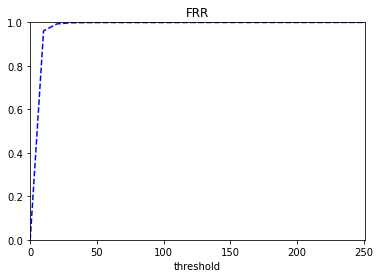

'\nfor i  in range(len(frr)):\n        a = frr[i]\n        b = far[i]\n        temp.append(abs(a-b))\nprint("EER(Equal Error Rate) is:",temp.index(min(temp)))\nprint("Threshold Value:",threshold[temp.index(min(temp))])\n\n\nplt.plot(threshold,far,\'--r\')\nplt.xlabel(\'threshold\')\nplt.title(\'FAR\')\n\nplt.axis([0, 100, 0, 1450])\nplt.show()\nfig, ax = plt.subplots()\n\nax.plot(threshold, far, \'r--\', label=\'FAR\')\nax.plot(threshold, frr, \'g--\', label=\'FRR\')\nplt.xlabel(\'Threshold\')\n'

In [44]:
#FALSE REJECTION RATE In case of Aligning Windows
print((int)(max(corrHVHR)))
print((int)(min(corrHVHR)))
frrAhvhr = []
thresholdAhvhr = []
for i in range((int)(min(corrHVHR)),(int)(max(corrHVHR)),10):
        num = 0

        for x in corrHVHR:
                if x<i:
                        num+=1
        #print(i,num)
        frrAhvhr.append(num/len(corrHVHR))
        thresholdAhvhr.append(i)


temp=[]
frrAhvhr = np.array(frrAhvhr)
print('FRR: ',frrAhvhr)
print('-----------------------------------------------------------')
plt.plot(thresholdAhvhr,frrAhvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrHVHR)), (int)(max(corrHVHR)), 0, 1])
plt.show()
'''
for i  in range(len(frr)):
        a = frr[i]
        b = far[i]
        temp.append(abs(a-b))
print("EER(Equal Error Rate) is:",temp.index(min(temp)))
print("Threshold Value:",threshold[temp.index(min(temp))])


plt.plot(threshold,far,'--r')
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([0, 100, 0, 1450])
plt.show()
fig, ax = plt.subplots()

ax.plot(threshold, far, 'r--', label='FAR')
ax.plot(threshold, frr, 'g--', label='FRR')
plt.xlabel('Threshold')
'''


### ii)Correlation results for HRM_HR and Polar_HR

292
0
FRR:  [0.         0.95886003 0.98781889 0.99494369 0.99724201 0.99793151
 0.99885084 0.99908067 0.99954034 0.99954034 0.99954034 0.99954034
 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034
 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034
 0.99977017 0.99977017 0.99977017 0.99977017 0.99977017 0.99977017]
-----------------------------------------------------------


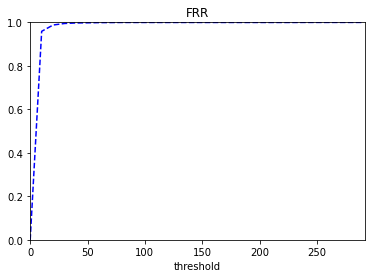

In [45]:
#FALSE REJECTION RATE In case of Aligning Windows
print((int)(max(corrHPHR)))
print((int)(min(corrHPHR)))
frrAhphr = []
thresholdAhphr = []
for i in range((int)(min(corrHPHR)),(int)(max(corrHPHR)),10):
        num = 0

        for x in corrHPHR:
                if x<i:
                        num+=1
        #print(i,num)
        frrAhphr.append(num/len(corrHPHR))
        thresholdAhphr.append(i)


temp=[]
frrAhphr = np.array(frrAhphr)
print('FRR: ',frrAhphr)
print('-----------------------------------------------------------')
plt.plot(thresholdAhphr,frrAhphr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrHPHR)), (int)(max(corrHPHR)), 0, 1])
plt.show()

### iii)Correlation results for Polar_HR and Vivo_HR

242
0
25
FRR:  [0.         0.94001379 0.98345208 0.99149621 0.99655252 0.99724201
 0.99839117 0.99885084 0.9993105  0.99954034 0.99954034 0.99954034
 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034 0.99954034
 0.99954034 0.99954034 0.99954034 0.99954034 0.99977017 0.99977017
 0.99977017]
-----------------------------------------------------------


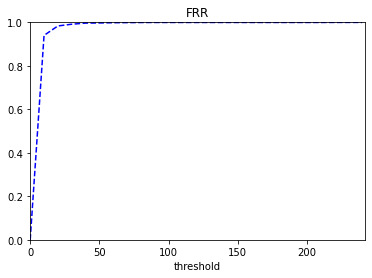

In [46]:
#FALSE REJECTION RATE In case of Aligning Windows
print((int)(max(corrPVHR)))
print((int)(min(corrPVHR)))
frrApvhr = []
thresholdApvhr = []
for i in range((int)(min(corrPVHR)),(int)(max(corrPVHR)),10):
        num = 0

        for x in corrPVHR:
                if x<i:
                        num+=1
        #print(i,num)
        frrApvhr.append(num/len(corrPVHR))
        thresholdApvhr.append(i)


temp=[]
frrApvhr = np.array(frrApvhr)
print(len(frrApvhr))
print('FRR: ',frrApvhr)
print('-----------------------------------------------------------')
plt.plot(thresholdApvhr,frrApvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrPVHR)), (int)(max(corrPVHR)), 0, 1])
plt.show()

## B)Thresholding for Corrrelation in case of Std.Dev of Respiratory Rates

### i)Correlation results for HRM_RR and Vivo_RR

In [47]:
print((int)(max(corrHVRR)))
print((int)(min(corrHVRR)))

124759
0


FRR:  [0.         0.14203631 0.26729487 ... 0.99977017 0.99977017 0.99977017]
-----------------------------------------------------------


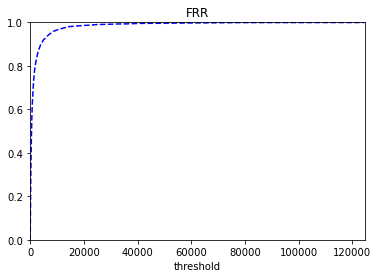

In [48]:
#FALSE REJECTION RATE In case of Aligning Windows

frr = []
threshold = []
for i in range((int)(min(corrHVRR)),(int)(max(corrHVRR)),100):
        num = 0

        for x in corrHVRR:
                if x<i:
                        num+=1
        #print(i,num)
        frr.append(num/len(corrHVRR))
        threshold.append(i)


temp=[]
frr = np.array(frr)
print('FRR: ',frr)
print('-----------------------------------------------------------')
plt.plot(threshold,frr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrHVRR)), (int)(max(corrHVRR)), 0, 1])
plt.show()

### ii)Correlation results for HRM_RR and Polar_RR

In [49]:
print((int)(max(corrHPRR)))
print((int)(min(corrHPRR)))

166021
0


FRR:  [0.         0.64789704 0.79407033 0.85382671 0.89220869 0.92024822
 0.93564698 0.94552976 0.95334406 0.96161802 0.96598483 0.96966215
 0.97379913 0.97632728 0.97724661 0.97977476 0.98092393 0.98230292
 0.98437141 0.98621007 0.9871294  0.98919789 0.98965755 0.99034705
 0.99057688 0.99126638 0.99172604 0.9921857  0.9921857  0.9921857
 0.99264537 0.99310503 0.99333487 0.99333487 0.99425419 0.99425419
 0.99471386 0.99517352 0.99517352 0.99540336 0.99586302 0.99609285
 0.99632268 0.99632268 0.99632268 0.99632268 0.99655252 0.99655252
 0.99701218 0.99701218 0.99701218 0.99701218 0.99701218 0.99701218
 0.99701218 0.99701218 0.99701218 0.99701218 0.99701218 0.99701218
 0.99724201 0.99724201 0.99747185 0.99770168 0.99770168 0.99770168
 0.99770168 0.99770168 0.99770168 0.99770168 0.99770168 0.99770168
 0.99770168 0.99770168 0.99770168 0.99770168 0.99770168 0.99816134
 0.99839117 0.99839117 0.99862101 0.99862101 0.99862101 0.99862101
 0.99885084 0.99885084 0.99885084 0.99885084 0.99885084 0

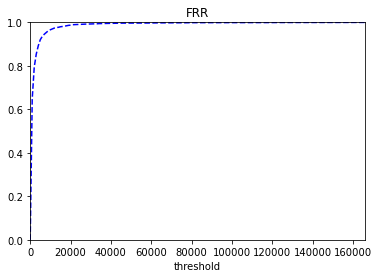

In [50]:
#FALSE REJECTION RATE In case of Aligning Windows

frr = []
threshold = []
for i in range((int)(min(corrHPRR)),(int)(max(corrHPRR)),1000):
        num = 0

        for x in corrHPRR:
                if x<i:
                        num+=1
        #print(i,num)
        frr.append(num/len(corrHPRR))
        threshold.append(i)


temp=[]
frr = np.array(frr)
print('FRR: ',frr)
print('-----------------------------------------------------------')
plt.plot(threshold,frr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrHPRR)), (int)(max(corrHPRR)), 0, 1])
plt.show()

### iii)Correlation results for Vivo_RR and Polar_RR

In [51]:
print((int)(max(corrPVRR)))
print((int)(min(corrPVRR)))

33323
0


FRR:  [0.         0.77016778 0.90737761 0.95311423 0.97104114 0.98161342
 0.98873822 0.99241554 0.99448403 0.99563319 0.99701218 0.99747185
 0.99793151 0.99816134 0.99862101 0.99862101 0.99862101 0.99885084
 0.99908067 0.99908067 0.99954034 0.99977017 0.99977017 0.99977017
 0.99977017 0.99977017 0.99977017 0.99977017 0.99977017 0.99977017
 0.99977017 0.99977017 0.99977017 0.99977017]
-----------------------------------------------------------


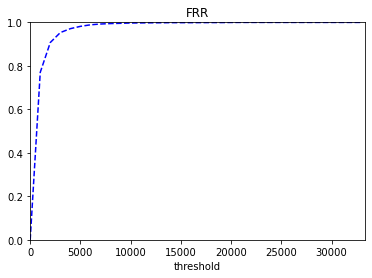

In [52]:

#FALSE REJECTION RATE In case of Aligning Windows

frrApvrr = []
thresholdApvrr = []
for i in range((int)(min(corrPVRR)),(int)(max(corrPVRR)),1000):
        num = 0

        for x in corrPVRR:
                if x<i:
                        num+=1
        #print(i,num)
        frrApvrr.append(num/len(corrPVRR))
        thresholdApvrr.append(i)


temp=[]
frrApvrr = np.array(frrApvrr)
print('FRR: ',frrApvrr)
print('-----------------------------------------------------------')
plt.plot(thresholdApvrr,frrApvrr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrPVRR)), (int)(max(corrPVRR)), 0, 1])
plt.show()

next

## C)Thresholding for Corrrelation in case of Mean of Respiratory Rates

### i)Thresholding on Correlation results for HRM_RR and Vivo_RR

In [53]:
print((int)(max(corrmeanHVRR)))
print((int)(min(corrmeanHVRR)))

7539144
127794


FRR:  [0.00000000e+00 9.19328890e-04 4.36681223e-03 7.12479890e-03
 9.19328890e-03 1.37899333e-02 1.76970811e-02 2.13743967e-02
 2.68903700e-02 3.21765111e-02 3.88416456e-02 5.03332567e-02
 6.25143645e-02 7.19374856e-02 8.29694323e-02 1.00896346e-01
 1.25488393e-01 1.48471616e-01 1.64559871e-01 1.82486785e-01
 1.98804872e-01 2.19949437e-01 2.37186854e-01 2.56952425e-01
 2.79246150e-01 2.95794070e-01 3.18547460e-01 3.41071018e-01
 3.62675247e-01 3.86577798e-01 4.15076994e-01 4.41967364e-01
 4.69087566e-01 4.95977936e-01 5.22178809e-01 5.45851528e-01
 5.68834751e-01 5.95265456e-01 6.20087336e-01 6.41461733e-01
 6.64444955e-01 6.83291197e-01 7.03286601e-01 7.19145024e-01
 7.37991266e-01 7.48333716e-01 7.61434153e-01 7.69937945e-01
 7.77062744e-01 7.85106872e-01 7.91082510e-01 7.99356470e-01
 8.04872443e-01 8.08549759e-01 8.12686739e-01 8.16823719e-01
 8.22569524e-01 8.27396001e-01 8.34520800e-01 8.40036773e-01
 8.46012411e-01 8.51298552e-01 8.56814525e-01 8.62560331e-01
 8.67386808e-01 8.

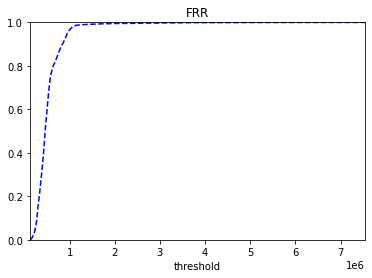

In [54]:

frr = []
threshold = []
for i in range((int)(min(corrmeanHVRR)),(int)(max(corrmeanHVRR)),10000):
        num = 0

        for x in corrmeanHVRR:
                if x<i:
                        num+=1
        #print(i,num)
        frr.append(num/len(corrmeanHVRR))
        threshold.append(i)


temp=[]
frr = np.array(frr)
print('FRR: ',frr)
print('-----------------------------------------------------------')
plt.plot(threshold,frr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrmeanHVRR)), (int)(max(corrmeanHVRR)), 0, 1])
plt.show()

### ii)Thresholding on Correlation results for HRM_RR and Polar_RR

In [55]:
print((int)(max(corrmeanHPRR)))
print((int)(min(corrmeanHPRR)))

6128518
130321


FRR:  [0.         0.00252815 0.00528614 0.00919329 0.01746725 0.02344289
 0.02895886 0.0335555  0.04182946 0.04803493 0.05470007 0.06159504
 0.07147782 0.08388876 0.09767869 0.11376695 0.13284302 0.15283843
 0.17145484 0.18892209 0.20248219 0.22454608 0.24270283 0.26683521
 0.28935877 0.31303149 0.33900253 0.36244541 0.38726729 0.41208917
 0.43966904 0.46839807 0.49138129 0.51298552 0.53321076 0.55941163
 0.5798667  0.59940244 0.61824868 0.64421972 0.66582395 0.68696851
 0.70305677 0.72121351 0.73339462 0.74787405 0.76097449 0.77062744
 0.78051023 0.78832452 0.79682832 0.80257412 0.80877959 0.81429556
 0.81935187 0.82279936 0.82762583 0.83107332 0.83681912 0.84141577
 0.8487704  0.85267755 0.85842335 0.86210067 0.86830614 0.87313261
 0.87818892 0.88140657 0.88554355 0.89059986 0.89450701 0.89979315
 0.90209147 0.90691795 0.9101356  0.91450241 0.92047805 0.92829235
 0.93219949 0.93748564 0.94254194 0.94529993 0.94943691 0.95288439
 0.95633188 0.95977936 0.96368651 0.96667433 0.96897265 

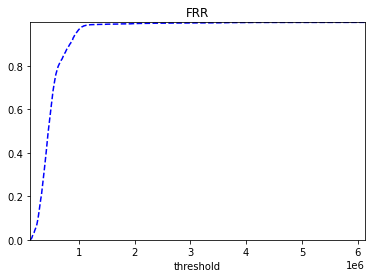

In [56]:
frr = []
threshold = []
for i in range((int)(min(corrmeanHPRR)),(int)(max(corrmeanHPRR)),10000):
        num = 0

        for x in corrmeanHPRR:
                if x<i:
                        num+=1
        #print(i,num)
        frr.append(num/len(corrmeanHPRR))
        threshold.append(i)


temp=[]
frr = np.array(frr)
print('FRR: ',frr)
print('-----------------------------------------------------------')
plt.plot(threshold,frr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrmeanHPRR)), (int)(max(corrmeanHPRR)), 0, max(frr)])
plt.show()

### iii)Thresholding on Correlation results for Polar_RR and Vivo_RR

In [57]:
print((int)(max(corrmeanPVRR)))
print((int)(min(corrmeanPVRR)))

1417952
127794


FRR:  [0.         0.00137899 0.00528614 0.0071248  0.00965295 0.01401977
 0.02390255 0.03263618 0.04182946 0.05883705 0.07469547 0.09032406
 0.10962997 0.12319007 0.1447943  0.16938635 0.19489772 0.2204091
 0.24063434 0.25580326 0.27051253 0.28935877 0.30636635 0.32659159
 0.34681682 0.36635256 0.38473914 0.40565387 0.42702827 0.44886233
 0.4757527  0.50126408 0.52585613 0.55573431 0.57963687 0.6005516
 0.62100667 0.64146173 0.66237647 0.68398069 0.70742358 0.72351184
 0.73960009 0.75499885 0.77131694 0.78464721 0.79475983 0.80211446
 0.81015858 0.81659389 0.82142036 0.82693634 0.83061365 0.83544013
 0.83773845 0.8416456  0.84647208 0.85014939 0.8552057  0.86118134
 0.86600781 0.87129396 0.87612043 0.88186624 0.88784188 0.89243852
 0.89703516 0.90048265 0.90278097 0.90783728 0.91266376 0.91565157
 0.91863939 0.92231671 0.92783268 0.92967134 0.93610664 0.94024362
 0.94667892 0.95242473 0.95656171 0.95908986 0.96276718 0.96621466
 0.96874282 0.97104114 0.97494829 0.97747644 0.97885544 0.

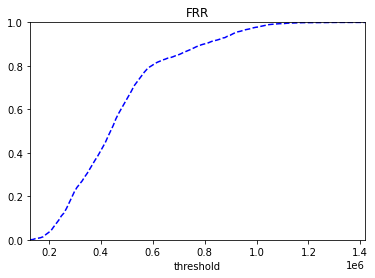

In [58]:
frr = []
threshold = []
for i in range((int)(min(corrmeanPVRR)),(int)(max(corrmeanPVRR)),10000):
        num = 0

        for x in corrmeanPVRR:
                if x<i:
                        num+=1
        #print(i,num)
        frr.append(num/len(corrmeanPVRR))
        threshold.append(i)


temp=[]
frr = np.array(frr)
print('FRR: ',frr)
print('-----------------------------------------------------------')
plt.plot(threshold,frr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrmeanPVRR)), (int)(max(corrmeanPVRR)), 0, 1])
plt.show()

## D)Thresholding for Corrrelation in case of Mean of Heart Rates

### i)Thresholding on Correlation results for Polar_HR and Vivo_HR

In [59]:
print((int)(max(corrmeanPVHR)))
print((int)(min(corrmeanPVHR)))

28050
2989


FRR on Correlation Results of Mean Feature of Polar_HR and Vivo_HR  [0.00000000e+00 0.00000000e+00 0.00000000e+00 2.29832222e-04
 5.95265456e-02 1.41806481e-01 1.96046886e-01 3.29809239e-01
 4.70006895e-01 5.92967134e-01 6.73178580e-01 7.29947139e-01
 7.77292576e-01 8.26246840e-01 8.66927143e-01 8.93817513e-01
 9.19328890e-01 9.41852448e-01 9.60468858e-01 9.73339462e-01
 9.85290738e-01 9.89427718e-01 9.91726040e-01 9.93105033e-01
 9.94254194e-01 9.97012181e-01 9.98621007e-01 9.99310503e-01
 9.99770168e-01]
-----------------------------------------------------------


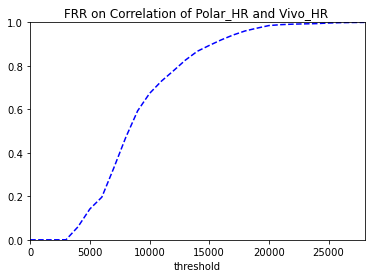

In [96]:
frrAmeanpvhr = []
thresholdAmeanpvhr = []
for i in range(0,(int)(max(corrmeanPVHR)),1000):
        num = 0

        for x in corrmeanPVHR:
                if x<i:
                        num+=1
        #print(i,num)
        frrAmeanpvhr.append(num/len(corrmeanPVHR))
        thresholdAmeanpvhr.append(i)


temp=[]
frrAmeanpvhr = np.array(frrAmeanpvhr)
print('FRR on Correlation Results of Mean Feature of Polar_HR and Vivo_HR ',frrAmeanpvhr)
print('-----------------------------------------------------------')
plt.plot(thresholdAmeanpvhr,frrAmeanpvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR on Correlation of Polar_HR and Vivo_HR ')

plt.axis([0, (int)(max(corrmeanPVHR)), 0, 1])
plt.show()

### ii)Thresholding on Correlation results for HRM_HR and Vivo_HR

In [61]:
print((int)(max(corrmeanHVHR)))
print((int)(min(corrmeanHVHR)))

28050
2842


FRR:  [0.00000000e+00 0.00000000e+00 0.00000000e+00 6.89496667e-04
 6.22845323e-02 1.42955642e-01 1.94667892e-01 3.25672259e-01
 4.67708573e-01 5.89749483e-01 6.77545392e-01 7.25120662e-01
 7.72925764e-01 8.33831303e-01 8.72443117e-01 9.02551138e-01
 9.31969662e-01 9.53803723e-01 9.69432314e-01 9.76097449e-01
 9.86669731e-01 9.90117214e-01 9.91726040e-01 9.93105033e-01
 9.94713859e-01 9.97012181e-01 9.98850839e-01 9.99310503e-01
 9.99770168e-01]
-----------------------------------------------------------


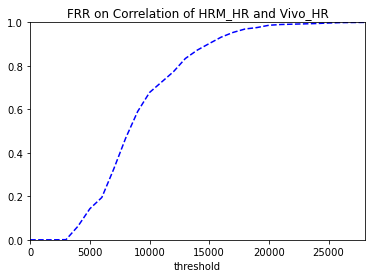

In [98]:
frrAmeanhvhr = []
thresholdAmeanhvhr = []
for i in range(0,(int)(max(corrmeanHVHR)),1000):
        num = 0

        for x in corrmeanHVHR:
                if x<i:
                        num+=1
        #print(i,num)
        frrAmeanhvhr.append(num/len(corrmeanHVHR))
        thresholdAmeanhvhr.append(i)


temp=[]
frrAmeanhvhr = np.array(frrAmeanhvhr)
print('FRR: ',frrAmeanhvhr)
print('-----------------------------------------------------------')
plt.plot(thresholdAmeanhvhr,frrAmeanhvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR on Correlation of HRM_HR and Vivo_HR')
plt.axis([0, (int)(max(corrmeanHVHR)), 0, 1])
plt.show()

### iii)Thresholding on Correlation results for Polar_HR and HRM_HR

In [63]:
print((int)(max(corrmeanHPHR)))
print((int)(min(corrmeanHPHR)))

27225
3306


FRR:  [0.         0.         0.         0.         0.05538957 0.13720984
 0.18777293 0.32659159 0.45736612 0.57527005 0.66582395 0.72374167
 0.77913123 0.83934728 0.87818892 0.90002298 0.9250747  0.9450701
 0.95771087 0.96782349 0.97701678 0.98276258 0.98942772 0.9928752
 0.99448403 0.99563319 0.99747185 0.9993105 ]
-----------------------------------------------------------


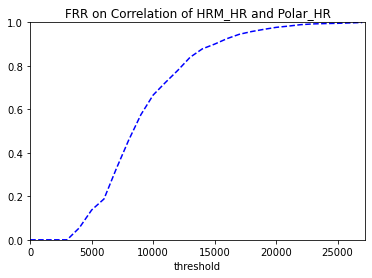

In [99]:
frrAmeanhphr = []
thresholdAmeanhphr = []
for i in range(0,(int)(max(corrmeanHPHR)),1000):
        num = 0

        for x in corrmeanHPHR:
                if x<i:
                        num+=1
        #print(i,num)
        frrAmeanhphr.append(num/len(corrmeanHPHR))
        thresholdAmeanhphr.append(i)


temp=[]
frrAmeanhphr = np.array(frrAmeanhphr)
print('FRR: ',frrAmeanhphr)
print('-----------------------------------------------------------')
plt.plot(thresholdAmeanhphr,frrAmeanhphr,'--b')
plt.xlabel('threshold')
plt.title('FRR on Correlation of HRM_HR and Polar_HR')
plt.axis([0, (int)(max(corrmeanHPHR)), 0, 1])
plt.show()

In [65]:
t1=[1.0, 1.7320508075688772, 0.0, 7.211102550927978, 1.7320508075688772]
t2=[3.1622776601683795, 0.0, 3.7416573867739413, 2.449489742783178, 7.0710678118654755]
np.correlate(t1,t2)

array([33.07324811])

In [66]:
def corr(arraya,arrayb):
    temp1=[]
    temp2=[]
    for i in range (0,len(arraya)-len(window)+1,3):
        for j in range (i,i+len(window)):
            temp1.append(arraya[j])
            temp2.append(arrayb[j])
        print(temp1)
        print(temp2)
        print("Correlation for Window  from",i,"to",i+len(window)," is % s "% (np.correlate(temp1,temp2)))
        
        temp1=[]
        temp2=[]

## Correlating Features Function for Non-Aligning Windows of size 5 and 40% overlapping

In [67]:

def corrnonali(l1,l2,ans):
    t1=[]
    t2=[]
    for i in range(0,len(l1)):
        t1.append([l1[i]])
        t2.append([l2[i]])
#     print(t1)
#     print(t2)
    
    for i in range (0,len(t1)):
        for j in range(0,len(t2)):
            if(i!=j):
                ans.append(np.correlate(t1[i],t2[j]))
   
    


In [68]:
corrNAHVRR=[]    
corrnonali(stdHrr,stdVrr,corrNAHVRR)
corrNAHVRR=[i[0] for i in corrNAHVRR]
print(corrNAHVRR[0:5])

[6650.736801287509, 5523.699847022826, 2871.3515981154246, 4206.295282074239, 2797.0341435170217]


18926850
895788
0
FAR:  [18605835   865240   395954   218718   134006    88900    63069    46670
    35921    28323    22866    18650    15244    12689    10605     8838
     7417     6315     5426     4636     3955     3394     2885     2508
     2155     1876     1616     1424     1254     1090      954      831
      729      645      582      510      449      400      360      319
      283      251      218      193      171      157      142      124
      109       93       80       74       69       58       47       43
       42       40       36       30       27       26       25       23
       21       19       17       17       17       11       10        8
        7        6        6        6        5        4        3        3
        3        2        2        1        1        1        1        1
        1        1]
-----------------------------------------------------------


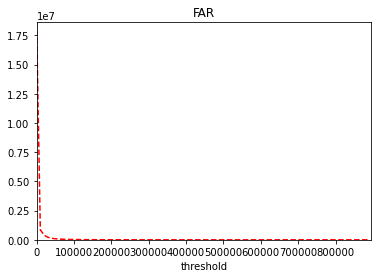

In [69]:
print(len(corrNAHVRR))
print((int)(max(corrNAHVRR)))
print((int)(min(corrNAHVRR)))
far = []
threshold = []
for i in range((int)(min(corrNAHVRR)),(int)(max(corrNAHVRR)),10000):
        num = 0

        for x in corrNAHVRR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        far.append(num)
        threshold.append(i)

far = np.array(far)

print('FAR: ',far)
print('-----------------------------------------------------------')
plt.plot(threshold,far,'--r')
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([(int)(min(corrNAHVRR)), (int)(max(corrNAHVRR)), 0, max(far)])
plt.show()

In [70]:
corrNAHPRR=[]    
corrnonali(stdHrr,stdPrr,corrNAHPRR)
corrNAHPRR=[i[0] for i in corrNAHPRR]
print(corrNAHPRR[0:5])
print(len(corrNAHPRR))
print((int)(max(corrNAHPRR)))
print((int)(min(corrNAHPRR)))

[1250.8716960583927, 1365.8623649548294, 9386.34753245372, 6798.399811720402, 2037.7487578207476]
18926850
10166154
0


FAR:  [18822584    30434     6953     2811     1530      922      645      485
      376      310      250      208      171      134      112       99
       89       69       57       51       50       46       43       40
       37       34       34       33       32       29       26       24
       21       21       19       18       17       17       16       15
       15       14       13       12       12       10        9        7
        7        6        6        6        6        6        5        5
        5        5        5        5        5        4        2        2
        2        2        2        2        2        2        2        2
        2        2        2        2        2        2        1        1
        1        1        1        1        1        1        1        1
        1        1        1        1        1        1        1        1
        1        1        1        1        1        1]
-----------------------------------------------------------


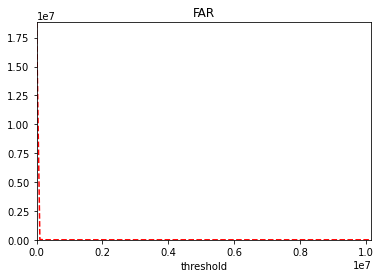

In [71]:
far = []
threshold = []
for i in range((int)(min(corrNAHPRR)),(int)(max(corrNAHPRR)),100000):
        num = 0

        for x in corrNAHPRR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        far.append(num)
        threshold.append(i)

far = np.array(far)

print('FAR: ',far)
print('-----------------------------------------------------------')
plt.plot(threshold,far,'--r')
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([(int)(min(corrNAHPRR)), (int)(max(corrNAHPRR)), 0, max(far)])
plt.show()

In [72]:
## Thresholding

In [73]:
corrNAPVRR=[]    
corrnonali(stdVrr,stdPrr,corrNAPVRR)
corrNAPVRR=[i[0] for i in corrNAPVRR]
print(corrNAPVRR[0:5])
print(len(corrNAPVRR))
print((int)(max(corrNAPVRR)))
print((int)(min(corrNAPVRR)))

[108.40664186294121, 118.37229405566151, 813.4666557394962, 589.182484464703, 176.6012457487206]
18926850
281178
0


In [74]:
'''
farNApvrr = []
threshold = []
for i in range((int)(min(corrNAPVRR)),(int)(max(corrNAPVRR)),1000):
        num = 0

        for x in corrNAPVRR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNApvrr.append(num/len(corrNAPVRR))
        threshold.append(i)

farNApvrr = np.array(farNApvrr)

print('FAR: ',farNApvrr)
print('-----------------------------------------------------------')
plt.plot(threshold,farNApvrr,'--r')
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([(int)(min(corrNAPVRR)), (int)(max(corrNAPVRR)), 0, 1])
plt.show()

plt.plot(thresholdApvrr,frrApvrr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrPVRR)), (int)(max(corrPVRR)), 0, max(frrApvrr)])
plt.show()
for i  in range(min(len(farNApvrr),len(frrApvrr))):
        a = farNApvrr[i]
        b = frrApvrr[i]
        temp.append(abs(a-b))
print("EER(Equal Error Rate) is:",temp.index(min(temp)))
print("Threshold Value:",threshold[temp.index(min(temp))])'''

'\nfarNApvrr = []\nthreshold = []\nfor i in range((int)(min(corrNAPVRR)),(int)(max(corrNAPVRR)),1000):\n        num = 0\n\n        for x in corrNAPVRR:\n                if x>i:\n                        \n                        num+=1\n        #print(i,num)\n        farNApvrr.append(num/len(corrNAPVRR))\n        threshold.append(i)\n\nfarNApvrr = np.array(farNApvrr)\n\nprint(\'FAR: \',farNApvrr)\nprint(\'-----------------------------------------------------------\')\nplt.plot(threshold,farNApvrr,\'--r\')\nplt.xlabel(\'threshold\')\nplt.title(\'FAR\')\n\nplt.axis([(int)(min(corrNAPVRR)), (int)(max(corrNAPVRR)), 0, 1])\nplt.show()\n\nplt.plot(thresholdApvrr,frrApvrr,\'--b\')\nplt.xlabel(\'threshold\')\nplt.title(\'FRR\')\nplt.axis([(int)(min(corrPVRR)), (int)(max(corrPVRR)), 0, max(frrApvrr)])\nplt.show()\nfor i  in range(min(len(farNApvrr),len(frrApvrr))):\n        a = farNApvrr[i]\n        b = frrApvrr[i]\n        temp.append(abs(a-b))\nprint("EER(Equal Error Rate) is:",temp.index(min(

In [75]:
corrNAPVHR=[]    
corrnonali(stdPhr,stdVhr,corrNAPVHR)
corrNAPVHR=[i[0] for i in corrNAPVHR]
print(corrNAPVHR[0:5])
print(len(corrNAPVHR))
print((int)(max(corrNAPVHR)))
print((int)(min(corrNAPVHR)))

[1.0, 0.0, 0.0, 0.0, 0.0]
18926850
299
0


FAR:  [3.57528960e-01 5.84893419e-02 1.48482711e-02 5.33184339e-03
 2.32621910e-03 1.14984797e-03 6.24668130e-04 3.60757337e-04
 2.26714958e-04 1.45190563e-04 9.64766984e-05 6.53568872e-05
 4.64419594e-05 3.28633661e-05 2.41455921e-05 1.74883829e-05
 1.26803985e-05 9.19328890e-06 7.29122913e-06 5.33633436e-06
 3.85695454e-06 2.74741967e-06 1.84922478e-06 1.16236986e-06
 8.98194892e-07 5.81184930e-07 3.69844956e-07 3.17009962e-07
 1.58504981e-07 5.28349937e-08]
-----------------------------------------------------------


'\n\nfor i  in range(min(len(farNApvhr),len(frrApvhr))):\n        a = farNApvhr[i]\n        b = frrApvhr[i]\n        temp.append(abs(a-b))\nprint("EER(Equal Error Rate) is:",temp.index(min(temp)))\nprint("Threshold Value:",threshold[temp.index(min(temp))])'

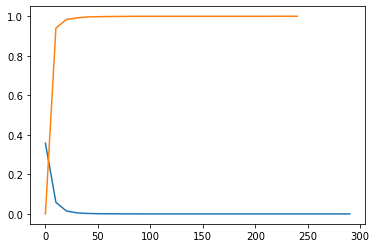

In [76]:
farNApvhr = []
threshold = []
for i in range((int)(min(corrNAPVHR)),(int)(max(corrNAPVHR)),10):
        num = 0

        for x in corrNAPVHR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNApvhr.append(num/len(corrNAPVHR))
        threshold.append(i)

farNApvhr = np.array(farNApvhr)
print('FAR: ',farNApvhr)
print('-----------------------------------------------------------')
plt.plot(threshold,farNApvhr)

plt.plot(thresholdApvhr,frrApvhr)

'''
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([(int)(min(corrNAPVHR)), (int)(max(corrNAPVHR)), 0, max(farNApvhr)])
plt.show()
plt.plot(thresholdApvhr,frrApvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrPVHR)), (int)(max(corrPVHR)), 0, max(frrApvhr)])
plt.show()
'''

'''

for i  in range(min(len(farNApvhr),len(frrApvhr))):
        a = farNApvhr[i]
        b = frrApvhr[i]
        temp.append(abs(a-b))
print("EER(Equal Error Rate) is:",temp.index(min(temp)))
print("Threshold Value:",threshold[temp.index(min(temp))])'''

In [77]:
!pip install Shapely
from shapely.geometry import LineString

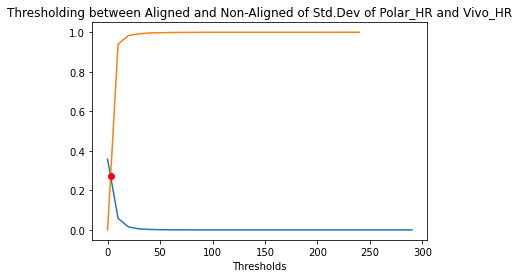

Point of Equal Error Rate: array('d', [2.8855008008484617]) array('d', [0.27124105436612755])


In [78]:
plt.title('Thresholding between Aligned and Non-Aligned of Std.Dev of Polar_HR and Vivo_HR')
plt.xlabel('Thresholds')
plt.plot(threshold,farNApvhr)

plt.plot(thresholdApvhr,frrApvhr)

first_line = LineString(np.column_stack((threshold,farNApvhr)))
second_line = LineString(np.column_stack((thresholdApvhr,frrApvhr)))
intersection = first_line.intersection(second_line)

if intersection.geom_type == 'MultiPoint':
    plt.plot(*LineString(intersection).xy, 'o')
elif intersection.geom_type == 'Point':
    plt.plot(*intersection.xy, 'ro')
plt.show()
x, y = intersection.xy
print("Point of Equal Error Rate:",x,y)

In [79]:
corrNAHVHR=[]    
corrnonali(stdHrmhr,stdVhr,corrNAHVHR)
corrNAHVHR=[i[0] for i in corrNAHVHR]
print(corrNAHVHR[0:5])
print(len(corrNAHVHR))
print((int)(max(corrNAHVHR)))
print((int)(min(corrNAHVHR)))

[6.4031242374328485, 0.0, 0.0, 0.0, 0.0]
18926850
477
0


### Thresholding of FRR of HRM and Vivo HR with FAR of HRM and Vivo HR (Non-Aligned)

FAR:  [3.41773671e-01 7.70726243e-02 2.81577759e-02 1.36597479e-02
 7.58905999e-03 4.56853623e-03 2.92336020e-03 1.91690641e-03
 1.30623955e-03 9.06437151e-04 6.39039248e-04 4.60351300e-04
 3.35713550e-04 2.49539675e-04 1.88937937e-04 1.44662213e-04
 1.13648071e-04 8.85514494e-05 6.99535316e-05 5.58994233e-05
 4.49097446e-05 3.62976407e-05 2.97989364e-05 2.38285821e-05
 1.90734327e-05 1.55334881e-05 1.25218935e-05 1.05669987e-05
 8.82344394e-06 7.34406412e-06 5.86468430e-06 5.12499439e-06
 4.01545952e-06 3.22293461e-06 2.58891469e-06 2.11339975e-06
 1.47937982e-06 1.21520485e-06 1.05669987e-06 8.45359899e-07
 6.34019924e-07 5.28349937e-07 4.75514943e-07 3.17009962e-07
 2.64174968e-07 1.58504981e-07 5.28349937e-08 5.28349937e-08]
-----------------------------------------------------------


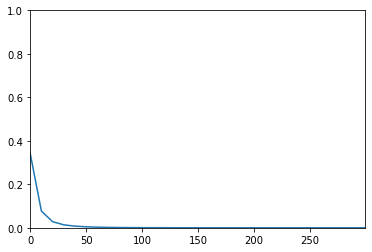

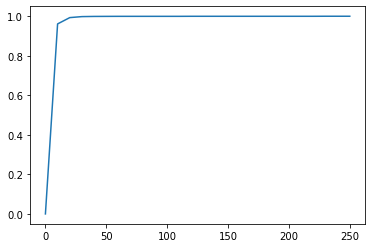

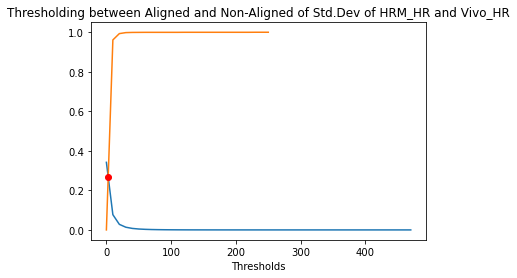

Point of Equal Error Rate: array('d', [2.7885560164375978]) array('d', [0.26796030118882086])


In [80]:
farNAhvhr = []
threshold = []
for i in range((int)(min(corrNAHVHR)),(int)(max(corrNAHVHR)),10):
        num = 0

        for x in corrNAHVHR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNAhvhr.append(num/len(corrNAHVHR))
        threshold.append(i)

farNAhvhr = np.array(farNAhvhr)

print('FAR: ',farNAhvhr)
print('-----------------------------------------------------------')

plt.plot(threshold,farNAhvhr)
plt.axis([(int)(min(corrNAPVHR)), (int)(max(corrNAPVHR)), 0, 1])
plt.show()
plt.plot(thresholdAhvhr,frrAhvhr)
plt.show()
'''
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([(int)(min(corrNAPVHR)), (int)(max(corrNAPVHR)), 0, max(farNApvhr)])
plt.show()
plt.plot(thresholdApvhr,frrApvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrPVHR)), (int)(max(corrPVHR)), 0, max(frrApvhr)])
plt.show()
'''

'''

for i  in range(min(len(farNApvhr),len(frrApvhr))):
        a = farNApvhr[i]
        b = frrApvhr[i]
        temp.append(abs(a-b))
print("EER(Equal Error Rate) is:",temp.index(min(temp)))
print("Threshold Value:",threshold[temp.index(min(temp))])'''
plt.title('Thresholding between Aligned and Non-Aligned of Std.Dev of HRM_HR and Vivo_HR')
plt.xlabel('Thresholds')
plt.plot(threshold,farNAhvhr)

plt.plot(thresholdAhvhr,frrAhvhr)

first_line = LineString(np.column_stack((threshold,farNAhvhr)))
second_line = LineString(np.column_stack((thresholdAhvhr,frrAhvhr)))
intersection = first_line.intersection(second_line)

if intersection.geom_type == 'MultiPoint':
    plt.plot(*LineString(intersection).xy, 'o')
elif intersection.geom_type == 'Point':
    plt.plot(*intersection.xy, 'ro')
plt.show()
x, y = intersection.xy
print("Point of Equal Error Rate:",x,y)


In [81]:
corrNAHPHR=[]    
corrnonali(stdHrmhr,stdPhr,corrNAHPHR)
corrNAHPHR=[i[0] for i in corrNAHPHR]
print(corrNAHPHR[0:5])
print(len(corrNAHPHR))
print((int)(max(corrNAHPHR)))
print((int)(min(corrNAHPHR)))

[11.090536506409416, 0.0, 46.173585522460776, 11.090536506409416, 19.209372712298546]
18926850
449
0


### Thresholding of FRR of Polar and Vivo HR with FAR of Polar and Vivo HR (Non-Aligned)

FAR:  [2.01153494e-01 1.88945863e-02 4.89975881e-03 1.86227502e-03
 8.50484893e-04 4.49889971e-04 2.59578324e-04 1.59033331e-04
 1.03133908e-04 6.70476070e-05 4.77628343e-05 3.45540859e-05
 2.38814171e-05 1.64845180e-05 1.24690585e-05 9.56313385e-06
 7.60823909e-06 5.97035429e-06 4.70231444e-06 3.75128455e-06
 2.80025466e-06 2.16623474e-06 1.69071980e-06 1.37370984e-06
 1.10953487e-06 9.51029886e-07 8.45359899e-07 6.34019924e-07
 5.28349937e-07 5.28349937e-07 3.69844956e-07 3.17009962e-07
 2.64174968e-07 2.11339975e-07 2.11339975e-07 2.11339975e-07
 2.11339975e-07 2.11339975e-07 1.58504981e-07 1.58504981e-07
 1.58504981e-07 1.05669987e-07 5.28349937e-08 5.28349937e-08
 5.28349937e-08]
-----------------------------------------------------------


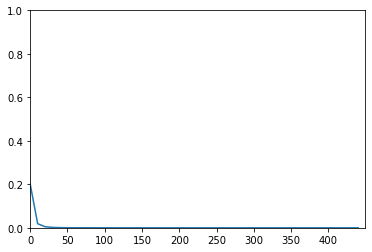

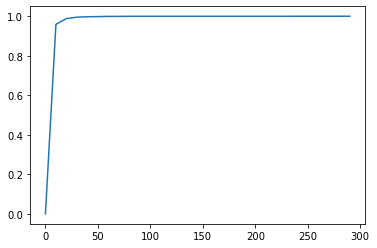

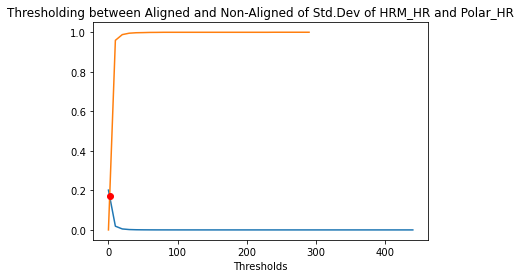

Point of Equal Error Rate: array('d', [1.7627741212560344]) array('d', [0.1690253650627482])


In [82]:
farNAhphr = []
threshold = []
for i in range((int)(min(corrNAHPHR)),(int)(max(corrNAHPHR)),10):
        num = 0

        for x in corrNAHPHR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNAhphr.append(num/len(corrNAHPHR))
        threshold.append(i)

farNAhphr = np.array(farNAhphr)

print('FAR: ',farNAhphr)
print('-----------------------------------------------------------')
plt.plot(threshold,farNAhphr)
plt.axis([(int)(min(corrNAHPHR)), (int)(max(corrNAHPHR)), 0, 1])
plt.show()
plt.plot(thresholdAhphr,frrAhphr)
plt.show()
'''
plt.xlabel('threshold')
plt.title('FAR')

plt.axis([(int)(min(corrNAPVHR)), (int)(max(corrNAPVHR)), 0, max(farNApvhr)])
plt.show()
plt.plot(thresholdApvhr,frrApvhr,'--b')
plt.xlabel('threshold')
plt.title('FRR')
plt.axis([(int)(min(corrPVHR)), (int)(max(corrPVHR)), 0, max(frrApvhr)])
plt.show()
'''

'''

for i  in range(min(len(farNApvhr),len(frrApvhr))):
        a = farNApvhr[i]
        b = frrApvhr[i]
        temp.append(abs(a-b))
print("EER(Equal Error Rate) is:",temp.index(min(temp)))
print("Threshold Value:",threshold[temp.index(min(temp))])'''
plt.title('Thresholding between Aligned and Non-Aligned of Std.Dev of HRM_HR and Polar_HR')
plt.xlabel('Thresholds')
plt.plot(threshold,farNAhphr)

plt.plot(thresholdAhphr,frrAhphr)

first_line = LineString(np.column_stack((threshold,farNAhphr)))
second_line = LineString(np.column_stack((thresholdAhphr,frrAhphr)))
intersection = first_line.intersection(second_line)

if intersection.geom_type == 'MultiPoint':
    plt.plot(*LineString(intersection).xy, 'o')
elif intersection.geom_type == 'Point':
    plt.plot(*intersection.xy, 'ro')
plt.show()
x, y = intersection.xy
print("Point of Equal Error Rate:",x,y)

In [83]:
corrmeanNAHVHR=[]
corrnonali(meanVhr,meanHhr,corrmeanNAHVHR)
corrmeanNAHVHR=[i[0] for i in corrmeanNAHVHR]
print(corrmeanNAHVHR[0:5])
print(len(corrmeanNAHVHR))
print((int)(max(corrmeanNAHVHR)))
print((int)(min(corrmeanNAHVHR)))

[16764, 16896, 17424, 16632, 16500]
18926850
28050
2793


## Thresholding of Mean of HeartRates
## 1.HRM_HR and Vivo_HR

In [84]:
farNAmeanhvhr = []
threshold = []
for i in range(0,(int)(max(corrmeanNAHVHR)),1000):
        num = 0

        for x in corrmeanNAHVHR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNAmeanhvhr.append(num/len(corrmeanNAHVHR))
        threshold.append(i)

farNAmeanhvhr = np.array(farNAmeanhvhr)

print('FAR: ',farNAmeanhvhr)
print('-----------------------------------------------------------')


FAR:  [1.00000000e+00 1.00000000e+00 1.00000000e+00 9.99981930e-01
 9.91294114e-01 9.52225067e-01 8.50041079e-01 7.14636667e-01
 5.52259409e-01 4.04245239e-01 2.81382428e-01 1.89904554e-01
 1.24352864e-01 7.92876258e-02 5.02912001e-02 3.08095114e-02
 1.86704074e-02 1.13384953e-02 6.64664220e-03 3.73443019e-03
 2.10700671e-03 1.13859411e-03 6.14048296e-04 2.84410771e-04
 1.28230530e-04 5.79071531e-05 1.97074526e-05 4.12112951e-06
 5.28349937e-08]
-----------------------------------------------------------


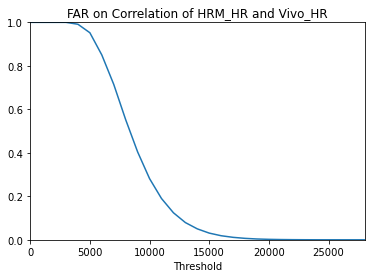

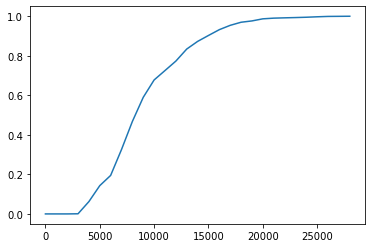

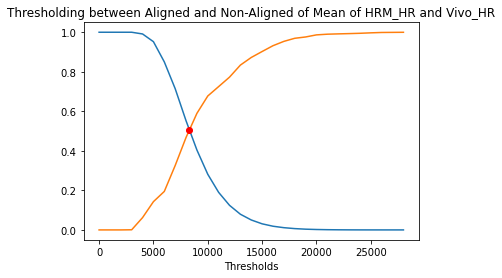

Point of Equal Error Rate: array('d', [8313.087375951129]) array('d', [0.5059180410549413])


In [100]:
plt.title('FAR on Correlation of HRM_HR and Vivo_HR')
plt.plot(threshold,farNAmeanhvhr)
plt.axis([0, (int)(max(corrmeanNAHVHR)), 0, 1])
plt.xlabel('Threshold')
plt.show()
plt.plot(thresholdAmeanhvhr,frrAmeanhvhr)
plt.show()

plt.title('Thresholding between Aligned and Non-Aligned of Mean of HRM_HR and Vivo_HR')
plt.xlabel('Thresholds')
plt.plot(threshold,farNAmeanhvhr)

plt.plot(thresholdAmeanhvhr,frrAmeanhvhr)

first_line = LineString(np.column_stack((threshold,farNAmeanhvhr)))
second_line = LineString(np.column_stack((thresholdAmeanhvhr,frrAmeanhvhr)))
intersection = first_line.intersection(second_line)

if intersection.geom_type == 'MultiPoint':
    plt.plot(*LineString(intersection).xy, 'o')
elif intersection.geom_type == 'Point':
    plt.plot(*intersection.xy, 'ro')
plt.show()
x, y = intersection.xy
print("Point of Equal Error Rate:",x,y)

## 2.HRM_HR and Polar_HR

In [107]:
corrmeanNAHPHR=[]
corrnonali(meanPhr,meanHhr,corrmeanNAHPHR)
corrmeanNAHPHR=[i[0] for i in corrmeanNAHPHR]
print(corrmeanNAHPHR[0:5])
print(len(corrmeanNAHPHR))
print((int)(max(corrmeanNAHPHR)))
print((int)(min(corrmeanNAHPHR)))

[16764, 16896, 17424, 16632, 16500]
18926850
27225
3306


In [108]:
farNAmeanhphr = []
threshold = []
for i in range(0,(int)(max(corrmeanNAHPHR)),1000):
        num = 0

        for x in corrmeanNAHPHR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNAmeanhphr.append(num/len(corrmeanNAHPHR))
        threshold.append(i)

farNAmeanhphr = np.array(farNAmeanhphr)

print('FAR: ',farNAmeanhvhr)
print('-----------------------------------------------------------')

FAR:  [1.00000000e+00 1.00000000e+00 1.00000000e+00 9.99981930e-01
 9.91294114e-01 9.52225067e-01 8.50041079e-01 7.14636667e-01
 5.52259409e-01 4.04245239e-01 2.81382428e-01 1.89904554e-01
 1.24352864e-01 7.92876258e-02 5.02912001e-02 3.08095114e-02
 1.86704074e-02 1.13384953e-02 6.64664220e-03 3.73443019e-03
 2.10700671e-03 1.13859411e-03 6.14048296e-04 2.84410771e-04
 1.28230530e-04 5.79071531e-05 1.97074526e-05 4.12112951e-06
 5.28349937e-08]
-----------------------------------------------------------


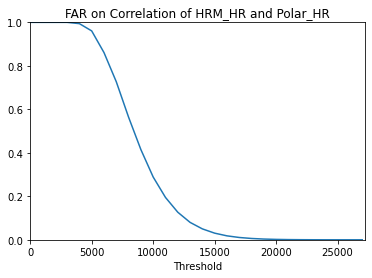

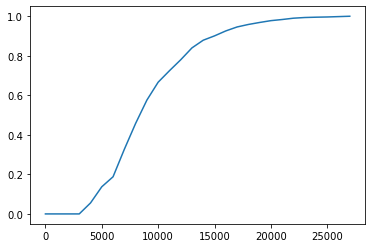

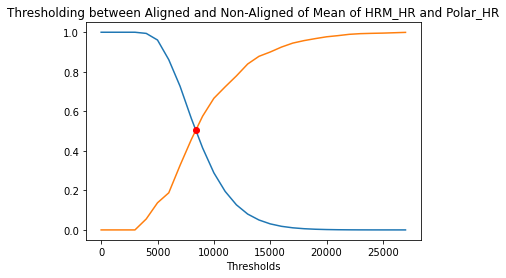

Point of Equal Error Rate: array('d', [8399.19402406052]) array('d', [0.5044326670519528])


In [109]:
plt.title('FAR on Correlation of HRM_HR and Polar_HR')
plt.plot(threshold,farNAmeanhphr)
plt.axis([0, (int)(max(corrmeanNAHPHR)), 0, 1])
plt.xlabel('Threshold')
plt.show()
plt.plot(thresholdAmeanhphr,frrAmeanhphr)
plt.show()

plt.title('Thresholding between Aligned and Non-Aligned of Mean of HRM_HR and Polar_HR')
plt.xlabel('Thresholds')
plt.plot(threshold,farNAmeanhphr)

plt.plot(thresholdAmeanhphr,frrAmeanhphr)

first_line = LineString(np.column_stack((threshold,farNAmeanhphr)))
second_line = LineString(np.column_stack((thresholdAmeanhphr,frrAmeanhphr)))
intersection = first_line.intersection(second_line)

if intersection.geom_type == 'MultiPoint':
    plt.plot(*LineString(intersection).xy, 'o')
elif intersection.geom_type == 'Point':
    plt.plot(*intersection.xy, 'ro')
plt.show()
x, y = intersection.xy
print("Point of Equal Error Rate:",x,y)

## 3.Vivo_HR and Polar_HR

In [110]:
corrmeanNAPVHR=[]
corrnonali(meanPhr,meanVhr,corrmeanNAPVHR)
corrmeanNAPVHR=[i[0] for i in corrmeanNAPVHR]
print(corrmeanNAPVHR[0:5])
print(len(corrmeanNAPVHR))
print((int)(max(corrmeanNAPVHR)))
print((int)(min(corrmeanNAPVHR)))

[17688, 17688, 17556, 17424, 17424]
18926850
28050
2842


In [111]:
farNAmeanpvhr = []
threshold = []
for i in range(0,(int)(max(corrmeanNAPVHR)),1000):
        num = 0

        for x in corrmeanNAPVHR:
                if x>i:
                        
                        num+=1
        #print(i,num)
        farNAmeanpvhr.append(num/len(corrmeanNAPVHR))
        threshold.append(i)

farNAmeanpvhr = np.array(farNAmeanpvhr)

print('FAR: ',farNAmeanpvhr)
print('-----------------------------------------------------------')

FAR:  [1.00000000e+00 1.00000000e+00 1.00000000e+00 9.99987637e-01
 9.91647580e-01 9.52919160e-01 8.50691848e-01 7.15010422e-01
 5.52491408e-01 4.04557177e-01 2.84908001e-01 1.94637988e-01
 1.28371916e-01 8.26370474e-02 5.28355220e-02 3.30643504e-02
 2.04663745e-02 1.26105506e-02 7.42754341e-03 4.28407263e-03
 2.45096252e-03 1.31226274e-03 6.68468340e-04 3.15689087e-04
 1.47515302e-04 6.55682271e-05 2.12925025e-05 4.64947944e-06
 1.05669987e-07]
-----------------------------------------------------------


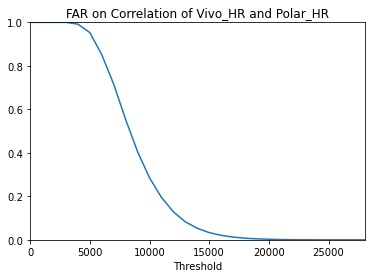

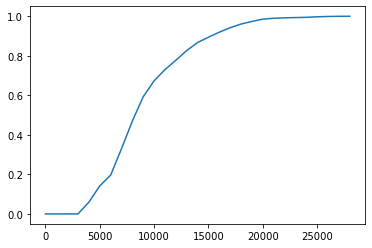

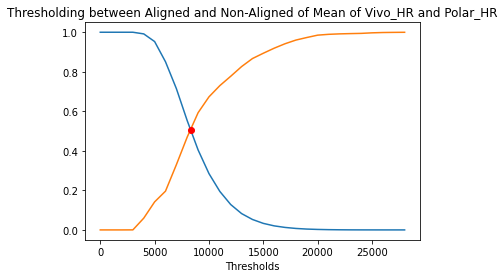

Point of Equal Error Rate: array('d', [8304.489466819863]) array('d', [0.5074469925875952])


In [112]:
plt.title('FAR on Correlation of Vivo_HR and Polar_HR')
plt.plot(threshold,farNAmeanpvhr)
plt.axis([0, (int)(max(corrmeanNAPVHR)), 0, 1])
plt.xlabel('Threshold')
plt.show()
plt.plot(thresholdAmeanpvhr,frrAmeanpvhr)
plt.show()

plt.title('Thresholding between Aligned and Non-Aligned of Mean of Vivo_HR and Polar_HR')
plt.xlabel('Thresholds')
plt.plot(threshold,farNAmeanpvhr)

plt.plot(thresholdAmeanpvhr,frrAmeanpvhr)

first_line = LineString(np.column_stack((threshold,farNAmeanpvhr)))
second_line = LineString(np.column_stack((thresholdAmeanpvhr,frrAmeanpvhr)))
intersection = first_line.intersection(second_line)

if intersection.geom_type == 'MultiPoint':
    plt.plot(*LineString(intersection).xy, 'o')
elif intersection.geom_type == 'Point':
    plt.plot(*intersection.xy, 'ro')
plt.show()
x, y = intersection.xy
print("Point of Equal Error Rate:",x,y)